# **Generative AI divide: Why do most countries lose their innovation edges?**

## **Objectives**

* To investigate how network position within the innovation space influences inventive advantage in generative AI patenting.
* To construct a generative AI innovation space—using semantic embeddings and patent metadata—and trace its temporal shifts to reveal emerging technological trajectories and actor positions.
* To identify the key technological, organizational, and geographical factors that confer sustainable competitive advantage in the generative AI field.

## **Problem Statement**

* Conventional patent‐metric analyses inadequately capture latent semantic relationships and collaboration structures in the rapidly evolving LLM domain.
* South Korea’s inventive output, though significant, risks marginalization within larger national clusters.
* A hybrid embedding‐network approach is needed to (i) surface nuanced positional insights and (ii) reveal collaboration dynamics that traditional counts or citation tallies overlook.
* Technically, representing long patent texts in vector space is constrained by the model’s maximum token limit.

## **Methodology**

### Vector Embedding & Patent Classification
* Embed each patent’s title, abstract, and claims using a Sentence‑BERT model (for example, PatentBERTa)
* Train a balanced‑weight logistic regression (with an optional MLP) on those embeddings.
* Evaluate performance with accuracy, F1 score, classification reports, and confusion matrices.

### Dimensionality Reduction (2D) & Invention Space
* Reduce patent embeddings to two dimensions using t‑SNE 
* Produce fixed‑axis scatterplots that show global patent distributions in space alongside highlighted Korean core versus peripheral patents.

### Co‑Inventor Network Analysis
* Extract inventors from LLM‑related patents (Generative AI)
* Construct an undirected weighted graph where edges reflect co‑filing frequency
* Select the top 1000 inventors by weighted degree
* Visualize the network with country‑coded nodes and edge thickness proportional to collaboration intensity.

# **1. Install packages**

## **1-(1) Install packages**

In [1]:
# Cell 1-(1a): Colab Shortcuts
#  노트북 주요 단축키
#  Ctrl + S           : 노트북 저장
#  Ctrl + Enter       : 현재 셀 실행
#  Ctrl + Shift+Enter : 선택한 코드만 실행
#  Ctrl + F9          : 모든 셀 한꺼번에 실행
#  Ctrl + F8          : 현재 셀 포함 위쪽 셀 전체 실행
#  Ctrl + F10         : 현재 셀 포함 아래쪽 셀 전체 실행
#  Ctrl + /           : 선택한 라인 주석 토글


In [2]:
# Cell 1-(1b): Install Required Packages
#  필수 패키지 설치(처음 한 번만 실행)
!pip install pandas numpy networkx matplotlib python-louvain pyvis \
              pycountry rapidfuzz adjustText tqdm linearmodels adjustText 


Defaulting to user installation because normal site-packages is not writeable


## **1-(2) Library Import**

In [3]:
# Cell 1-(2): Import Core Libraries
#  데이터 처리, 시각화, 네트워크 분석 등에 필요한 주요 라이브러리를 불러옵니다
import os, re, time, warnings           # 시스템·정규표현식·시간·경고 제어
import numpy as np                      # 배열 연산
import pandas as pd                     # 데이터프레임 처리
import matplotlib.pyplot as plt         # 기본 시각화
import seaborn as sns                   # 통계적 시각화
import networkx as nx                   # 네트워크 분석
import pycountry                        # ISO 국가코드 처리
from glob import glob                   # 파일 패턴 매칭
from sklearn.model_selection import train_test_split      # 학습-검증 분할
from sklearn.metrics.pairwise import cosine_similarity    # 코사인 유사도
from sklearn.manifold import TSNE                         # 차원 축소(T-SNE)
from adjustText import adjust_text                        # 라벨 겹침 방지
from itertools import combinations                        # 조합 생성
import statsmodels.api as sm                              # 통계 모델

In [4]:
# Cell 1-(2)a: Set Multiprocessing Start Method
#  Colab 호환성을 위해 멀티프로세싱 시작 방식을 spawn 으로 설정합니다
import multiprocessing as mp
mp.set_start_method('spawn', force=True)  # spawn 방식 강제 적용

In [5]:
# Cell 1-(2)b: Patch ResourceTracker Bug
#  멀티프로세싱 시 발생할 수 있는 ResourceTracker 오류를 무시하도록 패치합니다
from multiprocessing.resource_tracker import ResourceTracker
_original_unregister = ResourceTracker.unregister  # 원본 함수 보관
def _safe_unregister(*args, **kwargs):
    try:
        return _original_unregister(*args, **kwargs)
    except ChildProcessError:            # 이미 해제된 리소스 오류 무시
        return
ResourceTracker.unregister = _safe_unregister       # 패치 적용

In [6]:
# Cell 1-(2)c: Install PyTorch Locally
#  사용자 환경(–user)에 PyTorch 패키지를 설치합니다(런타임 재시작 불필요)
import sys
!{sys.executable} -m pip install --user torch torchvision torchaudio

In [7]:
# Cell 1-(2)d: Suppress Warnings
warnings.filterwarnings('ignore')

# **2. Data Preparation**

## **2-(1)  List and filter CSV files**

## **2-(1a) Google Colab 환경**

In [8]:
# # Cell 2-(1a) Mount Google Drive (to read/write files)
# from google.colab import drive
# drive.mount('/content/drive')  # mounts your Drive at /content/drive
# 2. Set the data directory path
# base_dir = '/content/drive/MyDrive/data1'  # path where the CSV files are stored

## **2-(1b) 윈도우 Jupyter Notebook 환경**

In [9]:
# Cell 2-(1b) List and Filter CSV Files
#  지정된 폴더에서 접두어(prefix)가 일치하는 CSV 파일 목록을 생성합니다
base_dir = 'E:/data1'  # base_dir: path to the data folder
#base_dir = '/Users/deep1003/Downloads'  # base_dir: path to the data folder
prefixes = ('1', '3', '4', '7',  '8')                                 
# prefixes = ('9')       
all_csv   = glob(os.path.join(base_dir, '*.csv'))      # 폴더 내 모든 CSV 경로 수집
csv_files = [f for f in all_csv if os.path.basename(f).startswith(prefixes)]

## **2-(2) Load CSV Files and Remove Duplicates**

In [10]:
# Cell 2-(2): Load CSV Files and Remove Duplicates
#  여러 CSV 파일을 읽어 하나의 DataFrame으로 통합하고 완전 중복 행을 제거합니다
df_list = []                                           # 개별 CSV 데이터프레임을 담을 리스트
for f in csv_files:
    for enc in ('utf-8', 'cp949', 'latin1'):           # 시도할 인코딩 목록
        try:
            df = pd.read_csv(f, encoding=enc)          # CSV 읽기
            print(f'{os.path.basename(f)} (encoding={enc}) 로딩 완료')
            df_list.append(df)
            break                                      # 성공 시 다음 파일로 이동
        except Exception:
            continue                                   # 실패 시 다른 인코딩 시도
combined_df = (                                        # DataFrame 통합 및 완전 중복 제거
    pd.concat(df_list, ignore_index=True)
      .drop_duplicates()
)
print(f'병합 후 총 행 수: {len(combined_df)}')

10.Instance-based learning.csv (encoding=cp949) 로딩 완료
14.Multi-task learning.csv (encoding=cp949) 로딩 완료
15.Neural networks (11).csv (encoding=cp949) 로딩 완료
15.Neural networks (12).csv (encoding=cp949) 로딩 완료
15.Neural networks (13).csv (encoding=cp949) 로딩 완료
15.Neural networks (14).csv (encoding=cp949) 로딩 완료
15.Neural networks (15).csv (encoding=cp949) 로딩 완료
15.Neural networks (16).csv (encoding=cp949) 로딩 완료
15.Neural networks (17).csv (encoding=cp949) 로딩 완료
15.Neural networks (18).csv (encoding=cp949) 로딩 완료
15.Neural networks (19).csv (encoding=cp949) 로딩 완료
15.Neural networks (20).csv (encoding=cp949) 로딩 완료
15.Neural networks (21).csv (encoding=cp949) 로딩 완료
15.Neural networks (22).csv (encoding=cp949) 로딩 완료
15.Neural networks (23).csv (encoding=cp949) 로딩 완료
15.Neural networks (24).csv (encoding=cp949) 로딩 완료
15.Neural networks (25).csv (encoding=cp949) 로딩 완료
15.Neural networks (26).csv (encoding=cp949) 로딩 완료
15.Neural networks (27).csv (encoding=cp949) 로딩 완료
15.Neural networks (28).csv (

## **2-(3) Column Name Mapping (Korean → English)**

In [11]:
# Cell 2-(3): Column name mapping (Korean → English)
import pandas as pd  # Use pandas for DataFrame operations

# 1) Apply column mapping to combined_df
orig = combined_df.columns.tolist()  # List of original column names

# List of new English column names with bilingual comments for each
new = [
    "PTO_id",                 # 국가코드 (Country code)
    "PTO_type",               # DB종류 (Database type)
    "patent_kind",            # 특허/실용 구분 (Patent vs utility model)
    "pub_type_code",          # 문헌종류 코드 (Publication type code)
    "title",                  # 발명의 명칭 (Invention title)
    "title_en",               # 발명의 명칭-번역문 (Invention title – translation)
    "abstract",               # 요약 (Abstract)
    "abstract_en",            # 요약-번역문 (Abstract – translation)
    "claim_main",             # 대표청구항 (Main claim)
    "claim_main_en",          # 대표청구항-번역문 (Main claim – translation)
    "claims_indep",           # 독립청구항[KR,JP,US,CN,EP,IN] (Independent claims [KR, JP, US, CN, EP, IN])
    "claims_indep_en",        # 독립청구항-번역문[JP,US,CN,EP] (Independent claims – translation [JP, US, CN, EP])
    "num_claims",             # 청구항 수 (Number of claims)
    "appl_id",                # 출원번호 (Application number)
    "appl_date",              # 출원일 (Application date)
    "pub_id",                 # 공개번호 (Publication number)
    "pub_date",               # 공개일 (Publication date)
    "grant_id",               # 등록번호 (Grant number)
    "grant_date",             # 등록일 (Grant date)
    "applicant",              # 출원인 (Applicant)
    "inventor",               # 발명자 (Inventor)
    "citations_count",        # 인용 문헌 수(B1) (Citations count (B1))
    "citation_ids",           # 인용 문헌번호(B1) (Citation IDs (B1))
    "cited_by_count",         # 피인용 문헌 수(F1) (Cited-by count (F1))
    "cited_by_ids",           # 피인용 문헌번호(F1) (Cited-by IDs (F1))
    "wips_family_id",         # WIPS패밀리 ID (WIPS family ID)
    "wips_family_pub_ids",    # WIPS패밀리 문헌번호(출원기준) (WIPS family publication IDs)
    "wips_family_pub_count",  # WIPS패밀리 문헌 수(출원기준) (WIPS family publication count)
    "status_info",            # 상태정보[KR,JP,US,EP,CN,CA,AU] (Status info [KR, JP, US, EP, CN, CA, AU])
    "current_owner",          # 현재권리자[KR,JP,US,CN,CA,AU] (Current owner [KR, JP, US, CN, CA, AU])
    "num_applicants",         # 출원인 수 (Number of applicants)
    "applicant_nat",          # 출원인 국적 (Applicant nationality)
    "applicant_main_code",    # 출원인 대표명화 코드 (Applicant main name code)
    "applicant_main_name_en", # 출원인 대표명화 영문명 (Applicant main name – English)
    "inventor_nat",           # 발명자 국적 (Inventor nationality)
    "num_inventors",          # 발명자 수 (Number of inventors)
    "cpc_main",               # Current CPC Main
    "cpc_all",                # Current CPC All
    "ipc_main",               # Current IPC Main
    "ipc_all",                # Current IPC All
    "orig_cpc_main",          # Original CPC Main
    "orig_cpc_all",           # Original CPC All
    "orig_ipc_main",          # Original IPC Main
    "orig_ipc_all",           # Original IPC All
    "wintelips_key"           # Wintelips key
]

# Verify that the number of original and new column names match
assert len(orig) == len(new), "Mismatch in number of columns"

# Apply the new column names
combined_df.columns = new

# 2) Sort combined_df by 'inventor_nat' in descending order and reset index
if 'inventor_nat' in combined_df.columns:
    combined_df = (
        combined_df
        .sort_values(by='inventor_nat', ascending=False)
        .reset_index(drop=True)
    )
else:
    combined_df = combined_df.copy()

## **2-(4) Parse Dates and Filter Year**

In [12]:
# Cell 2-(4): Parse application dates and extract year
from dateutil import parser          # 날짜 파싱 라이브러리

# 1) 문자열 날짜를 datetime 으로 변환하는 파서 함수
def parse_date(x):
    try:
        return parser.parse(x, dayfirst=True)  # 다양한 포맷 허용
    except Exception:
        return pd.NaT                          # 변환 실패 시 NaT 반환

# 2) 출원일 컬럼(appl_date) 파싱 → appl_date_parsed
combined_df['appl_date_parsed'] = (
    combined_df['appl_date']
      .astype(str)               # 문자열 변환
      .str.strip()               # 좌우 공백 제거
      .map(parse_date)           # 파서 적용
)

# 3) 연도(year) 컬럼 생성
combined_df['year'] = combined_df['appl_date_parsed'].dt.year

# 4) 연도 정보가 없는 행 제거
combined_df = combined_df.dropna(subset=['year']).copy()

# 5) 분석 범위(2000‒2023년)에 해당하는 행만 남기기
combined_df = combined_df[
    (combined_df['year'] >= 2000) &
    (combined_df['year'] <= 2023)
].copy()

# 6) 인덱스 재설정
combined_df.reset_index(drop=True, inplace=True)


## **2-(5) Generate country_code, invs, and nats_raw**

In [13]:
# Cell 2-(5): Generate country_code, invs, and nats_raw
import numpy as np, re

# 1) country_code: applicant_nat 앞 2글자(대문자)
combined_df['country_code'] = (
    combined_df['applicant_nat']
      .fillna('')
      .astype(str)
      .str[:2]
      .str.upper()
)

# 2) invs: 발명자(inventor) 문자열을 '|' 기준으로 분할 후 공백 제거
combined_df['invs'] = (
    combined_df['inventor']
      .fillna('')
      .astype(str)
      .str.split('|')
      .apply(lambda lst: [s.strip() for s in lst if s.strip()])
)

# 3) nats_raw: inventor_nat 내 2-문자 국가코드 패턴 추출
combined_df['nats_raw'] = (
    combined_df['inventor_nat']
      .fillna('')
      .astype(str)
      .str.findall(r'[A-Za-z]{2}')
      .apply(lambda lst: [s.upper() for s in lst])
)


## **2-(6) Define the align_nats function**

In [14]:
# Cell 2-(6): Define align_nats function
def align_nats(inv_list, nat_list, cc):
    """
    발명자 수(inv_list 길이)와 국적 리스트(nat_list) 길이를 맞추는 보정 함수.
    • nat_list 비어 있으면 country_code로 채움
    • nat_list 길이가 부족하면 country_code로 패딩
    • nat_list 길이가 길면 잘라서 맞춤
    """
    inv_len = len(inv_list)
    v = list(nat_list)

    if len(v) == 0:                # (a) 비어 있으면 모두 cc
        v = [cc] * inv_len
    elif len(v) < inv_len:         # (b) 부족하면 cc로 패딩
        v += [cc] * (inv_len - len(v))
    elif len(v) > inv_len:         # (c) 길면 자르기
        v = v[:inv_len]
    return v


## **2-(7) Create 'nats' list for each row**

In [15]:
# Cell 2-(7): Create 'nats' list with alignment logic
combined_df['nats'] = combined_df.apply(
    lambda row: align_nats(row['invs'], row['nats_raw'], row['country_code']),
    axis=1
)


In [16]:
combined_df[combined_df['appl_id'] == '16/021971']

,PTO_id,PTO_type,patent_kind,pub_type_code,title,title_en,abstract,abstract_en,claim_main,claim_main_en,...,orig_cpc_all,orig_ipc_main,orig_ipc_all,wintelips_key,appl_date_parsed,year,country_code,invs,nats_raw,nats
43189,US,US,P,B2,Attention-based sequence transduction neural n...,주의력 기반 시퀀스 변환 신경망,"Methods, systems, and apparatus, including com...","방법, 시스템, 입력 시퀀스로부터 출력 시퀀스를 생성하기 위해, 컴퓨터 저장 매체 ...",1. A system comprising one or more computers a...,"1. 하나 이상의 컴퓨터 및 상기 하나 이상의 컴퓨터에 의해 실행된 경우, 입력 순...",...,G06N-0003/08 | G06N-0003/04 | G06N-0003/0454,G06F-015/18,G06F-015/18 | G06N-003/08 | G06N-003/04,4.919043e+12,2018-06-28,2018.0,US,"[Noam M. Shazeer, Aidan Nicholas Gomez, Luka...","[US, CA, US, US, US, US, US, US]","[US, CA, US, US, US, US, US, US]"


In [17]:
combined_df[combined_df['appl_id'] == '16/417587']

,PTO_id,PTO_type,patent_kind,pub_type_code,title,title_en,abstract,abstract_en,claim_main,claim_main_en,...,orig_cpc_all,orig_ipc_main,orig_ipc_all,wintelips_key,appl_date_parsed,year,country_code,invs,nats_raw,nats
61835,US,US,P,B2,Universal transformers,범용 변압기,"Methods, systems, and apparatus, including com...","방법, 시스템, 시퀀스의 다른 부분으로부터 정보를 결합하기 위해 셀프 주의를 사용하...",1. A system implemented by one or more compute...,"1. 하나 이상의 컴퓨터에 의해 구현된 시스템, 상기 시스템은 다음을 포함한다: 각...",...,G06F-0017/14 | G06N-0003/04,G06F-017/00,G06F-017/00 | G06F-017/14 | G06N-003/04,4.920033e+12,2019-05-20,2019.0,US,"[Mostafa Dehghani, Stephan Gouws, Oriol Vin...","[NL, GB, GB, US, US]","[NL, GB, GB, US, US]"


In [18]:
combined_df[combined_df['appl_id'] == '18/183902']

,PTO_id,PTO_type,patent_kind,pub_type_code,title,title_en,abstract,abstract_en,claim_main,claim_main_en,...,orig_cpc_all,orig_ipc_main,orig_ipc_all,wintelips_key,appl_date_parsed,year,country_code,invs,nats_raw,nats


# **3. Create Exploded DataFrame**

## **3-(1) Generate exploded data (df_expl)**

In [19]:
# Cell 3-(1): Generate exploded DataFrame (df_expl)
#  1) invs, nats 리스트를 개별 행으로 폭발(explode)하여 정규화
df_expl = (
    combined_df
      .explode(['invs', 'nats'])
      .rename(columns={'invs': 'inventor_pre', 'nats': 'inventor_nat_pre'})
)

# 2) inventor_nat: 빈값은 country_code로 대체
df_expl['inventor_nat'] = (
    df_expl['inventor_nat_pre']
      .replace('', np.nan)
      .fillna(df_expl['country_code'])
)

# 3) inventor: 현재 단계에서는 inventor_pre 그대로 사용
df_expl['inventor'] = df_expl['inventor_pre']

# 4) 임시 컬럼 제거
df_expl = df_expl.drop(columns=['inventor_pre', 'inventor_nat_pre'])


## **3-(2): Normalize inventor names**

In [20]:
# Cell 3-(2): Normalize inventor names (uppercase, punctuation cleanup)
# 1) 정규화 전 값 보존
df_expl['inventor_pre'] = df_expl['inventor']

# 2) 정규화 함수 정의
def normalize_name(x: str) -> str:
    if not isinstance(x, str):
        return ''
    s = re.sub(r'[.,]', '', x)          # 마침표/쉼표 제거
    s = re.sub(r'\s+', ' ', s).strip()  # 다중 공백 정리
    return s.upper()                    # 대문자 변환

# 3) inventor 컬럼에 정규화 적용
df_expl['inventor'] = df_expl['inventor_pre'].apply(normalize_name)


In [21]:
# Cell 3-(2)a: Row count sanity check
len(df_expl)   # 폭발 후 총 행 수 확인


1023095

## **3-(3): Split applicant information and explode**

In [22]:
# Cell 3-(3): Split applicant information and explode (use df_expl)
# 1) Backup original applicant and set main applicant column
df_expl.rename(
    columns={
        'applicant': 'applicant_pre',           # 기존 applicant → applicant_pre (backup original applicant)
        'applicant_main_name_en': 'applicant'   # applicant_main_name_en → main applicant column
    },
    inplace=True
)
# Use applicant_pre to fill NaN in the new applicant column
df_expl['applicant'] = df_expl['applicant'].combine_first(df_expl['applicant_pre'])

# 1-1) Also replace empty strings with NA, then backfill
df_expl['applicant'] = df_expl['applicant'].replace('', pd.NA)
df_expl['applicant'] = df_expl['applicant'].combine_first(df_expl['applicant_pre'])

# 2) Resolve duplicate applicant_nat columns
df_expl.rename(columns=lambda c: c.strip(), inplace=True)  # Remove whitespace from column names
nat_cols = [c for c in df_expl.columns if c == 'applicant_nat']

if not nat_cols:
    # If no applicant_nat column exists
    df_expl['applicant_nat']     = df_expl.get('country_code', pd.NA)
    df_expl['applicant_nat_pre'] = df_expl['applicant_nat']
elif len(nat_cols) == 1:
    # If exactly one applicant_nat column
    df_expl['applicant_nat_pre'] = df_expl['applicant_nat']
else:
    # If multiple applicant_nat columns
    main, backup = nat_cols[:2]                               # First is main, second is backup
    df_expl['applicant_nat_pre'] = df_expl[backup]          # Backup values
    df_expl['applicant_nat']     = df_expl[main]            # Main values

# Backfill missing applicant_nat from country_code
if 'country_code' in df_expl:
    df_expl['applicant_nat'].fillna(df_expl['country_code'], inplace=True)


# 3) Define and apply split-and-clean function for '|' separated strings
def split_and_clean(s):
    if pd.isna(s):
        return []
    return [p.strip() for p in str(s).split('|') if p.strip()]

df_expl['app_names'] = df_expl['applicant'].apply(split_and_clean)
df_expl['app_nats']  = df_expl['applicant_nat'].apply(split_and_clean)

# 4) Define and apply padding function to match list lengths
def pad_list(lst, n, fill):
    if len(lst) >= n:
        return lst[:n]
    pad_val = lst[0] if lst else fill
    return lst + [pad_val] * (n - len(lst))

df_expl['app_nats'] = df_expl.apply(
    lambda r: pad_list(r['app_nats'], len(r['app_names']), r.get('country_code', 'UN')),
    axis=1
)

# 5) Explode lists and clean up column names
df_expl = (
    df_expl
      .drop(columns=['applicant'], errors='ignore')  # Remove old applicant column
      .explode(['app_names', 'app_nats'])            # Explode list columns into rows
      .rename(columns={'app_names': 'applicant',     # app_names → applicant
                       'app_nats': 'applicant_nat'}) # app_nats → applicant_nat
)

# 6) Normalize organization names (uppercase, remove punctuation, cleanup spaces)
def norm_org(x):
    s = re.sub(r'[.,]', '', str(x))     # Remove periods and commas
    s = re.sub(r'\s+', ' ', s)          # Collapse multiple spaces into one
    return s.upper().strip()            # Convert to uppercase and trim

df_expl['applicant'] = df_expl['applicant'].apply(norm_org)

# 7) Remove temporary and duplicate columns
df_expl.drop(columns=['applicant_pre'], errors='ignore', inplace=True)  # Remove backup column
df_expl = df_expl.loc[:, ~df_expl.columns.duplicated()]              # Drop duplicated columns 

## **3-(3) Deduplicate by appl_id, applicant, and inventor(df_expl)**

In [23]:
# Cell 3-(3)a: Row count before deduplication
#  중복 제거 전 df_expl 행 수 확인
len(df_expl)


1127542

In [24]:
# Cell 3-(3)b: Deduplicate by appl_id, applicant, inventor
#  (appl_id, applicant, inventor) 조합 기준 완전 중복 행 제거
df_expl = (
    df_expl
      .drop_duplicates(
          subset=['appl_id', 'applicant', 'inventor'],
          keep='first'
      )
      .reset_index(drop=True)
)

print(f"After deduplication rows: {len(df_expl):,}")


After deduplication rows: 1,116,650


In [25]:
# Cell 3-(3)c: Row count after deduplication
len(df_expl)


1116650

In [26]:
df_expl.loc[df_expl['appl_id'] == '16/021971', ['appl_id', 'PTO_id', 'applicant', 'title', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'title', 'abstract', 'claim_main', 'cpc_all']]

,appl_id,PTO_id,applicant,title,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,title,abstract,claim_main,cpc_all
178312,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,NOAM M SHAZEER,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...
178313,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,AIDAN NICHOLAS GOMEZ,CA,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...
178314,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,LUKASZ MIECZYSLAW KAISER,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...
178315,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,JAKOB D USZKOREIT,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...
178316,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,LLION OWEN JONES,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...
178317,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,NIKI J PARMAR,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...
178318,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,ILLIA POLOSUKHIN,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...
178319,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,ASHISH TEKU VASWANI,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...


## **3-(4) Generate new data (df_expl2)**

In [27]:
# Cell 3-(4): Generate df_expl2 (working copy)
#  추후 가공을 위해 df_expl 복사본(df_expl2) 생성
df_expl2 = df_expl.copy()


## **3-(5) Remove duplicates and NA**

In [28]:
# Cell 3-(5): Remove duplicates and NA (key columns)
#  ① 주요 키가 결측치인 행 제거
expl2_clean = df_expl2.dropna(subset=['appl_id', 'year', 'country_code'])

#  ② appl_id 기준 완전 중복 제거
expl2_clean = expl2_clean.drop_duplicates(subset=['appl_id'])

#  ③ 인덱스 재설정 후 원본 변수 교체
df_expl2 = expl2_clean.reset_index(drop=True)


In [29]:
# Cell 3-(5)a: Row count after cleaning df_expl2
len(df_expl2)


267519

In [30]:
df_expl2.loc[df_expl2['appl_id'] == '16/021971', ['appl_id', 'PTO_id', 'applicant', 'title', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'title', 'abstract', 'claim_main', 'cpc_all']]

,appl_id,PTO_id,applicant,title,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,title,abstract,claim_main,cpc_all
42509,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,NOAM M SHAZEER,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...


# **4. Descriptive Analysis**

## **4-(1) Patent by Patent Office (PTO)**

In [31]:
# Cell 4-(1): Patent Count by Year and PTO Type
#  연도-특허청 유형(PTO_type)별 특허 건수를 집계하고 CSV로 저장합니다
df_type = (
    df_expl2[['year', 'PTO_type', 'appl_id']]
      .drop_duplicates()                      # (year, PTO_type, appl_id) 중복 제거
)

patent_counts_by_type = (
    df_type
      .groupby(['year', 'PTO_type'])          # 연도·PTO_type 그룹화
      .size()
      .reset_index(name='patent_count')       # 건수 컬럼 생성
      .pivot(index='year', columns='PTO_type', values='patent_count')
      .fillna(0).astype(int)                  # NaN→0, int 변환
)

# 합계(Total) 행 추가
total_row = patent_counts_by_type.sum(axis=0)
total_row.name = 'Total'
patent_counts_by_type = pd.concat(
    [patent_counts_by_type, pd.DataFrame([total_row])]
)

# CSV 저장
out_path = os.path.join(base_dir, 'patent_by_PTO_type.csv')
patent_counts_by_type.to_csv(out_path, index=True)


## **4-(2) Patent by Country**

In [32]:
# Cell 4-(2): Patent Count by Year and Country Group
#  국가 그룹(EU 포함) 단위 연도별 특허 건수를 집계한 뒤 상위 10개만 추출합니다
df_country = df_expl2.copy()
df_country['country_code'] = (
    df_country['applicant_nat'].fillna('').astype(str).str[:2].str.upper()
)

EU_CODES = {
    "AT","BE","BG","HR","CY","CZ","DK","EE","FI","FR","DE","GR","HU","IE","IT",
    "LV","LT","LU","MT","NL","PL","PT","RO","SK","SI","ES","SE"
}
df_country['country_group'] = np.where(
    df_country['country_code'].isin(EU_CODES), 'EU', df_country['country_code']
)

# (year, country_group, appl_id) 중복 제거
df_country = df_country[['year', 'country_group', 'appl_id']].drop_duplicates()

patent_counts_by_country = (
    df_country
      .groupby(['year', 'country_group']).size()
      .reset_index(name='patent_count')
      .pivot(index='year', columns='country_group', values='patent_count')
      .fillna(0).astype(int)
)

# 합계(Total) 행 추가
total_row = patent_counts_by_country.sum(axis=0)
total_row.name = 'Total'
patent_counts_by_country = pd.concat(
    [patent_counts_by_country, pd.DataFrame([total_row], index=['Total'])]
)

# 상위 10개 국가 그룹 선택
total_series   = patent_counts_by_country.loc['Total']
top10_countries = (
    total_series[total_series.index.notna() & (total_series.index != '')]
      .sort_values(ascending=False)
      .head(10).index.tolist()
)
top10_df = patent_counts_by_country[top10_countries]

# CSV 저장
out_path_top10 = os.path.join(base_dir, 'top10_patent_counts_by_country_by_year.csv')
top10_df.to_csv(out_path_top10, index=True)


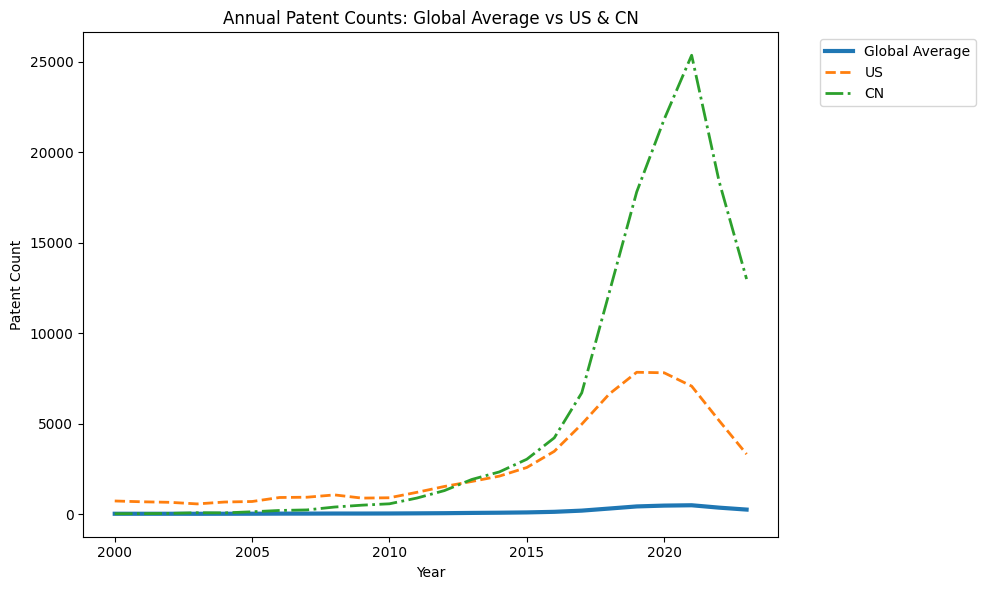

In [33]:
# Cell 4-(2)a: Plot Global Average vs US & CN
#  연도별 글로벌 평균 특허 건수를 그리고, 미국·중국과 비교해 시각화합니다
import matplotlib.pyplot as plt

annual_df  = patent_counts_by_country.drop(index='Total')  # Total 행 제외
global_avg = annual_df.mean(axis=1)                        # 전체 평균

us_counts  = annual_df['US'] if 'US' in annual_df.columns else None
cn_counts  = annual_df['CN'] if 'CN' in annual_df.columns else None

plt.figure(figsize=(10, 6))
plt.plot(global_avg.index, global_avg.values,
         linestyle='-',  linewidth=3, label='Global Average')  # 굵은 실선

if us_counts is not None:
    plt.plot(us_counts.index, us_counts.values,
             linestyle='--', linewidth=2, label='US')          # 점선

if cn_counts is not None:
    plt.plot(cn_counts.index, cn_counts.values,
             linestyle='-.', linewidth=2, label='CN')          # 대시-닷

plt.xlabel('Year')
plt.ylabel('Patent Count')
plt.title('Annual Patent Counts: Global Average vs US & CN')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [34]:
# Cell 3-(5)a: Row count after cleaning df_expl2
len(df_expl2)


267519

In [35]:
# Cell 4-(2)b: Display Top-10 Country Table
#  상위 10개 국가 그룹의 연도별 특허 건수를 확인합니다
top10_df


country_group,CN,US,KR,EU,JP,GB,TW,CA,IL,RU
2000.0,17,723,39,316,142,37,39,32,4,1
2001.0,24,678,51,315,157,21,39,19,6,4
2002.0,36,649,62,285,129,27,43,29,13,2
2003.0,73,561,55,243,114,30,57,25,5,2
2004.0,64,665,69,245,134,33,52,33,8,4
2005.0,126,694,93,261,166,33,46,48,12,31
2006.0,199,916,178,320,181,26,41,41,24,22
2007.0,229,931,177,326,191,51,47,44,19,23
2008.0,388,1059,188,399,164,33,61,36,18,36
2009.0,491,882,229,340,189,55,69,34,17,26


# **5. Fine Tuning PatentSBERT**

## **5-(1): Generate new data (df_expl3)**

In [36]:
# Cell 5-(1): Generate df_expl3 from df_expl2
#  df_expl2를 복사해 후속 임베딩·라벨링에 사용할 df_expl3 생성
df_expl3 = df_expl2.copy()


In [37]:
# Cell 3-(5)a: Row count after cleaning df_expl2
len(df_expl3)


267519

In [38]:
# Cell 5-(1)a: Inspect df_expl3 Shape
#  df_expl3의 행·열 크기를 확인합니다
df_expl3.shape


(267519, 50)

In [39]:
df_expl3.loc[df_expl3['appl_id'] == '16/021971', ['appl_id', 'PTO_id', 'applicant', 'title', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'title', 'abstract', 'claim_main', 'cpc_all']]

,appl_id,PTO_id,applicant,title,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,title,abstract,claim_main,cpc_all
42509,16/021971,US,GOOGLE INC,Attention-based sequence transduction neural n...,2018.0,US,G06N-0003/045,8.0,NOAM M SHAZEER,US,Attention-based sequence transduction neural n...,"Methods, systems, and apparatus, including com...",1. A system comprising one or more computers a...,G06N-0003/045 | G06N-0020/00 | G06N-0003/08 | ...


## **5-(1): Environment setup and compatible version installation**

In [40]:
# Cell 5-(1)b: Install / Upgrade PyTorch & Dependencies (CPU-only)
#  ── 목적: CUDA 없이(PyTorch CPU 전용) 설치 및 버전·가용성 점검
#  ── 입력: 없음(현재 커널 사용)
#  ── 출력: 설치 로그, torch 버전과 CUDA/MPS 가용성

import sys, subprocess, shutil

def _run(cmd_list):
    """명령을 실행하고 표준 출력·오류를 그대로 화면에 표시."""
    # ── Windows/Unix 모두 호환되는 방식으로 실행
    return subprocess.run(cmd_list, check=False)

def _pip(*args):
    """python -m pip 호출 래퍼."""
    return _run([sys.executable, "-m", "pip", *args])

# -----------------------------
# 0) pip 업그레이드
# -----------------------------
print("[setup] Upgrading pip …")
_pip("install", "--upgrade", "pip")

# -----------------------------
# 1) 기존 패키지 제거(있으면 제거, 없어도 통과)
# -----------------------------
to_uninstall = ["torch", "torchvision", "torchaudio", "fastai", "pillow"]
print("[setup] Uninstalling old packages if present …")
for pkg in to_uninstall:
    _pip("uninstall", "-y", pkg)

# -----------------------------
# 2) PyTorch CPU 전용 설치
#    ── 공식 CPU 전용 인덱스를 사용
# -----------------------------
print("[setup] Installing PyTorch (CPU-only) …")
_pip(
    "install",
    "torch",
    "torchvision",
    "torchaudio",
    "--extra-index-url",
    "https://download.pytorch.org/whl/cpu"
)

# -----------------------------
# 3) 기타 종속성 설치
# -----------------------------
print("[setup] Installing dependencies …")
_pip(
    "install",
    "sentence-transformers>=2.7.0",
    "scikit-learn",
    "pandas",
    "numpy",
    "fastai==2.7.19"
)

# -----------------------------
# 4) 버전 및 가용성 점검 출력
# -----------------------------
import torch, torchvision  # ── 설치 확인을 위해 임포트
print("torch version:", torch.__version__)
print("torchvision version:", getattr(torchvision, '__version__', 'unknown'))

# ── CUDA 가용성(일반 CPU 전용 설치에서는 False가 정상)
cuda_ok = False
try:
    cuda_ok = bool(torch.cuda.is_available())
except Exception:
    cuda_ok = False
print("CUDA available:", cuda_ok)

# ── Apple Silicon(MPS) 가용성(맥이 아니면 False가 정상)
mps_ok = False
try:
    mps_ok = hasattr(torch.backends, "mps") and torch.backends.mps.is_available()
except Exception:
    mps_ok = False
print("MPS (Apple Silicon) available:", mps_ok)


[setup] Upgrading pip …
[setup] Uninstalling old packages if present …
[setup] Installing PyTorch (CPU-only) …
[setup] Installing dependencies …
torch version: 2.6.0+cu124
torchvision version: 0.21.0+cu124
CUDA available: True
MPS (Apple Silicon) available: False


## **5‑(2): Library Import & Device Check**

In [41]:
# Cell 5-(2): Imports and Global Configuration
#  임베딩·학습에 필요한 라이브러리를 불러오고, 사용 디바이스를 설정합니다
import torch
import pandas as pd
import numpy as np

TEXT_COLS = ["title", "abstract", "claim_main"]   # 텍스트 결합 대상 컬럼
DEVICE    = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)


Device: cuda


In [42]:
# Cell 5-(2)a: Duplicate-ID Diagnostics
#  appl_id 중복 현황을 세 가지 방법으로 확인합니다
dup_count = df_expl3['appl_id'].duplicated().sum()
print(f"중복된 appl_id 행 수: {dup_count}")

vc = df_expl3['appl_id'].value_counts()           # appl_id별 빈도
dup_total = vc[vc > 1].sum()
print(f"중복된 appl_id 총 출현 수: {dup_total}")

unique_dup_ids = (vc > 1).sum()                   # 중복 appl_id 개수
print(f"중복된 고유 appl_id 개수: {unique_dup_ids}")


중복된 appl_id 행 수: 0
중복된 appl_id 총 출현 수: 0
중복된 고유 appl_id 개수: 0


## **5-(3): Generate 'tac_text' and Seed Labels (GenAI, LLM, Difussion, GAN, VAE, AR)**

### A.4 Patent searches
GenAI models:
**Generative AI total(GenAI)**
(TITLE_ABSTRACT_CLAIMS=(GENERATIVE* NEAR3 (AI OR ARTIFICIAL INTEL* OR ADVERSARIAL) OR GENERATIVE SEQ2 PRE_TRAINED NEAR3 (LANGUAGE SEQ2 MODEL OR TRANSFORMER?) OR CHAT_GPT OR VARIATIONAL SEQ2 AUTOENCODER? OR GENERATIVE SEQ2 ADVERSARIAL SEQ2 NETWORK* OR DIFFUSION SEQ2 PROBABILISTIC SEQ2 MODEL? OR AUTO_REGRESSIV* SEQ2 MODEL* ) OR (( IPC=(G06F 18/214, G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04, G06V 10/70, G10L 13, G16H 30/40, H04L 51/02) OR TAG=("ECONSIGHT TECHNOLOGY FIELDS\IC5.3.9. NEURAL NETWORKS & DEEP LEARNING") OR CPC=(G06F 18/214, G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04, G06T2207/20, G06V 10/70, G10L 13, G16H 30/40, H04L 51/02) ) AND ( TITLEABSTRACTCLAIMS=(GENERATIVE* NEAR3 (AI OR ARTIFICIAL INTEL* OR ADVERSARIAL) OR GENERATIVE SEQ2 PRE_TRAINED NEAR3 (LANGUAGE SEQ2 MODEL OR TRANSFORMER?) OR CHATGPT OR VARIATIONAL SEQ2 AUTOENCODER? OR CONVOLUTIONAL SEQ2 GENERATIVE SEQ2 ADVERSARIAL SEQ2 NETWORK* OR DIFFUSION SEQ2 PROBALISTIC* SEQ2 MODEL? OR DIFFUSIONAL SEQ2 NETWORK? OR DENOISING SEQ2 DIFFUSION SEQ2 PROBABILISTIC SEQ2 MODEL? OR GENERATIVE SEQ2 LATENT SEQ2 OPTIMIZATION OR NEURAL SEQ2 RADIANCE SEQ2 FIELD? OR AUTO_REGRESSIV* NEAR3 MODEL* OR GAN OR GANS OR GENAI OR VAE OR VAES OR (DENOISING OR VIDEO OR MODELS OR STABLE) NEAR3 DIFFUSION* SEQ2 MODEL* OR VARIATIONAL NEAR3 AUTOENCODER* OR GPT_3* OR GPT_4* ) OR ( TITLEABSTRACTCLAIMS=( ((IMAGE* OR TEXT* OR VIDEO* OR SPEECH* OR ("3D" MODEL*) OR GENE SEQ* OR DESIGN OR (PROGRAM* OR COMPUTER* OR SOFTWARE*) SEQ2 CODE* OR MUSIC* OR SPEECH* OR SCENE* OR MOLECULE* OR SYNTHETIC SEQ2 DATA* OR WORD SEQ3 SEQUENC*) NEAR5 (GENERATE* OR GENERATING* OR GENERATION* OR GENERATIV*)) OR GENERATIVE* NEAR3 MODEL*) AND ( TITLEABSTRACTCLAIMS=((TRANSFORMER* OR AUTOENCODER* OR LLM OR LARGE SEQ2 LANGUAGE SEQ2 MODEL* OR GAN OR GENERAT* SEQ2 ADVERSARIAL SEQ2 NETWORK* OR (AUTO_REGRESSIV* OR DIFFUSION SEQ2 PROBALISTIC) SEQ2 MODEL*)) OR TAG=("ECONSIGHT TECHNOLOGY FIELDS\C5.3.23. GAN, GENERATIVE ADVERSARIAL NETWORKS", "ECONSIGHT TECHNOLOGY FIELDS\IC5.3.27. AUTOREGRESSIV MODELS", "ECONSIGHT TECHNOLOGY FIELDS\IC5.3.28. VARIATIONAL AUTOENCODER,VAE", "ECONSIGHT TECHNOLOGY FIELDS\IC5.3.29. DIFFUSION MODELS", "ECONSIGHT TECHNOLOGY FIELDS\IC5.3.36. LARGE LANGUAGE MODELS,LLM") ))))) OR ( IPC=(G06N 3/0475) OR CPC=(G06N 3/0475))

**Generative adversarial networks(GAN)**
(TITLE_ABSTRACT_CLAIMS=(GENERATIVE NEAR5 ADVERSARIAL OR GAN OR (GENERATIVE SEQ2 ADVERSARIAL SEQ2 NETWORK*) OR (DUELING OR CONTRARIAN* OR ANTAGONISTIC OR ADVERSARIAL) NEAR3 (NEURAL SEQ2 NETWORK*)) ) AND ( FTERMSMART=(5L096/HA11) OR IPC=(G06N 3/02, G06V 10/70) OR CPC=(G06N 3/02, G06T2207, G06V 10/70))

**Variational autoencoder(VAE)**
(CPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04) OR IPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04) OR TAG=("ECONSIGHT TECHNOLOGY FIELDS\IC5.3.9. NEURAL NETWORKS & DEEP LEARNING") ) AND TITLE_ABSTRACT_CLAIMS=(VARIATIONAL NEAR5 AUTO_ENCODER* OR VAE )

**Autoregressive models(AR)**
(CPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04) OR IPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04) OR TAG=("ECONSIGHT TECHNOLOGY FIELDS\IC5.3.9. NEURAL NETWORKS & DEEP LEARNING") ) AND ITLE_ABSTRACT_CLAIMS=(((AUTO_REGRESSIV* OR AUTO_REGRESSION OR SELF_REGRESSIV* OR SELF_REGRESSION* OR RECURSIVE_REGRESSION* OR ITERATIVE FORECASTING) NEAR3 MODEL*))

**Large language models (LLM)**
(CPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04, G10L 15/183) OR IPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04, G10L 15/183) OR TAG=("ECONSIGHT TECHNOLOGY FIELDS\EC\5IC\IC5.3.9. NEURAL NETWORKS & DEEP LEARNING") ) AND TITLE_ABSTRACT_CLAIMS=(LARGE SEQ2 LANGUAGE SEQ2 MODEL* OR LLM OR LARGE LANGUAGE MODEL* OR (LARGE LANGUAGE MODEL* OR LLM OR LARGE NEAR3 (LANGUAGE SEQ2 MODEL*) OR ((EXTENSIVE* OR MASSIVE OR LARGE OR GIGANTIC OR IMMENSE OR COLLOSSAL) SEQ2 (LANGUAGE OR LINGUISTIC OR SPEECH OR VERBAL) SEQ2 (MODEL* )) OR SUBSTANTIAL LANGUAGE PROCESSOR* ))

**Diffusion models**
(CPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04) OR IPC=(G06F 40/20, G06F 40/284, G06F 40/40, G06N 3/02, G06N 3/08, G06N 20/00, G06Q 10/04) OR TAG=("ECONSIGHT TECHNOLOGY FIELDS\IC5.3.9. NEURAL NETWORKS & DEEP LEARNING") ) AND ITLE_ABSTRACT_CLAIMS=(DIFFUSION NEAR5 MODEL* OR PROBALISTIC NEAR3 MODEL* OR (STABLE* OR DENOISING) NEAR3 DIFFUSION* OR (DIFFUSION NEAR3 MODEL* OR (PROGAGATION OR DIFFUSION ) SEQ2 (STOCHASTIC* OR PROBALISTIC* OR PROBABILITY) SEQ2 MODEL* OR PROPAGATION SEQ2 STOCHASTIC SEQ2 MODEL* OR DISPERSION SEQ2 STOCHASTIC SEQ2 MODEL* OR SCORE_BASED SEQ2 GENERATIVE SEQ2 MODEL*))

Link: https://www.wipo.int/web-publications/patent-landscape-report-generative-artificial-intelligence-genai/en/appendices.html

In [43]:
# Cell 5-(3): Seed GenAI Labeller (Full Code)
#  title·abstract·claim_main을 결합해 'tac_text'를 만들고,
#  정규식 기반 키워드 매칭으로 seed_genai_label, seed_genai_type_label 등을 생성합니다
#  속도 최적화를 위해 벡터화된 매칭으로 교체했으며, 키워드/패턴을 2025 기준으로 보강했습니다
# ==============================================
import re  # 정규식
import numpy as np  # 벡터 연산
import pandas as pd  # 데이터프레임 처리

# ------------------------------------------------
# 0) Build tac_text: join title, abstract, claim_main  # 세 컬럼을 결합해 하나의 텍스트로 생성
# ------------------------------------------------
TEXT_COLS_TAC = ["title", "abstract", "claim_main"]

def combine_tac_text(row):  # 각 행의 텍스트를 공백 줄바꿈으로 결합
    return " \n ".join(
        row[c].strip()
        for c in TEXT_COLS_TAC
        if isinstance(row.get(c, ""), str) and row[c].strip()
    )

if "tac_text" not in df_expl3:  # 기존에 없을 때만 생성
    df_expl3["tac_text"] = df_expl3.apply(combine_tac_text, axis=1)

# ------------------------------------------------
# 1) CPC normalization: e.g., G06F0040/20 → G06F-0040/20  # CPC 코드를 표준 형태로 정규화
# ------------------------------------------------
# 형식: [Section(A-H)][2digits][Subclass Letter]-[4digits]/[1+digits]
_CPC_PAT = re.compile(r"^([A-H][0-9]{2}[A-Z])[-\s]?([0-9]{1,4}/[0-9]+)$", re.IGNORECASE)

def normalize_cpc(code):  # CPC 문자열을 표준 포맷으로 변환
    if not isinstance(code, str):
        return ""
    code = code.strip().upper().replace(" ", "")
    m = _CPC_PAT.match(code)
    if not m:
        return code
    head, tail = m.groups()
    main, sub = tail.split("/")
    return f"{head}-{main.zfill(4)}/{sub}"

if "cpc_main_norm" not in df_expl3:  # 없는 경우에만 계산
    df_expl3["cpc_main_norm"] = df_expl3["cpc_main"].astype(str).map(normalize_cpc)

# ------------------------------------------------
# 2) CPC code sets and helpers  # CPC 기반 히트 판정용 집합과 벡터화 헬퍼
# ------------------------------------------------
# 총괄 GenAI, 세부군(VAE/AR/DIFF), LLM, GAN, 필요 접두 포함
CPC_GENAI_TOTAL = {
    # 기존 항목
    "G06F-0018/214","G06F-0040/20","G06F-0040/284","G06F-0040/40",
    "G06N-0003/02","G06N-0003/08","G06N-0020/00","G06Q-0010/04",
    "G06V-0010/70","G10L-0013","G16H-0030/40","H04L-0051/02",
    "G06T2207/20","G06N-0003/0475",
    # 확장 접두, 자연어·대규모 모델 일반
    "G06F-0040/",   # NLP, 정보검색·텍스트분석 전반
    "G06N-0020/",   # 머신러닝 일반
    "G06N-0003/",   # 신경망 일반
}
CPC_VAE_AR_DIFF = {
    # 기존 + ML 일반 접두로 포괄
    "G06F-0040/20","G06F-0040/284","G06F-0040/40",
    "G06N-0003/02","G06N-0003/08","G06N-0020/00","G06Q-0010/04",
    "G06N-0020/","G06N-0003/"
}
CPC_LLM = {
    # LLM 포괄, NLP 중심 접두
    "G06F-0040/","G06N-0020/","G06N-0003/","G10L-0015/183"
}
CPC_GAN = {"G06N-0003/02","G06T2207/20","G06V-0010/70"}

def _cpc_match_series(cpc_series: pd.Series, code_set: set) -> pd.Series:
    """벡터화된 CPC 매칭, exact + 접두 둘 다 처리"""
    s = cpc_series.fillna("").astype(str)
    prefixes = tuple(code_set)  # set→tuple, startswith 다중 접두 지원
    return s.isin(code_set) | s.str.startswith(prefixes)

# ------------------------------------------------
# 3) Core FRAG patterns per technology  # 기술군별 핵심 정규식 패턴
# ------------------------------------------------
# Variational Autoencoder
FRAG_VAE = re.compile(
    r"(?:"
    r"variational(?:\W+\w+){0,3}autoencoder"
    r"|β-?VAE"
    r"|VAE\b"
    r"|Conditional(?:\W+)?VAE"
    r"|VQ-?VAE"
    r"|Ladder(?:\W+)?VAE"
    r"|InfoVAE"
    r")",
    re.IGNORECASE
)

# Autoregressive
FRAG_AR = re.compile(
    r"(?:"
    r"auto[-_\s]?regress(?:iv\w*|ion)"
    r"|autoregressive(?:\W+\w+){0,2}model"
    r"|next[-_\s]?token(?:\W+\w+){0,2}prediction"
    r")",
    re.IGNORECASE
)

# Diffusion
FRAG_DIFF = re.compile(
    r"(?:"
    r"diffusion(?:\W+\w+){0,2}(?:model|architecture|network)"
    r"|diffusion[-\s]?based(?:\W+\w+){0,2}model"
    r"|generative(?:\W+\w+){0,2}diffusion(?:\W+\w+){0,2}model"
    r"|denoising(?:\W+\w+){0,2}diffusion(?:\W+\w+){0,2}model?"
    r"|stable(?:\W+\w+){0,2}diffusion(?:\W+\w+){0,2}model?"
    r"|score[-_\s]?based\W+generative\W+model"
    r"|latent\W+diffusion\W+model"
    r"|SDE\b"
    r"|variance\W+(?:exploding|preserving)\W+SDE"
    r"|classifier[-_\s]?free\W+guidance"
    r"|DDPM\b|DDIM\b"
    r")",
    re.IGNORECASE
)

# LLM, with recent models and methods
FRAG_LLM = re.compile(r"""
    (?:
        large(?:\W+\w+){0,2}language(?:\W+\w+){0,2}model(?:s)?
      | \bLLMs?\b
      | foundation[-\s]?model(?:s)?
    )
  | (?:
        Chat[_\s]?GPT
      | GPT[-_\s]?(?:4o|4\.1|4|3(?:\.5)?)\b
      | Llama[-_\s]?(?:3(?:\.\d?)?|2)(?:\W*\d*B)?
      | Mistral\b|Mixtral\b
      | Phi[-_\s]?3\b
      | Falcon(?:\W*\d*B)?\b
      | Claude[-_\s]?(?:3|2|Opus|Sonnet|Haiku)\b
      | Gemini[-_\s]?(?:1\.5|Pro|Ultra)\b
      | PaLM(?:\W*2)?\b
      | Qwen\b|Yi\b|GLM\b|ERNIE\b
      | HyperCLOVA(?:\W*X)?\b
      | BLOOM\b|RWKV\b|T5\b|UL2\b
      | Luminous\b|Jurassic[-_\s]?2\b|Grok\b
    )
  | (?:
        instruction[-\s]?tuning
      | alignment\W+tuning
      | retrieval[-\s]?augmented(?:\W+\w+){0,2}generation
      | in[-\s]?context[-\s]?learning
      | chain[-\s]?of[-\s]?thought
      | few[-\s]?shot(?:\W+\w+){0,2}(?:learning|inference)
      | function[-\s]?calling|tool[-\s]?use
    )
  | (?:
        decoder[-\s]?only
      | transformer(?:\W+\w+){0,2}(?:model|architecture|network)
      | self[-\s]?attention|multi[-\s]?head[-\s]?attention
      | mixture[-\s]?of[-\s]?experts|MoE\b
      | flash[-\s]?attention
    )
""", re.IGNORECASE | re.VERBOSE)

# GAN
FRAG_GAN = re.compile(
    r"(?:"
    r"DCGAN|WGAN(?:-GP)?|LSGAN|BEGAN|EBGAN|InfoGAN|AC-?GAN|SAGAN|StyleGAN[23]?|BigGAN"
    r"|Pix2Pix|CycleGAN|DualGAN|DiscoGAN|SRGAN|ESRGAN|GANomaly|ProGAN|StackGAN"
    r"|Conditional(?:\W+)?GAN|cGAN\b"
    r"|Adversarial(?:\W+)?Autoencoder|AAE\b"
    r"|Minimax(?:\W+)?GAN"
    r"|GANs?\b"
    r"|adversarial(?:\W+\w+){0,2}(?:model|architecture|network)"
    r"|generative(?:\W+\w+){0,2}adversarial(?:\W+\w+){0,2}(?:model|network)"
    r")",
    re.IGNORECASE
)

# ------------------------------------------------
# 4) Global Generative-AI detector  # 전체 GenAI 여부 판정 패턴
# ------------------------------------------------
PAT_GENAI_TOTAL = re.compile(
    r"(?:" + FRAG_LLM.pattern + r"|"
    r"generative(?:\W+\w+){0,2}(?:ai|artificial\W+intel\w*|adversarial)"
    r"|generative(?:\W+\w+){0,1}pre[-_\s]?trained(?:\W+\w+){0,2}(?:language(?:\W+\w+){0,2}model|transformer)"
    r"|transformer(?:\W+\w+){0,2}(?:model|architecture|network)"
    r"|self[-\s]?attention|multi[-\s]?head[-\s]?attention"
    r"|natural\W+language\W+generation"
    r"|foundation[-\s]?model"
    r"|neural(?:\W+\w+){0,2}radiance(?:\W+\w+){0,2}field"  # NeRF
    r"|normalizing\W+flow|flow[-_\s]?based(?:\W+\w+){0,2}model|Glow\b|flow\W+matching|rectified\W+flow"
    r"|WaveNet\b|DiffWave\b|text[-\s]?to[-\s]?image|text2image"
    r"|" + FRAG_DIFF.pattern +
    r"|" + FRAG_GAN.pattern +
    r"|" + FRAG_VAE.pattern +
    r"|" + FRAG_AR.pattern +
    r"|GENAI\b|probalistic\b"  # 오타 허용
    r")",
    re.IGNORECASE | re.VERBOSE
)

# ------------------------------------------------
# 5) Bind per‑type patterns  # 세부 유형별 패턴 바인딩
# ------------------------------------------------
PAT_LLM  = FRAG_LLM
PAT_GAN  = FRAG_GAN
PAT_VAE  = FRAG_VAE
PAT_AR   = FRAG_AR
PAT_DIFF = FRAG_DIFF

# ------------------------------------------------
# 6) Vectorized classification  # 벡터화하여 일괄 분류 수행
# ------------------------------------------------
PRIORITY = ["LLM", "GAN", "DIFF", "VAE", "AR"]  # 우선순위, 동시 매칭 시 첫 항목 부여

t = df_expl3["tac_text"].fillna("").astype(str)           # 텍스트 시리즈 확보
c = df_expl3["cpc_main_norm"].fillna("").astype(str)      # CPC 정규화 시리즈 확보

# 총괄 GenAI 히트, 텍스트 또는 CPC로 판정
hit_text_total = t.str.contains(PAT_GENAI_TOTAL, na=False)       # 텍스트 기반 총괄 히트
hit_cpc_total  = _cpc_match_series(c, CPC_GENAI_TOTAL)           # CPC 기반 총괄 히트
genai_mask     = hit_text_total | hit_cpc_total                  # 어느 하나라도 참이면 GenAI

# 세부 기술군 히트
hit_llm  = t.str.contains(PAT_LLM,  na=False) | _cpc_match_series(c, CPC_LLM)
hit_gan  = t.str.contains(PAT_GAN,  na=False) | _cpc_match_series(c, CPC_GAN)
_common_cpc = _cpc_match_series(c, CPC_VAE_AR_DIFF)              # VAE/AR/DIFF 공통 CPC
hit_diff = t.str.contains(PAT_DIFF, na=False) | _common_cpc
hit_vae  = t.str.contains(PAT_VAE,  na=False) | _common_cpc
hit_ar   = t.str.contains(PAT_AR,   na=False) | _common_cpc

# 멀티라벨 문자열을 벡터 방식으로 생성
multi = (
    np.where(hit_llm,  "LLM;",  "") +
    np.where(hit_gan,  "GAN;",  "") +
    np.where(hit_diff, "DIFF;", "") +
    np.where(hit_vae,  "VAE;",  "") +
    np.where(hit_ar,   "AR;",   "")
)
genai_subtypes_multi = pd.Series(multi, index=df_expl3.index).str.rstrip(";")  # 마지막 세미콜론 제거

# 단일 우선순위 라벨
primary = np.select(
    [hit_llm, hit_gan, hit_diff, hit_vae, hit_ar],
    ["LLM",   "GAN",   "DIFF",   "VAE",   "AR"],
    default="OTHER"
)
seed_flag = genai_mask.astype("int8")  # 0/1 플래그

# NonGenAI 처리, 총괄 히트가 없으면 NonGenAI로 덮어쓰기
seed_genai_type_label = np.where(genai_mask, primary, "NonGenAI")

# 결과 컬럼 할당
df_expl3["genai_subtypes_multi"] = genai_subtypes_multi  # 멀티라벨 문자열 저장
df_expl3["seed_genai_label"] = seed_flag                 # 0/1 플래그 저장
df_expl3["seed_genai_type_label"] = pd.Categorical(      # 단일 우선순위 라벨 저장
    seed_genai_type_label,
    categories=["NonGenAI","LLM","GAN","DIFF","VAE","AR","OTHER"],
    ordered=False
)

# ------------------------------------------------
# 7) Sanity checks  # 분포 출력으로 결과 확인
# ------------------------------------------------
print("Seed GenAI label (0/1):")
print(df_expl3["seed_genai_label"].value_counts(dropna=False))

print("\nSeed GenAI subtypes (단일):")
print(df_expl3.loc[df_expl3["seed_genai_label"]==1, "seed_genai_type_label"].value_counts(dropna=False))

print("\nGenAI subtypes (멀티라벨):")
print(df_expl3.loc[df_expl3["seed_genai_label"]==1, "genai_subtypes_multi"].value_counts(dropna=False).head(20))


Seed GenAI label (0/1):
seed_genai_label
0    176021
1     91498
Name: count, dtype: int64

Seed GenAI subtypes (단일):
seed_genai_type_label
LLM         80269
OTHER        8090
GAN          2275
DIFF          513
AR            262
VAE            89
NonGenAI        0
Name: count, dtype: int64

GenAI subtypes (멀티라벨):
genai_subtypes_multi
LLM;DIFF;VAE;AR        68832
LLM                     9959
                        8090
GAN                     2250
LLM;GAN;DIFF;VAE;AR     1378
DIFF;VAE;AR              500
AR                       262
VAE                       88
LLM;GAN                   51
LLM;AR                    39
GAN;VAE                   19
DIFF                      13
LLM;VAE                    8
GAN;DIFF;VAE;AR            4
LLM;DIFF                   2
VAE;AR                     1
GAN;AR                     1
GAN;VAE;AR                 1
Name: count, dtype: int64


In [44]:
# Cell 5-(3)a: Basic Stats (value_counts)
# df_expl3 기본/변수별 기술통계 확인
df_expl3["seed_genai_label"].value_counts()                              # 행·열 개수 확인


seed_genai_label
0    176021
1     91498
Name: count, dtype: int64

In [45]:
# Cell 5-(3)b: Country Code Describe
df_expl3['country_code'].describe()          # country_code 기초통계


count     267519
unique       111
top           CN
freq      131177
Name: country_code, dtype: object

In [46]:
# Cell 5-(3)c: Country Code value_counts
# 범주형 변수 분포 확인
df_expl3['country_code'].value_counts()      # country_code 카테고리별 빈도


country_code
CN    131177
US     64116
KR     21074
JP     14423
DE      5851
       ...  
MU         1
GI         1
DD         1
SZ         1
BZ         1
Name: count, Length: 111, dtype: int64

## **5-(4): Train/Validation Split**

In [47]:
# Cell 5-(4): Train/Validation Split for SBERT
#  (Stratified, Memory-Optimised)
import time
from sklearn.model_selection import train_test_split

# ------------------------------------------------
# 0) Prepare binary subset: tac_text + seed_genai_label
# ------------------------------------------------
bin_df = (
    df_expl3[['tac_text', 'seed_genai_label']]
    .dropna(subset=['tac_text', 'seed_genai_label'])
)
bin_df['seed_genai_label'] = bin_df['seed_genai_label'].astype('category')  # ── 메모리 최적화

# ------------------------------------------------
# 1) Stratified index-based split (binary)
# ------------------------------------------------
use_index_split = True
t0 = time.time()
if use_index_split:
    idx     = bin_df.index.to_numpy()
    y_codes = bin_df['seed_genai_label'].cat.codes.to_numpy()
    train_idx, valid_idx = train_test_split(
        idx,
        test_size=0.1,
        random_state=42,
        stratify=y_codes
    )
    train_bin  = bin_df.loc[train_idx].reset_index(drop=True)
    valid_bin  = bin_df.loc[valid_idx].reset_index(drop=True)
else:
    train_bin, valid_bin = train_test_split(
        bin_df,
        test_size=0.1,
        random_state=42,
        stratify=bin_df['seed_genai_label']
    )
binary_elapsed = time.time() - t0

# ------------------------------------------------
# 2) Prepare multi-class subset: tac_text + seed_genai_type_label
# ------------------------------------------------
type_df = (
    df_expl3[['tac_text', 'seed_genai_type_label']]
    .dropna(subset=['tac_text', 'seed_genai_type_label'])
)
type_df['seed_genai_type_label'] = type_df['seed_genai_type_label'].astype('category')

t1 = time.time()
idx_t     = type_df.index.to_numpy()
y_codes_t = type_df['seed_genai_type_label'].cat.codes.to_numpy()
train_idx_t, valid_idx_t = train_test_split(
    idx_t,
    test_size=0.1,
    random_state=42,
    stratify=y_codes_t
)
train_type = type_df.loc[train_idx_t].reset_index(drop=True)
valid_type = type_df.loc[valid_idx_t].reset_index(drop=True)
type_elapsed = time.time() - t1


## **5-(4a): Post-split diagnostics, class balance and sanity checks**


=== Binary split distribution ===

Source:
                          count  ratio
Source seed_genai_label               
0                        176021  0.658
1                         91498  0.342

Train:
                         count  ratio
Train seed_genai_label               
0                       158419  0.658
1                        82348  0.342

Valid:
                        count  ratio
Valid seed_genai_label              
0                       17602  0.658
1                        9150  0.342


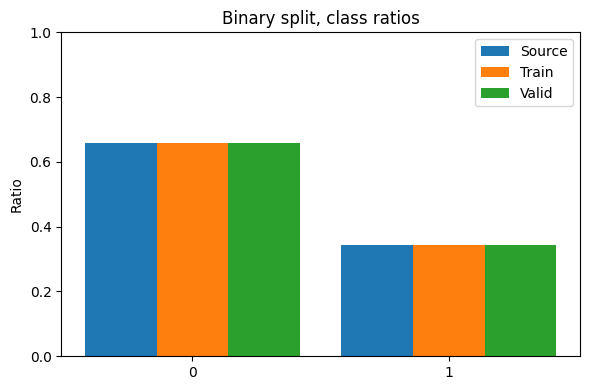


=== Multi-class split distribution ===

Source:
                               count   ratio
Source seed_genai_type_label                
NonGenAI                      176021  0.6580
LLM                            80269  0.3000
GAN                             2275  0.0085
DIFF                             513  0.0019
VAE                               89  0.0003
AR                               262  0.0010
OTHER                           8090  0.0302

Train:
                              count   ratio
Train seed_genai_type_label                
NonGenAI                     158419  0.6580
LLM                           72242  0.3000
GAN                            2047  0.0085
DIFF                            462  0.0019
VAE                              80  0.0003
AR                              236  0.0010
OTHER                          7281  0.0302

Valid:
                             count   ratio
Valid seed_genai_type_label               
NonGenAI                     17602  0.6580
LLM  

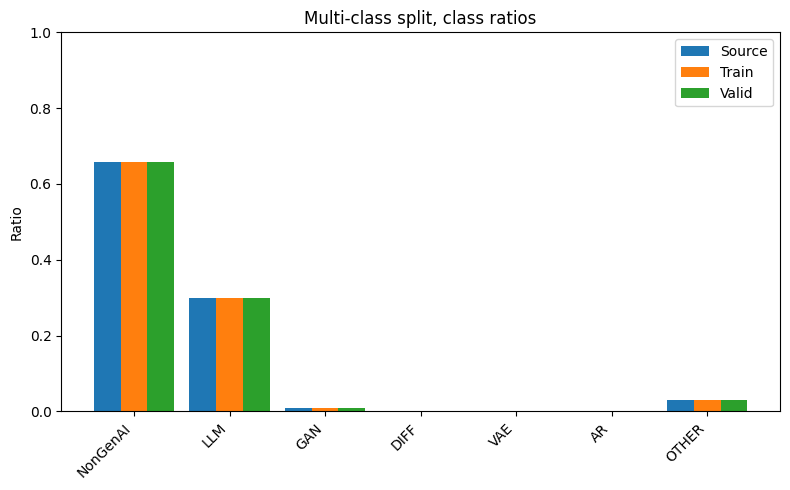

In [48]:
# Cell 5-(4a): Post-split diagnostics, class balance and sanity checks
#  ── 목적: 학습/검증 분할 후 클래스 분포(개수·비율) 점검 및 시각화
#  ── 입력: bin_df, train_bin, valid_bin, type_df, train_type, valid_type
#  ── 출력: 요약 표 출력, 간단한 막대그래프, 편차 경고

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 0) 유틸: 분포 요약 테이블 생성
# -----------------------------
def _dist_table(df, col, name):
    """데이터프레임 df에서 라벨 col의 개수·비율 테이블 생성."""
    cnt = df[col].value_counts().sort_index()
    ratio = (cnt / cnt.sum()).round(4)
    out = pd.DataFrame({"count": cnt, "ratio": ratio})
    out.index.name = f"{name} {col}"
    return out

# -----------------------------
# 1) Binary split 점검
# -----------------------------
print("\n=== Binary split distribution ===")
src_bin  = _dist_table(bin_df,   "seed_genai_label", "Source")
tr_bin   = _dist_table(train_bin,"seed_genai_label", "Train")
va_bin   = _dist_table(valid_bin,"seed_genai_label", "Valid")

print("\nSource:")
print(src_bin)
print("\nTrain:")
print(tr_bin)
print("\nValid:")
print(va_bin)

# ── 비율 편차 점검(허용 오차 예: ±1.5%p)
tol = 0.015
merged_bin = (
    src_bin["ratio"].rename("src")
    .to_frame()
    .join(tr_bin["ratio"].rename("train"), how="outer")
    .join(va_bin["ratio"].rename("valid"), how="outer")
).fillna(0.0)

drift_train = (merged_bin["train"] - merged_bin["src"]).abs().max()
drift_valid = (merged_bin["valid"] - merged_bin["src"]).abs().max()
if drift_train > tol or drift_valid > tol:
    print(f"[warn] Class ratio drift exceeds tolerance (train={drift_train:.3f}, valid={drift_valid:.3f}).")

# ── 시각화(영문 레이블 유지)
fig, ax = plt.subplots(figsize=(6, 4))
x = np.arange(len(merged_bin.index))
w = 0.28
ax.bar(x - w, merged_bin["src"].values,   width=w, label="Source")
ax.bar(x,       merged_bin["train"].values, width=w, label="Train")
ax.bar(x + w, merged_bin["valid"].values, width=w, label="Valid")
ax.set_xticks(x)
ax.set_xticklabels([str(i) for i in merged_bin.index])
ax.set_ylim(0, 1)
ax.set_ylabel("Ratio")
ax.set_title("Binary split, class ratios")
ax.legend()
plt.tight_layout()
plt.show()

# -----------------------------
# 2) Multi-class split 점검
# -----------------------------
print("\n=== Multi-class split distribution ===")
src_mc = _dist_table(type_df,   "seed_genai_type_label", "Source")
tr_mc  = _dist_table(train_type,"seed_genai_type_label", "Train")
va_mc  = _dist_table(valid_type,"seed_genai_type_label", "Valid")

print("\nSource:")
print(src_mc)
print("\nTrain:")
print(tr_mc)
print("\nValid:")
print(va_mc)

merged_mc = (
    src_mc["ratio"].rename("src")
    .to_frame()
    .join(tr_mc["ratio"].rename("train"), how="outer")
    .join(va_mc["ratio"].rename("valid"), how="outer")
).fillna(0.0)

drift_train_mc = (merged_mc["train"] - merged_mc["src"]).abs().max()
drift_valid_mc = (merged_mc["valid"] - merged_mc["src"]).abs().max()
if drift_train_mc > tol or drift_valid_mc > tol:
    print(f"[warn] Multi-class ratio drift exceeds tolerance (train={drift_train_mc:.3f}, valid={drift_valid_mc:.3f}).")

# ── 시각화(영문 레이블 유지)
fig, ax = plt.subplots(figsize=(8, 5))
x = np.arange(len(merged_mc.index))
w = 0.28
ax.bar(x - w, merged_mc["src"].values,   width=w, label="Source")
ax.bar(x,       merged_mc["train"].values, width=w, label="Train")
ax.bar(x + w, merged_mc["valid"].values, width=w, label="Valid")
ax.set_xticks(x)
ax.set_xticklabels([str(i) for i in merged_mc.index], rotation=45, ha="right")
ax.set_ylim(0, 1)
ax.set_ylabel("Ratio")
ax.set_title("Multi-class split, class ratios")
ax.legend()
plt.tight_layout()
plt.show()


## **5-(4b): Split Diagnostics & Cache Save**

In [49]:
# Cell 5-(4b): Split Diagnostics & Cache Save
#  학습/검증 크기 및 분포 출력
print(f"Binary train size: {len(train_bin)}  Valid size: {len(valid_bin)}  (split took {binary_elapsed:.3f}s)")
print("Binary class distribution (train):")
print(train_bin["seed_genai_label"].value_counts(normalize=True).round(3))
print("Binary class distribution (valid):")
print(valid_bin["seed_genai_label"].value_counts(normalize=True).round(3))

print(f"\nType train size: {len(train_type)}  Valid size: {len(valid_type)}  (split took {type_elapsed:.3f}s)")
print("Type class distribution (train):")
print(train_type["seed_genai_type_label"].value_counts(normalize=True).round(3))
print("Type class distribution (valid):")
print(valid_type["seed_genai_type_label"].value_counts(normalize=True).round(3))

#  (Optional) Feather 캐시 저장
train_bin.to_feather("train_bin.feather")
valid_bin.to_feather("valid_bin.feather")
train_type.to_feather("train_type.feather")
valid_type.to_feather("valid_type.feather")


Binary train size: 240767  Valid size: 26752  (split took 0.125s)
Binary class distribution (train):
seed_genai_label
0    0.658
1    0.342
Name: proportion, dtype: float64
Binary class distribution (valid):
seed_genai_label
0    0.658
1    0.342
Name: proportion, dtype: float64

Type train size: 240767  Valid size: 26752  (split took 0.117s)
Type class distribution (train):
seed_genai_type_label
NonGenAI    0.658
LLM         0.300
OTHER       0.030
GAN         0.009
DIFF        0.002
AR          0.001
VAE         0.000
Name: proportion, dtype: float64
Type class distribution (valid):
seed_genai_type_label
NonGenAI    0.658
LLM         0.300
OTHER       0.030
GAN         0.009
DIFF        0.002
AR          0.001
VAE         0.000
Name: proportion, dtype: float64


## **5-(5): Load PatentSBERTa Model**

In [50]:
# Cell 5-(5) FAST: Load SBERT & Generate Embeddings
# --------------------------------------------------
# Purpose: Convert patent texts to 768-dim SBERT vectors faster, then cache to .npy
# Cell 5-(5)c-xgb: Install or upgrade XGBoost
#  XGBoost가 설치되지 않았거나 요구 버전(≥ 2.0.0)보다 낮을 때만 실행
%pip install -q -U "xgboost>=2.0.0"

# 설치 후 버전 확인
import xgboost as xgb
print("XGBoost version:", xgb.__version__)  # ── XGBoost 버전 확인

import os, time, numpy as np, torch, contextlib
from sentence_transformers import SentenceTransformer
import pandas as pd  # used for efficient de-duplication and remapping

# -----------------------------
# 0) Device and model
# -----------------------------
device     = "cuda" if torch.cuda.is_available() else "cpu"
model_name = "AI-Growth-Lab/PatentSBERTa"
print("Loading SBERT model:", model_name, "on", device)
sbert = SentenceTransformer(model_name, device=device)

# Speed hints for modern NVIDIA GPUs
if device == "cuda":
    torch.backends.cuda.matmul.allow_tf32 = True
    # PyTorch 2.x, improves matmul speed with TF32 on Ampere+ GPUs
    try:
        torch.set_float32_matmul_precision("high")
    except Exception:
        pass

# Limit sequence length to reduce compute, validate this choice on your dev set
MAX_LEN = int(os.getenv("SBERT_MAX_LEN", 256))
sbert.max_seq_length = MAX_LEN

# Batch size and worker threads
BATCH_SIZE  = int(os.getenv("SBERT_BATCH", 128 if device == "cuda" else 32))
NUM_WORKERS = min(8, os.cpu_count() or 1)

def encode_texts(texts, tag):
    """
    Inputs: texts (list[str])
    Output: (N, 768) NumPy array
    Speed features: mixed precision on GPU, parallel tokenisation, single CPU transfer
    """
    t0 = time.time()
    autocast_ctx = torch.autocast(device_type="cuda", dtype=torch.float16) if device == "cuda" else contextlib.nullcontext()
    with torch.inference_mode():
        with autocast_ctx:
            emb = sbert.encode(
                texts,
                batch_size=BATCH_SIZE,
                convert_to_tensor=True,          # keep on GPU first
                normalize_embeddings=True,       # L2-normalise on device
                show_progress_bar=True,
                num_workers=NUM_WORKERS          # parallelise tokenisation/collation
            )
    # Convert once to float32 NumPy for downstream ML stability
    if emb.dtype != torch.float32:
        emb = emb.float()
    emb = emb.detach().cpu().numpy()
    print(f"{tag} embeddings done in {time.time()-t0:.1f}s "
          f"(batch={BATCH_SIZE}, max_len={MAX_LEN}, workers={NUM_WORKERS})")
    return emb

# -----------------------------
# 1) Prepare text lists
# -----------------------------
train_texts_bin  = train_bin["tac_text"]
valid_texts_bin  = valid_bin["tac_text"]
train_texts_type = train_type["tac_text"]
valid_texts_type = valid_type["tac_text"]

# -----------------------------
# 2) De-duplicate across all splits, embed once, then remap
# -----------------------------
all_series = pd.concat([train_texts_bin, valid_texts_bin, train_texts_type, valid_texts_type],
                       ignore_index=True)

unique_texts = all_series.drop_duplicates().reset_index(drop=True)
# map: original -> index in unique_texts
index_map = pd.Series(unique_texts.index.values, index=unique_texts.values)

# indices back to unique array for each split
idx_all = all_series.map(index_map).to_numpy()
n1 = len(train_texts_bin)
n2 = len(valid_texts_bin)
n3 = len(train_texts_type)
# slice boundaries
b1, b2, b3, b4 = 0, n1, n1 + n2, n1 + n2 + n3

# Single embedding pass
E_unique = encode_texts(unique_texts.tolist(), "All-unique")

# Reconstruct each split without recomputation
X_train_bin  = E_unique[idx_all[b1:b2]]
X_valid_bin  = E_unique[idx_all[b2:b3]]
X_train_type = E_unique[idx_all[b3:b4]]
X_valid_type = E_unique[idx_all[b4:]]

# -----------------------------
# 3) Disk cache
# -----------------------------
os.makedirs("embeddings", exist_ok=True)
np.save("embeddings/X_train_bin.npy",  X_train_bin)
np.save("embeddings/X_valid_bin.npy",  X_valid_bin)
np.save("embeddings/X_train_type.npy", X_train_type)
np.save("embeddings/X_valid_type.npy", X_valid_type)
print("All embeddings cached to ./embeddings/")


Note: you may need to restart the kernel to use updated packages.
XGBoost version: 3.0.5
Loading SBERT model: AI-Growth-Lab/PatentSBERTa on cuda


Batches:   0%|          | 0/2090 [00:00<?, ?it/s]

All-unique embeddings done in 1427.9s (batch=128, max_len=256, workers=8)
All embeddings cached to ./embeddings/


In [51]:
# Cell 5-(5): Check Embedding Dimension
#  임베딩 차원 확인
print("Embedding dimension:", sbert.get_sentence_embedding_dimension())


Embedding dimension: 768


In [52]:
# Cell 5-(5): Check Maximum Sequence Length
#  SBERT 입력 최대 토큰 길이 확인
print("Max sequence length:", sbert.get_max_seq_length())


Max sequence length: 256


In [53]:
# Cell 5-(5): Inspect Pooling Configuration
#  SBERT 풀링 설정 확인
from sentence_transformers import models
pooling = next(m for m in sbert._modules.values() if isinstance(m, models.Pooling))
print("Mean pooling enabled:", pooling.pooling_mode_mean_tokens)
print("CLS pooling enabled :", pooling.pooling_mode_cls_token)


Mean pooling enabled: False
CLS pooling enabled : True


In [54]:
# Cell 5-(5): Inspect Transformer Backbone Configuration
#  Transformer 모듈의 설정(config)을 조회하여 hidden size, 레이어 수, attention head 수 등을 확인합니다
transformer = next(m for m in sbert._modules.values() if isinstance(m, models.Transformer))
cfg = transformer.auto_model.config
print("Hidden size:", cfg.hidden_size)
print("Number of layers:", cfg.num_hidden_layers)
print("Number of attention heads:", cfg.num_attention_heads)
print("Vocabulary size:", cfg.vocab_size)
print("Max position embeddings:", cfg.max_position_embeddings)


Hidden size: 768
Number of layers: 12
Number of attention heads: 12
Vocabulary size: 30527
Max position embeddings: 514


## **5-(6): Fine-tunig SBERT Model**

In [55]:
# Cell 5-(6): Load Cached SBERT Embeddings & Prepare Labels
# ------------------------------------------------
import os
import numpy as np
from sklearn.preprocessing import LabelEncoder

CACHE_DIR = "embeddings"
paths = {
    "X_train_bin":  os.path.join(CACHE_DIR, "X_train_bin.npy"),
    "X_valid_bin":  os.path.join(CACHE_DIR, "X_valid_bin.npy"),
    "X_train_type": os.path.join(CACHE_DIR, "X_train_type.npy"),
    "X_valid_type": os.path.join(CACHE_DIR, "X_valid_type.npy"),
}

# 1) Binary-classification labels (unchanged)
y_train_bin = train_bin["seed_genai_label"].cat.codes.to_numpy()
y_valid_bin = valid_bin["seed_genai_label"].cat.codes.to_numpy()

# 2) Multiclass-classification labels (re-encoded)
raw_train = train_type["seed_genai_type_label"].values
raw_valid = valid_type["seed_genai_type_label"].values
le = LabelEncoder()
y_type_train = le.fit_transform(raw_train)   # now 0,1,2…(C−1)
y_type_valid = le.transform(raw_valid)
num_classes = len(le.classes_)               # will be passed to XGBClassifier
# you can inspect mapping via: dict(enumerate(le.classes_))

# 3) Check that all cache files exist
for key, path in paths.items():
    assert os.path.exists(path), f"Missing cache file: {path}"

# 4) Load cached embeddings
X_train_bin  = np.load(paths["X_train_bin"])
X_valid_bin  = np.load(paths["X_valid_bin"])
X_train_type = np.load(paths["X_train_type"])
X_valid_type = np.load(paths["X_valid_type"])

print("Cached embeddings loaded")

# Cell 5-(7): Consistency check
assert X_train_bin.shape[0]  == y_train_bin.shape[0], \
       f"Train mismatch: {X_train_bin.shape[0]} vs {len(y_train_bin)}"
assert X_valid_bin.shape[0]  == y_valid_bin.shape[0], \
       f"Valid mismatch: {X_valid_bin.shape[0]} vs {len(y_valid_bin)}"
assert X_train_type.shape[0] == y_type_train.shape[0], \
       f"Train mismatch: {X_train_type.shape[0]} vs {len(y_type_train)}"
assert X_valid_type.shape[0] == y_type_valid.shape[0], \
       f"Valid mismatch: {X_valid_type.shape[0]} vs {len(y_type_valid)}"
print("✓ Embeddings and labels are all aligned")


Cached embeddings loaded
✓ Embeddings and labels are all aligned


In [56]:
# Cell 5-(7): Consistency Check for Embeddings and Labels
# ------------------------------------------------------
# 1) Binary-task consistency
assert X_train_bin.shape[0] == y_train_bin.shape[0], \
    f"Train mismatch: {X_train_bin.shape[0]} vs {len(y_train_bin)}"
assert X_valid_bin.shape[0] == y_valid_bin.shape[0], \
    f"Valid mismatch: {X_valid_bin.shape[0]} vs {len(y_valid_bin)}"

# 2) Multiclass-task consistency
assert X_train_type.shape[0] == y_type_train.shape[0], \
    f"Train mismatch: {X_train_type.shape[0]} vs {len(y_type_train)}"
assert X_valid_type.shape[0] == y_type_valid.shape[0], \
    f"Valid mismatch: {X_valid_type.shape[0]} vs {len(y_type_valid)}"

print("✓ 임베딩과 라벨 크기가 모두 일치합니다")


✓ 임베딩과 라벨 크기가 모두 일치합니다


# **6. Ensemble Learning & Patent Classification**

## **6-(1): Train XGBoost Classifier**

In [57]:
# Cell 6-(1): Train XGBoost Classifiers (Binary & Multiclass)
#  이진(GenAI) 및 다중(서브타입) XGBoost 분류기를 학습하고 검증 성능을 출력합니다
#  정확도 향상을 위해 보조 특징을 추가하고, 얼리 스토핑과 최적 임계값을 적용합니다
# ----------------------------------------------------------------------------------

import re  # 키워드 패턴 카운트용
import os
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.metrics import (
    classification_report, precision_recall_curve,
    average_precision_score, roc_auc_score,
    top_k_accuracy_score
)
from sklearn.utils.class_weight import compute_class_weight

# =========================
# Accuracy-first: Aux features  # 보조 특징으로 정확도 증대
# =========================
# 이전 셀(5-(3))에서 정의한 CPC 세트가 없는 경우를 대비해 최소한의 기본값을 설정  # 안전 장치
try:
    CPC_GENAI_TOTAL
except NameError:
    CPC_GENAI_TOTAL = {
        "G06F-0018/214","G06F-0040/20","G06F-0040/284","G06F-0040/40",
        "G06N-0003/02","G06N-0003/08","G06N-0020/00","G06Q-0010/04",
        "G06V-0010/70","G10L-0013","G16H-0030/40","H04L-0051/02",
        "G06T2207/20","G06N-0003/0475","G06F-0040/","G06N-0020/","G06N-0003/"
    }
try:
    CPC_VAE_AR_DIFF
except NameError:
    CPC_VAE_AR_DIFF = {
        "G06F-0040/20","G06F-0040/284","G06F-0040/40","G06N-0003/02",
        "G06N-0003/08","G06N-0020/00","G06Q-0010/04","G06N-0020/","G06N-0003/"
    }
try:
    CPC_LLM
except NameError:
    CPC_LLM = {"G06F-0040/","G06N-0020/","G06N-0003/","G10L-0015/183"}
try:
    CPC_GAN
except NameError:
    CPC_GAN = {"G06N-0003/02","G06T2207/20","G06V-0010/70"}

# ── 접두 프리픽스 캐싱(성능↑)
_CPC_GENAI_PREFIX = tuple(CPC_GENAI_TOTAL)
_CPC_LLM_PREFIX   = tuple(CPC_LLM)
_CPC_GAN_PREFIX   = tuple(CPC_GAN)
_CPC_VAD_PREFIX   = tuple(CPC_VAE_AR_DIFF)

# 간단한 키워드 카운트 패턴 정의  # 과도한 오탐을 방지하기 위해 엄격한 경계 사용
_pat_llm = re.compile(r"\bLLM(s)?\b|large\s+language\s+model(s)?", re.IGNORECASE)
_pat_gpt = re.compile(r"\bChat\s?GPT\b|\bGPT[-\s]?(4o|4\.1|4|3(?:\.5)?)\b", re.IGNORECASE)
_pat_diff = re.compile(r"\bdiffusion\b|DDPM\b|DDIM\b|classifier[-\s]?free\s+guidance", re.IGNORECASE)
_pat_gan = re.compile(r"\bGANs?\b|StyleGAN[23]?|CycleGAN|Pix2Pix|BigGAN", re.IGNORECASE)
_pat_vae = re.compile(r"\bVAE\b|variational\s+autoencoder|VQ-?VAE|β-?VAE", re.IGNORECASE)
_pat_ar  = re.compile(r"\bauto[-_\s]?regress(?:ive|ion)\b|next[-_\s]?token", re.IGNORECASE)
_pat_transf_model = re.compile(r"\btransformer\b.*\b(model|network|architecture)\b", re.IGNORECASE)

# ── 누락 컬럼 안전 해결
def _resolve_cpc_series(df):
    for col in ("cpc_main_norm", "cpc_main1", "cpc_main"):
        if col in df.columns:
            return df[col]
    return pd.Series("", index=df.index)

def _cpc_hit_prepared(cpc_series, code_set, prefixes):
    s = cpc_series
    return (s.isin(code_set) | s.str.startswith(prefixes)).to_numpy(dtype=np.int8)

def make_aux_features(df):  # 보조 특징 생성기
    txt = df["tac_text"].astype(str).fillna("")
    cpc = _resolve_cpc_series(df).astype(str).fillna("")

    llm = txt.str.count(_pat_llm).clip(upper=10).to_numpy(np.int16)
    gpt = txt.str.count(_pat_gpt).clip(upper=10).to_numpy(np.int16)
    dif = txt.str.count(_pat_diff).clip(upper=10).to_numpy(np.int16)
    gan = txt.str.count(_pat_gan).clip(upper=10).to_numpy(np.int16)
    vae = txt.str.count(_pat_vae).clip(upper=10).to_numpy(np.int16)
    ar  = txt.str.count(_pat_ar ).clip(upper=10).to_numpy(np.int16)
    trm = txt.str.count(_pat_transf_model).clip(upper=10).to_numpy(np.int16)

    cpc_gen = _cpc_hit_prepared(cpc, CPC_GENAI_TOTAL, _CPC_GENAI_PREFIX)
    cpc_llm = _cpc_hit_prepared(cpc, CPC_LLM,        _CPC_LLM_PREFIX)
    cpc_gan = _cpc_hit_prepared(cpc, CPC_GAN,        _CPC_GAN_PREFIX)
    cpc_vad = _cpc_hit_prepared(cpc, CPC_VAE_AR_DIFF,_CPC_VAD_PREFIX)

    tlen = np.log1p(txt.str.len().to_numpy(np.int32)).astype(np.float32)

    feats = np.column_stack([
        cpc_gen, cpc_llm, cpc_gan, cpc_vad,
        llm, gpt, dif, gan, vae, ar, trm, tlen
    ]).astype(np.float32, copy=False)
    return feats

# =========================
# Build augmented matrices  # 보조 특징을 결합해 학습 행렬 강화
# =========================
# 1) 이진 분류용 데이터 로드 ------------------------------------------------------
X_train_aux = make_aux_features(train_bin)
X_valid_aux = make_aux_features(valid_bin)

X_train = np.ascontiguousarray(
    np.hstack([X_train_bin.astype(np.float32, copy=False), X_train_aux]),
    dtype=np.float32
)
X_valid = np.ascontiguousarray(
    np.hstack([X_valid_bin.astype(np.float32, copy=False), X_valid_aux]),
    dtype=np.float32
)

y_train, y_valid = y_train_bin, y_valid_bin

# 2) XGBoost 이진 분류기 ----------------------------------------------------------
# GPU 사용 가능시 자동 설정
use_gpu = False
try:
    import cupy  # 단순 가용성 확인
    use_gpu = True
except Exception:
    use_gpu = False

neg, pos = (y_train == 0).sum(), (y_train == 1).sum()
spw = float(neg) / max(1, float(pos))  # 안전한 scale_pos_weight

# ── 공통 파라미터, 구버전 호환성 중심으로 구성
params_bin = {
    "objective": "binary:logistic",
    "eta": 0.03,                      # learning_rate
    "max_depth": 5,
    "min_child_weight": 2,
    "subsample": 0.9,
    "colsample_bytree": 0.75,
    "lambda": 1.0,                    # reg_lambda
    "alpha": 0.0,                     # reg_alpha
    "gamma": 0.0,
    "eval_metric": "logloss",         # 호환성 높은 지표로 얼리 스토핑
    "nthread": os.cpu_count(),
    "tree_method": "gpu_hist" if use_gpu else "hist",
}
if not use_gpu:
    params_bin["max_bin"] = 256
params_bin["scale_pos_weight"] = spw

# ── DMatrix 구성
dtrain_bin = xgb.DMatrix(X_train, label=y_train)
dvalid_bin = xgb.DMatrix(X_valid, label=y_valid)

# ── train API로 얼리 스토핑 적용
booster_bin = xgb.train(
    params=params_bin,
    dtrain=dtrain_bin,
    num_boost_round=1500,
    evals=[(dvalid_bin, "validation")],
    early_stopping_rounds=100,
    verbose_eval=False
)

# ── 호환 래퍼: 기존 predict_proba, best_iteration 접근 유지
class _XGBBoosterWrapper:
    def __init__(self, booster, objective, num_class=None):
        self.booster = booster
        self.objective = objective
        self.num_class = num_class
        # best_iteration 호환 처리
        self.best_ntree_limit = getattr(booster, "best_ntree_limit", None)
        self.best_iteration = getattr(booster, "best_iteration", None)
        if self.best_iteration is None and self.best_ntree_limit is not None:
            self.best_iteration = int(self.best_ntree_limit) - 1

    def predict_proba(self, X):
        dm = xgb.DMatrix(np.ascontiguousarray(X, dtype=np.float32))
        # ntree_limit 또는 iteration_range를 가능한 경우 사용
        try:
            if self.best_iteration is not None:
                y = self.booster.predict(dm, iteration_range=(0, self.best_iteration + 1))
            else:
                y = self.booster.predict(dm)
        except TypeError:
            # 구버전 호환
            if self.best_ntree_limit is not None:
                y = self.booster.predict(dm, ntree_limit=self.best_ntree_limit)
            else:
                y = self.booster.predict(dm)

        if self.objective == "binary:logistic":
            if y.ndim == 1:
                p1 = y
            else:
                p1 = y[:, 0]
            p0 = 1.0 - p1
            return np.vstack([p0, p1]).T
        else:
            # multi:softprob
            if y.ndim == 1 and self.num_class is not None:
                return y.reshape(-1, self.num_class)
            return y

    # get_booster()를 호출하는 다운스트림 호환
    def get_booster(self):
        return self

xgb_bin = _XGBBoosterWrapper(booster_bin, objective="binary:logistic", num_class=2)

# 최적 임계값 탐색, F1 최대화 기준
proba_valid = xgb_bin.predict_proba(X_valid)[:, 1]
prec, rec, thr = precision_recall_curve(y_valid, proba_valid)
f1_curve = 2 * prec[:-1] * rec[:-1] / np.clip(prec[:-1] + rec[:-1], 1e-9, None)
best_idx = int(np.nanargmax(f1_curve))
best_thr = float(thr[best_idx])

y_pred_bin = (proba_valid >= best_thr).astype(int)

print("[Binary] Classification Report (XGBoost, threshold tuned):")
print(classification_report(y_valid, y_pred_bin, digits=3))
print(f"[Binary] ROC-AUC={roc_auc_score(y_valid, proba_valid):.3f}  PR-AUC={average_precision_score(y_valid, proba_valid):.3f}")
if xgb_bin.best_iteration is not None:
    print(f"[Binary] Best threshold by F1: {best_thr:.4f}  at iter={xgb_bin.best_iteration}")
else:
    print(f"[Binary] Best threshold by F1: {best_thr:.4f}")

# 3) 멀티클래스(서브타입) XGBoost 분류기 ------------------------------------------
# 보조 특징 결합  # 다중 분류 학습 안정화
X_train_m_aux = make_aux_features(train_type)
X_valid_m_aux = make_aux_features(valid_type)

X_train_m = np.ascontiguousarray(
    np.hstack([X_train_type.astype(np.float32, copy=False), X_train_m_aux]),
    dtype=np.float32
)
X_valid_m = np.ascontiguousarray(
    np.hstack([X_valid_type.astype(np.float32, copy=False), X_valid_m_aux]),
    dtype=np.float32
)

y_train_m, y_valid_m = y_type_train, y_type_valid

# classes now 0…(num_classes−1)
classes = np.arange(num_classes)
weights = compute_class_weight("balanced", classes=classes, y=y_train_m)
sample_w = weights[y_train_m]  # 클래스별 가중치 매핑

# ── 멀티클래스 파라미터
params_multi = {
    "objective": "multi:softprob",
    "num_class": int(num_classes),
    "eta": 0.03,
    "max_depth": 5,
    "min_child_weight": 2,
    "subsample": 0.9,
    "colsample_bytree": 0.75,
    "lambda": 1.0,
    "alpha": 0.0,
    "gamma": 0.0,
    "eval_metric": "mlogloss",
    "nthread": os.cpu_count(),
    "tree_method": "gpu_hist" if use_gpu else "hist",
}
if not use_gpu:
    params_multi["max_bin"] = 256

dtrain_multi = xgb.DMatrix(X_train_m, label=y_train_m, weight=sample_w.astype(np.float32))
dvalid_multi = xgb.DMatrix(X_valid_m, label=y_valid_m)

booster_multi = xgb.train(
    params=params_multi,
    dtrain=dtrain_multi,
    num_boost_round=1500,
    evals=[(dvalid_multi, "validation")],
    early_stopping_rounds=100,
    verbose_eval=False
)

xgb_multi = _XGBBoosterWrapper(booster_multi, objective="multi:softprob", num_class=int(num_classes))

y_proba_type = xgb_multi.predict_proba(X_valid_m)
y_pred_type = np.argmax(y_proba_type, axis=1)

print("\n[Multiclass] Classification Report (XGBoost):")
print(classification_report(y_valid_m, y_pred_type, digits=3))
try:
    print(f"[Multiclass] Top-2 accuracy: {top_k_accuracy_score(y_valid_m, y_proba_type, k=2):.3f}")  # 애매한 케이스 파악용
except Exception:
    pass


[Binary] Classification Report (XGBoost, threshold tuned):
              precision    recall  f1-score   support

           0      0.884     0.633     0.738     17602
           1      0.543     0.840     0.660      9150

    accuracy                          0.704     26752
   macro avg      0.713     0.736     0.699     26752
weighted avg      0.767     0.704     0.711     26752

[Binary] ROC-AUC=0.817  PR-AUC=0.681
[Binary] Best threshold by F1: 0.4491  at iter=1499

[Multiclass] Classification Report (XGBoost):
              precision    recall  f1-score   support

           0      0.585     0.923     0.716        26
           1      0.090     0.196     0.123        51
           2      0.332     0.583     0.423       228
           3      0.536     0.672     0.596      8027
           4      0.865     0.647     0.740     17602
           5      0.126     0.465     0.198       809
           6      1.000     0.444     0.615         9

    accuracy                          0.647 

## **6-(2): MLP Classifier with Fixed Embeddings**

In [58]:
# Cell 6-(2): (Optional) Improved MLP Classifier with Mini-Batch Training
#  간단한 MLP를 학습(선택)하여 로지스틱 모델과 앙상블할 수 있도록 준비합니다
# ----------------------------------------------------------------------

USE_MLP = True      # ── 필요 없으면 False 로 변경

if USE_MLP:
    import torch, torch.nn as nn
    import torch.optim as optim

    # 1) MLP 정의
    class SimpleMLP(nn.Module):
        def __init__(self, in_dim, n_classes=2, d_hid=512):
            super().__init__()
            self.net = nn.Sequential(
                nn.Linear(in_dim, d_hid),
                nn.ReLU(),
                nn.Dropout(0.3),
                nn.Linear(d_hid, n_classes)
            )
        def forward(self, x):                                   # ── 순전파
            return self.net(x)

    in_dim = X_train.shape[1]                                   # 입력 차원
    mlp = SimpleMLP(in_dim, n_classes=2).to(DEVICE)             # 모델 초기화
    criterion  = nn.CrossEntropyLoss()                          # 손실 함수
    optimiser  = optim.AdamW(mlp.parameters(), lr=1e-4)         # 옵티마이저

    # 2) 미니배치 학습
    EPOCHS, BATCH = 5, 64
    for epoch in range(EPOCHS):
        mlp.train()
        idx = np.random.permutation(len(X_train))               # 셔플된 인덱스
        for i in range(0, len(idx), BATCH):
            batch_idx = idx[i:i+BATCH]
            xb = torch.tensor(X_train[batch_idx], dtype=torch.float32, device=DEVICE)
            yb = torch.tensor(y_train[batch_idx], dtype=torch.long,   device=DEVICE)
            optimiser.zero_grad()
            loss = criterion(mlp(xb), yb)
            loss.backward()
            optimiser.step()
        print(f"Epoch {epoch+1}/{EPOCHS}  Loss {loss.item():.4f}")

    mlp.eval()   # ── 평가 모드 전환


Epoch 1/5  Loss 0.4641
Epoch 2/5  Loss 0.4022
Epoch 3/5  Loss 0.5589
Epoch 4/5  Loss 0.5900
Epoch 5/5  Loss 0.3890


## **6-(3): Generate Embeddings**

In [59]:
# Cell 6-(3): Generate SBERT Embeddings for the Entire Corpus
#  df_expl3["tac_text"] 전체를 배치 처리하여 임베딩(X_all)을 생성·저장합니다
# ----------------------------------------------------------------------

import time
from tqdm import tqdm       # ── Progress bar
import numpy as np
import os
import torch

# ── Hugging Face 토크나이저 병렬화 허용(기본 미설정 시에만)
os.environ.setdefault("TOKENIZERS_PARALLELISM", "true")

# ── 전체 문장 배열: 리스트로 변환하여 토크나이저 오버헤드 축소
all_texts = df_expl3["tac_text"].astype(str).tolist()
total = len(all_texts)
print(f"[All] Preparing to encode {total} documents…")

emb_dim = sbert.get_sentence_embedding_dimension()  # ── 임베딩 차원(예: 768)
# X_all = np.zeros((total, emb_dim), dtype=float)      # ── 결과 임베딩 저장소  [속도 최적화: 사전 할당 제거]

# ──────────────────────────────────────────────────────────────
# ※ 청크(chunk)와 풀링(pooling)의 개념
# ------------------------------------------------------------------
# • SentenceTransformer.encode() 내부 로직
#   1) 입력 문장 리스트를 최대 토큰 길이(예: 512 토큰)를 넘지 않도록
#      **자동으로 청크 분할**(Truncation 또는 Sliding Window)합니다.
#   2) 트랜스포머 층을 통과한 후, 토큰별 컨텍스트 벡터를
#      **mean pooling**(토큰 평균)하여 하나의 문장 벡터로 압축합니다.
#   3) normalize_embeddings=True 이면 L2 정규화까지 수행합니다.
# ------------------------------------------------------------------
# • 본 루프에서는 encode() 호출마다
#   ↳ (a) 배치 단위로 청크 분할 + 토큰 임베딩
#   ↳ (b) mean pooling → 문장 임베딩
#   과정이 내부에서 자동 실행됩니다.
# ──────────────────────────────────────────────────────────────

# ──────────────────────────────────────────────────────────────
# ※ 장치 자동 선택: CUDA/MPS 우선, 없으면 CPU
#   - Apple Silicon(M1/M2/M3)에서 mps 사용 시 큰 속도 이점
# ------------------------------------------------------------------
if torch.cuda.is_available():
    _device = "cuda"
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    _device = "mps"
else:
    _device = "cpu"

try:
    sbert = sbert.to(_device)   # ── 모델을 선택된 장치로 이동
except Exception:
    pass
print(f"[All] Using device: {_device}")

# 선택 사항(속도↑, 약간의 성능 손실): 최대 토큰 길이를 줄입니다
# sbert.max_seq_length = 256

batch_size = 64

t0 = time.time()

# ──────────────────────────────────────────────────────────────
# 핵심 변경: 한 번의 encode 호출로 전체 코퍼스를 배치 처리
#  - 내부 DataLoader를 1회만 구성하여 반복적 오버헤드 제거
#  - show_progress_bar=True 로 진행률 유지
# ──────────────────────────────────────────────────────────────
X_all = sbert.encode(
    all_texts,
    batch_size=batch_size,
    convert_to_numpy=True,
    normalize_embeddings=True,   # ── L2 정규화
    show_progress_bar=True
)
# ── 결과 임베딩 저장소(X_all)에 최종 결과가 저장됩니다

elapsed_all = time.time() - t0
print(f"[All] Embeddings computed in {elapsed_all:.1f}s")
print("All embedding shape:", X_all.shape)     # ── (N, 768)


[All] Preparing to encode 267519 documents…
[All] Using device: cuda


Batches:   0%|          | 0/4180 [00:00<?, ?it/s]

[All] Embeddings computed in 4069.6s
All embedding shape: (267519, 768)


## **6-(4a) Patent Embedding Heatmap**

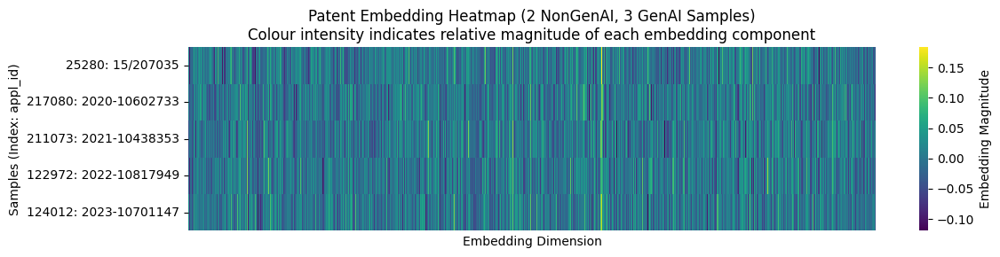

In [60]:
# Cell 6-(4a): Patent Embedding Heatmap (Binary-Label Sampling)
#  2개 NonGenAI + 3개 GenAI 샘플을 임의 선택해 임베딩 값을 히트맵으로 시각화합니다
# ----------------------------------------------------------------------------------

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1) 랜덤 선택을 위한 시드 고정
rng = np.random.default_rng(42)

# 2) 라벨별 인덱스 분리
idx0 = df_expl3.index[df_expl3["seed_genai_label"] == 0].to_numpy()   # ── NonGenAI
idx1 = df_expl3.index[df_expl3["seed_genai_label"] == 1].to_numpy()   # ── GenAI

# 3) NonGenAI 2개, GenAI 3개 무작위 추출
sel0 = rng.choice(idx0, size=2, replace=False)
sel1 = rng.choice(idx1, size=3, replace=False)
selected = np.concatenate([sel0, sel1])

# 4) 샘플 임베딩 및 y축 레이블 준비
sample_vectors = X_all[selected]   # shape = (5, embedding_dim)
yticks_labels = [
    f"{i}: {df_expl3.loc[i, 'appl_id']}"
    for i in selected
]

# 5) 히트맵 그리기
plt.figure(figsize=(12, 3))
ax = sns.heatmap(
    sample_vectors,
    cmap="viridis",
    cbar=True,
    cbar_kws={'label': 'Embedding Magnitude'},
    xticklabels=False,
    yticklabels=yticks_labels
)
ax.set_xlabel("Embedding Dimension")
ax.set_ylabel("Samples (Index: appl_id)")
ax.set_title(
    "Patent Embedding Heatmap (2 NonGenAI, 3 GenAI Samples)\n"
    "Colour intensity indicates relative magnitude of each embedding component"
)
plt.tight_layout()
plt.show()


## **6-(4b) Vector embedding with cosine similarity**

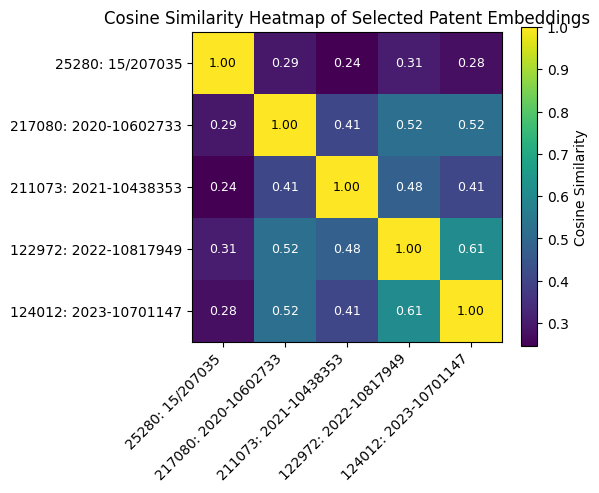

In [61]:
# Cell 6-(4b): Cosine Similarity Heatmap for Selected Patents
#  선택된 특허 임베딩 간 코사인 유사도를 계산 · 히트맵으로 시각화합니다
# ----------------------------------------------------------------------

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# 1) 선택한 인덱스(best_selected) 기반 임베딩 추출
sample_vectors = X_all[selected]                         # ── (n_selected, dim)

# 2) 코사인 유사도 행렬 계산
sim_matrix = cosine_similarity(sample_vectors)

# 3) 축 레이블 (index: appl_id) 생성
labels = [
    f"{int(idx)}: {df_expl3.loc[idx, 'appl_id']}"
    for idx in selected
]

# 4) 히트맵 시각화
fig, ax = plt.subplots(figsize=(6, 5))
cmap = plt.get_cmap('viridis')
cax = ax.imshow(sim_matrix, interpolation='nearest',
                aspect='equal', cmap=cmap)
fig.colorbar(cax, ax=ax, label='Cosine Similarity')

# ── 축 눈금 및 레이블 설정
ax.set_xticks(np.arange(len(labels)))
ax.set_yticks(np.arange(len(labels)))
ax.set_xticklabels(labels, rotation=45, ha="right")
ax.set_yticklabels(labels)
ax.set_title("Cosine Similarity Heatmap of Selected Patent Embeddings")

# 5) 각 셀에 유사도 값 주석 (배경 밝기에 따라 글자색 선택)
for i in range(sim_matrix.shape[0]):
    for j in range(sim_matrix.shape[1]):
        val = sim_matrix[i, j]
        rgba = cmap(val)
        luminance = 0.299 * rgba[0] + 0.587 * rgba[1] + 0.114 * rgba[2]
        text_color = "white" if luminance < 0.5 else "black"
        ax.text(j, i, f"{val:.2f}",
                ha="center", va="center",
                fontsize=9, color=text_color)

plt.tight_layout()
plt.show()


## **6-(5) Generate a new data to hold predictions (df_pred)**

In [62]:
# Cell 6-(5): Create df_pred to Store Predictions
#  df_expl3를 그대로 복사해 예측 결과를 저장할 df_pred 데이터프레임을 생성합니다
# ------------------------------------------------------------------------

df_pred = df_expl3.copy()   # ── 원본 df_expl3 복사본


## **6-(6a): Ensemble Learning and Prediction (0.5 x Logistic + 0.5 x MLP)**

In [63]:
# Cell 6-(6a): Ensemble Prediction (XGBoost ± MLP)
#  XGBoost 이진 확률(+선택적 MLP)로 GenAI 예측 확률을 계산합니다
# ---------------------------------------------------------------

import numpy as np
import torch

# ── 안전 장치: USE_MLP, DEVICE가 없을 때 기본값 설정
try:
    USE_MLP
except NameError:
    USE_MLP = False

try:
    DEVICE
except NameError:
    if torch.cuda.is_available():
        DEVICE = "cuda"
    elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
        DEVICE = "mps"
    else:
        DEVICE = "cpu"

# ── 입력 행렬 준비(학습과 동일한 feature 차원 자동 선택)
#    학습 시 SBERT 임베딩(예: 768)과 보조 특징(예: 12)을 hstack했다면, 여기서도 동일하게 구성해야 함
X_all_base = np.ascontiguousarray(X_all, dtype=np.float32)  # SBERT only
try:
    X_all_aux  = make_aux_features(df_expl3)                 # 보조 특징
    X_all_aug  = np.ascontiguousarray(
        np.hstack([X_all_base, X_all_aux]), dtype=np.float32
    )                                                       # SBERT+Aux
except NameError:
    # make_aux_features가 아직 정의되지 않았으면 SBERT만 사용
    X_all_aug = X_all_base

def _xgb_expected_dim(model):
    # XGBClassifier 계열, Booster 래퍼, 구버전 모두 대응
    try:
        n = getattr(model, "n_features_in_", None)
        if n is not None:
            return int(n)
    except Exception:
        pass
    try:
        return int(model.get_booster().num_features())
    except Exception:
        pass
    try:
        return int(model.booster.num_features())  # our wrapper
    except Exception:
        return None

def _mlp_in_dim(model):
    # 첫 Linear의 in_features를 찾아 입력 차원 자동 결정
    for m in model.modules():
        if isinstance(m, torch.nn.Linear):
            return int(m.in_features)
    return None

# ── XGBoost 입력 차원 선택(학습 차원과 일치하도록 자동 결정)
_xgb_dim = _xgb_expected_dim(xgb_bin)
if _xgb_dim == X_all_base.shape[1]:
    X_for_xgb = X_all_base
elif _xgb_dim == X_all_aug.shape[1]:
    X_for_xgb = X_all_aug
else:
    # 차원을 알 수 없거나 불일치 시, 우선 보강 행렬을 시도
    X_for_xgb = X_all_aug
    print(f"[Notice] XGBoost expected features={_xgb_dim}, using matrix with shape={X_for_xgb.shape}")

# 1) XGBoost 확률
prob_bin_ens = xgb_bin.predict_proba(X_for_xgb)[:, 1]

# 2) (선택) MLP와 앙상블: XGBoost + MLP 50:50
if USE_MLP and 'mlp' in globals():
    _mlp_dim = _mlp_in_dim(mlp)
    if _mlp_dim == X_all_base.shape[1]:
        X_for_mlp = X_all_base
    elif _mlp_dim == X_all_aug.shape[1]:
        X_for_mlp = X_all_aug
    else:
        raise RuntimeError(
            f"MLP expects input_dim={_mlp_dim}, but base={X_all_base.shape[1]}, augmented={X_all_aug.shape[1]}. "
            f"Check that make_aux_features was used consistently in training and inference."
        )

    mlp.eval()
    B = 4096  # 배치 추론으로 메모리와 속도 균형
    probs_buf = []
    with torch.no_grad():
        for s in range(0, X_for_mlp.shape[0], B):
            e = min(s + B, X_for_mlp.shape[0])
            xb = torch.from_numpy(X_for_mlp[s:e]).to(DEVICE)
            logits = mlp(xb)                               # ── 순전파
            p1 = torch.softmax(logits, dim=1)[:, 1]        # ── 클래스 1 확률
            probs_buf.append(p1.detach().cpu().numpy())
    mlp_prob = np.concatenate(probs_buf, axis=0)

    # ── 50:50 앙상블
    prob_bin_ens = 0.5 * prob_bin_ens + 0.5 * mlp_prob

# 3) genai_proba 변수에 저장(후속 셀과 호환)
genai_proba = prob_bin_ens


In [64]:
df_pred['seed_genai_type_label'].value_counts()

seed_genai_type_label
NonGenAI    176021
LLM          80269
OTHER         8090
GAN           2275
DIFF           513
AR             262
VAE             89
Name: count, dtype: int64

## **6-(6b) Adjust optimal threshold (0.51)**

In [65]:
# Cell 6-(6b): GenAI Binary Prediction (Threshold = 0.46, XGBoost 기반)
#  ─────────────────────────────────────────────────────────────────────────
#  • 목적: XGBoost(+MLP) 확률을 사용해 이진 라벨 및 서브타입 예측을 저장
#  • 입력 가정: genai_proba, X_all, xgb_multi, df_pred, df_expl3, make_aux_features
#  • 출력: df_pred["genai_confidence_raw"], ["genai_pred"], ["genai_subtype_pred"]
#  • 주의: m-dash 미사용, 영국식 영어 표기, 주석은 한국어

import numpy as np
import pandas as pd

# -----------------------------
# 0) 하이퍼파라미터
# -----------------------------
GENAI_THR = 0.51                  # ── GenAI 이진판별 임계값
NONGENAI_THR = 0.50
PRIORITY_ORDER = ["GAN", "LLM"]   # ── 낮은 → 높은 순서로 명시, 최종 우선순위는 LLM > GAN > VAE
PRIORITY_THR   = 1e-6             # ── 클래스 우선 적용 최소 확률(수치 노이즈 회피용 매우 작은 값)

# -----------------------------
# 1) 이진 라벨 저장
# -----------------------------
#  • genai_proba: 각 샘플의 GenAI 확률(0~1)
#  • df_pred: 예측 결과를 누적 저장할 DataFrame
df_pred["genai_confidence_raw"] = genai_proba
conditions = [
    genai_proba >= GENAI_THR,
    genai_proba < NONGENAI_THR
]
choices = ["GenAI", "NonGenAI"]
df_pred["genai_pred"] = np.select(conditions, choices, default="Uncertain")

# -----------------------------
# 2) 멀티클래스(서브타입) 예측
# -----------------------------
#  • _XGBBoosterWrapper와 같은 래퍼를 고려해 predict_proba 사용
#  • 입력 특징 차원 불일치 시, SBERT만 또는 SBERT+Aux 중 자동 선택

def _xgb_expected_dim(model):
    """모델이 기대하는 입력 특징 수를 최대한 안전하게 추정."""
    try:
        n = getattr(model, "n_features_in_", None)
        if n is not None:
            return int(n)
    except Exception:
        pass
    try:
        return int(model.get_booster().num_features())
    except Exception:
        pass
    try:
        return int(model.booster.num_features())  # 일부 래퍼 호환
    except Exception:
        return None

# ── 기본 임베딩(SBERT)
X_all_base = np.ascontiguousarray(X_all, dtype=np.float32)

# ── 보조 특징 결합 시도(SBERT + Aux)
try:
    X_all_aux = make_aux_features(df_expl3)  # 사용자가 정의한 보조 특징 생성 함수
    X_all_aug = np.ascontiguousarray(np.hstack([X_all_base, X_all_aux]), dtype=np.float32)
except NameError:
    # 보조 특징 함수가 없으면 SBERT만 사용
    X_all_aug = X_all_base

# ── 모델 기대 차원과 입력을 정합
_exp_dim_multi = _xgb_expected_dim(xgb_multi)
if _exp_dim_multi == X_all_base.shape[1]:
    X_for_multi = X_all_base
elif _exp_dim_multi == X_all_aug.shape[1]:
    X_for_multi = X_all_aug
else:
    # 불일치 시 보강 행렬 우선 사용, 경고 출력
    X_for_multi = X_all_aug
    try:
        print(f"[Notice] xgb_multi expected features={_exp_dim_multi}, using X_for_multi={X_for_multi.shape}")
    except Exception:
        pass

# ── 멀티클래스 확률 예측
y_proba_type = xgb_multi.predict_proba(X_for_multi)   # shape: (N, C)
subtype_codes = np.argmax(y_proba_type, axis=1)       # 1차 예측 코드

# -----------------------------
# 3) 코드 → 카테고리 이름 매핑
# -----------------------------
#  • train_type의 범주형 카테고리를 우선 사용
#  • 없으면 LabelEncoder 백업, 최후에는 정수 문자열
try:
    subtype_categories = train_type["seed_genai_type_label"].cat.categories
except Exception:
    try:
        subtype_categories = label_encoder_type.classes_
    except Exception:
        subtype_categories = np.array([str(i) for i in range(int(y_proba_type.shape[1]))])

subtype_categories = np.array(list(subtype_categories))  # numpy 배열로 강제 변환

# -----------------------------
# 4) 서브타입 우선 재설정 로직: LLM > GAN > VAE
# -----------------------------
#  • PRIORITY_ORDER를 낮은 → 높은으로 두고, 그대로 순회하면 마지막이 최상위가 됨
label_to_idx = {str(cat).strip().upper(): i for i, cat in enumerate(subtype_categories)}

# ── GenAI로 분류된 샘플만 대상으로 마스크 생성
genai_mask = (df_pred["genai_pred"] == "GenAI")
genai_mask_np = genai_mask.to_numpy() if hasattr(genai_mask, "to_numpy") else np.asarray(genai_mask)

for label in PRIORITY_ORDER:  # VAE → GAN → LLM 순으로 적용, LLM이 최종 우선
    idx = label_to_idx.get(label.upper())
    if idx is None:
        continue  # ── 해당 클래스가 없으면 건너뜀
    hit = genai_mask_np & (y_proba_type[:, idx] > PRIORITY_THR)  # ── 임계값 초과 샘플
    subtype_codes[hit] = idx                                     # ── 해당 샘플을 현재 클래스 인덱스로 재설정

# -----------------------------
# 5) 최종 서브타입 저장
# -----------------------------
df_pred["genai_subtype_pred"] = subtype_categories[subtype_codes]


In [66]:
df_pred['genai_pred'].value_counts()

genai_pred
NonGenAI     173327
GenAI         90332
Uncertain      3860
Name: count, dtype: int64

In [67]:
df_pred.loc[df_pred['appl_id'] == '16/417587', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred
60999,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,MOSTAFA DEHGHANI,NL,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM


## **6-(7a): Summary Statistics for genai_pred**

In [68]:
# Cell 6-(7a): Summary Statistics for `genai_pred`
#  df_pred의 genai_pred 분포(빈도·비율·총합)를 요약 테이블로 출력합니다
# ------------------------------------------------------------------------

# 1) 전체 행 개수
total = len(df_pred["genai_pred"])                         # ── 전체 레코드 수

# 2) 항목별 개수와 비율 계산
vc  = df_pred["genai_pred"].value_counts(dropna=False)      # ── 빈도
vc  = vc.rename("count")                                    # ── 컬럼명 통일
pct = (vc / total * 100).round(2).rename("percent")         # ── 비율(%)

# 3) 요약 테이블(summary) 생성
summary = pd.concat([vc, pct], axis=1)
summary["total"] = total                                    # ── 총합 열 추가

# 4) 결과 출력
print(summary)


             count  percent   total
genai_pred                         
NonGenAI    173327    64.79  267519
GenAI        90332    33.77  267519
Uncertain     3860     1.44  267519


## **6-(7b): Probability Histogram, Confusion Matrix & Report**

In [69]:
# Cell 6-(7b): Descriptive Statistics for `seed_genai_label`
#  df_expl3의 seed_genai_label 분포(개수·비율)와 전체 합계를 요약 테이블로 출력합니다
# -------------------------------------------------------------------------

# 1) 전체 행 개수
total = len(df_expl3["seed_genai_label"])                    # ── 전체 레코드 수

# 2) 항목별 개수, 비율 계산
vc  = df_expl3["seed_genai_label"].value_counts(dropna=False).rename("count")  # 빈도
pct = (vc / total * 100).round(2).rename("percent")          # ── 비율(%)

# 3) 요약 테이블(summary) 생성
summary = pd.concat([vc, pct], axis=1)
summary["total"] = total                                     # ── 총합 열 추가

# 4) 결과 출력
print(summary)


                   count  percent   total
seed_genai_label                         
0                 176021     65.8  267519
1                  91498     34.2  267519


## **6-(7c): Probability Histogram, Confusion Matrix & Report**

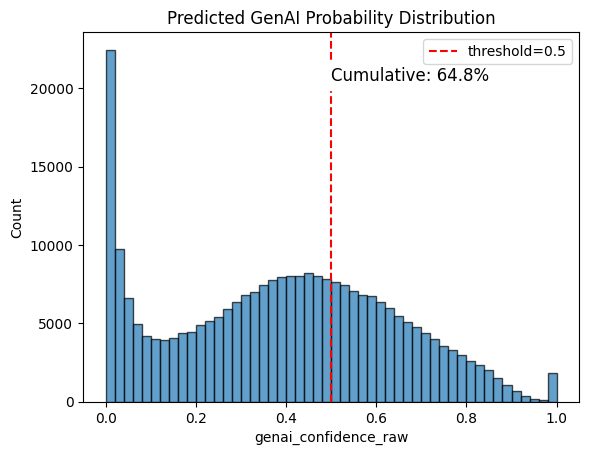

Confusion Matrix:
 [[143219  32802]
 [ 30108  61390]]

Classification Report:
               precision    recall  f1-score   support

    NonGenAI       0.83      0.81      0.82    176021
       GenAI       0.65      0.67      0.66     91498

    accuracy                           0.76    267519
   macro avg       0.74      0.74      0.74    267519
weighted avg       0.77      0.76      0.77    267519

True GenAI 중 올바르게 예측한 수: 61390 / 91498 (67.1%)


In [70]:
# Cell 6-(7c): Probability Histogram, Confusion Matrix & Report
#  df_pred의 genai_confidence_raw 분포를 시각화하고, 혼동 행렬·리포트를 출력합니다
# ----------------------------------------------------------------------------------

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# 1) 예측 확률 히스토그램 및 누적 비율 계산
counts, bins, patches = plt.hist(
    df_pred['genai_confidence_raw'],
    bins=50,
    edgecolor='black',
    alpha=0.7
)

# threshold 위치
th = 0.5
plt.axvline(th, color='red', linestyle='--', label=f'threshold={th}')

# 누적 개수와 비율 계산
# bins[:-1] 은 각 bin의 왼쪽 경계, counts[i]는 그 bin의 빈도
cum_count = counts[bins[:-1] < th].sum()
total_count = counts.sum()
cum_pct = cum_count / total_count * 100

# 점선 위에 텍스트 표시 (x, y 위치를 조정하며)
# y 위치는 히스토그램의 최대 높이의 90% 정도로 설정
ymax = counts.max()
plt.text(
    th,               # x 위치: threshold 값
    ymax * 0.9,       # y 위치: 히스토그램 최고점의 90%
    f'Cumulative: {cum_pct:.1f}%', 
    ha='left',        # 텍스트 정렬: 좌측 맞춤
    va='bottom',      # 텍스트 정렬: 아래쪽 맞춤
    fontsize=12,
    backgroundcolor='white'
)

plt.title("Predicted GenAI Probability Distribution")
plt.xlabel("genai_confidence_raw")
plt.ylabel("Count")
plt.legend()
plt.show()

# 2) 혼동 행렬 및 리포트
y_true  = df_pred['seed_genai_label']
y_pred  = (df_pred['genai_confidence_raw'] >= th).astype(int)
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n",
      classification_report(y_true, y_pred, target_names=['NonGenAI','GenAI']))

# 3) 실제 GenAI 중 모델이 맞춘 비율
matched = df_pred[(df_pred['seed_genai_label']==1) & (y_pred==1)]
print("True GenAI 중 올바르게 예측한 수:", len(matched),
      "/", sum(y_true==1),
      f"({len(matched)/sum(y_true==1):.1%})")

## **6-(7d): Precision-Recall Threshold Optimisation & Report**

In [71]:
# Cell 6-(7d): Precision–Recall Threshold Optimisation & Report
#  PR 곡선을 기반으로 최적 임계값(T_opt)을 도출한 뒤, 해당 임계값에서 분류 성능을 평가합니다
# --------------------------------------------------------------------------------------------

from sklearn.metrics import precision_recall_curve, classification_report

# 1) Precision–Recall 곡선 및 F1-score 기반 최적 임계값 계산
y_true  = df_pred['seed_genai_label']                # ── 실제 라벨
y_score = df_pred['genai_confidence_raw']            # ── 예측 확률

prec, rec, thresh = precision_recall_curve(y_true, y_score)
f1_scores = 2 * prec * rec / (prec + rec + 1e-8)     # ── F1-score (분모 0 방지용 ε)

T_opt = thresh[f1_scores.argmax()]                   # ── F1 최대점의 임계값
print(f"Optimal threshold: {T_opt:.3f},  Best F1: {f1_scores.max():.3f}")

# 2) 최적 임계값 적용 후 분류 리포트 출력
y_pred_opt = (y_score >= T_opt).astype(int)          # ── 최적 임계값 적용
print("\n[Classification Report @ Optimal Threshold]")
print(
    classification_report(
        y_true,
        y_pred_opt,
        target_names=['NonGenAI', 'GenAI'],
        digits=3
    )
)


Optimal threshold: 0.419,  Best F1: 0.683

[Classification Report @ Optimal Threshold]
              precision    recall  f1-score   support

    NonGenAI      0.879     0.703     0.781    176021
       GenAI      0.588     0.814     0.683     91498

    accuracy                          0.741    267519
   macro avg      0.733     0.759     0.732    267519
weighted avg      0.779     0.741     0.748    267519



## **6-(7e): Precision–Recall Curve & F1 vs Threshold Visualisation**

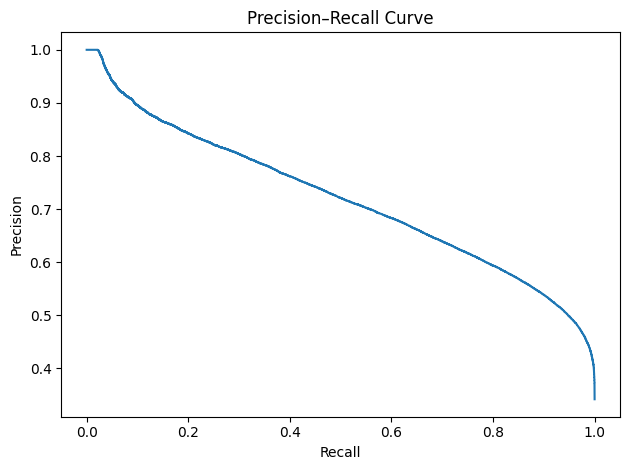

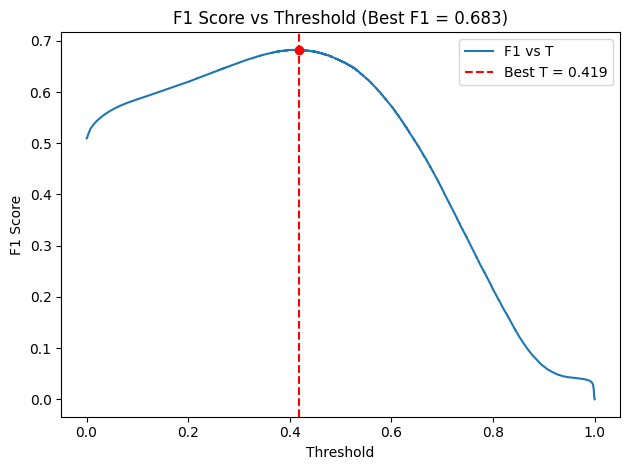

In [72]:
# Cell 6-(7e): Precision–Recall Curve & F1 vs Threshold Visualisation
#  PR 곡선과 F1-Score 변화를 시각화하여 최적 임계값(best_threshold)을 확인합니다
# ----------------------------------------------------------------------------------

import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve

# 1) 실제 라벨과 예측 확률 준비
y_true  = df_pred['seed_genai_label']          # ── 실제 라벨
y_score = df_pred['genai_confidence_raw']      # ── 예측 확률

# 2) precision, recall, thresholds 계산
precision, recall, thresholds = precision_recall_curve(y_true, y_score)

# 3) threshold별 F1-score 계산 (마지막 포인트 제외 → thresholds와 길이 맞춤)
f1_scores = 2 * precision[:-1] * recall[:-1] / (precision[:-1] + recall[:-1] + 1e-8)

# 4) 최적 임계값(best_threshold) 및 F1 추출
best_idx       = f1_scores.argmax()
best_threshold = thresholds[best_idx]
best_f1        = f1_scores[best_idx]

# ──────────── 그래프 1: Precision–Recall Curve ────────────
plt.figure()
plt.plot(recall, precision, label='PR curve')   # PR 곡선
plt.title('Precision–Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.tight_layout()
plt.show()

# ──────────── 그래프 2: F1 Score vs Threshold ────────────
plt.figure()
plt.plot(thresholds, f1_scores, label='F1 vs T')
plt.scatter([best_threshold], [best_f1], color='red', zorder=5)  # 최적점 표시
plt.axvline(best_threshold, color='red', linestyle='--',
            label=f'Best T = {best_threshold:.3f}')
plt.title(f'F1 Score vs Threshold (Best F1 = {best_f1:.3f})')
plt.xlabel('Threshold')
plt.ylabel('F1 Score')
plt.legend()
plt.tight_layout()
plt.show()


In [73]:
# Cell 6-(7f): Preview Table of GenAI-Predicted Patents
#  GenAI로 예측된 특허 중 주요 메타데이터 10개 열을 조회하고 상위 5행을 미리봅니다
# -------------------------------------------------------------------------------------

preview_cols = [
    'appl_id', 'year', 'country_code',
    'seed_genai_label', 'genai_pred',
    'seed_genai_type_label', 'genai_subtype_pred',
    'inventor', 'inventor_nat',
    'applicant', 'applicant_nat'
]

df_pred.loc[df_pred['genai_pred'] == 'GenAI', preview_cols].head()


,appl_id,year,country_code,seed_genai_label,genai_pred,seed_genai_type_label,genai_subtype_pred,inventor,inventor_nat,applicant,applicant_nat
3,17/039133,2020.0,US,1,GenAI,LLM,LLM,ISMAIL YUNUS AKHALWAYA,ZA,IBM,US
5,16/401254,2019.0,US,1,GenAI,LLM,LLM,TOBY KURIEN,ZA,IBM,US
25,15/931223,2020.0,US,1,GenAI,LLM,LLM,FRANCOIS PIERRE LUUS,ZA,IBM,US
26,PCT-IB2021-052265,2021.0,US,1,GenAI,LLM,LLM,LUUS FRANCOIS,ZA,IBM,US
27,13/513530,2009.0,ES,1,GenAI,AR,GAN,JOHAN NIKOLAAS LANGEHOVEN BRUMMER,ZA,AGNITIO SL,ES


In [74]:
# Cell 6-(7g): Count of Unique GenAI-Predicted Patent Records
#  GenAI로 예측된 특허 레코드(고유 appl_id 기준)의 빈도를 계산합니다
# ----------------------------------------------------------------------

unique_counts = (
    df_pred.loc[df_pred['genai_pred'] == 'GenAI', [
        'appl_id', 'year', 'country_code',
        'seed_genai_label', 'genai_pred',
        'seed_genai_type_label', 'genai_subtype_pred',
        'inventor', 'inventor_nat',
        'applicant', 'applicant_nat'
    ]]
    .value_counts()                         # ── 고유 조합별 빈도
)

print("Unique GenAI-Predicted Patent Records:", len(unique_counts))
unique_counts.head()                        # ── 상위 빈도 레코드 미리보기


Unique GenAI-Predicted Patent Records: 90332


appl_id           year    country_code  seed_genai_label  genai_pred  seed_genai_type_label  genai_subtype_pred  inventor               inventor_nat  applicant                 applicant_nat
UD2002-000103     2002.0  IT            0                 GenAI       NonGenAI               LLM                 TECCHIOLLI GIAMPIETRO  IT            NEURICAM SPA              IT               1
00638/CHENP/2015  2015.0                0                 GenAI       NonGenAI               LLM                 SCHILLINGS BENOIT M                  META PLATFORMS                             1
00882/CHE/2008    2008.0                0                 GenAI       NonGenAI               LLM                 SAXENA ASHUTOSH                      INFOSYS TECHNOLOGIES LTD                   1
00971/DEL/2013    2013.0                0                 GenAI       NonGenAI               LLM                 TANWAR POONAM                        POONAM TANWAR                              1
01126/MUMNP/2013  2013.0      

In [75]:
# Cell 6-(7h): Confusion Matrix & Classification Report (Subtype Level)
#  예측 서브타입(genai_subtype_pred)과 실제 라벨(seed_genai_type_label)을 비교해
#  혼동 행렬과 분류 리포트를 출력
# ----------------------------------------------------------------------

from sklearn.metrics import classification_report, confusion_matrix

# 1) 실제·예측 서브타입 라벨
y_true = df_pred["seed_genai_type_label"]
y_pred = df_pred["genai_subtype_pred"]

# 2) 혼동 행렬 및 리포트
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

print(
    "\nClassification Report:\n",
    classification_report(
        y_true,
        y_pred,
        zero_division=0                        # ── 분모 0 상황 시 0 반환
    )
)


Confusion Matrix:
 [[     0      0    133    117     12      0      0]
 [     0      5      0    488      0      0     20]
 [     5     12    883   1329      0      0     46]
 [  2749  12677    150  53324      0      0  11369]
 [ 10530  15677    821  31044      0      0 117949]
 [  3229     63      2   4592      0      0    204]
 [     0      1     35     17      0     33      3]]

Classification Report:
               precision    recall  f1-score   support

          AR       0.00      0.00      0.00       262
        DIFF       0.00      0.01      0.00       513
         GAN       0.44      0.39      0.41      2275
         LLM       0.59      0.66      0.62     80269
    NonGenAI       0.00      0.00      0.00    176021
       OTHER       0.00      0.00      0.00      8090
         VAE       0.00      0.03      0.00        89

    accuracy                           0.20    267519
   macro avg       0.15      0.16      0.15    267519
weighted avg       0.18      0.20      0.19    26

In [76]:
df_pred['wips_family_pub_count'].value_counts()

wips_family_pub_count
1       126043
2        29726
3        23670
4        17549
5        14968
         ...  
3006         1
223          1
128          1
101          1
241          1
Name: count, Length: 215, dtype: int64

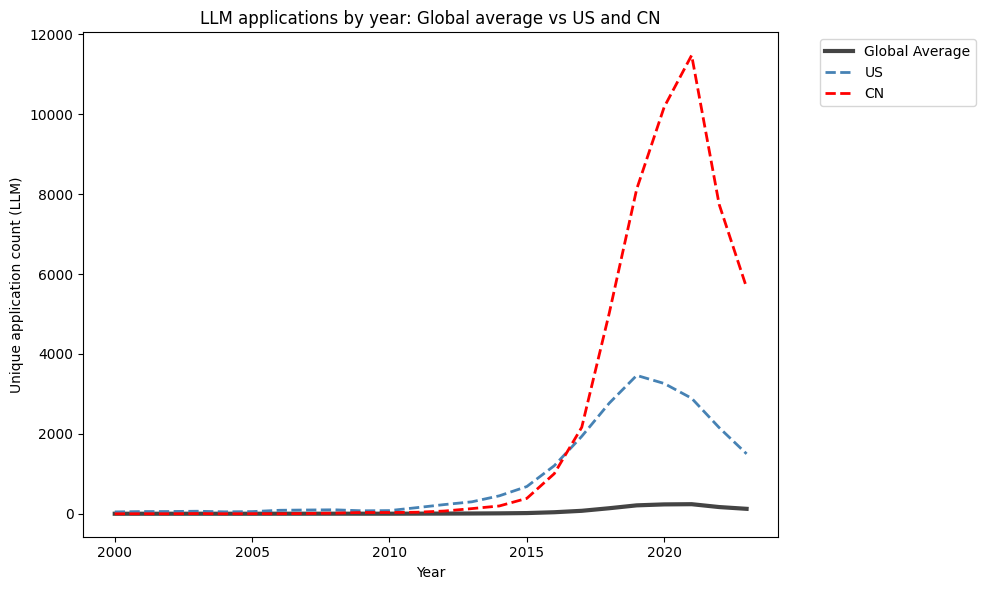

In [77]:
# Cell 6-(8a): LLM subtype only — yearly appl_id trend
#  • 고유 appl_id 기준 연도별 건수 집계
#  • 글로벌 평균(짙은 회색 실선), 미국(steelblue 점선), 중국(적색 점선)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별, 필수 컬럼 정합성 점검
req_cols = {"year", "country_code", "appl_id", "genai_subtype_pred"}
missing = req_cols - set(df_pred.columns)
if missing:
    raise ValueError(f"Missing required columns: {sorted(missing)}")

llm_df = (
    df_pred.loc[df_pred["genai_subtype_pred"] == "LLM", ["year", "country_code", "appl_id"]]
    .dropna(subset=["year", "country_code", "appl_id"])
)

# 2) (year, country_code, appl_id) 중복 제거 후 연도·국가별 고유 appl_id 수 집계
llm_unique = llm_df.drop_duplicates(["year", "country_code", "appl_id"])
llm_counts_wide = (
    llm_unique.groupby(["year", "country_code"]).size().reset_index(name="count")
    .pivot(index="year", columns="country_code", values="count")
    .sort_index()
    .fillna(0)
    .astype(int)
)

# 3) 글로벌 평균, 미국, 중국 시계열
global_avg = llm_counts_wide.mean(axis=1)                    # 각 연도의 국가들 평균
us_series  = llm_counts_wide["US"] if "US" in llm_counts_wide.columns else None
cn_series  = llm_counts_wide["CN"] if "CN" in llm_counts_wide.columns else None

# 4) 플롯
plt.figure(figsize=(10, 6))
plt.plot(global_avg.index, global_avg.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')  # 짙은 회색 실선

if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')       # steelblue 점선

if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')             # 적색 점선

plt.xlabel('Year')
plt.ylabel('Unique application count (LLM)')
plt.title("LLM applications by year: Global average vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


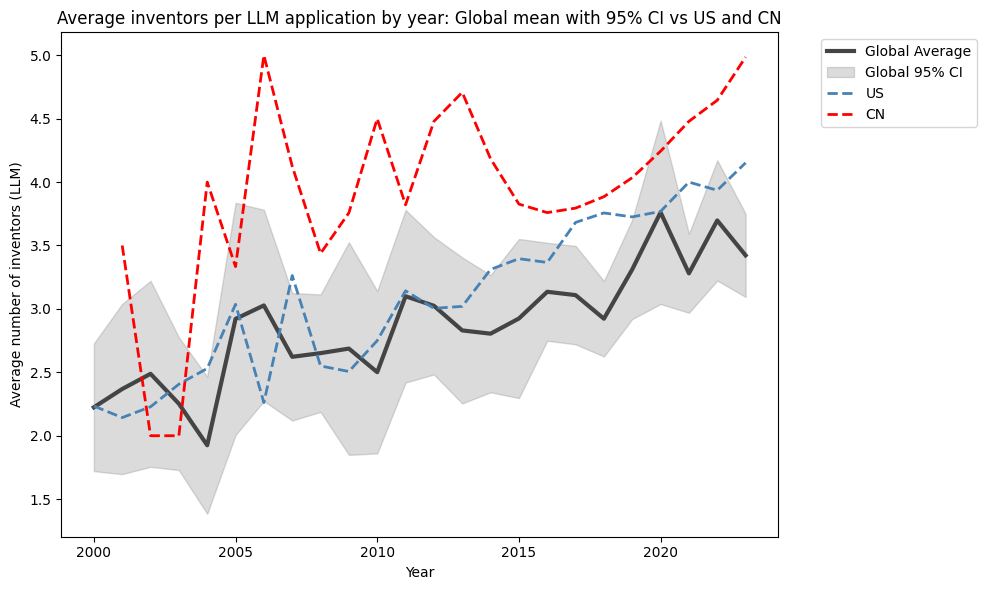

In [78]:
# Cell 6-(8c): LLM subtype only — yearly num_inventors trend with 95% CI for global average

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별
llm_df = (
    df_pred.loc[df_pred["genai_subtype_pred"] == "LLM", ["year", "country_code", "num_inventors"]]
    .dropna(subset=["year", "country_code", "num_inventors"])
)

# 2) 연도·국가별 평균 발명자 수
llm_inventor_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["num_inventors"].mean()
)
llm_inventor_wide = (
    llm_inventor_mean.pivot(index="year", columns="country_code", values="num_inventors")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_inventor_wide.mean(axis=1)
global_std  = llm_inventor_wide.std(axis=1, ddof=1)          # 국가별 표준편차
n_countries = llm_inventor_wide.notna().sum(axis=1)          # 해당 연도 국가 수
global_se   = global_std / np.sqrt(n_countries)              # 표준오차
ci95 = 1.96 * global_se                                      # 95% CI

# 4) 미국, 중국 시계열
us_series  = llm_inventor_wide["US"] if "US" in llm_inventor_wide.columns else None
cn_series  = llm_inventor_wide["CN"] if "CN" in llm_inventor_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% 신뢰구간 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average number of inventors (LLM)')
plt.title("Average inventors per LLM application by year: Global mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


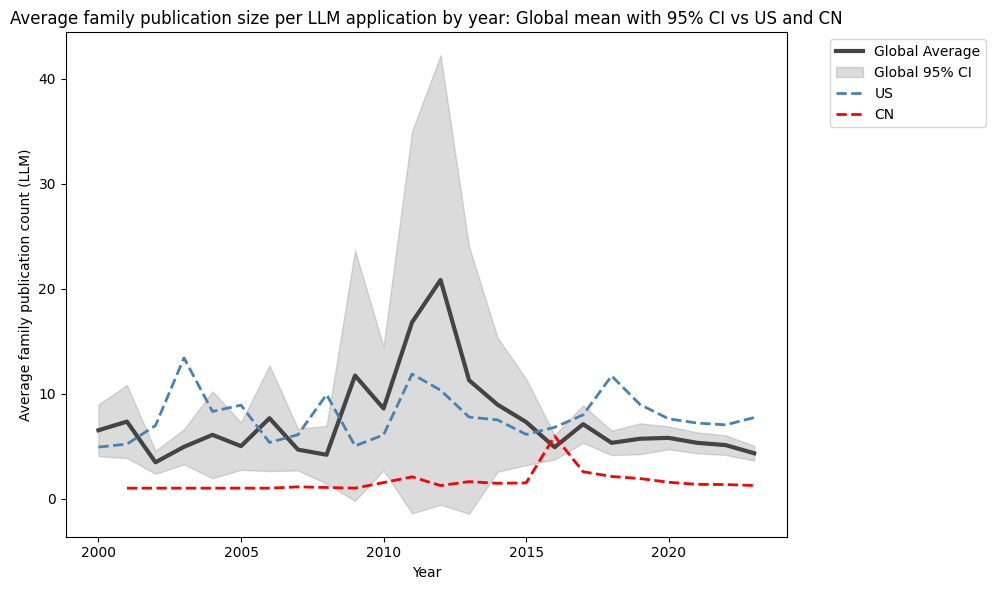

In [79]:
# Cell 6-(8d): LLM subtype only — yearly wips_family_pub_count trend with 95% CI for global average

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별
llm_df = (
    df_pred.loc[df_pred["genai_subtype_pred"] == "LLM", ["year", "country_code", "wips_family_pub_count"]]
    .dropna(subset=["year", "country_code", "wips_family_pub_count"])
)

# 2) 연도·국가별 평균 family publication count 계산
llm_family_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["wips_family_pub_count"].mean()
)
llm_family_wide = (
    llm_family_mean.pivot(index="year", columns="country_code", values="wips_family_pub_count")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_family_wide.mean(axis=1)
global_std  = llm_family_wide.std(axis=1, ddof=1)
n_countries = llm_family_wide.notna().sum(axis=1)
global_se   = global_std / np.sqrt(n_countries)
ci95 = 1.96 * global_se

# 4) 미국, 중국, 한국 시계열
us_series = llm_family_wide["US"] if "US" in llm_family_wide.columns else None
cn_series = llm_family_wide["CN"] if "CN" in llm_family_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% 신뢰구간 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average family publication count (LLM)')
plt.title("Average family publication size per LLM application by year: Global mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


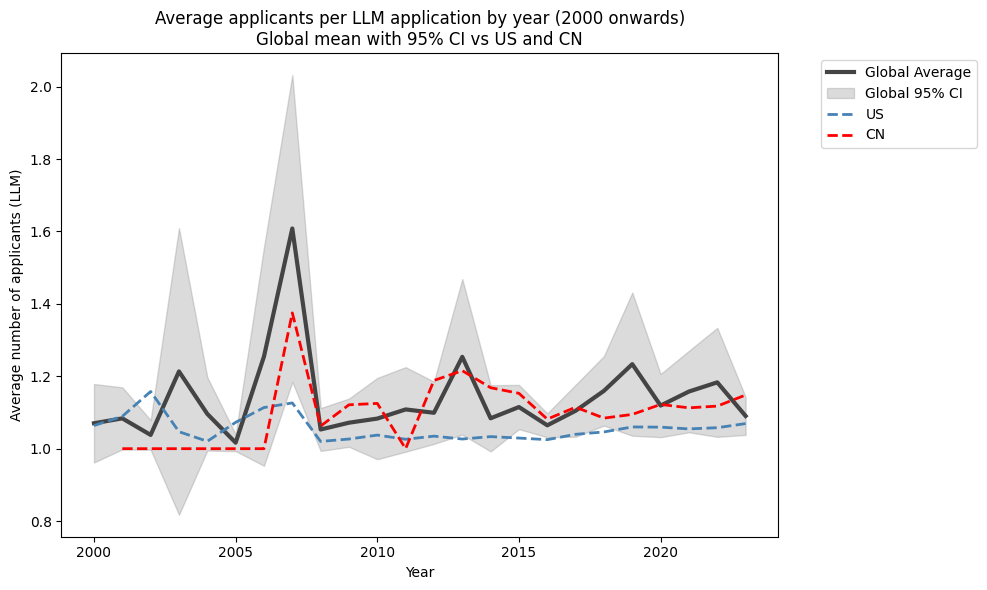

In [80]:
# Cell 6-(8e): LLM subtype only — yearly num_applicants trend (2000 onwards) with 95% CI

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별 + 2000년 이후만
llm_df = (
    df_pred.loc[
        (df_pred["genai_subtype_pred"] == "LLM") & (df_pred["year"] >= 2000),
        ["year", "country_code", "num_applicants"]
    ]
    .dropna(subset=["year", "country_code", "num_applicants"])
)

# 2) 연도·국가별 평균 신청인 수
llm_applicant_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["num_applicants"].mean()
)
llm_applicant_wide = (
    llm_applicant_mean.pivot(index="year", columns="country_code", values="num_applicants")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_applicant_wide.mean(axis=1)
global_std  = llm_applicant_wide.std(axis=1, ddof=1)
n_countries = llm_applicant_wide.notna().sum(axis=1)
global_se   = global_std / np.sqrt(n_countries)
ci95 = 1.96 * global_se

# 4) 미국, 중국 시계열
us_series = llm_applicant_wide["US"] if "US" in llm_applicant_wide.columns else None
cn_series = llm_applicant_wide["CN"] if "CN" in llm_applicant_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% CI 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average number of applicants (LLM)')
plt.title("Average applicants per LLM application by year (2000 onwards)\nGlobal mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


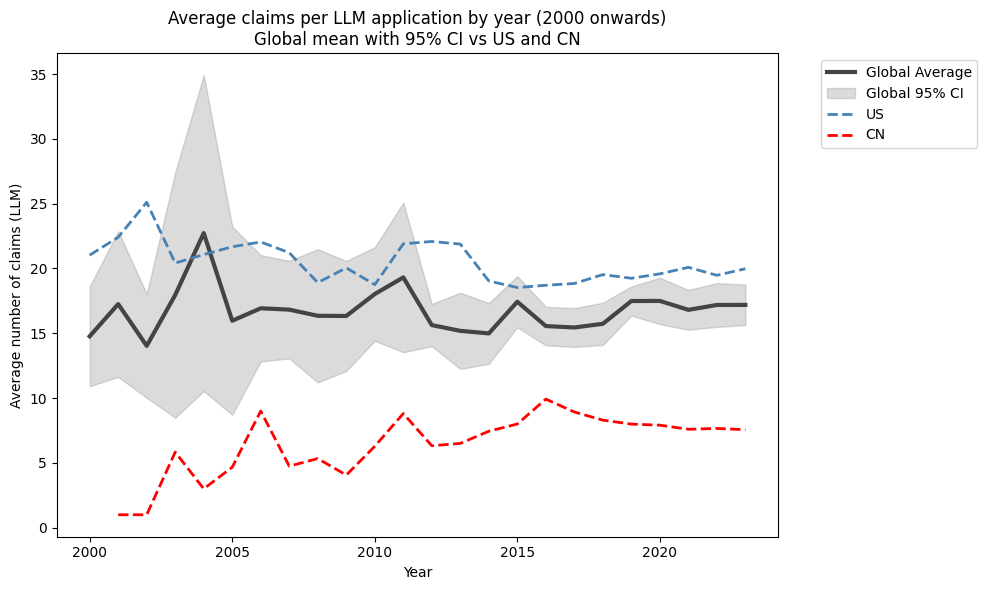

In [81]:
# Cell 6-(8f): LLM subtype only — yearly num_claims trend (2000 onwards) with 95% CI

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별 + 2000년 이후만
llm_df = (
    df_pred.loc[
        (df_pred["genai_subtype_pred"] == "LLM") & (df_pred["year"] >= 2000),
        ["year", "country_code", "num_claims"]
    ]
    .dropna(subset=["year", "country_code", "num_claims"])
)

# 2) 연도·국가별 평균 청구항 수
llm_claims_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["num_claims"].mean()
)
llm_claims_wide = (
    llm_claims_mean.pivot(index="year", columns="country_code", values="num_claims")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_claims_wide.mean(axis=1)
global_std  = llm_claims_wide.std(axis=1, ddof=1)
n_countries = llm_claims_wide.notna().sum(axis=1)
global_se   = global_std / np.sqrt(n_countries)
ci95 = 1.96 * global_se

# 4) 미국, 중국 시계열
us_series = llm_claims_wide["US"] if "US" in llm_claims_wide.columns else None
cn_series = llm_claims_wide["CN"] if "CN" in llm_claims_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% CI 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average number of claims (LLM)')
plt.title("Average claims per LLM application by year (2000 onwards)\nGlobal mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


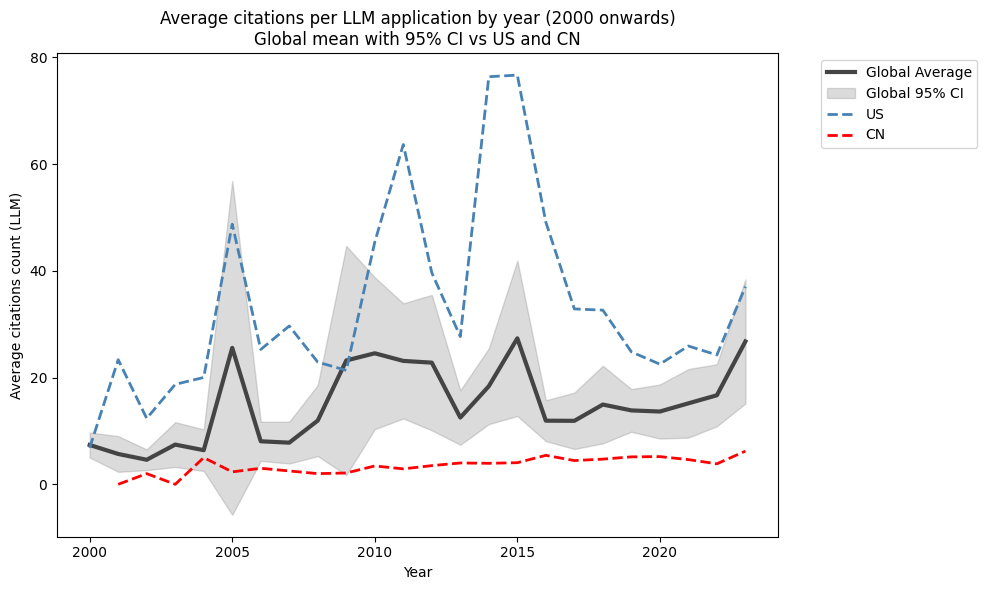

In [82]:
# Cell 6-(8g): LLM subtype only — yearly citations_count trend (2000 onwards) with 95% CI

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별 + 2000년 이후만
llm_df = (
    df_pred.loc[
        (df_pred["genai_subtype_pred"] == "LLM") & (df_pred["year"] >= 2000),
        ["year", "country_code", "citations_count"]
    ]
    .dropna(subset=["year", "country_code", "citations_count"])
)

# 2) 연도·국가별 평균 citation 수 계산
llm_cite_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["citations_count"].mean()
)
llm_cite_wide = (
    llm_cite_mean.pivot(index="year", columns="country_code", values="citations_count")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_cite_wide.mean(axis=1)
global_std  = llm_cite_wide.std(axis=1, ddof=1)
n_countries = llm_cite_wide.notna().sum(axis=1)
global_se   = global_std / np.sqrt(n_countries)
ci95 = 1.96 * global_se

# 4) 미국, 중국 시계열
us_series = llm_cite_wide["US"] if "US" in llm_cite_wide.columns else None
cn_series = llm_cite_wide["CN"] if "CN" in llm_cite_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% CI 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average citations count (LLM)')
plt.title("Average citations per LLM application by year (2000 onwards)\nGlobal mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


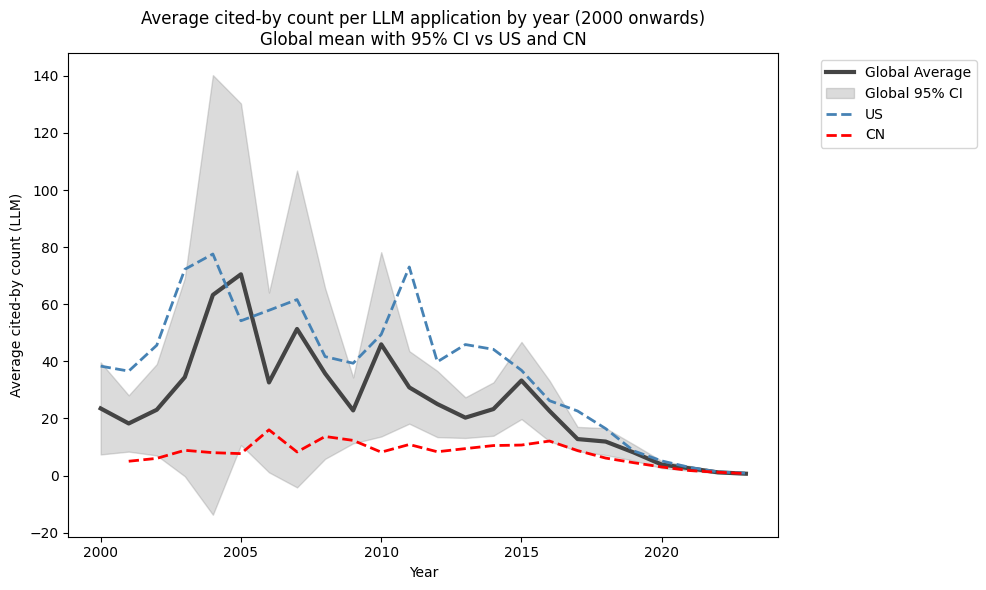

In [83]:
# Cell 6-(8h): LLM subtype only — yearly cited_by_count trend (2000 onwards) with 95% CI

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별 + 2000년 이후만
llm_df = (
    df_pred.loc[
        (df_pred["genai_subtype_pred"] == "LLM") & (df_pred["year"] >= 2000),
        ["year", "country_code", "cited_by_count"]
    ]
    .dropna(subset=["year", "country_code", "cited_by_count"])
)

# 2) 연도·국가별 평균 피인용 수 계산
llm_cited_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["cited_by_count"].mean()
)
llm_cited_wide = (
    llm_cited_mean.pivot(index="year", columns="country_code", values="cited_by_count")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_cited_wide.mean(axis=1)
global_std  = llm_cited_wide.std(axis=1, ddof=1)
n_countries = llm_cited_wide.notna().sum(axis=1)
global_se   = global_std / np.sqrt(n_countries)
ci95 = 1.96 * global_se

# 4) 미국, 중국 시계열
us_series = llm_cited_wide["US"] if "US" in llm_cited_wide.columns else None
cn_series = llm_cited_wide["CN"] if "CN" in llm_cited_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% CI 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average cited-by count (LLM)')
plt.title("Average cited-by count per LLM application by year (2000 onwards)\nGlobal mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# **7. t‑SNE Projection**

## **7-(1a1): Category Embeddings via PatentSBERTa**

In [84]:
# Cell 7-(1a): Category Embeddings via PatentSBERTa 〈ENRICHED + Vision-3〉
# ────────────────────────────────────────────────
# 목적: '카테고리 설명문'을 임베딩 친화적 문구로 구성해
#       PatentSBERTa 임베딩 공간에서 각 카테고리 중심 벡터가 안정적으로 포지셔닝되도록 함
#       추가 카테고리 3종: Image Segmentation, Object Detection, Face Recognition

import time, numpy as np
from sentence_transformers import SentenceTransformer

# 0) SBERT 로딩  --------------------------------------------------------------
# 이미 sbert가 메모리에 있다면 이 단계 생략 가능
# model_name = "AI-Growth-Lab/PatentSBERTa"
# sbert = SentenceTransformer(model_name)

# 1) Category descriptions — separability-optimised for embedding space
category_desc = {
    "Models": (
        "General-purpose backbones pre-trained on heterogeneous web and code corpora, "
        "task-agnostic objectives, frozen base checkpoints, broad transfer without task cues, "
        "tokenisation pipeline details omitted at inference, zero-shot and few-shot ready. "
        "Anchors: base model, pre-training corpus, checkpoint zoo."
    ),
    "Tuning": (
        "Supervised adaptation pipelines that alter weights or adapters to match preference data, "
        "instruction datasets, DPO or RLHF objectives, PEFT modules such as LoRA adapters, "
        "domain-specific SFT with curator guidelines. "
        "Anchors: preference pairs, LoRA adapter, SFT recipe."
    ),
    "Reasoning": (
        "Prompt-level inference strategies that elicit multi-step solutions without further training, "
        "chain-of-thought traces, self-consistency sampling, scratchpad tokens, tool-use plans. "
        "Anchors: CoT rationale, self-consistency, scratchpad."
    ),
    "Architecture": (
        "Network topology and kernels, decoder-only stacks, rotary embeddings, KV cache handling, "
        "mixture-of-experts routing and load balancing, attention variants such as FlashAttention and sliding-window attention, "
        "tensor and pipeline parallel specifics. "
        "Anchors: KV cache, MoE router, attention kernel."
    ),
    "Pretraining": (
        "Scaling laws and compute allocation, token budgets, data deduplication, curriculum and mixing ratios, "
        "compute-optimal regimes, checkpointing and optimiser schedules during base training. "
        "Anchors: token budget, compute frontier, data deduplication."
    ),
    "Conversation": (
        "Dialogue-centric behaviour with state tracking, persona constraints, turn-level memory, "
        "safety and refusal policies, tool mediation for chat orchestration, multilingual guardrails. "
        "Anchors: dialogue turn, safety policy, guardrail."
    ),
    "Deep Learning": (
        "Non-LLM neural methods, convolutional and recurrent networks, optimisation tricks such as batch normalisation and dropout, "
        "classical vision or speech pipelines not reliant on large language models. "
        "Anchors: CNN, RNN, batch norm."
    ),
    "NLP": (
        "Task-defined language processing outside instruction-following, tokenisation and tagging, parsing and morphology, "
        "machine translation and summarisation benchmarks, linguistic resources and treebanks. "
        "Anchors: POS tagging, dependency parse, treebank."
    ),
    "Multimodal": (
        "Cross-modal alignment between vision, text and audio using separate encoders and fusion layers, "
        "contrastive pre-training, cross-attention bridges, grounding and captioning. "
        "Anchors: CLIP-style contrast, cross-attention, VQA."
    ),
    "Distillation": (
        "Teacher-student transfer with temperature-scaled logits, feature matching and response imitation, "
        "latency and memory targets for edge deployment, quantisation-aware training. "
        "Anchors: temperature τ, student model, distillation loss."
    ),
    "Synthetic": (
        "Model-generated corpora for augmentation or rare-case coverage in language tasks, "
        "scenario templates and red-teaming prompts with quality filters and de-duplication prior to training. "
        "Anchors: data augmentation, template prompt, quality filter."
    ),

    # ── 추가: 직관적 비전 3카테고리
    "Image Segmentation": (
        "Pixel-wise labelling of images to assign a semantic class to each pixel, "
        "producing dense masks that delineate objects and regions without text or audio context. "
        "Anchors: semantic segmentation, instance masks, per-pixel labelling."
    ),
    "Object Detection": (
        "Localising and classifying objects in images using bounding boxes or region proposals, "
        "reporting categories and positions while remaining within single-modality visual pipelines. "
        "Anchors: bounding boxes, region proposals, object localisation."
    ),
    "Face Recognition": (
        "Detecting, aligning and identifying human faces by extracting discriminative embeddings, "
        "supporting verification and identification scenarios without multimodal grounding. "
        "Anchors: face detection, face embedding, identity verification."
    ),
}

# 2) 카테고리 임베딩 생성  -----------------------------------------------------
sentences      = list(category_desc.values())
category_names = list(category_desc.keys())

t0 = time.time()
category_emb = sbert.encode(
    sentences,
    convert_to_numpy=True,
    normalize_embeddings=True,
    show_progress_bar=True
)
print(f"Category embeddings: shape = {category_emb.shape}, time = {time.time() - t0:.1f}s")

# 3) 프리뷰 출력  --------------------------------------------------------------
for name, vec in zip(category_names, category_emb):
    print(f"{name:24s} → [{', '.join(f'{v:.3f}' for v in vec[:5])}, …]")

# -------------------------------------------------------------------------
# References (high-impact or widely cited works)
#  비전 3카테고리의 직관적 정의를 뒷받침하는 표준 문헌을 포함
# -------------------------------------------------------------------------
# Krizhevsky, A., Sutskever, I., & Hinton, G. (2012). ImageNet Classification with Deep Convolutional Neural Networks. NIPS.
# Deng, J. et al. (2009). ImageNet: A Large-Scale Hierarchical Image Database. CVPR.
# He, K. et al. (2017). Mask R-CNN. ICCV.  ← segmentation과 detection의 결합적 틀
# Ren, S. et al. (2015). Faster R-CNN. NIPS.  ← 대표적 object detection 프레임워크
# Redmon, J. et al. (2016). You Only Look Once: Unified, Real-Time Object Detection. CVPR.
# Long, J. et al. (2015). Fully Convolutional Networks for Semantic Segmentation. CVPR.
# Schroff, F., Kalenichenko, D., & Philbin, J. (2015). FaceNet: A Unified Embedding for Face Recognition and Clustering. CVPR.
# Parkhi, O. M. et al. (2015). Deep Face Recognition. BMVC.
# Reimers, N., & Gurevych, I. (2019). Sentence-BERT. EMNLP.
# Vaswani, A. et al. (2017). Attention Is All You Need. NeurIPS.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Category embeddings: shape = (14, 768), time = 0.4s
Models                   → [0.017, -0.089, -0.023, -0.023, 0.014, …]
Tuning                   → [-0.007, -0.051, -0.030, -0.047, 0.031, …]
Reasoning                → [-0.012, -0.093, -0.014, -0.050, -0.026, …]
Architecture             → [-0.004, -0.128, -0.038, -0.005, -0.018, …]
Pretraining              → [0.008, -0.048, -0.035, 0.009, 0.030, …]
Conversation             → [0.023, -0.082, -0.035, -0.008, -0.008, …]
Deep Learning            → [-0.007, -0.072, -0.032, -0.050, -0.012, …]
NLP                      → [0.010, -0.099, -0.041, -0.001, -0.010, …]
Multimodal               → [-0.021, -0.130, -0.022, -0.013, -0.022, …]
Distillation             → [-0.013, -0.078, -0.028, 0.004, 0.033, …]
Synthetic                → [-0.017, -0.063, -0.019, -0.035, -0.008, …]
Image Segmentation       → [0.009, -0.067, -0.023, 0.003, 0.011, …]
Object Detection         → [-0.016, 0.000, -0.023, -0.028, -0.003, …]
Face Recognition         → [0.007, -0.0

In [85]:
# 빈도와 비율을 함께 표시
df_pred['seed_genai_label'].value_counts()


seed_genai_label
0    176021
1     91498
Name: count, dtype: int64

In [86]:
# 빈도와 비율을 함께 표시
df_pred['seed_genai_type_label'].value_counts()


seed_genai_type_label
NonGenAI    176021
LLM          80269
OTHER         8090
GAN           2275
DIFF           513
AR             262
VAE             89
Name: count, dtype: int64

In [87]:
# 빈도와 비율을 함께 표시
df_pred['genai_subtypes_multi'].value_counts()


genai_subtypes_multi
                       184033
LLM;DIFF;VAE;AR         68832
LLM                     10037
GAN                      2250
LLM;GAN;DIFF;VAE;AR      1378
DIFF;VAE;AR               500
AR                        262
VAE                        88
LLM;GAN                    51
LLM;AR                     39
GAN;VAE                    19
DIFF                       13
LLM;VAE                     8
GAN;DIFF;VAE;AR             4
LLM;DIFF                    2
VAE;AR                      1
GAN;AR                      1
GAN;VAE;AR                  1
Name: count, dtype: int64

In [88]:
# 빈도와 비율을 함께 표시
df_pred['genai_pred'].value_counts()


genai_pred
NonGenAI     173327
GenAI         90332
Uncertain      3860
Name: count, dtype: int64

In [89]:
# 빈도와 비율을 함께 표시
df_pred['genai_subtype_pred'].value_counts()


genai_subtype_pred
VAE         129591
LLM          90911
DIFF         28435
AR           16513
GAN           2024
OTHER           33
NonGenAI        12
Name: count, dtype: int64

In [90]:
df_pred.loc[df_pred['appl_id'] == '16/417587', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred
60999,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,MOSTAFA DEHGHANI,NL,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM


In [91]:
df_pred.loc[df_pred['appl_id'] == '16/021971', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred
42509,16/021971,US,GOOGLE INC,2018.0,US,G06N-0003/045,8.0,NOAM M SHAZEER,US,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM


## **7-(1a2) t-SNE with prior PCA to 50D, visualising GenAI vs Others in 2D**

Subtitle: t-SNE with prior PCA to 50D, visualising GenAI vs Others in 2D
[PCA] reduced to 50 dims in 4.2s


t-SNE Pipeline:   0%|          | 0/4 [00:00<?, ?step/s]

[t-SNE] fitting GenAI view… (perplexity=30)


t-SNE Pipeline:  25%|██▌       | 1/4 [27:30<1:22:30, 1650.25s/step]

[t-SNE] done in 1650.2s


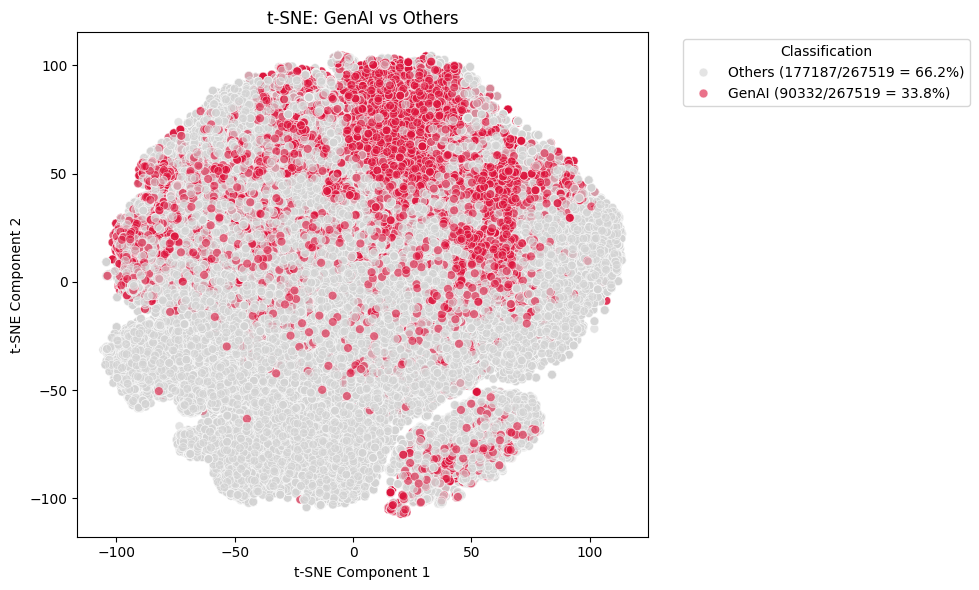

t-SNE Pipeline: 100%|██████████| 4/4 [27:36<00:00, 414.14s/step]   


In [92]:
# Cell 7-(1a2): t-SNE with prior PCA to 50D, visualising GenAI vs Others in 2D
#  ── 목적: X_all → PCA(최대 50차원) → t-SNE(2D) 투영, GenAI vs Others 산점도
#  ── 입력: X_all (NumPy 배열), df_pred["genai_pred"] (이진 라벨)
#  ── 출력: 산점도(plt.show), 보조 테이블(vis_df), 좌표(X_tsne)

from sklearn.manifold import TSNE          # ── t-SNE 차원 축소
from sklearn.decomposition import PCA      # ── PCA 사전 축소
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, time, inspect
from tqdm import tqdm

print("Subtitle: t-SNE with prior PCA to 50D, visualising GenAI vs Others in 2D")  # ── 영어 소제목 출력

# -----------------------------
# 0) 입력 검증 및 길이 정렬
# -----------------------------
X = np.asarray(X_all)                         # ── X_all을 NumPy 배열로 강제 변환
n = X.shape[0]                                # ── 표본 수 저장
labels = df_pred["genai_pred"].astype(str).values  # ── 이진 라벨(문자열) 추출
m = len(labels)

if n != m:
    # ── 길이 불일치 시 공통 최소 길이로 절단하여 인덱스 정합성 확보
    k = min(n, m)
    X = X[:k]
    labels = labels[:k]
    print(f"[warn] Length mismatch: X_all={n}, labels={m} → truncated to {k}")

# -----------------------------
# 1) PCA 사전 축소(최대 50차원)
# -----------------------------
# ── t-SNE 안정성·속도 개선을 위해 고차원을 50차원 이하로 축소
pca_k = 50 if X.shape[1] > 50 else X.shape[1]      # ── 원 차원이 50 이하이면 그대로 사용
t0 = time.time()
X_pca = PCA(n_components=pca_k, svd_solver="randomized", random_state=42).fit_transform(X)
print(f"[PCA] reduced to {pca_k} dims in {time.time() - t0:.1f}s")

# -----------------------------
# 2) perplexity 자동 조정
# -----------------------------
# ── t-SNE 제약: n_samples > 3 * perplexity 조건을 만족하도록 상한 설정
base_perp = 30
max_valid_perp = max(5, (len(X_pca) - 1) // 3)
perp = min(base_perp, max_valid_perp)

# -----------------------------
# 3) TSNE 인자 호환성 처리
# -----------------------------
# ── sklearn 버전에 따라 n_iter 또는 max_iter 사용 여부를 런타임 점검
tsne_sig = inspect.signature(TSNE.__init__).parameters
tsne_common = dict(
    n_components=2,          # ── 최종 2차원 좌표 계산
    perplexity=perp,         # ── 위에서 계산한 perplexity 적용
    init="random",           # ── 랜덤 초기화로 지역 극값 민감도 완화
    random_state=42,         # ── 재현성 보장
)
if "n_iter" in tsne_sig:
    tsne_kwargs = dict(tsne_common, n_iter=1000)        # ── 구버전 호환
elif "max_iter" in tsne_sig:
    tsne_kwargs = dict(tsne_common, max_iter=1000)      # ── 신버전 호환
else:
    tsne_kwargs = tsne_common                           # ── 기본값 사용

# -----------------------------
# 4) 파이프라인 실행
# -----------------------------
steps = ["Compute t-SNE", "Prepare DataFrame", "Compute Summary", "Plot Scatter"]
X_tsne = None     # ── t-SNE 결과 좌표 초기화
vis_df = None     # ── 시각화용 데이터프레임 초기화

for step in tqdm(steps, desc="t-SNE Pipeline", unit="step"):
    if step == "Compute t-SNE":
        # ── PCA 결과(X_pca)를 입력으로 t-SNE 학습 및 2D 좌표 획득
        print(f"[t-SNE] fitting GenAI view… (perplexity={perp})")
        t1 = time.time()
        tsne = TSNE(**tsne_kwargs)
        X_tsne = tsne.fit_transform(X_pca)
        print(f"[t-SNE] done in {time.time() - t1:.1f}s")

    elif step == "Prepare DataFrame":
        # ── t-SNE 좌표와 이진 라벨을 결합하여 시각화 테이블 생성
        vis_df = pd.DataFrame({
            "tSNE1": X_tsne[:, 0],
            "tSNE2": X_tsne[:, 1],
            "GenAI": pd.Series(labels).apply(lambda x: "GenAI" if x == "GenAI" else "Others")
        })

    elif step == "Compute Summary":
        # ── 클래스별 개수와 비율을 계산하여 범례에 반영할 문자열 구성
        counts = vis_df["GenAI"].value_counts()
        total  = len(vis_df)
        summary_labels = {cls: f"{cls} ({counts[cls]}/{total} = {counts[cls]/total:.1%})"
                          for cls in counts.index}

    elif step == "Plot Scatter":
        # ── 산점도 시각화(플롯 내 텍스트와 범례는 영문 유지)
        plt.figure(figsize=(10, 6))
        ax = sns.scatterplot(
            data=vis_df,
            x="tSNE1", y="tSNE2",
            hue="GenAI",
            palette={"Others": "lightgray", "GenAI": "crimson"},
            alpha=0.6,
            s=40,
            edgecolor="white"
        )
        plt.title("t-SNE: GenAI vs Others")     # ── 제목(영문)
        plt.xlabel("t-SNE Component 1")         # ── x축 레이블(영문)
        plt.ylabel("t-SNE Component 2")         # ── y축 레이블(영문)

        # ── 범례 라벨을 개수·비율 정보로 대체
        handles, labels_ = ax.get_legend_handles_labels()
        new_labels = [summary_labels.get(lab, lab) for lab in labels_]
        ax.legend(handles=handles, labels=new_labels, title="Classification",
                  bbox_to_anchor=(1.05, 1), loc="upper left")

        plt.tight_layout()
        plt.show()


## **7-(1a3) Centroid distances in embedding space with KMeans labels**

계산 절차 설(4단계)
① 군집 라벨 준비 
df_pred에 cluster_id_k가 있으면 그대로 사용하고, 없으면 KMeans로 군집화를 수행하여 라벨을 생성합니다. KMeans는 기본 K=5로 설정하고 n_init=10, random_state=42를 지정하여 재현성을 확보합니다.
② 군집 중심(centroid) 계산
각 군집에 속한 샘플들의 평균 벡터를 구합니다.계산된 중심 벡터를 L2로 정규화하여 크기를 1로 맞춥니다. 샘플이 전혀 없는 군집은 0 벡터로 채웁니다.
③ 샘플-중심 거리 계산
각 샘플에 대해 코사인 거리와 유클리드 거리를 계산합니다. 코사인 거리는 cosine_distances()를 사용하며, 유클리드 거리는 직접 L2 노름으로 계산합니다.
④ 이상치 플래그 생성
코사인 거리의 상위 95%와 99% 분위수를 계산합니다. 해당 분위수 이상인 샘플에 대해 각각 dist_cluster_cos_p95_flag와 dist_cluster_cos_p99_flag 플래그(0/1)를 부여합니다.

In [93]:
# Cell 7-(1a3): Centroid distances in embedding space with KMeans labels
#  ── 목적: KMeans 라벨 기준으로 군집 중심과 각 샘플의 중심 거리 계산, 이상치 플래그 생성
#  ── 입력: X_all(np.ndarray), df_pred(DataFrame, 선택적 'cluster_id_k')
#  ── 출력: df_pred에 거리 및 플래그 컬럼 추가

import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_distances

print("Subtitle: Centroid distances in embedding space with KMeans labels")  

# ── 안전성 검증: X_all 타입과 길이 일치 확인
assert isinstance(X_all, np.ndarray), "X_all must be a NumPy array"
assert len(df_pred) == X_all.shape[0], "df_pred rows must match X_all"

# 1) 군집 라벨 준비
#    ── df_pred에 기존 라벨이 있으면 재사용, 없으면 KMeans로 생성
if "cluster_id_k" in df_pred.columns:
    cluster_labels = df_pred["cluster_id_k"].to_numpy()
else:
    K = 5                                           # ── 기본 군집 수
    km = KMeans(n_clusters=K, n_init=10, random_state=42)  # ── 재현성 확보
    cluster_labels = km.fit_predict(X_all)          # ── 라벨 예측
    df_pred["cluster_id_k"] = cluster_labels        # ── 결과 저장

# 2) 군집 중심 계산 함수
def compute_centroids(X, labels):
    """
    Compute L2-normalised centroids per cluster label.
    """
    K = int(labels.max()) + 1                       # ── 군집 수 추정
    cents = []
    for k in range(K):
        pts = X[labels == k]                        # ── k번 군집의 샘플들
        if pts.shape[0] == 0:                       # ── 비어 있으면 0벡터
            cents.append(np.zeros(X.shape[1], dtype=np.float32))
        else:
            c = pts.mean(axis=0)                    # ── 평균 벡터 계산
            n = np.linalg.norm(c)                   # ── L2 노름
            c = c / n if n > 0 else c               # ── 0 나눗셈 방지하며 정규화
            cents.append(c.astype(np.float32))      # ── 메모리 절약을 위한 float32
    return np.vstack(cents)

centroids = compute_centroids(X_all, cluster_labels) # ── 전체 군집의 중심 스택

# 3) 각 샘플의 중심까지의 거리 계산
#    ── 코사인 거리와 유클리드 거리를 모두 산출
d_cos = np.empty(X_all.shape[0], dtype=np.float32)   # ── 코사인 거리 저장 배열
d_euc = np.empty(X_all.shape[0], dtype=np.float32)   # ── 유클리드 거리 저장 배열

for k in np.unique(cluster_labels):
    idx = np.where(cluster_labels == k)[0]           # ── k번 군집 인덱스
    c = centroids[k].reshape(1, -1)                  # ── 중심을 행 벡터로
    # ── 코사인 거리: 1 - cosine similarity
    d_cos[idx] = cosine_distances(X_all[idx], c).ravel()
    # ── 유클리드 거리: 표준 L2 거리
    diff = X_all[idx] - centroids[k]
    d_euc[idx] = np.linalg.norm(diff, axis=1)

# 4) 결과 저장
df_pred["dist_cluster_cos"] = d_cos                  # ── 코사인 거리
df_pred["dist_cluster_euclid"] = d_euc               # ── 유클리드 거리

# 5) 이상치 플래그 생성
#    ── 코사인 거리의 상위 95, 99 분위 기준 이진 플래그
p95_cos = np.percentile(d_cos, 95)
p99_cos = np.percentile(d_cos, 99)
df_pred["dist_cluster_cos_p95_flag"] = (d_cos >= p95_cos).astype(int)
df_pred["dist_cluster_cos_p99_flag"] = (d_cos >= p99_cos).astype(int)

print("Saved: cluster_id_k, dist_cluster_cos, dist_cluster_euclid, and outlier flags to df_pred")


Subtitle: Centroid distances in embedding space with KMeans labels
Saved: cluster_id_k, dist_cluster_cos, dist_cluster_euclid, and outlier flags to df_pred


In [94]:
df_pred.loc[df_pred['appl_id'] == '16/417587', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred', 'cluster_id_k', 'dist_cluster_cos']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred,cluster_id_k,dist_cluster_cos
60999,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,MOSTAFA DEHGHANI,NL,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM,3,0.360675


In [95]:
df_pred.loc[df_pred['appl_id'] == '16/021971', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred', 'cluster_id_k', 'dist_cluster_cos']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred,cluster_id_k,dist_cluster_cos
42509,16/021971,US,GOOGLE INC,2018.0,US,G06N-0003/045,8.0,NOAM M SHAZEER,US,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM,3,0.280046


In [96]:
df_pred.loc[df_pred['appl_id'] == '18/183902', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred', 'cluster_id_k', 'dist_cluster_cos']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred,cluster_id_k,dist_cluster_cos


In [97]:
df_pred[['appl_id', 'cluster_id_k', 'dist_cluster_cos','dist_cluster_euclid']].value_counts

<bound method DataFrame.value_counts of                   appl_id  cluster_id_k  dist_cluster_cos  dist_cluster_euclid
0               16/674522             4          0.370195             0.860460
1       PCT-IB2019-059065             3          0.324063             0.805063
2       PCT-ZA2007-000005             2          0.325779             0.807191
3               17/039133             3          0.350212             0.836913
4       PCT-IB2019-057528             4          0.391850             0.885269
...                   ...           ...               ...                  ...
267514         2019119940             3          0.326774             0.808423
267515    10-2019-0060729             1          0.013067             0.161660
267516    10-2018-0069105             1          0.216220             0.657601
267517    10-2018-0133717             1          0.073883             0.384404
267518    10-2018-0083467             1          0.086014             0.414762

[267519 row

In [98]:
# Cell 7-(6a-sync): Sync plotting DataFrames 
#  목적: df_pred의 라벨·거리 컬럼을 plot_df에 안전하게 동기화
#  포인트:
#   - 우선 anchor_id 같은 고유 키로 merge(m:1)
#   - 키가 없으면 인덱스 조인(겹치는 컬럼 제외)
#   - 그래도 안 되면 길이가 같을 때만 위치 기준 대입
#   - 중복 키는 첫 항목 사용, 겹치는 컬럼 충돌 방지

import pandas as pd
import numpy as np

# 0) plot_df 확보
if "plot_df" not in globals():
    base_df = vis_df if "vis_df" in globals() else pd.DataFrame({
        "tSNE1": X_tsne[:, 0],
        "tSNE2": X_tsne[:, 1]
    })
    plot_df = base_df.copy()

# 1) 동기화 대상 컬럼
sync_cols = [
    "cluster_id_k", "anchor_id", "anchor_name", "dist_cluster_cos",
    "genai_subtype_pred", "seed_genai_type_label", "country_code", "year"
]
present_cols = [c for c in sync_cols if c in df_pred.columns]

# 2) 조인 키 선정, 우선순위
key_candidates = ["anchor_id", "appl_id", "doc_id", "pub_id", "id"]
join_key = next((k for k in key_candidates if k in plot_df.columns and k in df_pred.columns), None)

if join_key is not None:
    # 2a) 키 머지, df_pred 쪽 중복 키는 첫 항목 사용
    rhs_cols = [join_key] + [c for c in present_cols if c != join_key]
    rhs = df_pred[rhs_cols].drop_duplicates(subset=[join_key], keep="first").copy()

    before_cols = set(plot_df.columns)
    plot_df = plot_df.merge(rhs, on=join_key, how="left", validate="m:1")
    added = [c for c in plot_df.columns if c not in before_cols]
    print(f"[sync] merged on '{join_key}' with {len(rhs)} unique keys; added/updated: {added[:10]}{'...' if len(added)>10 else ''}")

else:
    # 2b) 인덱스 조인(겹치는 컬럼 제외)
    if len(plot_df) <= len(df_pred) and plot_df.index.isin(df_pred.index).all():
        rhs = df_pred[present_cols].copy()
        non_overlap = [c for c in rhs.columns if c not in plot_df.columns]
        if non_overlap:
            plot_df = plot_df.join(rhs[non_overlap], how="left")
            print(f"[sync] joined on index; added: {non_overlap[:10]}{'...' if len(non_overlap)>10 else ''}")
        else:
            print("[sync] index join skipped: all candidate columns already present.")

    # 2c) 최후 수단, 길이가 정확히 같을 때만 위치 기준 대입
    elif len(plot_df) == len(df_pred):
        for c in present_cols:
            if c not in plot_df.columns:
                plot_df[c] = df_pred[c].to_numpy()
            else:
                # 기존 컬럼이 있으면 덮어쓰기 원하지 않을 수 있으니 접미사로 보존
                plot_df[f"{c}_pred"] = df_pred[c].to_numpy()
        print("[sync] aligned by position because no common key was found, preserved overlaps with '_pred' suffix.")

    else:
        raise ValueError(
            "Cannot sync: plot_df and df_pred have different lengths and no common key. "
            "Add a shared join key such as 'anchor_id' to both, then rerun."
        )

# 3) 호환 별칭
if "genai_subtype_pred" in plot_df.columns and "Subtype" not in plot_df.columns:
    plot_df["Subtype"] = plot_df["genai_subtype_pred"]

synced_now = sorted(set(plot_df.columns) & set(present_cols + ["Subtype"]))
print("Synced columns now in plot_df:", synced_now)


[sync] joined on index; added: ['cluster_id_k', 'dist_cluster_cos', 'genai_subtype_pred', 'seed_genai_type_label', 'country_code', 'year']
Synced columns now in plot_df: ['Subtype', 'cluster_id_k', 'country_code', 'dist_cluster_cos', 'genai_subtype_pred', 'seed_genai_type_label', 'year']


## **7-(1a4): Anchor-based distances in embedding space**

In [99]:
# Cell 7-(1a4): Anchor-based distances in embedding space
#  • category_emb: NumPy array, shape = [K_anchor, d]
#  • category_names: list[str] of length K_anchor
#  • Computes nearest anchor per patent and distances in embedding space

import numpy as np
from sklearn.metrics.pairwise import cosine_distances

assert isinstance(category_emb, np.ndarray), "category_emb must be a NumPy array"

# 1) Assign each patent to the nearest anchor by cosine distance
D_anchor = cosine_distances(X_all, category_emb)    # shape = [N, K_anchor]
anchor_id = D_anchor.argmin(axis=1)                 # nearest anchor index
anchor_name = np.array(category_names, dtype=object)[anchor_id]

# 2) Distances to the chosen anchor vector
dist_anchor_cos = D_anchor.min(axis=1)

# Optional: Euclidean distance as well
diff = X_all - category_emb[anchor_id]
dist_anchor_euclid = np.linalg.norm(diff, axis=1)

# 3) Save to df_pred
df_pred["anchor_id"] = anchor_id
df_pred["anchor_name"] = anchor_name
df_pred["dist_anchor_cos"] = dist_anchor_cos
df_pred["dist_anchor_euclid"] = dist_anchor_euclid

# 4) Optional outlier flags
p95_anchor = np.percentile(dist_anchor_cos, 95)
df_pred["dist_anchor_cos_p95_flag"] = (dist_anchor_cos >= p95_anchor).astype(int)

print("Saved: anchor_id, anchor_name, dist_anchor_cos, dist_anchor_euclid to df_pred")


Saved: anchor_id, anchor_name, dist_anchor_cos, dist_anchor_euclid to df_pred


## **7-(1b1): Compute CPC‑Level Cluster Distance from t‑SNE Coordinates**

In [100]:
# Cell 7-(1b1) REVISED: Compute CPC-level cluster distance from EMBEDDING space
#  • 연-국-포함 CPC 평균 임베딩을 만든 뒤, 그 점집합에 KMeans를 적용하여
#    각 CPC 평균점 → 소속 KMeans 중심까지의 거리를 코사인/유클리드로 계산
#  • 출력은 기존과 동일 키로 df_pred에 병합 가능: ['year','country_code','cpc_code']

import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, pairwise_distances

# 0) 준비: cpc_code 생성
df_pred = df_pred.copy()
df_pred["cpc_code"] = df_pred["cpc_main_norm"]

# 1) 연도별로 처리
all_yearly = []
for yr, group in df_pred.groupby("year", sort=True):
    # 1.1 연-국-CPC별 평균 임베딩 계산
    idxs = group.index.to_numpy()
    # 그룹별 인덱스 목록
    keys = group[["country_code", "cpc_code"]].astype(str).agg("||".join, axis=1)
    key_to_rows = {}
    for i, key in zip(idxs, keys):
        key_to_rows.setdefault(key, []).append(i)
    rows, ccodes, cpcs = [], [], []
    for key, row_idx in key_to_rows.items():
        pts = X_all[row_idx]                      # 원래 임베딩 공간
        c = pts.mean(axis=0)
        n = np.linalg.norm(c)
        c = c / n if n > 0 else c                # 평균도 정규화
        rows.append(c)
        cc, cp = key.split("||")
        ccodes.append(cc); cpcs.append(cp)
    if len(rows) < 1:
        continue

    C = np.vstack(rows)                           # shape = [M_cpc, d]
    meta = pd.DataFrame({"country_code": ccodes, "cpc_code": cpcs})
    meta["year"] = yr

    # 1.2 K 선택, silhouette로 2..≤5 탐색 (표본 수 제한 고려)
    n = len(C)
    if n < 3:
        # 표본이 너무 적으면 거리 0으로 채움
        meta["cpc_cluster_dist_cos"] = 0.0
        meta["cpc_cluster_dist_euclid"] = 0.0
        all_yearly.append(meta[["year","country_code","cpc_code","cpc_cluster_dist_cos","cpc_cluster_dist_euclid"]])
        continue

    best_k, best_score = 2, -1
    k_max = min(5, n - 1)
    for k in range(2, k_max + 1):
        labels = KMeans(n_clusters=k, n_init=10, random_state=42).fit_predict(C)
        score = silhouette_score(C, labels, metric="euclidean")
        if score > best_score:
            best_k, best_score = k, score

    km = KMeans(n_clusters=best_k, n_init=10, random_state=42).fit(C)
    labels = km.labels_
    centers = km.cluster_centers_

    # 1.3 각 CPC 평균점에서 군집 중심까지 코사인/유클리드 거리 계산
    # 코사인, 두 행렬은 이미 정규화된 편이라 코사인 지표가 안정적
    cos_d = pairwise_distances(C, centers[labels], metric="cosine").diagonal()
    # 유클리드
    euc_d = np.linalg.norm(C - centers[labels], axis=1)

    meta["cpc_cluster_dist_cos"] = cos_d
    meta["cpc_cluster_dist_euclid"] = euc_d

    # 1.4 극단치 처리, 필요하면 퍼센타일 컷을 사용
    # 여기서는 음수나 NaN만 제거
    meta.loc[~np.isfinite(meta["cpc_cluster_dist_cos"]), "cpc_cluster_dist_cos"] = np.nan
    meta.loc[~np.isfinite(meta["cpc_cluster_dist_euclid"]), "cpc_cluster_dist_euclid"] = np.nan

    all_yearly.append(meta[["year","country_code","cpc_code","cpc_cluster_dist_cos","cpc_cluster_dist_euclid"]])

# 2) 결합
yearly_cpc_dist = pd.concat(all_yearly, ignore_index=True) if all_yearly else pd.DataFrame(
    columns=["year","country_code","cpc_code","cpc_cluster_dist_cos","cpc_cluster_dist_euclid"]
)

# 3) df_pred에 병합, 기존 컬럼 정리
df_pred = df_pred.drop(columns=["cpc_cluster_dist","cpc_cluster_dist_cos","cpc_cluster_dist_euclid"], errors="ignore")
df_pred = df_pred.merge(yearly_cpc_dist, on=["year","country_code","cpc_code"], how="left")

# 4) 국가-연도 평균
country_year_dist = (
    yearly_cpc_dist
    .groupby(["year","country_code"])["cpc_cluster_dist_cos"]
    .mean()
    .reset_index(name="mean_cluster_dist_cos")
)

# 5) 연도별 글로벌 평균
global_year_dist = (
    country_year_dist
    .groupby("year")["mean_cluster_dist_cos"]
    .mean()
    .reset_index(name="global_mean_dist_cos")
)

# 6) 서브셋
subset = country_year_dist[country_year_dist["country_code"].isin(["US","CN","KR"])]
pivot_subset = subset.pivot(index="year", columns="country_code", values="mean_cluster_dist_cos")
global_series = global_year_dist.set_index("year")["global_mean_dist_cos"]

print("Done. Distances computed in the ORIGINAL embedding space.")


Done. Distances computed in the ORIGINAL embedding space.


In [101]:
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267519 entries, 0 to 267518
Data columns (total 71 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   PTO_id                     267519 non-null  object        
 1   PTO_type                   267519 non-null  object        
 2   patent_kind                267519 non-null  object        
 3   pub_type_code              266072 non-null  object        
 4   title                      267519 non-null  object        
 5   title_en                   243032 non-null  object        
 6   abstract                   267105 non-null  object        
 7   abstract_en                242747 non-null  object        
 8   claim_main                 265715 non-null  object        
 9   claim_main_en              241263 non-null  object        
 10  claims_indep               221048 non-null  object        
 11  claims_indep_en            206730 non-null  object  

In [102]:
# NaN/NA/null 제거
appl_ids = df_pred["appl_id"].dropna()

# 고유 Application 개수 (중복 제거)
unique_app_count = appl_ids.nunique()
print("Unique applications (excluding NaN/NA/null):", unique_app_count)

# 예시로 상위 20개 고유 appl_id
print(appl_ids.drop_duplicates().head(20))


Unique applications (excluding NaN/NA/null): 267519
0             16/674522
1     PCT-IB2019-059065
2     PCT-ZA2007-000005
3             17/039133
4     PCT-IB2019-057528
5             16/401254
6            2019017058
7             16/887692
8     PCT-IB2009-006125
9             13/003114
10    PCT-IB2018-056802
11            14/624960
12            13/821121
13    PCT-IB2011-001938
14            17/223895
15            16/884278
16          2014-771376
17            17/454068
18              2704671
19    PCT-IB2002-000562
Name: appl_id, dtype: object


In [103]:
# NaN/NA/null 및 문자열 "NAN" 제거
cpc_clean = df_pred["cpc_main_norm"].dropna()
cpc_clean = cpc_clean[cpc_clean.str.upper() != "NAN"]

# 고유 CPC 코드 개수
num_cpc_codes = cpc_clean.nunique()
print("Unique CPC codes (excluding NaN/NA/null and 'NAN'):", num_cpc_codes)

# 상위 20개 CPC 코드 확인
print(cpc_clean.value_counts().head(20))


Unique CPC codes (excluding NaN/NA/null and 'NAN'): 18839
cpc_main_norm
G06N-0003/045     34378
G06N-0003/044      7370
G06F-0018/214      6478
G06N-0003/0464     4073
G06T-0005/70       3244
G06N-0003/048      3025
G06F-0018/24       2508
G06N-0003/0455     2497
G06N-0003/047      2454
G06F-0018/22       2028
G06F-0018/241      1963
G06N-0020/00       1959
G06N-0003/08       1931
G06F-0040/30       1774
Y02D-0010/00       1707
G06N-0007/01       1315
G06T-0007/11       1305
G06N-0005/01       1272
G06T-0005/73       1185
G06N-0003/065      1148
Name: count, dtype: int64


## **7-(1b2) t-SNE coloured by embedding-space clusters**

Subtitle: t-SNE coloured by embedding-space clusters


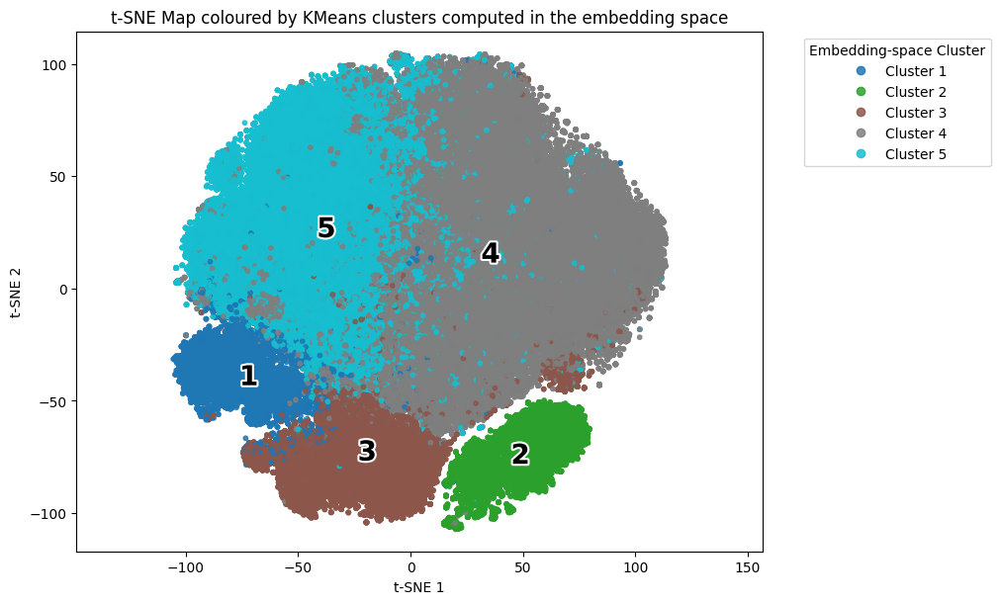

In [104]:
# Cell 7-(1b2) t-SNE coloured by embedding-space clusters + Cluster Numbers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import matplotlib.patheffects as path_effects  # ── 추가: path_effects 모듈 임포트

print("Subtitle: t-SNE coloured by embedding-space clusters")

# 0) 군집 라벨 준비 -------------------------------------------------------------
if "cluster_id_k" not in df_pred.columns:
    K = 5  # ── 기본 군집 수
    km = KMeans(n_clusters=K, n_init=10, random_state=42)
    df_pred["cluster_id_k"] = km.fit_predict(X_all)
else:
    K = int(df_pred["cluster_id_k"].max()) + 1

# 1) t-SNE 좌표 확보 ------------------------------------------------------------
if not {"tSNE1", "tSNE2"}.issubset(df_pred.columns):
    assert "X_tsne" in globals() and isinstance(X_tsne, np.ndarray), "X_tsne is missing. Run Cell 7-(1a)."
    assert X_tsne.shape[1] >= 2, f"X_tsne has shape {X_tsne.shape}, need at least 2 columns."
    df_pred["tSNE1"] = X_tsne[:, 0]
    df_pred["tSNE2"] = X_tsne[:, 1]

# 2) 플롯 데이터 구성 ------------------------------------------------------------
coords = df_pred[["tSNE1", "tSNE2"]].to_numpy()
labels = df_pred["cluster_id_k"].to_numpy()

# 3) 시각화 --------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)  # 정사각형 figure
scatter = ax.scatter(
    coords[:, 0], coords[:, 1],
    c=labels, cmap="tab10", s=10, alpha=0.85
)

# ── 범례: legend를 플롯 밖으로 이동
handles, _ = scatter.legend_elements(prop="colors", alpha=0.85)
legend_labels = [f"Cluster {i}" for i in range(1, K+1)]
ax.legend(
    handles[:K], legend_labels,
    title="Embedding-space Cluster",
    bbox_to_anchor=(1.05, 1), loc="upper left"
)

# ── 클러스터 번호를 중심에 표시 (1부터 시작)
for cid in range(K):
    idx = np.where(labels == cid)[0]
    if idx.size == 0:
        continue
    cx, cy = coords[idx, 0].mean(), coords[idx, 1].mean()
    ax.text(
        cx, cy, str(cid+1), fontsize=20, weight="bold", color="black",
        ha="center", va="center",
        path_effects=[path_effects.withStroke(linewidth=3, foreground="white")]
    )

# ── 좌우 비율 동일
ax.set_aspect('equal', adjustable='datalim')

# ── 축 라벨, 제목
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")
ax.set_title("t-SNE Map coloured by KMeans clusters computed in the embedding space")

plt.show()


In [105]:
# Cell 7-(1b2)-DICT-EXT (FULL): AI keyword dictionary (base + recent) and compiler
import re

# ---------------------------------------------------------------------
# 0) Base dictionary (your original + 보강된 기본 키워드)
#    - 중복/겹침 최소화를 위해 단어경계 \b, 대소문자 무시용 re.IGNORECASE
#    - 요청하신 classic 키워드(Deep learning, NLP, Object detection, Pose estimation,
#      GPU, Inference, Image segmentation, Text-to-image, Text generation 등) 포함
# ---------------------------------------------------------------------
ai_terms_en = {
    # === Core LLM/GenAI ===
    "transformer": r"\btransformer(s)?\b",
    "attention": r"\b(self[-\s]?attention|multi[-\s]?head[-\s]?attention|attention)\b",
    "embedding": r"\bembedding(s)?\b",
    "tokenizer": r"\btokeni[sz]er(s)?\b",
    "inference": r"\binference\b",
    "large language model": r"\blarge\s+language\s+model(s)?\b",
    "LLM": r"\bLLM(s)?\b",
    "diffusion model": r"\bdiffusion\s+model(s)?\b|\bDDPM\b|\bDDIM\b",
    "GAN": r"\bGAN(s)?\b|StyleGAN[23]?|CycleGAN|Pix2Pix|BigGAN",
    "VAE": r"\bVAE\b|variational\s+autoencoder|VQ-?VAE|β-?VAE",
    "autoregressive": r"\bauto[-_\s]?regress(ive|ion)\b|next[-_\s]?token",
    "encoder-decoder": r"\bencoder[-\s]?decoder\b",
    "prompt": r"\bprompt(ing)?\b",
    "retrieval augmented generation": r"\bretrieval[-\s]?augmented\s+generation\b|\bRAG\b",
    "fine-tuning": r"\bfine[-\s]?tuning\b",
    "pre-training": r"\bpre[-\s]?training\b",
    "mixture of experts": r"\bmixture[-\s]?of[-\s]?experts\b|\bMoE\b",
    "quantization": r"\bquantization\b",
    "distillation": r"\bdistillation\b",
    "alignment": r"\balignment\s+tuning\b|\bRLHF\b|reinforcement\s+learning\s+from\s+human\s+feedback",

    # === Classic DL & Tasks ===
    "deep learning": r"\bdeep\s+learning\b",
    "nlp": r"\bNLP\b|natural\s+language\s+processing",
    "object detection": r"\bobject\s+detection\b|YOLOv?\d*\b|Faster[-\s]?RCNN\b|RetinaNet\b",
    "pose estimation": r"\bpose\s+estimation\b|OpenPose\b|HRNet\b",
    "image segmentation": r"\bimage\s+segment(?:ation|ing)\b|Mask[-\s]?RCNN\b|DeepLab[vV]?\d?\b|U[-\s]?Net\b",
    "text to image": r"\btext[-\s]?to[-\s]?image\b|\bT2I\b",
    "text generation": r"\btext\s+generation\b",
    "speech recognition": r"\bspeech\s+recognition\b|ASR\b",
    "machine translation": r"\bmachine\s+translation\b|\bMT\b",

    # === Hardware / Infra (classic) ===
    "gpu": r"\bGPU(s)?\b",
    "cuda": r"\bCUDA\b",
}

# ---------------------------------------------------------------------
# 1) 안전 병합 유틸 (패턴 OR 병합, 동일 패턴이면 스킵)
# ---------------------------------------------------------------------
def _safe_merge_dict(dst: dict, src: dict):
    for k, v in src.items():
        if k in dst:
            if v != dst[k] and v not in dst[k]:
                dst[k] = f"(?:{dst[k]})|(?:{v})"
        else:
            dst[k] = v

# ---------------------------------------------------------------------
# 2) 확장 사전 (category_desc 반영 + 최신 트렌드/멀티모달/반도체)
# ---------------------------------------------------------------------
ext_terms = {
    # ---- Models / Pretraining / Checkpoints ----
    "zero-shot":            r"\bzero[-\s]?shot\b",
    "few-shot":             r"\bfew[-\s]?shot\b",
    "frozen checkpoint":    r"\bfrozen\s+(?:base\s+)?checkpoint(s)?\b",
    "checkpoint zoo":       r"\bcheckpoint\s+zoo\b",
    "scaling laws":         r"\bscaling\s+law(s)?\b",
    "chinchilla":           r"\bChinchilla\b",
    "compute-optimal":      r"\bcompute[-\s]?optimal\b",
    "token budget":         r"\btoken\s+budget(s)?\b",
    "data deduplication":   r"\bdata\s+de[-\s]?dup(?:lication)?\b",

    # ---- Tuning / Preference ----
    "instruction tuning":   r"\binstruction[-\s]?tuning\b",
    "RLHF":                 r"\bRLHF\b|reinforcement\s+learning\s+from\s+human\s+feedback",
    "DPO":                  r"\bDPO\b|direct\s+preference\s+optim(?:ization|isation)",
    "ORPO":                 r"\bORPO\b",
    "IPO":                  r"\bIPO\b(?!.{0,10}\binitial\b)",  # Initial Public Offering 오검출 방지
    "KTO":                  r"\bKTO\b",
    "PEFT":                 r"\bPEFT\b|parameter[-\s]?efficient\s+fine[-\s]?tuning",
    "adapter":              r"\badapter(s)?\b|AdapterHub\b",
    "QLoRA":                r"\bQ[-\s]?LoRA\b",

    # ---- Reasoning / Prompting ----
    "chain-of-thought":     r"\bchain[-\s]?of[-\s]?thought\b|\bCoT\b",
    "self-consistency":     r"\bself[-\s]?consistency\b",
    "scratchpad":           r"\bscratchpad\b|\bdeliberate\s+reasoning\b",
    "tool use":             r"\btool[-\s]?use\b|toolformer\b|\bfunction\s+call(?:ing)?\b|\btool\s+call(?:ing)?\b",
    "ReAct":                r"\bReAct\b|reason\+act|reason[-\s]?act",

    # ---- Architecture / Attention / Positional ----
    "decoder-only":         r"\bdecoder[-\s]?only\b",
    "rotary embeddings":    r"\brotary\s+embedding(s)?\b|\bRoPE\b",
    "rope scaling":         r"\bRoPE\s+scal(?:e|ing)\b|NTK[-\s]?aware|YaRN\b",
    "ALiBi":                r"\bALiBi\b|attention\s+with\s+linear\s+bias(es)?",
    "relative position":    r"\brelative\s+position(al)?\s+encod(?:e|ing)s?\b|RPE\b",
    "kv cache":             r"\bK[Vv]\s*cache(s)?\b|\bkey[-\s]?value\s+cache(s)?\b",
    "paged attention":      r"\bpaged[-\s]?attention\b",
    "flashattention":       r"(?<!flash)\bFlashAttention\b|\bFlash[-\s]?Attention\b",
    "multi-query attention":r"\bmulti[-\s]?query\s+attention\b|\bMQA\b",
    "grouped-query attention": r"\bgrouped[-\s]?query\s+attention\b|\bGQA\b",
    "sliding-window attention": r"\bsliding[-\s]?window\s+attention\b",
    "ring attention":       r"\bring\s+attention\b",
    "linear attention":     r"\blinear\s+attention\b|Performer\b|Linformer\b|RetNet\b|FNet\b|Longformer\b|Transformer[-\s]?XL\b",

    # ---- Parallel / Distributed / Training tricks ----
    "tensor parallel":      r"\btensor\s+parallel(ism)?\b",
    "pipeline parallel":    r"\bpipeline\s+parallel(ism)?\b",
    "fsdp":                 r"\bFSDP\b|fully\s+sharded\s+data\s+parallel",
    "deepspeed":            r"\bDeepSpeed\b|ZeRO[-\s]?(1|2|3)\b",
    "activation checkpointing": r"\bactivation\s+checkpoint(?:ing)?\b|gradient\s+checkpoint(?:ing)?\b",
    "megatron-lm":          r"\bMegatron[-\s]?LM\b",

    # ---- Inference / Serving ----
    "vllm":                 r"\bvLLM\b",
    "tensorrt-llm":         r"\bTensorRT[-\s]?LLM\b",
    "tgi":                  r"\bTGI\b|text[-\s]?generation[-\s]?inference\b",
    "triton kernels":       r"\bTriton\b(?!.{0,15}\bserver\b)",  # NVIDIA Triton Server 오검출 방지
    "cuda graphs":          r"\bCUDA\s+graphs?\b",
    "speculative decoding": r"\bspeculative\s+decoding\b|lookahead\s+decoding\b|Medusa\b",
    "exllama":              r"\bExLlama(?:2)?\b",

    # ---- Quantization / Compression ----
    "GPTQ":                 r"\bGPTQ\b",
    "AWQ":                  r"\bAWQ\b",
    "AQLM":                 r"\bAQLM\b",
    "gguf":                 r"\bGGUF\b",

    # ---- Retrieval / RAG / Vectors ----
    "faiss":                r"\bFAISS\b",
    "milvus":               r"\bMilvus\b",
    "pinecone":             r"\bPinecone\b",
    "bm25":                 r"\bBM25\b",
    "colbert":              r"\bColBERT\b",
    "weaviate":             r"\bWeaviate\b",
    "qdrant":               r"\bQdrant\b",
    "chromadb":             r"\bChromaDB\b",

    # ---- Multimodal / Vision / Audio recent ----
    "clip":                 r"\bCLIP\b",
    "llava":                r"\bLLaVA\b",
    "blip-2":               r"\bBLIP[-\s]?2\b",
    "flamingo":             r"\bFlamingo\b",
    "kosmos":               r"\bKosmos[-\s]?\d?\b",
    "siglip":               r"\bSigLIP\b",
    "grounding dino":       r"\bGrounding\s+DINO\b",
    "segment anything":     r"\bSegment\s+Anything\b|\bSAM\b",
    "dino v2":              r"\bDINO[-\s]?v2\b",
    "stable video diffusion": r"\bStable\s+Video\s+Diffusion\b|SVD\b",
    "text to video":        r"\btext[-\s]?to[-\s]?video\b|T2V\b",
    "whisper":              r"\bWhisper\b(?!.{0,10}\bnetworks?\b)",
    "seamlessm4t":          r"\bSeamlessM4T\b",

    # ---- Non-Transformer SSM / Alt architectures ----
    "state space model":    r"\bSSM\b|state\s+space\s+model(s)?\b",
    "mamba":                r"\bMamba\b",
    "rwkv":                 r"\bRWKV\b",
    "hyena":                r"\bHyena\b",

    # ---- Conversation / Policy / Formatting ----
    "guardrail":            r"\bguardrail(s)?\b|guard[-\s]?rails?\b",
    "safety policy":        r"\bsafety\s+policy(ies)?\b|refusal\s+policy\b",
    "json schema":          r"\bJSON\s+schema\b|structured\s+output(s)?\b",
    "dialogue state tracking": r"\bdialogue\s+state\s+tracking\b|\bDST\b",
    "persona":              r"\bpersona\b",

    # ---- Hardware / Semiconductor for AI ----
    "nvlink":               r"\bNVLink\b|NVSwitch\b",
    "pcie gen5":            r"\bPCI[-\s]?E?\s?(?:Gen)?5(\.0)?\b|\bPCIe\s?5\b",
    "hbm3e":                r"\bHBM3E\b|HBM3\b|HBM2E\b",
    "gh200 h200 b200":      r"\bGH200\b|Grace[-\s]?Hopper\b|H200\b|B200\b|Blackwell\b|H100\b|A100\b|L4\b|L40S\b",
    "mi300x":               r"\bMI300X\b|MI325X\b",
    "gaudi":                r"\bGaudi[-\s]?(2|3)\b",
    "cowos":                r"\bCoWoS\b|chiplet(s)?\b|interposer\b",
}

# 병합
_safe_merge_dict(ai_terms_en, ext_terms)

# ---------------------------------------------------------------------
# 3) 충돌/겹침 완화: 'attention'에서 FlashAttention 등 구체 변종 제외
# ---------------------------------------------------------------------
if "attention" in ai_terms_en:
    ai_terms_en["attention"] = (
        r"(?:(?:self[-\s]?attention|multi[-\s]?head[-\s]?attention)"
        r"|(?<!flash)attention)\b"
    )

# ---------------------------------------------------------------------
# 4) 정규식 컴파일
# ---------------------------------------------------------------------
ai_patterns = {k: re.compile(v, re.IGNORECASE) for k, v in ai_terms_en.items()}

# ---------------------------------------------------------------------
# 5) 상·하위 키워드 중복 카운트 차감 유틸 (선택 사용)
# ---------------------------------------------------------------------
overlap_groups = {
    # 상위 'attention'에서 하위 변종들 차감
    "attention": [
        "flashattention", "multi-query attention", "grouped-query attention",
        "sliding-window attention", "ring attention", "linear attention"
    ],
    # 상위 'quantization'에서 구체 기법 차감
    "quantization": ["GPTQ", "AWQ", "AQLM", "QLoRA"],
    # 상위 'retrieval augmented generation'에서 구성요소 차감 예시
    "retrieval augmented generation": ["faiss", "milvus", "pinecone", "bm25", "colbert", "weaviate", "qdrant", "chromadb"],
    # 상위 'multimodal' 대표(clip)에서 세부 모델 차감 예시
    "clip": ["llava", "blip-2", "flamingo", "kosmos", "siglip"],
}

def apply_nonoverlap(counter_dict, groups=overlap_groups):
    """
    Counter(dict) 형태에서 상위 키에서 하위 키 빈도를 차감해 중복 카운트 축소.
    사용 예:
        from collections import Counter
        raw = Counter({"attention": 20, "flashattention": 7})
        cleaned = apply_nonoverlap(raw)
    """
    from collections import Counter
    c = Counter(counter_dict)
    for parent, childs in groups.items():
        if parent not in c:
            continue
        for ch in childs:
            if ch in c:
                c[parent] = max(0, c[parent] - c[ch])
    return dict(c)

print(f"[INFO] ai_terms_en size = {len(ai_terms_en)}; ai_patterns compiled.")


[INFO] ai_terms_en size = 121; ai_patterns compiled.


In [106]:
# Cell 7-(5a4): Top-5 AI keywords per cluster (using ai_patterns + nonoverlap)
from collections import Counter
import numpy as np
import pandas as pd

print("Subtitle: Top-5 AI keywords per cluster (non-overlapping)")

# -----------------------------
# 0) 사전 점검
# -----------------------------
assert "cluster_id_k" in df_pred.columns, "'cluster_id_k' column not found in df_pred."
assert "tac_text" in df_expl3.columns, "'tac_text' column not found in df_expl3."
assert 'ai_patterns' in globals(), "ai_patterns is not defined. Run the dictionary cell first."

# df_pred 인덱스와 df_expl3 인덱스가 같은 기준(행 정렬)인지 확인
if not df_pred.index.equals(df_expl3.index):
    # 가능한 한 보수적으로, 공통 인덱스 교집합에 맞춰 정렬/슬라이스
    common_idx = df_pred.index.intersection(df_expl3.index)
    if len(common_idx) == 0:
        raise RuntimeError("df_pred and df_expl3 have no overlapping indices.")
    df_pred_use = df_pred.loc[common_idx]
    texts_all   = df_expl3.loc[common_idx, "tac_text"].astype(str).fillna("")
else:
    df_pred_use = df_pred
    texts_all   = df_expl3["tac_text"].astype(str).fillna("")

# -----------------------------
# 1) 유틸: 텍스트에서 사전 기반 카운트
# -----------------------------
def count_ai_terms(texts, patterns_dict):
    cnt = Counter()
    for txt in texts:
        for term, pat in patterns_dict.items():
            hits = len(pat.findall(txt))
            if hits:
                cnt[term] += hits
    return cnt

# -----------------------------
# 2) 클러스터별 집계 + 중복(상/하위) 차감 + Top-5 추출
# -----------------------------
cluster_ids = sorted(df_pred_use["cluster_id_k"].unique())
results = {}

for cid in cluster_ids:
    idx_sel = df_pred_use.index[df_pred_use["cluster_id_k"] == cid]
    if len(idx_sel) == 0:
        results[cid] = []
        continue

    subset_texts = texts_all.loc[idx_sel]
    raw_counter  = count_ai_terms(subset_texts, ai_patterns)

    # 상/하위 겹침 차감(사전 셀에서 정의한 apply_nonoverlap 사용)
    if 'apply_nonoverlap' in globals():
        cleaned = apply_nonoverlap(raw_counter)
        counter = Counter(cleaned)
    else:
        counter = raw_counter

    top5 = counter.most_common(5)
    results[cid] = top5

# -----------------------------
# 3) 출력 (라벨은 1부터 표기)
# -----------------------------
for cid in cluster_ids:
    shown_id = int(cid) + 1
    print(f"\nCluster {shown_id} — Top 5 AI Keywords")
    top5 = results.get(cid, [])
    if not top5:
        print(" (No keywords found)")
    else:
        for term, freq in top5:
            print(f"  - {term}: {freq}")


Subtitle: Top-5 AI keywords per cluster (non-overlapping)

Cluster 1 — Top 5 AI Keywords
  - relative position: 301
  - embedding: 291
  - distillation: 274
  - deep learning: 170
  - rotary embeddings: 145

Cluster 2 — Top 5 AI Keywords
  - GAN: 507
  - attention: 205
  - nlp: 199
  - speech recognition: 189
  - deep learning: 173

Cluster 3 — Top 5 AI Keywords
  - rotary embeddings: 2767
  - adapter: 2128
  - clip: 1023
  - rope scaling: 451
  - transformer: 450

Cluster 4 — Top 5 AI Keywords
  - speech recognition: 35009
  - attention: 32836
  - embedding: 22407
  - deep learning: 18280
  - nlp: 11788

Cluster 5 — Top 5 AI Keywords
  - attention: 41841
  - deep learning: 32417
  - image segmentation: 17888
  - object detection: 12681
  - embedding: 8585


Summary statistics:


,dist_cluster_cos,cpc_cluster_dist_cos
count,267518.000000,267518.000000
mean,0.319739,0.169485
std,0.093426,0.135681
min,0.008999,0.002604
10%,0.230339,0.036302
25%,0.283976,0.052413
50%,0.330979,0.117140
75%,0.375825,0.280442
90%,0.416977,0.379070
max,0.727530,0.700802


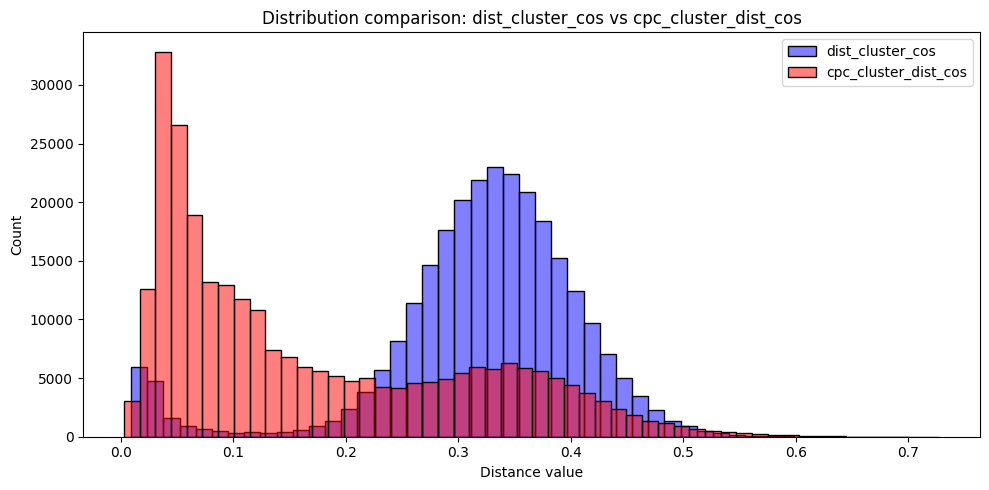

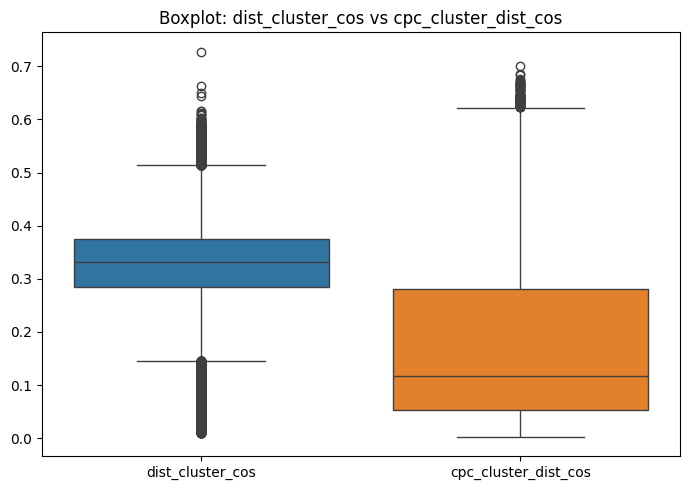

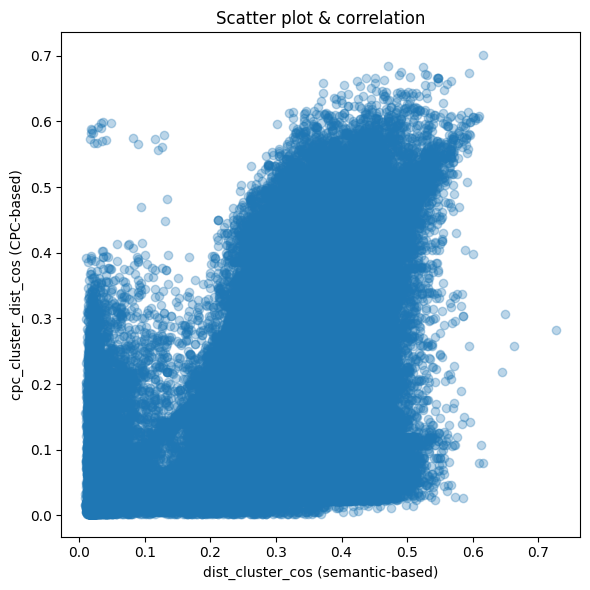

Pearson correlation between dist_cluster_cos and cpc_cluster_dist_cos: 0.374


In [107]:
# === Compare dist_cluster_cos vs cpc_cluster_dist_cos ===
import matplotlib.pyplot as plt
import seaborn as sns

# 1) 두 컬럼이 모두 있는지 확인
cols_to_check = ["dist_cluster_cos", "cpc_cluster_dist_cos"]
for col in cols_to_check:
    if col not in df_pred.columns:
        raise KeyError(f"{col} not found in df_pred")

# 2) 결측 제거
df_comp = df_pred[cols_to_check].dropna().copy()

# 3) 기초 통계
print("Summary statistics:")
display(df_comp.describe(percentiles=[0.1,0.25,0.5,0.75,0.9]))

# 4) 분포 비교 (히스토그램)
plt.figure(figsize=(10,5))
sns.histplot(df_comp["dist_cluster_cos"], bins=50, color="blue", alpha=0.5, label="dist_cluster_cos")
sns.histplot(df_comp["cpc_cluster_dist_cos"], bins=50, color="red", alpha=0.5, label="cpc_cluster_dist_cos")
plt.title("Distribution comparison: dist_cluster_cos vs cpc_cluster_dist_cos")
plt.xlabel("Distance value")
plt.ylabel("Count")
plt.legend()
plt.tight_layout()
plt.show()

# 5) Boxplot 비교
plt.figure(figsize=(7,5))
sns.boxplot(data=df_comp[cols_to_check])
plt.title("Boxplot: dist_cluster_cos vs cpc_cluster_dist_cos")
plt.tight_layout()
plt.show()

# 6) Scatter plot (상관관계 시각화)
plt.figure(figsize=(6,6))
plt.scatter(df_comp["dist_cluster_cos"], df_comp["cpc_cluster_dist_cos"], alpha=0.3)
plt.xlabel("dist_cluster_cos (semantic-based)")
plt.ylabel("cpc_cluster_dist_cos (CPC-based)")
plt.title("Scatter plot & correlation")
plt.tight_layout()
plt.show()

# 7) 상관계수
corr = df_comp["dist_cluster_cos"].corr(df_comp["cpc_cluster_dist_cos"])
print(f"Pearson correlation between dist_cluster_cos and cpc_cluster_dist_cos: {corr:.3f}")


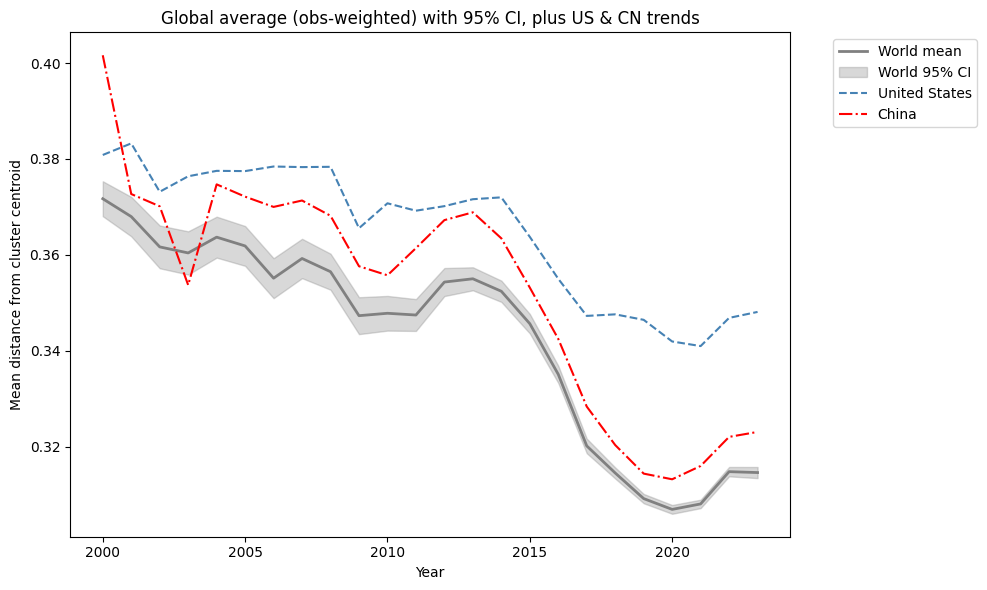

In [108]:
# Cell 7-(1b2) Global Mean (obs-weighted) with 95% CI + US & CN
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# # 0) distance column 선택: dist_cluster_cos 우선
# DIST_COL = (
#     "dist_cluster_cos" if "dist_cluster_cos" in df_pred.columns else
#     ("cpc_cluster_dist_cos" if "cpc_cluster_dist_cos" in df_pred.columns else "cpc_cluster_dist")
# )
# assert DIST_COL in df_pred.columns, f"Missing distance column: {DIST_COL}"

# 0) distance column 고정: dist_cluster_cos
DIST_COL = "dist_cluster_cos"
assert DIST_COL in df_pred.columns, f"Missing distance column: {DIST_COL}"

# 1) year 정수 변환
if df_pred["year"].dtype.kind not in ("i", "u"):
    df_pred["year"] = df_pred["year"].astype(int)

# 2) 글로벌 연도별 평균과 95% CI (관측치 가중)
world_year = (
    df_pred.groupby("year")[DIST_COL]
           .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
           .reset_index()
           .sort_values("year")
)
world_year["se"] = world_year["std"] / np.sqrt(world_year["n"]).replace({0: np.nan})
world_year["ci_lower"] = world_year["mean"] - 1.96 * world_year["se"]
world_year["ci_upper"] = world_year["mean"] + 1.96 * world_year["se"]

# 3) 국가별 연도 평균
country_year = (
    df_pred.groupby(["year", "country_code"])[DIST_COL]
           .mean()
           .reset_index(name="mean_dist")
           .pivot(index="year", columns="country_code", values="mean_dist")
           .sort_index()
)
us = country_year["US"] if "US" in country_year.columns else None
cn = country_year["CN"] if "CN" in country_year.columns else None

# 4) 시각화: y축 자동 스케일
plt.figure(figsize=(10, 6))

# World mean
plt.plot(world_year["year"], world_year["mean"], color="gray", linewidth=2, label="World mean")

# World 95% CI band
plt.fill_between(
    world_year["year"], world_year["ci_lower"], world_year["ci_upper"],
    color="gray", alpha=0.30, label="World 95% CI"
)

# US and CN
if us is not None:
    plt.plot(us.index, us.values, linestyle="--", color="steelblue", label="United States")
if cn is not None:
    plt.plot(cn.index, cn.values, linestyle="-.", color="red", label="China")

plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid")
plt.title("Global average (obs-weighted) with 95% CI, plus US & CN trends")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


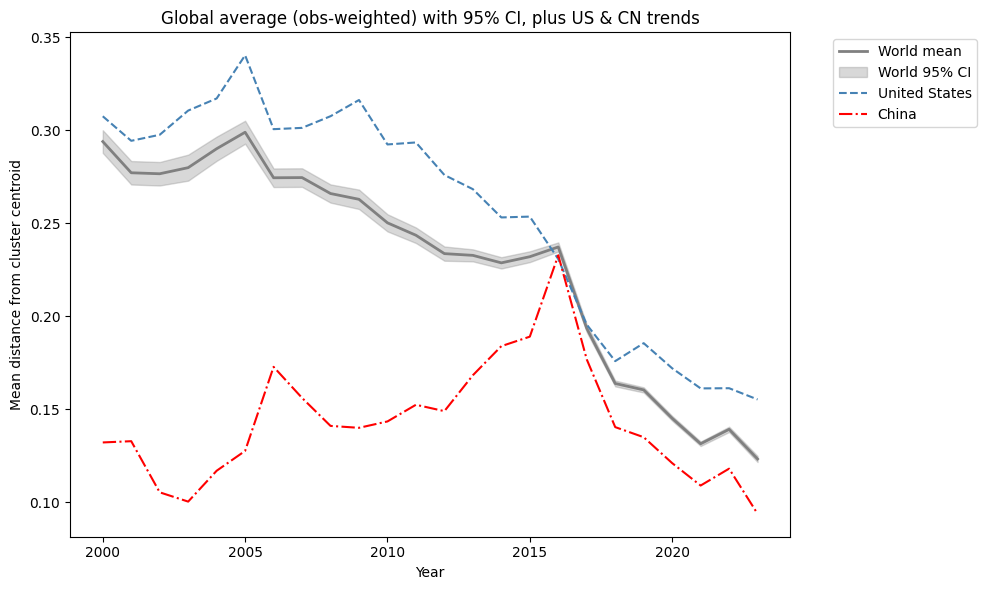

In [109]:
# Cell 7-(1b2) Global Mean (obs-weighted) with 95% CI + US & CN
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# # 0) distance column 선택: dist_cluster_cos 우선
# DIST_COL = (
#     "dist_cluster_cos" if "dist_cluster_cos" in df_pred.columns else
#     ("cpc_cluster_dist_cos" if "cpc_cluster_dist_cos" in df_pred.columns else "cpc_cluster_dist")
# )
# assert DIST_COL in df_pred.columns, f"Missing distance column: {DIST_COL}"

# 0) distance column 고정: cpc_cluster_dist_cos
DIST_COL = "cpc_cluster_dist_cos"
assert DIST_COL in df_pred.columns, f"Missing distance column: {DIST_COL}"

# 1) year 정수 변환
if df_pred["year"].dtype.kind not in ("i", "u"):
    df_pred["year"] = df_pred["year"].astype(int)

# 2) 글로벌 연도별 평균과 95% CI (관측치 가중)
world_year = (
    df_pred.groupby("year")[DIST_COL]
           .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
           .reset_index()
           .sort_values("year")
)
world_year["se"] = world_year["std"] / np.sqrt(world_year["n"]).replace({0: np.nan})
world_year["ci_lower"] = world_year["mean"] - 1.96 * world_year["se"]
world_year["ci_upper"] = world_year["mean"] + 1.96 * world_year["se"]

# 3) 국가별 연도 평균
country_year = (
    df_pred.groupby(["year", "country_code"])[DIST_COL]
           .mean()
           .reset_index(name="mean_dist")
           .pivot(index="year", columns="country_code", values="mean_dist")
           .sort_index()
)
us = country_year["US"] if "US" in country_year.columns else None
cn = country_year["CN"] if "CN" in country_year.columns else None

# 4) 시각화: y축 자동 스케일
plt.figure(figsize=(10, 6))

# World mean
plt.plot(world_year["year"], world_year["mean"], color="gray", linewidth=2, label="World mean")

# World 95% CI band
plt.fill_between(
    world_year["year"], world_year["ci_lower"], world_year["ci_upper"],
    color="gray", alpha=0.30, label="World 95% CI"
)

# US and CN
if us is not None:
    plt.plot(us.index, us.values, linestyle="--", color="steelblue", label="United States")
if cn is not None:
    plt.plot(cn.index, cn.values, linestyle="-.", color="red", label="China")

plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid")
plt.title("Global average (obs-weighted) with 95% CI, plus US & CN trends")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


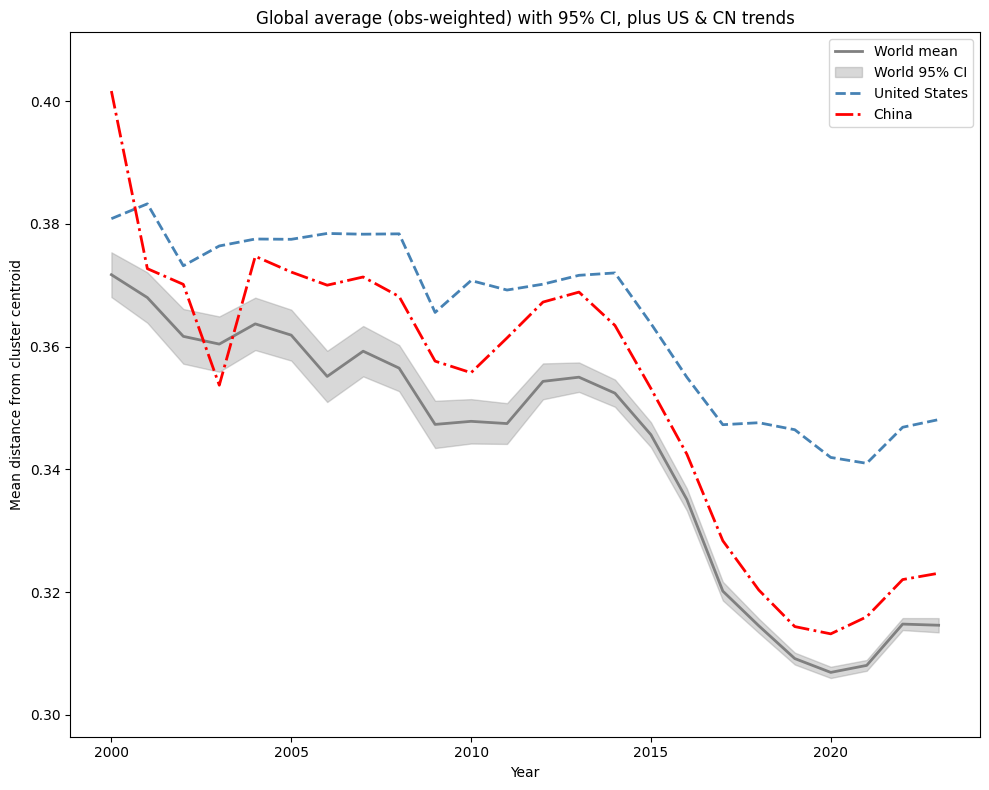

In [110]:
# Cell 7-(1b2) Global Mean (obs-weighted) with 95% CI + US & CN
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 0) distance column 선택
DIST_COL = (
    "dist_cluster_cos" if "dist_cluster_cos" in df_pred.columns else
    ("cpc_cluster_dist_cos" if "cpc_cluster_dist_cos" in df_pred.columns else "cpc_cluster_dist")
)
assert DIST_COL in df_pred.columns, f"Missing distance column: {DIST_COL}"

# 1) year 정수 변환
if df_pred["year"].dtype.kind not in ("i", "u"):
    df_pred["year"] = df_pred["year"].astype(int)

# 2) 글로벌 연도별 평균과 95% CI
world_year = (
    df_pred.groupby("year")[DIST_COL]
           .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
           .reset_index()
           .sort_values("year")
)
world_year["se"] = world_year["std"] / np.sqrt(world_year["n"]).replace({0: np.nan})
world_year["ci_lower"] = world_year["mean"] - 1.96 * world_year["se"]
world_year["ci_upper"] = world_year["mean"] + 1.96 * world_year["se"]

# 3) 국가별 연도 평균
country_year = (
    df_pred.groupby(["year", "country_code"])[DIST_COL]
           .mean()
           .reset_index(name="mean_dist")
           .pivot(index="year", columns="country_code", values="mean_dist")
           .sort_index()
)
us = country_year["US"] if "US" in country_year.columns else None
cn = country_year["CN"] if "CN" in country_year.columns else None

# 4) 시각화
plt.figure(figsize=(10, 8))

# World mean (회색 실선 + CI)
plt.plot(world_year["year"], world_year["mean"], color="gray", linewidth=2, label="World mean")
plt.fill_between(world_year["year"], world_year["ci_lower"], world_year["ci_upper"],
                 color="gray", alpha=0.3, label="World 95% CI")

# United States (파란 점선)
if us is not None:
    plt.plot(us.index, us.values, linestyle="--", color="steelblue", linewidth=2, label="United States")

# China (빨간 일점쇄선)
if cn is not None:
    plt.plot(cn.index, cn.values, linestyle="-.", color="red", linewidth=2, label="China")

# y축: 데이터 값 범위에 맞춤
vals = np.concatenate([
    world_year[["mean","ci_lower","ci_upper"]].to_numpy().ravel(),
    us.values if us is not None else [],
    cn.values if cn is not None else []
]).astype(float)
vals = vals[np.isfinite(vals)]
ymin, ymax = vals.min(), vals.max()
margin = (ymax - ymin) * 0.1 if ymax > ymin else 0.02
plt.ylim(ymin - margin, ymax + margin)

plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid")
plt.title("Global average (obs-weighted) with 95% CI, plus US & CN trends")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()


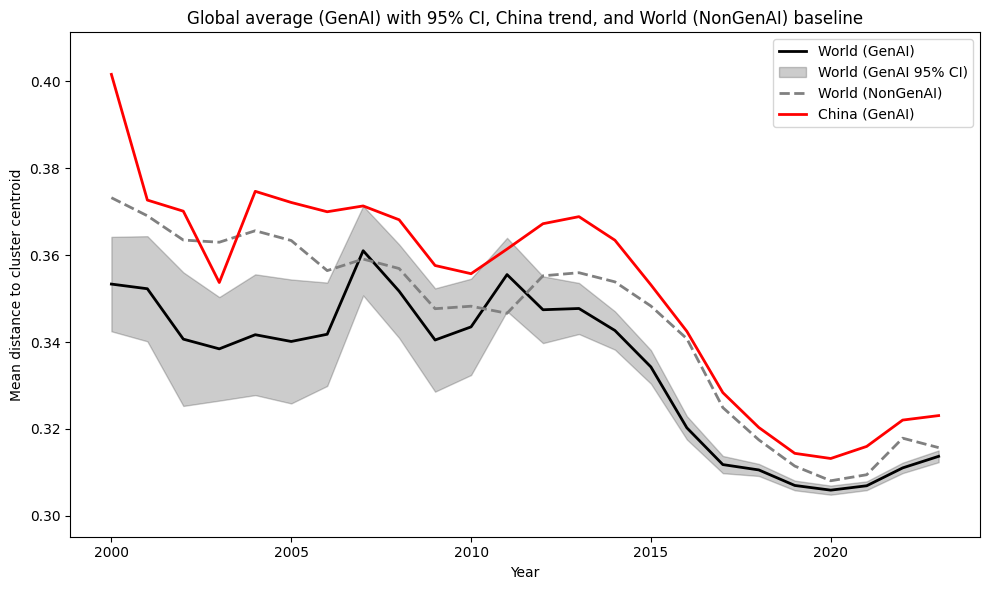

In [111]:
# Cell 7-(1b3) Global Mean (obs-weighted) with 95% CI, plus CN Trend
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 0) metric column 자동 선택
metric_col = (
    "dist_cluster_cos" if "dist_cluster_cos" in df_pred.columns else
    ("cpc_cluster_dist_cos" if "cpc_cluster_dist_cos" in df_pred.columns else "cpc_cluster_dist")
)
assert metric_col in df_pred.columns, f"Missing distance column: {metric_col}"

# 1) ensure year is integer
if df_pred["year"].dtype.kind not in ("i", "u"):
    df_pred["year"] = df_pred["year"].astype(int)

# 2) CN series (연도별 평균)
country_year_dist = (
    df_pred
    .groupby(["year", "country_code"])[metric_col]
    .mean()
    .reset_index(name="mean_cluster_dist")
    .sort_values(["year", "country_code"])
)
pivot = country_year_dist.pivot(index="year", columns="country_code", values="mean_cluster_dist")
cn = pivot["CN"] if "CN" in pivot.columns else None

# 3) Global mean (GenAI만) + 95% CI
df_genai = df_pred[df_pred["genai_pred"] == "GenAI"].copy()
world_year = (
    df_genai
    .groupby("year")[metric_col]
    .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
    .reset_index()
    .sort_values("year")
)
world_year["se"] = world_year["std"] / np.sqrt(world_year["n"]).replace({0: np.nan})
world_year["ci_lower"] = world_year["mean"] - 1.96 * world_year["se"]
world_year["ci_upper"] = world_year["mean"] + 1.96 * world_year["se"]

# 4) Global NonGenAI baseline (회색 점선)
df_nongen = df_pred[df_pred["genai_pred"] == "NonGenAI"].copy()
world_non = (
    df_nongen.groupby("year")[metric_col].mean().reset_index(name="mean")
    if not df_nongen.empty else None
)

# 5) plot
plt.figure(figsize=(10, 6))

# World (GenAI) 검정 실선 + 95% CI
plt.plot(world_year["year"], world_year["mean"], color="black", linewidth=2, label="World (GenAI)")
plt.fill_between(
    world_year["year"], world_year["ci_lower"], world_year["ci_upper"],
    color="black", alpha=0.2, label="World (GenAI 95% CI)"
)

# World (NonGenAI) 회색 점선
if world_non is not None:
    plt.plot(world_non["year"], world_non["mean"], color="gray", linestyle="--", linewidth=2, label="World (NonGenAI)")

# CN 추세 적색 실선
if cn is not None:
    plt.plot(cn.index, cn.values, color="red", linestyle="-", linewidth=2, label="China (GenAI)")

# y축: 데이터 값 범위에 충실
vals = []
vals.extend(world_year[["mean","ci_lower","ci_upper"]].to_numpy().ravel())
if cn is not None:
    vals.extend(cn.values)
if world_non is not None:
    vals.extend(world_non["mean"].to_numpy())
vals = np.array(vals, dtype=float)
vals = vals[np.isfinite(vals)]
ymin, ymax = vals.min(), vals.max()
margin = (ymax - ymin) * 0.1 if ymax > ymin else 0.02
plt.ylim(ymin - margin, ymax + margin)

plt.xlabel("Year")
ylabel = "Mean distance to cluster centroid" if metric_col in ("cpc_cluster_dist", "dist_cluster_cos") \
         else "Mean cosine distance to cluster centroid"
plt.ylabel(ylabel)
plt.title("Global average (GenAI) with 95% CI, China trend, and World (NonGenAI) baseline")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()


## **7-(1c): Create df_cpc_dist from df_pred by copying cluster distances**

Country-level summary over all years (compared to World):


,label,mean,median,std,p90,n
0,China,0.322821,0.323451,0.065298,0.403285,131177
1,Korea,0.185624,0.212430,0.143015,0.363280,21074
2,United States,0.353301,0.357582,0.078316,0.438213,64116
3,World,0.319740,0.330979,0.093426,0.416977,267519



Mean distance of top 10% farthest inventions by country (including World):


,country_code,top10pct_mean,n,label
0,CN,0.434304,131177,China
1,KR,0.406976,21074,Korea
2,US,0.468718,64116,United States
3,WORLD,0.449924,267519,World



Yearly mean distance by country:


label,China,Korea,United States
year,,,
2000,0.401627,0.231834,0.380831
2001,0.372685,0.167331,0.383247
2002,0.370128,0.189471,0.373154
2003,0.353702,0.219265,0.376386
2004,0.374700,0.242517,0.377518
2005,0.372135,0.189993,0.377469
2006,0.369996,0.199801,0.378423
2007,0.371333,0.188354,0.378301
2008,0.368150,0.180274,0.378361



World yearly mean with 95% CI:


,year,mean,ci_low,ci_high,n
0,2000,0.371704,0.368061,0.375347,1444
1,2001,0.367978,0.363868,0.372088,1387
2,2002,0.361658,0.357200,0.366116,1359
3,2003,0.360399,0.355894,0.364905,1229
4,2004,0.363691,0.359421,0.367962,1393
5,2005,0.361858,0.357709,0.366006,1585
6,2006,0.355130,0.350960,0.359299,2045
7,2007,0.359240,0.355135,0.363345,2142
8,2008,0.356482,0.352726,0.360239,2468
9,2009,0.347312,0.343463,0.351162,2425


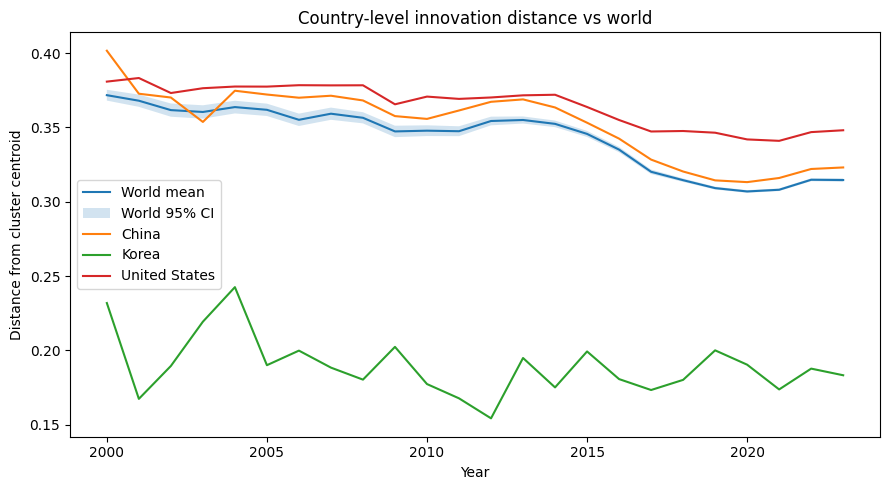


Top countries by mean distance in 2023:


,year,country_code,mean_dist
0,2023,MT,0.454450
1,2023,HR,0.423865
2,2023,LI,0.416505
3,2023,NZ,0.405116
4,2023,ID,0.403158
5,2023,SA,0.400321
6,2023,ZA,0.395242
7,2023,IR,0.395011
8,2023,MY,0.390905
9,2023,VN,0.389612


In [112]:
# Cell 7-(1c): Country-level Innovation Distance (CN · US · KR vs World)
#  목적: 국가 단위(CN, US, KR)의 클러스터 중심거리 분포를 세계 평균 대비 비교하고,
#        연도별 추세와 상위 10% 변방 발명 평균 거리를 분석
#  입력 가정: df_pred에는 ['year', 'country_code', 'dist_cluster_cos'] 컬럼이 존재
#  출력:
#    1) 국가별 요약 테이블(전체 기간)
#    2) 연도별 추세 테이블
#    3) 상위 10% 변방 발명 평균 거리 테이블
#    4) 연도별 라인 플롯(세계 평균 포함)
#  주의: m-dash 미사용, 영국식 영어 표기, 플롯 색상 미지정

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# -----------------------------
# 0) 파라미터
# -----------------------------
DIST_COL = "dist_cluster_cos"          # ── 중심거리 컬럼명
FOCUS_COUNTRIES = ["CN", "US", "KR"]   # ── 비교 대상 국가 코드
COUNTRY_LABEL = {"CN":"China", "US":"United States", "KR":"Korea"}  # ── 라벨 매핑

# -----------------------------
# 1) 기본 전처리
# -----------------------------
need_cols = ["year", "country_code", DIST_COL]
missing = [c for c in need_cols if c not in df_pred.columns]
if missing:
    raise KeyError(f"Missing columns: {missing}")

df_base = (
    df_pred[need_cols]
    .dropna(subset=[DIST_COL, "year", "country_code"])
    .copy()
)

# -----------------------------
# 2) p90 함수 정의
# -----------------------------
def p90(s):
    return np.percentile(np.asarray(s), 90)

# -----------------------------
# 3) 전체 기간 국가별 요약
# -----------------------------
summary_all = (
    df_base
    .groupby("country_code")[DIST_COL]
    .agg(
        mean="mean",
        median="median",
        std=lambda s: s.std(ddof=1),
        p90=p90,
        n="count"
    )
    .reset_index()
)

# 세계 평균 추가
world_row = {
    "country_code": "WORLD",
    "mean": df_base[DIST_COL].mean(),
    "median": df_base[DIST_COL].median(),
    "std": df_base[DIST_COL].std(ddof=1),
    "p90": p90(df_base[DIST_COL].values),
    "n": int(df_base.shape[0]),
}
summary_all = pd.concat([summary_all, pd.DataFrame([world_row])], ignore_index=True)

# 라벨 매핑
def map_label(cc):
    if cc == "WORLD":
        return "World"
    return COUNTRY_LABEL.get(cc, cc)

summary_all["label"] = summary_all["country_code"].map(map_label)

# 관심 국가 + 세계만 표시
summary_focus = summary_all[summary_all["country_code"].isin(FOCUS_COUNTRIES + ["WORLD"])]

print("Country-level summary over all years (compared to World):")
display(
    summary_focus[["label", "mean", "median", "std", "p90", "n"]]
    .sort_values("label")
    .reset_index(drop=True)
)

# -----------------------------
# 4) 국가별 상위 10% 변방 발명 평균 거리
# -----------------------------
top10pct_mean = []

for cty, grp in df_base.groupby("country_code"):
    if grp.shape[0] < 10:
        continue  # 표본이 너무 적으면 제외
    cutoff = np.percentile(grp[DIST_COL], 90)  # p90 경계값
    top10_avg = grp.loc[grp[DIST_COL] >= cutoff, DIST_COL].mean()
    top10pct_mean.append({"country_code": cty, "top10pct_mean": top10_avg, "n": grp.shape[0]})

top10pct_df = pd.DataFrame(top10pct_mean)

# 세계 평균 추가
world_cutoff = np.percentile(df_base[DIST_COL], 90)
world_top10_avg = df_base.loc[df_base[DIST_COL] >= world_cutoff, DIST_COL].mean()
world_row = {"country_code": "WORLD", "top10pct_mean": world_top10_avg, "n": df_base.shape[0]}
top10pct_df = pd.concat([top10pct_df, pd.DataFrame([world_row])], ignore_index=True)

# 라벨 매핑
top10pct_df["label"] = top10pct_df["country_code"].map(map_label).fillna(top10pct_df["country_code"])

print("\nMean distance of top 10% farthest inventions by country (including World):")
display(
    top10pct_df[top10pct_df["country_code"].isin(FOCUS_COUNTRIES + ["WORLD"])]
    .sort_values("label")
    .reset_index(drop=True)
)

# -----------------------------
# 5) 연도별 추세 계산
# -----------------------------
# 국가별 연도 평균
by_cty_year = (
    df_base
    .groupby(["year", "country_code"])[DIST_COL]
    .mean()
    .reset_index(name="mean_dist")
)

# 세계 평균 + 95% CI
world_year = (
    df_base
    .groupby("year")[DIST_COL]
    .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
    .reset_index()
)
world_year["se"] = world_year["std"] / np.sqrt(world_year["n"]).replace({0: np.nan})
world_year["ci_low"] = world_year["mean"] - 1.96 * world_year["se"]
world_year["ci_high"] = world_year["mean"] + 1.96 * world_year["se"]

# 관심 국가 데이터
cty_year_focus = by_cty_year[by_cty_year["country_code"].isin(FOCUS_COUNTRIES)].copy()
cty_year_focus["label"] = cty_year_focus["country_code"].map(map_label)

print("\nYearly mean distance by country:")
display(
    cty_year_focus
    .pivot_table(index="year", columns="label", values="mean_dist")
    .sort_index()
)

print("\nWorld yearly mean with 95% CI:")
display(
    world_year[["year", "mean", "ci_low", "ci_high", "n"]]
    .sort_values("year")
    .reset_index(drop=True)
)

# -----------------------------
# 6) 시각화
# -----------------------------
plt.figure(figsize=(9, 5))

# 세계 평균 라인
plt.plot(world_year["year"], world_year["mean"], label="World mean")

# 세계 95% CI 밴드(alpha만 사용)
plt.fill_between(
    world_year["year"], world_year["ci_low"], world_year["ci_high"],
    alpha=0.2, label="World 95% CI"
)

# 국가별 라인
for lb, g in cty_year_focus.groupby("label"):
    g = g.sort_values("year")
    plt.plot(g["year"], g["mean_dist"], label=lb)

plt.title("Country-level innovation distance vs world")
plt.xlabel("Year")
plt.ylabel("Distance from cluster centroid")
plt.legend()
plt.tight_layout()
plt.show()

# -----------------------------
# 7) 최신 연도 기준 Top-k 국가
# -----------------------------
latest_year = int(df_base["year"].max())
topk_latest = (
    by_cty_year[by_cty_year["year"] == latest_year]
    .sort_values("mean_dist", ascending=False)
    .head(15)
    .reset_index(drop=True)
)
print(f"\nTop countries by mean distance in {latest_year}:")
display(topk_latest)


Summary stats:


,label,mean,median,std,p90,n
0,Korea (GenAI),0.248662,0.276091,0.111762,0.364865,4771
1,World (GenAI),0.310826,0.314549,0.068577,0.388729,90332
2,World (NonGenAI),0.324990,0.341582,0.103588,0.428598,173327



Top 10% farthest inventions:


,label,top10pct_mean,n
0,Korea (GenAI),0.400353,4771
1,World (GenAI),0.416632,90332
2,World (NonGenAI),0.460863,173327


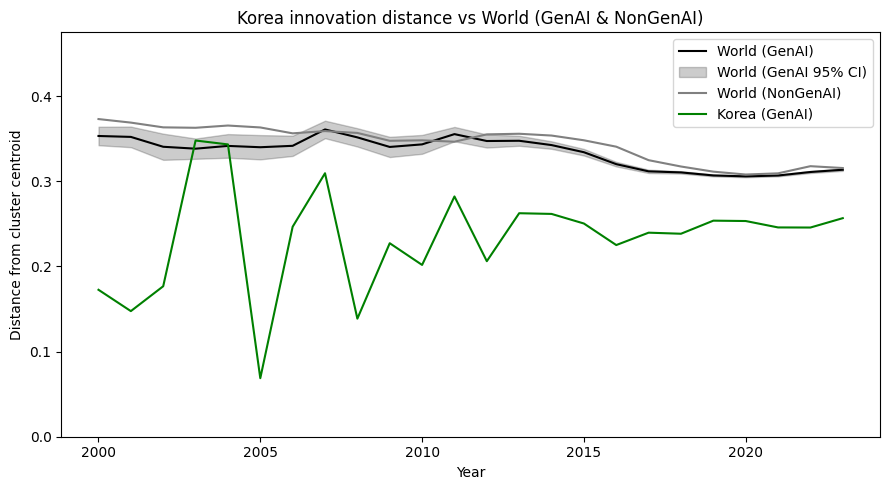

In [113]:
# === Korea vs World (GenAI & NonGenAI) ===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

DIST_COL = "dist_cluster_cos"
FOCUS_COUNTRIES = ["KR"]
COUNTRY_LABEL = {"KR": "Korea"}

# -----------------------------
# 1) 데이터 분리
# -----------------------------
need_cols = ["year","country_code",DIST_COL,"genai_pred"]
missing = [c for c in need_cols if c not in df_pred.columns]
if missing:
    raise KeyError(f"Missing columns: {missing}")

df_genai = (
    df_pred.loc[df_pred["genai_pred"]=="GenAI", ["year","country_code",DIST_COL]]
    .dropna()
    .copy()
)
df_nongen = (
    df_pred.loc[df_pred["genai_pred"]=="NonGenAI", ["year","country_code",DIST_COL]]
    .dropna()
    .copy()
)

# -----------------------------
# 2) 통계 함수
# -----------------------------
def p90(s): return np.percentile(np.asarray(s),90)

def yearly_stats(df,val_col,group_cols):
    out = (
        df.groupby(group_cols)[val_col]
          .agg(mean="mean", std=lambda x: x.std(ddof=1), n="count")
          .reset_index()
    )
    out["se"] = out["std"]/np.sqrt(out["n"]).replace({0:np.nan})
    out["ci_low"] = out["mean"] - 1.96*out["se"]
    out["ci_high"] = out["mean"] + 1.96*out["se"]
    return out

# -----------------------------
# 3) 요약
# -----------------------------
summary = []
kr_df = df_genai[df_genai["country_code"]=="KR"]

summary.append({"label":"Korea (GenAI)","mean":kr_df[DIST_COL].mean(),
                "median":kr_df[DIST_COL].median(),
                "std":kr_df[DIST_COL].std(ddof=1),
                "p90":p90(kr_df[DIST_COL]),
                "n":kr_df.shape[0]})
summary.append({"label":"World (GenAI)","mean":df_genai[DIST_COL].mean(),
                "median":df_genai[DIST_COL].median(),
                "std":df_genai[DIST_COL].std(ddof=1),
                "p90":p90(df_genai[DIST_COL]),
                "n":df_genai.shape[0]})
summary.append({"label":"World (NonGenAI)","mean":df_nongen[DIST_COL].mean(),
                "median":df_nongen[DIST_COL].median(),
                "std":df_nongen[DIST_COL].std(ddof=1),
                "p90":p90(df_nongen[DIST_COL]),
                "n":df_nongen.shape[0]})
summary_df = pd.DataFrame(summary)
print("Summary stats:")
display(summary_df)

# -----------------------------
# 4) Top10%
# -----------------------------
def top10(df,label):
    cutoff = np.percentile(df[DIST_COL],90)
    return {"label":label,"top10pct_mean":df.loc[df[DIST_COL]>=cutoff,DIST_COL].mean(),"n":df.shape[0]}

top10_df = pd.DataFrame([
    top10(kr_df,"Korea (GenAI)"),
    top10(df_genai,"World (GenAI)"),
    top10(df_nongen,"World (NonGenAI)")
])
print("\nTop 10% farthest inventions:")
display(top10_df)

# -----------------------------
# 5) 연도별 통계
# -----------------------------
world_gen = yearly_stats(df_genai,DIST_COL,["year"])
world_non = df_nongen.groupby("year")[DIST_COL].mean().reset_index(name="mean")
kr_year = yearly_stats(kr_df,DIST_COL,["year"])

# -----------------------------
# 6) 플롯
# -----------------------------
plt.figure(figsize=(9,5))

# World (GenAI) 검정 실선 + CI
plt.plot(world_gen["year"],world_gen["mean"],color="black",label="World (GenAI)")
plt.fill_between(world_gen["year"],world_gen["ci_low"],world_gen["ci_high"],color="black",alpha=0.2,label="World (GenAI 95% CI)")

# World (NonGenAI) 회색 실선
plt.plot(world_non["year"],world_non["mean"],color="gray",linestyle="-",label="World (NonGenAI)")

# Korea (GenAI) 녹색 실선
plt.plot(kr_year["year"],kr_year["mean"],color="green",label="Korea (GenAI)")

# y축: 최소값은 항상 0
all_vals = np.concatenate([world_gen[["mean","ci_low","ci_high"]].to_numpy().ravel(),
                           world_non["mean"].to_numpy(),
                           kr_year[["mean","ci_low","ci_high"]].to_numpy().ravel()])
all_vals = all_vals[np.isfinite(all_vals)]
ymin, ymax = 0, all_vals.max()
margin = (ymax-0)*0.1 if ymax>0 else 0.02
plt.ylim(0, ymax+margin)

# 범례 우측 상단
plt.legend(loc="upper right")

plt.title("Korea innovation distance vs World (GenAI & NonGenAI)")
plt.xlabel("Year")
plt.ylabel("Distance from cluster centroid")
plt.tight_layout()
plt.show()


In [114]:
# Cell 7-(1d-0): Yearly stats with 95% CI for world and countries
import numpy as np
import pandas as pd

def yearly_stats(df, value_col, group_cols):
    """그룹(연도 등)별 mean, std, n, se, 95% CI 계산."""
    out = (
        df.groupby(group_cols)[value_col]
          .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
          .reset_index()
    )
    out["se"] = out["std"] / np.sqrt(out["n"]).replace({0: np.nan})
    out["ci_low"] = out["mean"] - 1.96 * out["se"]
    out["ci_high"] = out["mean"] + 1.96 * out["se"]
    return out

# World yearly stats
world_year_stats = yearly_stats(df_base, DIST_COL, ["year"])

# Country-year stats for focus countries
cty_year_stats = (
    df_base[df_base["country_code"].isin(FOCUS_COUNTRIES)]
    .pipe(yearly_stats, value_col=DIST_COL, group_cols=["year", "country_code"])
)
cty_year_stats["label"] = cty_year_stats["country_code"].map(map_label)


Country-level summary over all years (compared to World):


,label,mean,median,std,p90,n
0,China,0.322821,0.323451,0.065298,0.403285,131177
1,Korea,0.185624,0.212430,0.143015,0.363280,21074
2,United States,0.353301,0.357582,0.078316,0.438213,64116
3,World,0.319740,0.330979,0.093426,0.416977,267519



Mean distance of top 10% farthest inventions by country (including World):


,country_code,top10pct_mean,n,label
0,CN,0.434304,131177,China
1,KR,0.406976,21074,Korea
2,US,0.468718,64116,United States
3,WORLD,0.449924,267519,World


[Saved] figures\country_trajectories_with_world_band_2025-09-25_00-09-49.png
[Saved] figures\country_trajectories_with_world_band_2025-09-25_00-09-49.svg


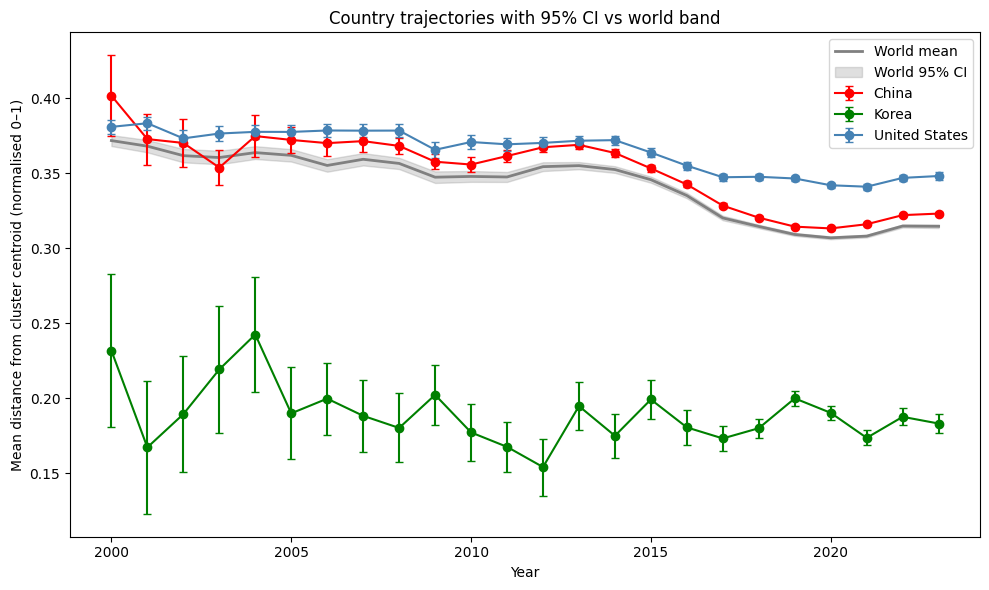

In [115]:
# Cell 7-(1c) + 7-(1d-2) 통합 버전 + 이미지 저장(savefig)
#  목적:
#   1) 국가별 전체 기간 요약(mean, median, std, p90, n)
#   2) 상위 10% 변방 발명 평균 거리
#   3) 연도별 평균 + 95% CI 계산
#   4) 글로벌 평균 및 95% CI 밴드와 국가별 추세 + 오차막대 그래프
#      - 글로벌: 회색
#      - 미국: 파랑
#      - 중국: 빨강
#      - 한국: 초록
#      - y축: 0~1 고정
#   5) 그래프를 PNG, SVG로 저장

import os, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# -----------------------------
# 0) 파라미터
# -----------------------------
DIST_COL = "dist_cluster_cos"          # ── 중심거리 컬럼명
FOCUS_COUNTRIES = ["CN", "US", "KR"]   # ── 비교 대상
COUNTRY_LABEL = {"CN": "China", "US": "United States", "KR": "Korea"}

# 이미지 저장 기본 설정
FIG_DIR = "figures"                    # ── 저장 폴더
os.makedirs(FIG_DIR, exist_ok=True)

def timestamp():
    # ── 파일명에 사용될 타임스탬프, 예: 2025-08-11_18-22-07
    return time.strftime("%Y-%m-%d_%H-%M-%S")

def save_current_fig(basename, dpi=300):
    """
    현재 활성화된 Matplotlib figure를 PNG, SVG로 저장.
    basename에는 확장자 제외한 파일명만 입력.
    """
    ts = timestamp()
    png_path = os.path.join(FIG_DIR, f"{basename}_{ts}.png")
    svg_path = os.path.join(FIG_DIR, f"{basename}_{ts}.svg")
    plt.savefig(png_path, dpi=dpi, bbox_inches="tight")
    plt.savefig(svg_path, bbox_inches="tight")
    print(f"[Saved] {png_path}")
    print(f"[Saved] {svg_path}")

# -----------------------------
# 1) 데이터 전처리
# -----------------------------
need_cols = ["year", "country_code", DIST_COL]
missing = [c for c in need_cols if c not in df_pred.columns]
if missing:
    raise KeyError(f"Missing columns: {missing}")

df_base = (
    df_pred[need_cols]
    .dropna(subset=[DIST_COL, "year", "country_code"])
    .copy()
)

# -----------------------------
# 2) p90 함수
# -----------------------------
def p90(s):
    return np.percentile(np.asarray(s), 90)

# -----------------------------
# 3) 전체 기간 국가별 요약
# -----------------------------
summary_all = (
    df_base
    .groupby("country_code")[DIST_COL]
    .agg(
        mean="mean",
        median="median",
        std=lambda s: s.std(ddof=1),
        p90=p90,
        n="count"
    )
    .reset_index()
)

# 세계 평균 추가
world_row = {
    "country_code": "WORLD",
    "mean": df_base[DIST_COL].mean(),
    "median": df_base[DIST_COL].median(),
    "std": df_base[DIST_COL].std(ddof=1),
    "p90": p90(df_base[DIST_COL].values),
    "n": int(df_base.shape[0]),
}
summary_all = pd.concat([summary_all, pd.DataFrame([world_row])], ignore_index=True)

def map_label(cc):
    if cc == "WORLD":
        return "World"
    return COUNTRY_LABEL.get(cc, cc)

summary_all["label"] = summary_all["country_code"].map(map_label)
summary_focus = summary_all[summary_all["country_code"].isin(FOCUS_COUNTRIES + ["WORLD"])]

print("Country-level summary over all years (compared to World):")
display(
    summary_focus[["label", "mean", "median", "std", "p90", "n"]]
    .sort_values("label")
    .reset_index(drop=True)
)

# -----------------------------
# 4) 국가별 상위 10% 평균 거리
# -----------------------------
top10pct_mean = []
for cty, grp in df_base.groupby("country_code"):
    if grp.shape[0] < 10:
        continue
    cutoff = np.percentile(grp[DIST_COL], 90)  # ── 해당 국가 p90 경계
    top10_avg = grp.loc[grp[DIST_COL] >= cutoff, DIST_COL].mean()
    top10pct_mean.append({"country_code": cty, "top10pct_mean": top10_avg, "n": grp.shape[0]})

top10pct_df = pd.DataFrame(top10pct_mean)

# 세계 평균 추가
world_cutoff = np.percentile(df_base[DIST_COL], 90)
world_top10_avg = df_base.loc[df_base[DIST_COL] >= world_cutoff, DIST_COL].mean()
world_row = {"country_code": "WORLD", "top10pct_mean": world_top10_avg, "n": df_base.shape[0]}
top10pct_df = pd.concat([top10pct_df, pd.DataFrame([world_row])], ignore_index=True)
top10pct_df["label"] = top10pct_df["country_code"].map(map_label).fillna(top10pct_df["country_code"])

print("\nMean distance of top 10% farthest inventions by country (including World):")
display(
    top10pct_df[top10pct_df["country_code"].isin(FOCUS_COUNTRIES + ["WORLD"])]
    .sort_values("label")
    .reset_index(drop=True)
)

# -----------------------------
# 5) 연도별 통계 (mean, std, n, se, CI)
# -----------------------------
def yearly_stats(df, value_col, group_cols):
    # ── 연도 단위 평균과 신뢰구간 계산
    out = (
        df.groupby(group_cols)[value_col]
          .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
          .reset_index()
    )
    out["se"] = out["std"] / np.sqrt(out["n"]).replace({0: np.nan})
    out["ci_low"] = out["mean"] - 1.96 * out["se"]
    out["ci_high"] = out["mean"] + 1.96 * out["se"]
    return out

# 세계 연도별
world_year_stats = yearly_stats(df_base, DIST_COL, ["year"])

# 국가별 연도별
cty_year_stats = (
    df_base[df_base["country_code"].isin(FOCUS_COUNTRIES)]
    .pipe(yearly_stats, value_col=DIST_COL, group_cols=["year", "country_code"])
)
cty_year_stats["label"] = cty_year_stats["country_code"].map(map_label)

# -----------------------------
# 6) 그래프: World band + Country CI, y축 0~1, 이미지 저장
# -----------------------------
plt.figure(figsize=(10, 6))

# 세계 평균 라인 (회색)
plt.plot(world_year_stats["year"], world_year_stats["mean"], color="gray", linewidth=2, label="World mean")

# 세계 95% CI 밴드 (회색 반투명)
plt.fill_between(
    world_year_stats["year"], world_year_stats["ci_low"], world_year_stats["ci_high"],
    color="gray", alpha=0.25, label="World 95% CI"
)

# 국가별 색상 매핑
color_map = {
    "United States": "steelblue",  # ── 파랑
    "China": "red",                # ── 빨강
    "Korea": "green"               # ── 초록
}

# 국가별 오차막대
for lb, g in cty_year_stats.groupby("label"):
    g = g.sort_values("year")
    plt.errorbar(
        g["year"], g["mean"],
        yerr=[g["mean"] - g["ci_low"], g["ci_high"] - g["mean"]],
        fmt="o-", capsize=3,
        color=color_map.get(lb, None),
        label=lb
    )

# Y축 0~1 고정
#plt.ylim(0, 1)

plt.title("Country trajectories with 95% CI vs world band")
plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid (normalised 0–1)")
plt.legend()
plt.tight_layout()

# ── 이미지 저장: PNG, SVG
save_current_fig("country_trajectories_with_world_band")

# 노트북에 표시
plt.show()
plt.close()


Country-level summary over all years, GenAI basis, with World(NonGenAI) baseline:


,label,mean,median,std,p90,n
0,China,0.301961,0.302279,0.054650,0.371154,51734
1,Korea,0.248662,0.276091,0.111762,0.364865,4771
2,United States,0.344077,0.346909,0.064591,0.414609,21792
3,World (GenAI),0.310826,0.314549,0.068577,0.388729,90332
4,World (NonGenAI),0.324990,0.341582,0.103588,0.428598,173327



Mean distance of top 10% farthest inventions, GenAI basis, with World(NonGenAI):


,label,top10pct_mean,n
0,China,0.395385,51734
1,Korea,0.400353,4771
2,United States,0.442233,21792
3,World (GenAI),0.416632,90332
4,World (NonGenAI),0.460863,173327


[Saved] figures\country_trajectories_genai_vs_world_with_nongen_2025-09-25_00-09-50.png
[Saved] figures\country_trajectories_genai_vs_world_with_nongen_2025-09-25_00-09-50.svg


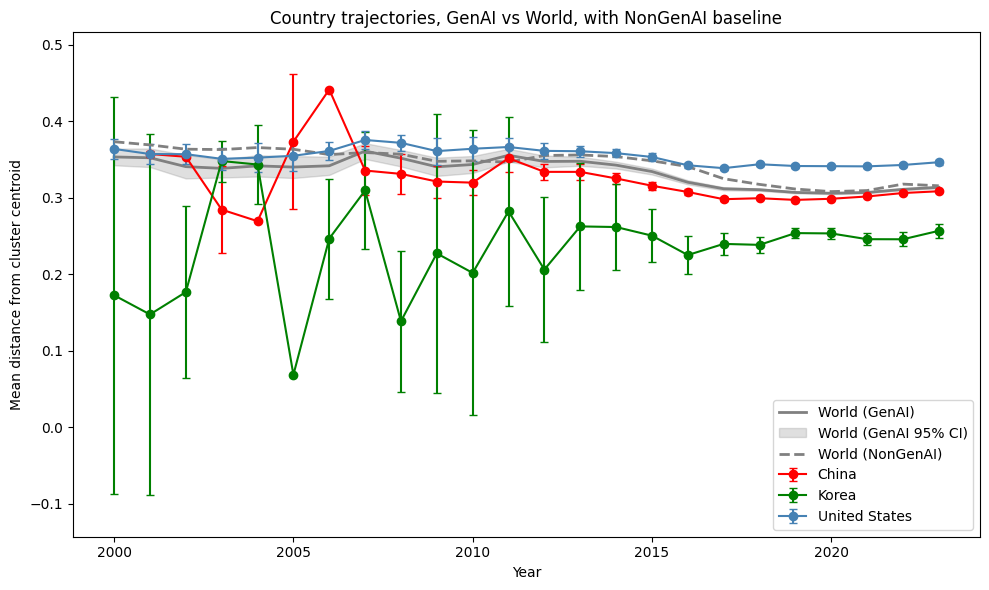

In [116]:
# === Cell 7-(1c)+(1d-2) 통합: GenAI-only 집계 + NonGenAI 베이스라인 + savefig ===
# 목적:
#   1) 국가별 전체 기간 요약(mean, median, std, p90, n), GenAI 기준 + World(NonGenAI) 추가
#   2) 상위 10% 변방 발명 평균 거리, GenAI 기준 + World(NonGenAI) 추가
#   3) 연도별 평균 + 95% CI 계산
#   4) 글로벌 평균(GenAI) 및 95% CI 밴드와 국가별 추세(GenAI) + 오차막대 그래프
#      - World(GenAI): 회색 실선 + 회색 95% CI
#      - 미국: 파랑, 중국: 빨강, 한국: 초록  — 모두 GenAI 기준
#      - World(NonGenAI): 회색 점선
#   5) y축은 데이터 범위에 맞춰 자동 확대
#   6) 그래프를 PNG, SVG로 저장

import os, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# -----------------------------
# 0) 파라미터
# -----------------------------
DIST_COL = "dist_cluster_cos"          # 중심거리 컬럼명 (df_pred에 존재해야 함)
FOCUS_COUNTRIES = ["CN", "US", "KR"]   # 비교 대상
COUNTRY_LABEL = {"CN": "China", "US": "United States", "KR": "Korea"}

# 이미지 저장 기본 설정
FIG_DIR = "figures"
os.makedirs(FIG_DIR, exist_ok=True)

def timestamp():
    return time.strftime("%Y-%m-%d_%H-%M-%S")

def save_current_fig(basename, dpi=300):
    ts = timestamp()
    png_path = os.path.join(FIG_DIR, f"{basename}_{ts}.png")
    svg_path = os.path.join(FIG_DIR, f"{basename}_{ts}.svg")
    plt.savefig(png_path, dpi=dpi, bbox_inches="tight")
    plt.savefig(svg_path, bbox_inches="tight")
    print(f"[Saved] {png_path}")
    print(f"[Saved] {svg_path}")

# -----------------------------
# 1) 데이터 전처리, GenAI/NonGenAI 분리
# -----------------------------
need_cols = ["year", "country_code", DIST_COL, "genai_pred"]
missing = [c for c in need_cols if c not in df_pred.columns]
if missing:
    raise KeyError(f"Missing columns: {missing}")

# GenAI만 분석용
df_genai = (
    df_pred.loc[df_pred["genai_pred"] == "GenAI", ["year", "country_code", DIST_COL]]
    .dropna(subset=[DIST_COL, "year", "country_code"])
    .copy()
)

# NonGenAI는 베이스라인용
df_nongen = (
    df_pred.loc[df_pred["genai_pred"] == "NonGenAI", ["year", "country_code", DIST_COL]]
    .dropna(subset=[DIST_COL, "year", "country_code"])
    .copy()
)

if df_genai.empty:
    raise ValueError("GenAI 데이터가 비어 있습니다. genai_pred 컬럼과 필터를 확인하세요.")

# -----------------------------
# 2) 보조 함수
# -----------------------------
def p90(x):
    return np.percentile(np.asarray(x), 90)

def map_label(cc):
    if cc == "WORLD":
        return "World"
    return COUNTRY_LABEL.get(cc, cc)

def yearly_stats(df, value_col, group_cols):
    out = (
        df.groupby(group_cols)[value_col]
          .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
          .reset_index()
    )
    out["se"] = out["std"] / np.sqrt(out["n"]).replace({0: np.nan})
    out["ci_low"] = out["mean"] - 1.96 * out["se"]
    out["ci_high"] = out["mean"] + 1.96 * out["se"]
    return out

# -----------------------------
# 3) 전체 기간 국가별 요약, GenAI 기준 + World(NonGenAI)
# -----------------------------
summary_all = (
    df_genai
    .groupby("country_code")[DIST_COL]
    .agg(mean="mean", median="median", std=lambda s: s.std(ddof=1), p90=p90, n="count")
    .reset_index()
)

# World(GenAI)
world_row_gen = {
    "country_code": "WORLD",
    "mean": df_genai[DIST_COL].mean(),
    "median": df_genai[DIST_COL].median(),
    "std": df_genai[DIST_COL].std(ddof=1),
    "p90": p90(df_genai[DIST_COL].values),
    "n": int(df_genai.shape[0]),
}

# World(NonGenAI)도 표에 같이 표시
world_row_non = {
    "country_code": "WORLD_NON",
    "mean": df_nongen[DIST_COL].mean() if not df_nongen.empty else np.nan,
    "median": df_nongen[DIST_COL].median() if not df_nongen.empty else np.nan,
    "std": df_nongen[DIST_COL].std(ddof=1) if not df_nongen.empty else np.nan,
    "p90": p90(df_nongen[DIST_COL].values) if not df_nongen.empty else np.nan,
    "n": int(df_nongen.shape[0]) if not df_nongen.empty else 0,
}

summary_all = pd.concat([summary_all, pd.DataFrame([world_row_gen, world_row_non])], ignore_index=True)

label_map_summary = {
    "WORLD": "World (GenAI)",
    "WORLD_NON": "World (NonGenAI)",
}
summary_all["label"] = summary_all["country_code"].apply(lambda cc: label_map_summary.get(cc, map_label(cc)))

summary_focus = summary_all[summary_all["country_code"].isin(FOCUS_COUNTRIES + ["WORLD", "WORLD_NON"])]

print("Country-level summary over all years, GenAI basis, with World(NonGenAI) baseline:")
display(
    summary_focus[["label", "mean", "median", "std", "p90", "n"]]
    .sort_values("label")
    .reset_index(drop=True)
)

# -----------------------------
# 4) 국가별 상위 10% 평균 거리, GenAI 기준 + World(NonGenAI)
# -----------------------------
top10pct_mean = []
for cty, grp in df_genai.groupby("country_code"):
    if grp.shape[0] < 10:
        continue
    cutoff = np.percentile(grp[DIST_COL], 90)
    top10_avg = grp.loc[grp[DIST_COL] >= cutoff, DIST_COL].mean()
    top10pct_mean.append({"country_code": cty, "top10pct_mean": top10_avg, "n": grp.shape[0]})

top10pct_df = pd.DataFrame(top10pct_mean)

# World(GenAI)
world_cutoff_gen = np.percentile(df_genai[DIST_COL], 90)
world_top10_gen = df_genai.loc[df_genai[DIST_COL] >= world_cutoff_gen, DIST_COL].mean()
# World(NonGenAI)
if not df_nongen.empty:
    world_cutoff_non = np.percentile(df_nongen[DIST_COL], 90)
    world_top10_non = df_nongen.loc[df_nongen[DIST_COL] >= world_cutoff_non, DIST_COL].mean()
else:
    world_top10_non = np.nan

rows_world = [
    {"country_code": "WORLD", "top10pct_mean": world_top10_gen, "n": df_genai.shape[0]},
    {"country_code": "WORLD_NON", "top10pct_mean": world_top10_non, "n": df_nongen.shape[0] if not df_nongen.empty else 0},
]
top10pct_df = pd.concat([top10pct_df, pd.DataFrame(rows_world)], ignore_index=True)

# 라벨 매핑
def map_label_top(cc):
    if cc == "WORLD":
        return "World (GenAI)"
    if cc == "WORLD_NON":
        return "World (NonGenAI)"
    return map_label(cc)

top10pct_df["label"] = top10pct_df["country_code"].apply(map_label_top)

print("\nMean distance of top 10% farthest inventions, GenAI basis, with World(NonGenAI):")
display(
    top10pct_df[top10pct_df["country_code"].isin(FOCUS_COUNTRIES + ["WORLD", "WORLD_NON"])]
    .loc[:, ["label", "top10pct_mean", "n"]]
    .sort_values("label")
    .reset_index(drop=True)
)

# -----------------------------
# 5) 연도별 통계, GenAI 기준
# -----------------------------
world_year_stats = yearly_stats(df_genai, DIST_COL, ["year"])

cty_year_stats = (
    df_genai[df_genai["country_code"].isin(FOCUS_COUNTRIES)]
    .pipe(yearly_stats, value_col=DIST_COL, group_cols=["year", "country_code"])
)
cty_year_stats["label"] = cty_year_stats["country_code"].apply(map_label)

# NonGenAI 베이스라인, World만 계산
world_year_nongen = yearly_stats(df_nongen, DIST_COL, ["year"]) if not df_nongen.empty else pd.DataFrame(columns=["year","mean"])

# -----------------------------
# 6) 그래프: World(GenAI) band + Countries(GenAI) + World(NonGenAI) dashed
# -----------------------------
plt.figure(figsize=(10, 6))

# World(GenAI): 실선 + CI
plt.plot(world_year_stats["year"], world_year_stats["mean"], color="gray", linewidth=2, label="World (GenAI)")
plt.fill_between(
    world_year_stats["year"], world_year_stats["ci_low"], world_year_stats["ci_high"],
    color="gray", alpha=0.25, label="World (GenAI 95% CI)"
)

# 국가별 색상
color_map = {
    "United States": "steelblue",
    "China": "red",
    "Korea": "green"
}

# 국가별 추세
for lb, g in cty_year_stats.groupby("label"):
    g = g.sort_values("year")
    plt.errorbar(
        g["year"], g["mean"],
        yerr=[g["mean"] - g["ci_low"], g["ci_high"] - g["mean"]],
        fmt="o-", capsize=3,
        color=color_map.get(lb, None),
        label=lb
    )

# World(NonGenAI): 점선
if not world_year_nongen.empty:
    world_year_nongen = world_year_nongen.sort_values("year")
    plt.plot(
        world_year_nongen["year"], world_year_nongen["mean"],
        color="gray", linestyle="--", linewidth=2, label="World (NonGenAI)"
    )

# y축 자동 확대
all_vals = pd.concat([
    world_year_stats[["mean","ci_low","ci_high"]],
    cty_year_stats[["mean","ci_low","ci_high"]],
    world_year_nongen[["mean"]] if not world_year_nongen.empty else pd.DataFrame({"mean":[]})
], axis=0).values.flatten()

ymin, ymax = np.nanmin(all_vals), np.nanmax(all_vals)
margin = (ymax - ymin) * 0.10 if (ymax - ymin) > 0 else 0.02
plt.ylim(ymin - margin, ymax + margin)

plt.title("Country trajectories, GenAI vs World, with NonGenAI baseline")
plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid")
plt.legend()
plt.tight_layout()

# 저장
save_current_fig("country_trajectories_genai_vs_world_with_nongen")

plt.show()
plt.close()


[Singapore-only] Country-level summary over all years (SG vs World):


,label,mean,median,std,p90,n
0,Singapore,0.334343,0.341648,0.080410,0.421240,793
1,World,0.319740,0.330979,0.093426,0.416977,267519



[Singapore-only] Mean distance of top 10% farthest inventions (SG incl. World):


,country_code,top10pct_mean,n,label
0,SG,0.452235,793,Singapore
1,WORLD,0.449924,267519,World


[Saved] figures\singapore_trajectory_with_world_band_2025-09-25_00-09-51.png
[Saved] figures\singapore_trajectory_with_world_band_2025-09-25_00-09-51.svg


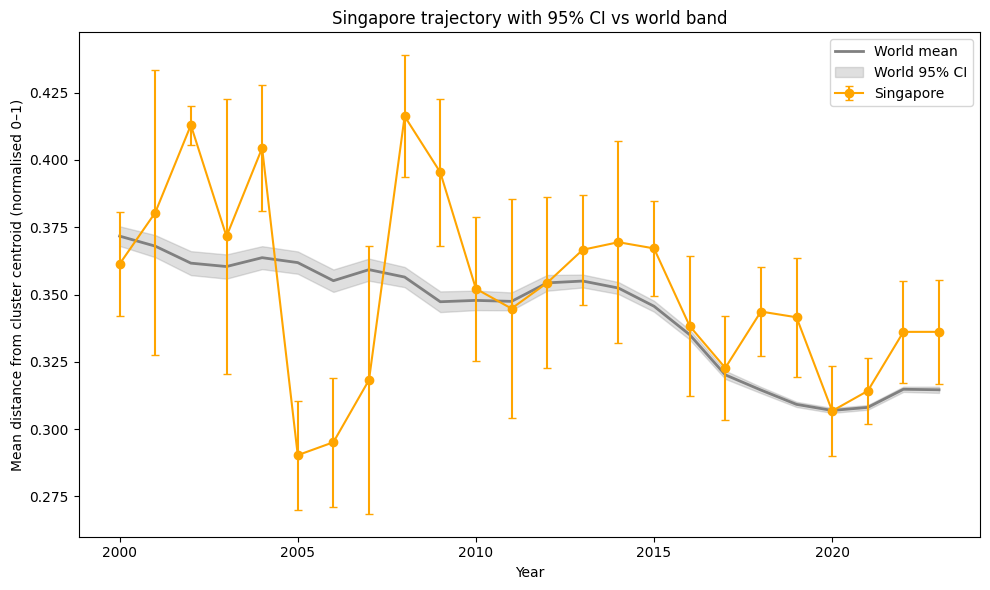

In [117]:
# === Cell 7-(1c)+(1d-2) Singapore only runner ===
# 원본 코드는 수정하지 않고, 비교국을 Singapore 단독으로 실행
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 0) 준비
DIST_COL = "dist_cluster_cos"
_need_cols = ["year", "country_code", DIST_COL]
if "df_base" not in globals():
    if "df_pred" not in globals():
        raise RuntimeError("df_pred가 필요합니다. 먼저 원본 셀을 실행해 df_pred를 준비하세요.")
    _missing = [c for c in _need_cols if c not in df_pred.columns]
    if _missing:
        raise KeyError(f"Missing columns: {_missing}")
    df_base = (
        df_pred[_need_cols]
        .dropna(subset=[DIST_COL, "year", "country_code"])
        .copy()
    )

# 1) 비교 국가 = Singapore 단독
OV_FOCUS_COUNTRIES = ["SG"]
OV_COUNTRY_LABEL = {"SG": "Singapore"}

def _map_label_sg(cc):
    if cc == "WORLD":
        return "World"
    return OV_COUNTRY_LABEL.get(cc, cc)

# 2) 전체 기간 요약
def _p90(s): return np.percentile(np.asarray(s), 90)

summary_all_sg = (
    df_base
    .groupby("country_code")[DIST_COL]
    .agg(
        mean="mean", median="median",
        std=lambda s: s.std(ddof=1), p90=_p90, n="count"
    ).reset_index()
)
world_row_sg = {
    "country_code": "WORLD",
    "mean": df_base[DIST_COL].mean(),
    "median": df_base[DIST_COL].median(),
    "std": df_base[DIST_COL].std(ddof=1),
    "p90": _p90(df_base[DIST_COL].values),
    "n": int(df_base.shape[0]),
}
summary_all_sg = pd.concat([summary_all_sg, pd.DataFrame([world_row_sg])], ignore_index=True)
summary_all_sg["label"] = summary_all_sg["country_code"].map(_map_label_sg)

summary_focus_sg = (
    summary_all_sg[summary_all_sg["country_code"].isin(OV_FOCUS_COUNTRIES + ["WORLD"])]
    .loc[:, ["label", "mean", "median", "std", "p90", "n"]]
    .sort_values("label")
    .reset_index(drop=True)
)

print("[Singapore-only] Country-level summary over all years (SG vs World):")
display(summary_focus_sg)

# 3) 상위 10% 평균 거리
_top10_list = []
for cty, grp in df_base.groupby("country_code"):
    if grp.shape[0] < 10: continue
    cutoff = np.percentile(grp[DIST_COL], 90)
    top10_avg = grp.loc[grp[DIST_COL] >= cutoff, DIST_COL].mean()
    _top10_list.append({"country_code": cty, "top10pct_mean": top10_avg, "n": grp.shape[0]})

top10pct_df_sg = pd.DataFrame(_top10_list)
world_cutoff = np.percentile(df_base[DIST_COL], 90)
world_top10_avg = df_base.loc[df_base[DIST_COL] >= world_cutoff, DIST_COL].mean()
world_row2_sg = {"country_code": "WORLD", "top10pct_mean": world_top10_avg, "n": df_base.shape[0]}
top10pct_df_sg = pd.concat([top10pct_df_sg, pd.DataFrame([world_row2_sg])], ignore_index=True)
top10pct_df_sg["label"] = top10pct_df_sg["country_code"].map(_map_label_sg).fillna(top10pct_df_sg["country_code"])

print("\n[Singapore-only] Mean distance of top 10% farthest inventions (SG incl. World):")
display(
    top10pct_df_sg[top10pct_df_sg["country_code"].isin(OV_FOCUS_COUNTRIES + ["WORLD"])]
    .sort_values("label")
    .reset_index(drop=True)
)

# 4) 연도별 통계와 그래프
def _yearly_stats(df, value_col, group_cols):
    out = (
        df.groupby(group_cols)[value_col]
          .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
          .reset_index()
    )
    out["se"] = out["std"] / np.sqrt(out["n"]).replace({0: np.nan})
    out["ci_low"] = out["mean"] - 1.96 * out["se"]
    out["ci_high"] = out["mean"] + 1.96 * out["se"]
    return out

world_year_stats_sg = _yearly_stats(df_base, DIST_COL, ["year"])
cty_year_stats_sg = (
    df_base[df_base["country_code"].isin(OV_FOCUS_COUNTRIES)]
    .pipe(_yearly_stats, value_col=DIST_COL, group_cols=["year", "country_code"])
)
cty_year_stats_sg["label"] = cty_year_stats_sg["country_code"].map(_map_label_sg)

plt.figure(figsize=(10, 6))

# 세계 평균 및 CI
plt.plot(world_year_stats_sg["year"], world_year_stats_sg["mean"], color="gray", linewidth=2, label="World mean")
plt.fill_between(
    world_year_stats_sg["year"], world_year_stats_sg["ci_low"], world_year_stats_sg["ci_high"],
    color="gray", alpha=0.25, label="World 95% CI"
)

# 싱가포르 색상 = 주황색
plt.errorbar(
    cty_year_stats_sg["year"], cty_year_stats_sg["mean"],
    yerr=[cty_year_stats_sg["mean"] - cty_year_stats_sg["ci_low"],
          cty_year_stats_sg["ci_high"] - cty_year_stats_sg["mean"]],
    fmt="o-", capsize=3,
    color="orange",  # 싱가포르 대표 색
    label="Singapore"
)

plt.title("Singapore trajectory with 95% CI vs world band")
plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid (normalised 0–1)")
plt.legend()
plt.tight_layout()

# 저장
try:
    save_current_fig("singapore_trajectory_with_world_band")
except NameError:
    import os, time
    os.makedirs("figures", exist_ok=True)
    ts = time.strftime("%Y-%m-%d_%H-%M-%S")
    png_path = os.path.join("figures", f"singapore_trajectory_with_world_band_{ts}.png")
    svg_path = os.path.join("figures", f"singapore_trajectory_with_world_band_{ts}.svg")
    plt.savefig(png_path, dpi=300, bbox_inches="tight")
    plt.savefig(svg_path, bbox_inches="tight")
    print(f"[Saved] {png_path}")
    print(f"[Saved] {svg_path}")

plt.show()
plt.close()


[EU27 GenAI] Summary over all years vs World (GenAI & NonGenAI):


,label,mean,median,std,p90,n
0,EU27 (GenAI),0.209891,0.197089,0.120678,0.376236,3626
1,World (GenAI),0.106827,0.063895,0.095458,0.263353,90332
2,World (NonGenAI),0.203284,0.170335,0.142057,0.402852,173326



[EU27 GenAI] Mean distance of top 10% farthest inventions (with NonGenAI baseline):


,label,top10pct_mean,n
0,EU27 (GenAI),0.406418,3626
1,World (GenAI),0.340759,90332
2,World (NonGenAI),0.456227,173326


[Saved] figures\eu27_genai_vs_world_with_nongen_baseline_2025-09-25_00-09-52.png
[Saved] figures\eu27_genai_vs_world_with_nongen_baseline_2025-09-25_00-09-52.svg


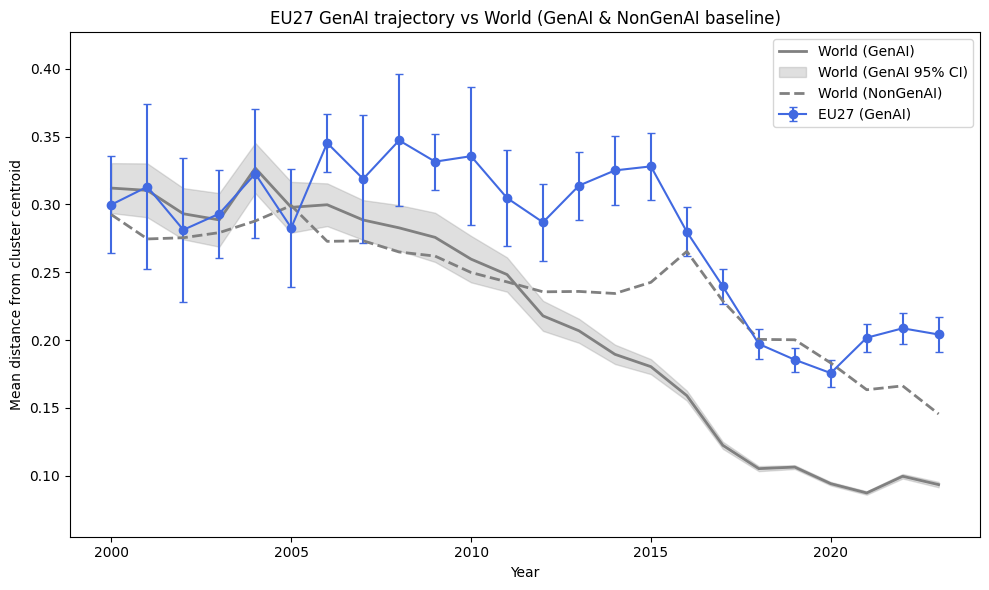

In [118]:
# === EU27 GenAI-only runner + World(GenAI & NonGenAI) baseline ===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 0) 준비
DIST_COL = "cpc_cluster_dist_cos"   # 거리 컬럼
_need_cols = ["year", "country_code", DIST_COL, "genai_pred"]
if "df_pred" not in globals():
    raise RuntimeError("df_pred가 필요합니다. 먼저 df_pred를 준비하세요.")
_missing = [c for c in _need_cols if c not in df_pred.columns]
if _missing:
    raise KeyError(f"Missing columns: {_missing}")

# 1) EU27 코드 집합 (ISO-2), Greece는 GR/EL 둘 다 포함
EU27 = {
    "AT","BE","BG","HR","CY","CZ","DK","EE","FI","FR","DE","GR","EL","HU",
    "IE","IT","LV","LT","LU","MT","NL","PL","PT","RO","SK","SI","ES","SE"
}

# 2) GenAI / NonGenAI 데이터 분리
df_genai = (
    df_pred.query("genai_pred == 'GenAI'")[["year", "country_code", DIST_COL]]
    .dropna()
    .copy()
)
df_nongen = (
    df_pred.query("genai_pred == 'NonGenAI'")[["year", "country_code", DIST_COL]]
    .dropna()
    .copy()
)

# 3) EU27 (GenAI) 데이터
eu_df = df_genai[df_genai["country_code"].isin(EU27)].copy()
if eu_df.empty:
    raise ValueError("EU27의 GenAI 데이터가 없습니다. country_code를 확인하세요.")

# 4) 통계 함수
def _p90(x): return np.percentile(np.asarray(x), 90)
def yearly_stats(df, value_col, group_cols):
    out = (
        df.groupby(group_cols)[value_col]
          .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
          .reset_index()
    )
    out["se"] = out["std"] / np.sqrt(out["n"]).replace({0: np.nan})
    out["ci_low"] = out["mean"] - 1.96 * out["se"]
    out["ci_high"] = out["mean"] + 1.96 * out["se"]
    return out

# 5) 전체 기간 요약 (Summary)
eu_all = {
    "label": "EU27 (GenAI)",
    "mean": eu_df[DIST_COL].mean(),
    "median": eu_df[DIST_COL].median(),
    "std": eu_df[DIST_COL].std(ddof=1),
    "p90": _p90(eu_df[DIST_COL].values),
    "n": int(eu_df.shape[0]),
}
world_gen_all = {
    "label": "World (GenAI)",
    "mean": df_genai[DIST_COL].mean(),
    "median": df_genai[DIST_COL].median(),
    "std": df_genai[DIST_COL].std(ddof=1),
    "p90": _p90(df_genai[DIST_COL].values),
    "n": int(df_genai.shape[0]),
}
world_non_all = {
    "label": "World (NonGenAI)",
    "mean": df_nongen[DIST_COL].mean(),
    "median": df_nongen[DIST_COL].median(),
    "std": df_nongen[DIST_COL].std(ddof=1),
    "p90": _p90(df_nongen[DIST_COL].values),
    "n": int(df_nongen.shape[0]),
}

summary_all = pd.DataFrame([eu_all, world_gen_all, world_non_all])[["label","mean","median","std","p90","n"]]
print("[EU27 GenAI] Summary over all years vs World (GenAI & NonGenAI):")
display(summary_all)

# 6) 상위 10% 평균 거리 (Top10%)
eu_cut = np.percentile(eu_df[DIST_COL], 90)
eu_top10_mean = eu_df.loc[eu_df[DIST_COL] >= eu_cut, DIST_COL].mean()

world_gen_cut = np.percentile(df_genai[DIST_COL], 90)
world_gen_top10 = df_genai.loc[df_genai[DIST_COL] >= world_gen_cut, DIST_COL].mean()

world_non_cut = np.percentile(df_nongen[DIST_COL], 90)
world_non_top10 = df_nongen.loc[df_nongen[DIST_COL] >= world_non_cut, DIST_COL].mean()

top10pct = pd.DataFrame([
    {"label": "EU27 (GenAI)", "top10pct_mean": eu_top10_mean, "n": eu_df.shape[0]},
    {"label": "World (GenAI)", "top10pct_mean": world_gen_top10, "n": df_genai.shape[0]},
    {"label": "World (NonGenAI)", "top10pct_mean": world_non_top10, "n": df_nongen.shape[0]},
])
print("\n[EU27 GenAI] Mean distance of top 10% farthest inventions (with NonGenAI baseline):")
display(top10pct)

# 7) 연도별 통계
world_gen_year = yearly_stats(df_genai, DIST_COL, ["year"])
world_nongen_year = yearly_stats(df_nongen, DIST_COL, ["year"])
eu_year = yearly_stats(eu_df, DIST_COL, ["year"]).sort_values("year")

# 8) 그래프
plt.figure(figsize=(10, 6))

# World GenAI (실선+CI)
plt.plot(world_gen_year["year"], world_gen_year["mean"], color="gray", linewidth=2, label="World (GenAI)")
plt.fill_between(
    world_gen_year["year"], world_gen_year["ci_low"], world_gen_year["ci_high"],
    color="gray", alpha=0.25, label="World (GenAI 95% CI)"
)

# EU27 GenAI (파란색, 오차막대)
plt.errorbar(
    eu_year["year"], eu_year["mean"],
    yerr=[eu_year["mean"] - eu_year["ci_low"], eu_year["ci_high"] - eu_year["mean"]],
    fmt="o-", capsize=3, color="royalblue", label="EU27 (GenAI)"
)

# World NonGenAI (점선)
plt.plot(world_nongen_year["year"], world_nongen_year["mean"],
         color="gray", linestyle="--", linewidth=2, label="World (NonGenAI)")

# y축 자동 조정 (데이터 범위에 맞춤)
all_vals = pd.concat([
    world_gen_year[["mean","ci_low","ci_high"]],
    eu_year[["mean","ci_low","ci_high"]],
    world_nongen_year[["mean"]]
], axis=0).values.flatten()
ymin, ymax = np.nanmin(all_vals), np.nanmax(all_vals)
margin = (ymax - ymin) * 0.1 if (ymax - ymin) > 0 else 0.02
plt.ylim(ymin - margin, ymax + margin)

plt.title("EU27 GenAI trajectory vs World (GenAI & NonGenAI baseline)")
plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid")
plt.legend()
plt.tight_layout()

# 9) 저장
try:
    save_current_fig("eu27_genai_vs_world_with_nongen_baseline")
except NameError:
    import os, time
    os.makedirs("figures", exist_ok=True)
    ts = time.strftime("%Y-%m-%d_%H-%M-%S")
    png_path = os.path.join("figures", f"eu27_genai_vs_world_with_nongen_baseline_{ts}.png")
    svg_path = os.path.join("figures", f"eu27_genai_vs_world_with_nongen_baseline_{ts}.svg")
    plt.savefig(png_path, dpi=300, bbox_inches="tight")
    plt.savefig(svg_path, bbox_inches="tight")
    print(f"[Saved] {png_path}")
    print(f"[Saved] {svg_path}")

plt.show()
plt.close()


[UK GenAI] Summary over all years vs World (GenAI & NonGenAI):


,label,mean,median,std,p90,n
0,United Kingdom (GenAI),0.173859,0.142489,0.098726,0.337472,1411
1,World (GenAI),0.106827,0.063895,0.095458,0.263353,90332
2,World (NonGenAI),0.203284,0.170335,0.142057,0.402852,173326



[UK GenAI] Mean distance of top 10% farthest inventions (with NonGenAI baseline):


,label,top10pct_mean,n
0,United Kingdom (GenAI),0.377726,1411
1,World (GenAI),0.340759,90332
2,World (NonGenAI),0.456227,173326


[Saved] figures\uk_genai_vs_world_with_nongen_baseline_2025-09-25_00-09-53.png
[Saved] figures\uk_genai_vs_world_with_nongen_baseline_2025-09-25_00-09-53.svg


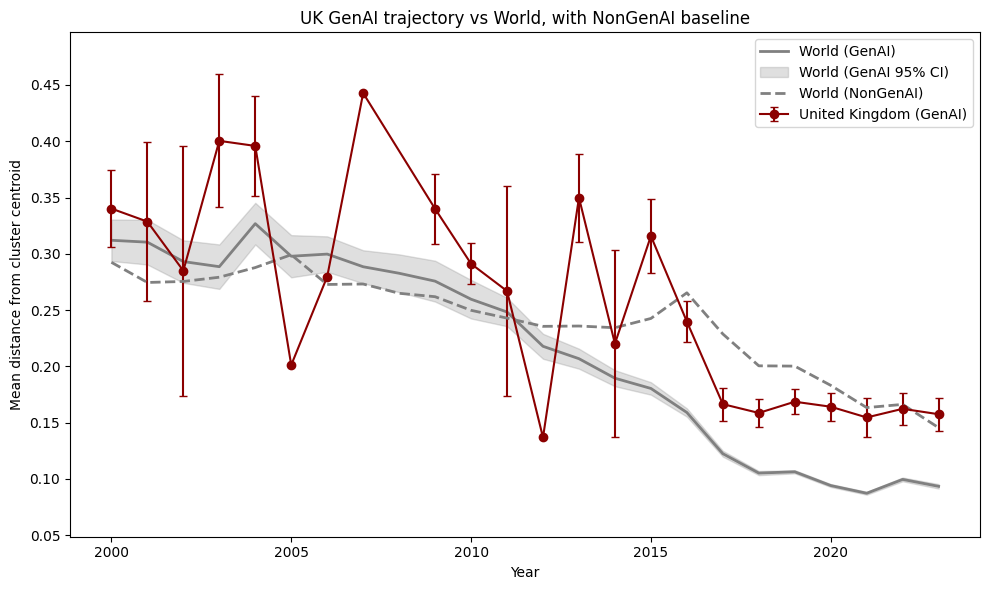

In [119]:
# === UK vs World (GenAI only) + NonGenAI baseline ===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DIST_COL = "cpc_cluster_dist_cos"

# --------------------------
# 1) 데이터 분리
# --------------------------
_need = ["year", "country_code", DIST_COL, "genai_pred"]
_missing = [c for c in _need if c not in df_pred.columns]
if _missing:
    raise KeyError(f"Missing columns: {_missing}")

df_genai = (
    df_pred.query("genai_pred == 'GenAI'")[["year", "country_code", DIST_COL]]
    .dropna()
    .copy()
)

df_nongen = (
    df_pred.query("genai_pred == 'NonGenAI'")[["year", "country_code", DIST_COL]]
    .dropna()
    .copy()
)

# --------------------------
# 2) 통계 함수
# --------------------------
def yearly_stats(df, value_col, group_cols):
    out = (
        df.groupby(group_cols, dropna=False)[value_col]
          .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
          .reset_index()
    )
    out["se"] = out["std"] / np.sqrt(out["n"]).replace({0: np.nan})
    out["ci_low"] = out["mean"] - 1.96 * out["se"]
    out["ci_high"] = out["mean"] + 1.96 * out["se"]
    return out

def _p90(x): 
    return np.percentile(np.asarray(x), 90)

# --------------------------
# 3) World vs UK (GenAI)
# --------------------------
world_genai = yearly_stats(df_genai, DIST_COL, ["year"])
uk_mask = df_genai["country_code"].isin(["GB", "UK"])
uk_df = df_genai.loc[uk_mask].copy()
if uk_df.empty:
    raise ValueError("UK의 GenAI 데이터가 없습니다. country_code가 GB 또는 UK로 들어있는지 확인하세요.")

uk_genai = yearly_stats(uk_df, DIST_COL, ["year"])
uk_genai["label"] = "United Kingdom"

# --------------------------
# 4) World (NonGenAI baseline)
# --------------------------
world_nongen = yearly_stats(df_nongen, DIST_COL, ["year"])

# --------------------------
# 5) Summary 표와 Top10% 표
# --------------------------
summary_rows = [
    {
        "label": "United Kingdom (GenAI)",
        "mean": uk_df[DIST_COL].mean(),
        "median": uk_df[DIST_COL].median(),
        "std": uk_df[DIST_COL].std(ddof=1),
        "p90": _p90(uk_df[DIST_COL].values),
        "n": int(uk_df.shape[0]),
    },
    {
        "label": "World (GenAI)",
        "mean": df_genai[DIST_COL].mean(),
        "median": df_genai[DIST_COL].median(),
        "std": df_genai[DIST_COL].std(ddof=1),
        "p90": _p90(df_genai[DIST_COL].values),
        "n": int(df_genai.shape[0]),
    },
    {
        "label": "World (NonGenAI)",
        "mean": df_nongen[DIST_COL].mean(),
        "median": df_nongen[DIST_COL].median(),
        "std": df_nongen[DIST_COL].std(ddof=1),
        "p90": _p90(df_nongen[DIST_COL].values),
        "n": int(df_nongen.shape[0]),
    },
]
summary_all = pd.DataFrame(summary_rows)[["label","mean","median","std","p90","n"]]
print("[UK GenAI] Summary over all years vs World (GenAI & NonGenAI):")
display(summary_all)

uk_cut = np.percentile(uk_df[DIST_COL], 90)
uk_top10 = uk_df.loc[uk_df[DIST_COL] >= uk_cut, DIST_COL].mean()
world_gen_cut = np.percentile(df_genai[DIST_COL], 90)
world_gen_top10 = df_genai.loc[df_genai[DIST_COL] >= world_gen_cut, DIST_COL].mean()
world_non_cut = np.percentile(df_nongen[DIST_COL], 90)
world_non_top10 = df_nongen.loc[df_nongen[DIST_COL] >= world_non_cut, DIST_COL].mean()

top10pct = pd.DataFrame([
    {"label": "United Kingdom (GenAI)", "top10pct_mean": uk_top10, "n": uk_df.shape[0]},
    {"label": "World (GenAI)", "top10pct_mean": world_gen_top10, "n": df_genai.shape[0]},
    {"label": "World (NonGenAI)", "top10pct_mean": world_non_top10, "n": df_nongen.shape[0]},
])
print("\n[UK GenAI] Mean distance of top 10% farthest inventions (with NonGenAI baseline):")
display(top10pct)

# --------------------------
# 6) 그래프
# --------------------------
plt.figure(figsize=(10,6))

# World (GenAI): 회색 실선 + 95% CI 밴드
plt.plot(world_genai["year"], world_genai["mean"],
         color="gray", linewidth=2, label="World (GenAI)")
plt.fill_between(world_genai["year"], world_genai["ci_low"], world_genai["ci_high"],
                 color="gray", alpha=0.25, label="World (GenAI 95% CI)")

# UK (GenAI): 진한 빨강 실선 + 오차막대
uk_genai = uk_genai.sort_values("year")
plt.errorbar(
    uk_genai["year"], uk_genai["mean"],
    yerr=[uk_genai["mean"] - uk_genai["ci_low"],
          uk_genai["ci_high"] - uk_genai["mean"]],
    fmt="o-", capsize=3, color="darkred", label="United Kingdom (GenAI)"
)

# World (NonGenAI): 회색 점선
plt.plot(world_nongen["year"], world_nongen["mean"],
         color="gray", linestyle="--", linewidth=2, label="World (NonGenAI)")

# y축: 값 구간에 집중
all_vals = pd.concat([
    world_genai[["mean","ci_low","ci_high"]],
    uk_genai[["mean","ci_low","ci_high"]],
    world_nongen[["mean"]]
], axis=0).values.flatten()

ymin, ymax = np.nanmin(all_vals), np.nanmax(all_vals)
margin = (ymax - ymin) * 0.10 if (ymax - ymin) > 0 else 0.02
plt.ylim(ymin - margin, ymax + margin)

plt.title("UK GenAI trajectory vs World, with NonGenAI baseline")
plt.xlabel("Year")
plt.ylabel("Mean distance from cluster centroid")
plt.legend()
plt.tight_layout()

# 저장
try:
    save_current_fig("uk_genai_vs_world_with_nongen_baseline")
except NameError:
    import os, time
    os.makedirs("figures", exist_ok=True)
    ts = time.strftime("%Y-%m-%d_%H-%M-%S")
    png_path = os.path.join("figures", f"uk_genai_vs_world_with_nongen_baseline_{ts}.png")
    svg_path = os.path.join("figures", f"uk_genai_vs_world_with_nongen_baseline_{ts}.svg")
    plt.savefig(png_path, dpi=300, bbox_inches="tight")
    plt.savefig(svg_path, bbox_inches="tight")
    print(f"[Saved] {png_path}")
    print(f"[Saved] {svg_path}")

plt.show()
plt.close()


In [120]:
# Cell 7-(1c): Create df_cpc_dist from Cluster Distance Columns
#  df_pred에서 연·국·CPC·거리 네 컬럼만 복사하여 df_cpc_dist를 생성하고, 중복 행 제거(선택)
# -------------------------------------------------------------------------------------------

# df_pred에서 필요한 컬럼 복사
df_cpc_dist = df_pred[['year', 'country_code', 'cpc_code', 'cpc_cluster_dist_cos']].copy()

# (선택) 완전 중복 행 제거 후 인덱스 재설정
df_cpc_dist = df_cpc_dist.drop_duplicates().reset_index(drop=True)


In [121]:
# Cell 7-(1c1): Frequency of `seed_genai_type_label`
#  seed_genai_type_label 값들의 빈도(개수)를 확인합니다
# -------------------------------------------------------------

df_pred["seed_genai_type_label"].value_counts()


seed_genai_type_label
NonGenAI    176021
LLM          80269
OTHER         8090
GAN           2275
DIFF           513
AR             262
VAE             89
Name: count, dtype: int64

In [122]:
# 빈도와 비율을 함께 표시
df_pred['genai_pred'].value_counts()


genai_pred
NonGenAI     173327
GenAI         90332
Uncertain      3860
Name: count, dtype: int64

## **7-(1d) t‑SNE Subtype Plot**

Subtitle: t-SNE Subtype Plot with square plotting box
[info] ChatGPT (2023) not found. Skipping.


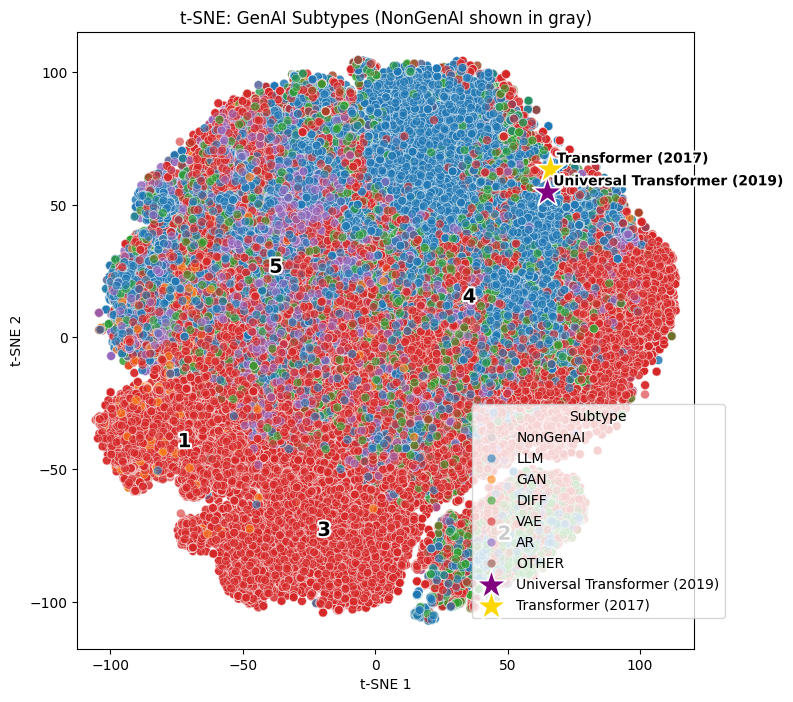

In [123]:
# Cell 7-(1d): t-SNE Subtype Plot + Cluster Numbers + Three Stars
# -----------------------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
import matplotlib.patheffects as pe  # ── 텍스트 외곽선 효과

print("Subtitle: t-SNE Subtype Plot with square plotting box")

# 0) 군집 라벨 준비 ----------------------------------------------------------------
if "cluster_id_k" not in df_pred.columns:
    K = 5
    km = KMeans(n_clusters=K, n_init=10, random_state=42)
    df_pred["cluster_id_k"] = km.fit_predict(X_all)
else:
    K = int(df_pred["cluster_id_k"].max()) + 1

# 1) t-SNE 좌표 보유 확인 -----------------------------------------------------------
#    이전 셀에서 X_tsne을 만들었다고 가정 (X_tsne.shape[1] >= 2)
if not {"tSNE1", "tSNE2"}.issubset(df_pred.columns):
    assert "X_tsne" in globals() and isinstance(X_tsne, np.ndarray), "X_tsne is missing. Run Cell 7-(1a)."
    assert X_tsne.shape[1] >= 2, f"X_tsne has shape {X_tsne.shape}, need at least 2 columns."
    df_pred["tSNE1"] = X_tsne[:, 0]
    df_pred["tSNE2"] = X_tsne[:, 1]

# 2) vis_df에 서브타입 라벨 추가, NA 제거 ------------------------------------------
vis_df["Subtype"] = df_pred["genai_subtype_pred"]
plot_df = vis_df.dropna(subset=["Subtype"]).copy()

# 2-1) plot_df에 cluster 라벨이 없으면 조인
if "cluster_id_k" not in plot_df.columns:
    plot_df = plot_df.join(df_pred["cluster_id_k"], how="left")

# 3) 서브타입 순서와 팔레트 정의 (NonGenAI → 회색) --------------------------------
subtypes = ["NonGenAI", "LLM", "GAN", "DIFF", "VAE", "AR", "OTHER"]
tab10 = sns.color_palette("tab10", n_colors=6)
palette_map = {
    "NonGenAI": "lightgray",
    "LLM":      tab10[0],
    "GAN":      tab10[1],
    "DIFF":     tab10[2],
    "VAE":      tab10[3],
    "AR":       tab10[4],
    "OTHER":    tab10[5],
}

# 4) 산점도 시각화 ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(8, 8))  # 정사각형 캔버스
sns.scatterplot(
    data=plot_df,
    x="tSNE1", y="tSNE2",
    hue="Subtype",
    hue_order=subtypes,
    palette=palette_map,
    alpha=0.6,
    s=40,
    edgecolor="white",
    linewidth=0.4,
    ax=ax
)

ax.set_title("t-SNE: GenAI Subtypes (NonGenAI shown in gray)")
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")

# ── 플롯 박스를 정사각형으로 강제
try:
    ax.set_box_aspect(1)  # Matplotlib 3.3+
except Exception:
    pass
ax.set_aspect('equal', adjustable='datalim')

# 5) 클러스터 번호 표기 -------------------------------------------------------------
for cid in np.unique(df_pred["cluster_id_k"]):
    grp = plot_df.loc[plot_df["cluster_id_k"] == cid, ["tSNE1", "tSNE2"]]
    if len(grp) == 0:
        continue
    cx, cy = grp["tSNE1"].mean(), grp["tSNE2"].mean()
    ax.text(
        cx, cy, str(int(cid) + 1),  # 1부터 시작
        fontsize=14, weight="bold", color="black",
        ha="center", va="center",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

# 6) 강조 표시 유틸 -----------------------------------------------------------------
def _make_id_mask(df, value):
    if "appln_id" in df.columns:
        return (df["appln_id"] == value).values
    elif "appl_id" in df.columns:
        return (df["appl_id"] == value).values
    else:
        return np.zeros(len(df), dtype=bool)

def _highlight(ax, appl_id_val, face_color, label_text):
    mask = _make_id_mask(df_pred, appl_id_val)
    idxs = np.where(mask)[0]
    if len(idxs) == 0:
        print(f"[info] {label_text} not found. Skipping.")
        return
    i0 = idxs[0]
    x, y = df_pred.loc[i0, "tSNE1"], df_pred.loc[i0, "tSNE2"]
    ax.scatter(
        [x], [y], marker="*", s=520, linewidths=1.2,
        edgecolors="white", facecolors=face_color, alpha=1.0,
        label=label_text, zorder=5
    )
    ax.text(
        x + 2.5, y + 2.5, label_text,
        fontsize=10, weight="bold", zorder=6,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

# 7) 세 개의 별 추가 ----------------------------------------------------------------
_highlight(ax, "16/417587", "purple", "Universal Transformer (2019)")
_highlight(ax, "16/021971", "gold",   "Transformer (2017)")
_highlight(ax, "18/183902", "black",  "ChatGPT (2023)")

# 8) 범례를 플롯 밖으로 -------------------------------------------------------------
ax.legend(
    title="Subtype",
    bbox_to_anchor=(1.05, 0.05),
    loc="lower right",
    borderaxespad=0.0
)

plt.tight_layout()
plt.show()


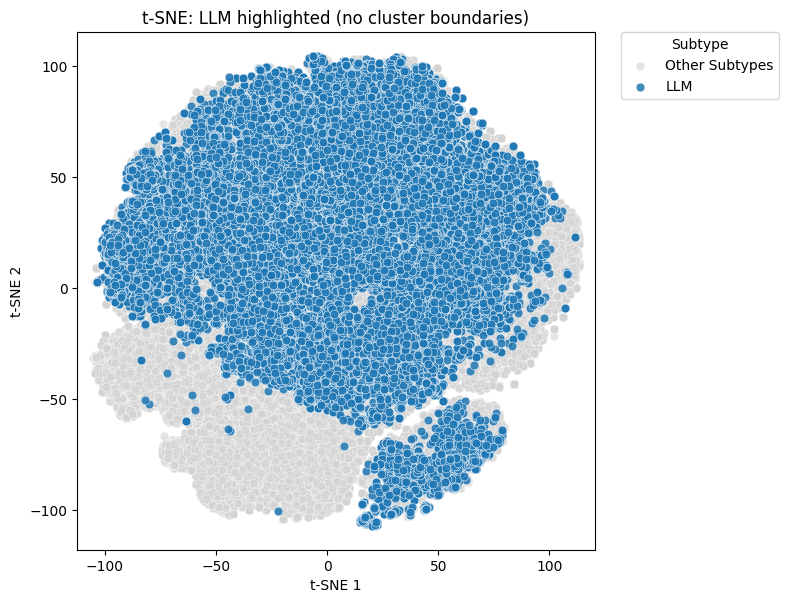

In [124]:
# [Order 16]  Cell 7-(1e2) REVISED: LLM highlight without embedding-space boundaries
#  • LLM 서브타입만 강조, 군집 경계선은 그리지 않음
import numpy as np
import matplotlib.pyplot as plt

# ── 안전성 검증: 필수 열 존재 여부
if "cluster_id_k" not in df_pred.columns:
    raise ValueError("df_pred['cluster_id_k'] is missing. Run Cell 7-(6a) first.")

# ── t-SNE 좌표 준비: df_pred에 없으면 vis_df와 X_tsne로부터 채움
if not {"tSNE1", "tSNE2"}.issubset(df_pred.columns):
    assert "X_tsne" in globals() and isinstance(X_tsne, np.ndarray), "X_tsne is missing. Run Cell 7-(1a)."
    assert X_tsne.shape[1] >= 2, f"X_tsne has shape {X_tsne.shape}, need at least 2 columns."
    df_pred["tSNE1"] = X_tsne[:, 0]
    df_pred["tSNE2"] = X_tsne[:, 1]

# ── plot_df 준비: 없으면 vis_df로부터 생성
if "plot_df" not in globals():
    vis_df["Subtype"] = df_pred["genai_subtype_pred"]
    plot_df = vis_df.dropna(subset=["Subtype"]).copy()
else:
    if "Subtype" not in plot_df.columns:
        plot_df["Subtype"] = df_pred["genai_subtype_pred"]
    plot_df = plot_df.dropna(subset=["Subtype"]).copy()

# ── 군집 라벨을 plot_df에 동기화
plot_df["cluster"] = df_pred["cluster_id_k"].values

# ── 좌표와 마스크
coords_tsne = plot_df[["tSNE1", "tSNE2"]].to_numpy()
mask_llm = (plot_df["Subtype"] == "LLM").to_numpy()

# ── 색상: 기존 palette_map을 사용
llm_color = palette_map["LLM"]

# ── 시각화
fig, ax = plt.subplots(figsize=(8, 8))  # 정사각형 캔버스

# Other subtypes in light grey
ax.scatter(
    coords_tsne[~mask_llm, 0], coords_tsne[~mask_llm, 1],
    c="lightgrey", alpha=0.6, s=40, edgecolors="white", linewidths=0.4,
    label="Other Subtypes", zorder=1
)

# LLM points highlighted
ax.scatter(
    coords_tsne[mask_llm, 0], coords_tsne[mask_llm, 1],
    c=[llm_color], alpha=0.85, s=40, edgecolors="white", linewidths=0.4,
    label="LLM", zorder=2
)

# ── 제목, 축 라벨
ax.set_title("t-SNE: LLM highlighted (no cluster boundaries)")
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")

# ── 플롯 박스를 정사각형으로 강제
try:
    ax.set_box_aspect(1)                  # Matplotlib 3.3+
except Exception:
    pass
ax.set_aspect('equal', adjustable='datalim')

# ── 범례는 플롯 밖에 배치
ax.legend(
    bbox_to_anchor=(1.05, 1), loc="upper left",
    title="Subtype", borderaxespad=0.0
)

plt.tight_layout()
plt.show()


In [125]:
# Cell 7-(1e-1): Country–Year Cluster Diversification Entropy
#  목적: 국가·연도 단위로 클러스터 분포의 엔트로피(H), 정규화 엔트로피(H_norm), 유효 클러스터 수(N_eff) 계산
#  가정: df_pred에 ['year','country_code', <cluster column>]이 존재
#  출력: ent_df (연도·국가별 엔트로피 테이블), focus 국가 테이블 요약

import numpy as np
import pandas as pd

# -----------------------------
# 0) 클러스터 컬럼 자동 선택
# -----------------------------
CANDIDATES = ["cluster_id_k", "cluster_id", "cpc_cluster_id", "cluster"]
CLUST_COL = next((c for c in CANDIDATES if c in df_pred.columns), None)
assert CLUST_COL is not None, f"Missing any cluster column among: {CANDIDATES}"

# 연도 정수 보장
if df_pred["year"].dtype.kind not in ("i", "u"):
    df_pred["year"] = df_pred["year"].astype(int)

# 필요한 컬럼만 사용
need_cols = ["year", "country_code", CLUST_COL]
base = df_pred[need_cols].dropna().copy()

# -----------------------------
# 1) 국가·연도·클러스터별 카운트
# -----------------------------
cty_year_cluster = (
    base
    .groupby(["year", "country_code", CLUST_COL])
    .size()
    .reset_index(name="cnt")
)

# -----------------------------
# 2) 샤논 엔트로피 계산 함수
#    H = -sum p log p,  정규화: H_norm = H / log(K), N_eff = exp(H)
# -----------------------------
def entropy_counts(counts):
    counts = np.asarray(counts, dtype=float)
    n = counts.sum()
    if n <= 0:
        return np.nan, np.nan, 0
    p = counts / n
    # p>0인 항만 고려
    p = p[p > 0]
    H = -np.sum(p * np.log(p))
    K = counts.size
    H_norm = H / np.log(K) if K > 1 else 0.0
    N_eff = float(np.exp(H))
    return H, H_norm, K

# -----------------------------
# 3) 국가·연도 엔트로피 집계
# -----------------------------
records = []
for (yr, cty), grp in cty_year_cluster.groupby(["year", "country_code"]):
    H, H_norm, K = entropy_counts(grp["cnt"].values)
    n_total = int(grp["cnt"].sum())
    records.append({
        "year": int(yr),
        "country_code": cty,
        "H": H,
        "H_norm": H_norm,      # 0~1, 1이면 균등하게 분산, 0이면 한 클러스터에 몰림
        "N_eff": np.exp(H),    # 유효 클러스터 수
        "K": int(K),           # 관측된 고유 클러스터 개수
        "n": n_total           # 해당 연도·국가의 발명 건수
    })

ent_df = pd.DataFrame(records).sort_values(["year", "country_code"]).reset_index(drop=True)

# -----------------------------
# 4) 관심 국가 요약표 (최근연도)
# -----------------------------
FOCUS_COUNTRIES = ["CN", "US", "KR"]
latest_year = int(ent_df["year"].max())
focus_latest = (
    ent_df[ent_df["country_code"].isin(FOCUS_COUNTRIES) & (ent_df["year"] == latest_year)]
    .copy()
)

print(f"Country–year entropy summary in {latest_year}:")
display(
    focus_latest[["country_code", "H_norm", "N_eff", "K", "n"]]
    .sort_values("country_code")
    .reset_index(drop=True)
)


Country–year entropy summary in 2023:


,country_code,H_norm,N_eff,K,n
0,CN,0.535229,2.366515,5,12989
1,KR,0.653227,2.861448,5,1921
2,US,0.599385,2.623930,5,3311


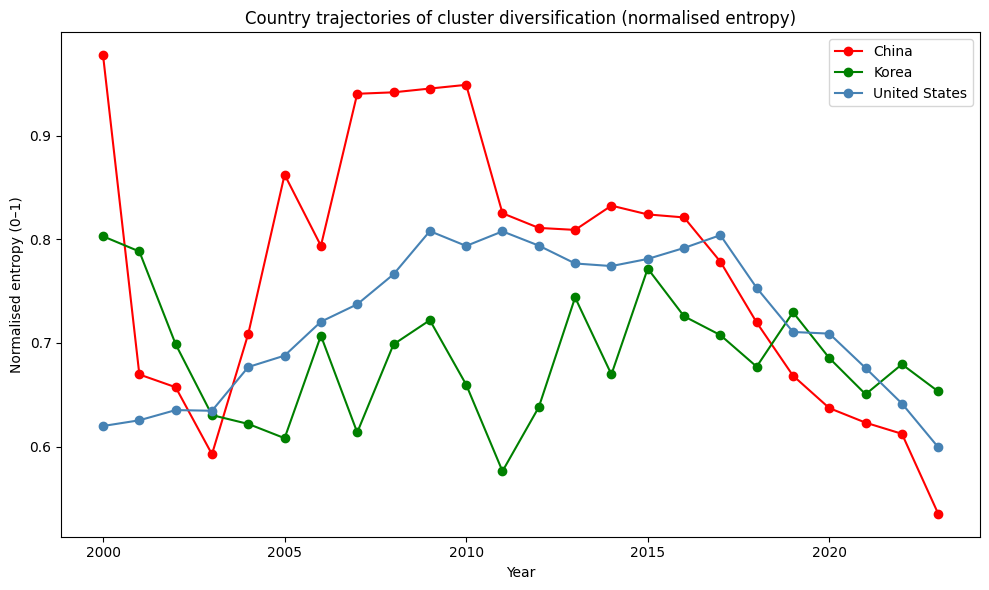

In [126]:
# Cell 7-(1e-2): Country trajectories of normalised entropy (0–1)
#  목적: 중국·미국·한국의 연도별 정규화 엔트로피(H_norm) 추세를 시각화
#  해석: 값이 높을수록 다양한 클러스터에 분산, 값이 낮을수록 소수 클러스터에 집중

import matplotlib.pyplot as plt

# 라벨 매핑
COUNTRY_LABEL = {"CN": "China", "US": "United States", "KR": "Korea"}
ent_plot = ent_df[ent_df["country_code"].isin(COUNTRY_LABEL.keys())].copy()
ent_plot["label"] = ent_plot["country_code"].map(COUNTRY_LABEL)

# 색상 매핑, 이전 스타일과 일관
color_map = {
    "United States": "steelblue",
    "China": "red",
    "Korea": "green"
}

plt.figure(figsize=(10, 6))
for lb, g in ent_plot.groupby("label"):
    g = g.sort_values("year")
    plt.plot(g["year"], g["H_norm"], marker="o", label=lb, color=color_map.get(lb, None))

plt.title("Country trajectories of cluster diversification (normalised entropy)")
plt.xlabel("Year")
plt.ylabel("Normalised entropy (0–1)")
plt.legend()
plt.tight_layout()
plt.show()


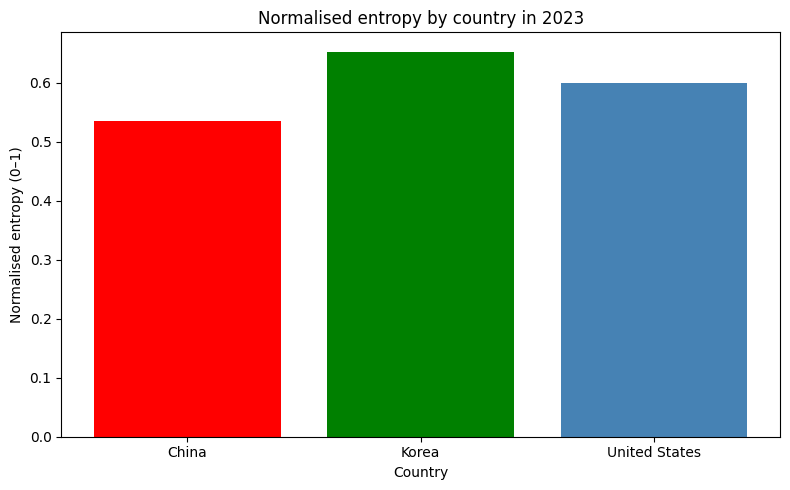

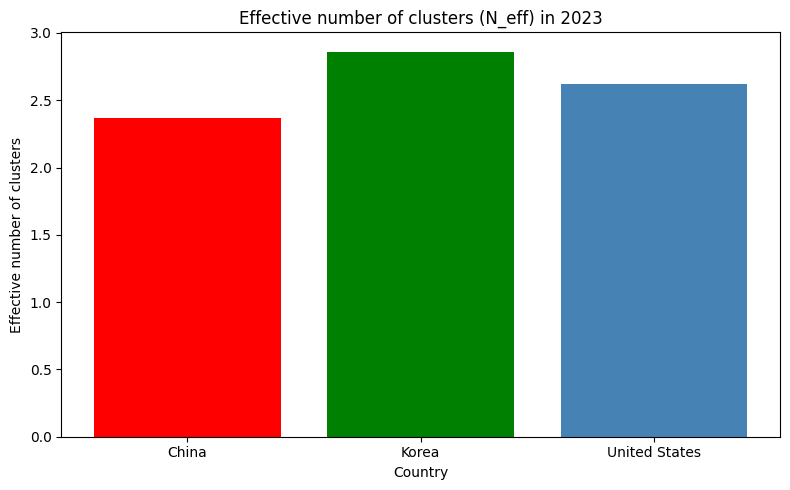

In [127]:
# Cell 7-(1e-3): Latest-year comparison of diversification (H_norm and N_eff)
import matplotlib.pyplot as plt
import numpy as np

COUNTRY_LABEL = {"CN": "China", "US": "United States", "KR": "Korea"}
color_map = {"United States": "steelblue", "China": "red", "Korea": "green"}

latest_year = int(ent_df["year"].max())
latest = (
    ent_df[(ent_df["year"] == latest_year) & (ent_df["country_code"].isin(COUNTRY_LABEL.keys()))]
    .copy()
)
latest["label"] = latest["country_code"].map(COUNTRY_LABEL)
latest = latest.sort_values("label")

# 3a) H_norm bar
plt.figure(figsize=(8, 5))
bars = plt.bar(latest["label"], latest["H_norm"], color=[color_map.get(lb, None) for lb in latest["label"]])
plt.title(f"Normalised entropy by country in {latest_year}")
plt.xlabel("Country")
plt.ylabel("Normalised entropy (0–1)")
plt.tight_layout()
plt.show()

# 3b) N_eff bar
plt.figure(figsize=(8, 5))
bars = plt.bar(latest["label"], latest["N_eff"], color=[color_map.get(lb, None) for lb in latest["label"]])
plt.title(f"Effective number of clusters (N_eff) in {latest_year}")
plt.xlabel("Country")
plt.ylabel("Effective number of clusters")
plt.tight_layout()
plt.show()


In [128]:
# Cell 7-(1e-4): Save the latest figures to ~/Downloads
import os, time
import matplotlib.pyplot as plt

FIG_DIR = os.path.expanduser("~/Downloads")
os.makedirs(FIG_DIR, exist_ok=True)

def _ts():
    return time.strftime("%Y-%m-%d_%H-%M-%S")

def save_current_fig(basename, dpi=300):
    ts = _ts()
    png_path = os.path.join(FIG_DIR, f"{basename}_{ts}.png")
    svg_path = os.path.join(FIG_DIR, f"{basename}_{ts}.svg")
    plt.savefig(png_path, dpi=dpi, bbox_inches="tight")
    plt.savefig(svg_path, bbox_inches="tight")
    print(f"[Saved] {png_path}\n[Saved] {svg_path}")

# 사용 예:
# 1) 위 셀 7-(1e-2) 실행 직후에 곧바로 저장하려면,
# save_current_fig("country_entropy_trajectories")

# 2) 위 셀 7-(1e-3) 각각의 그래프 실행 직후에,
# save_current_fig("country_entropy_latest_Hnorm")
# save_current_fig("country_entropy_latest_Neff")


## **7-(2) t‑SNE LLM Highlight by Period (2000–2023)**

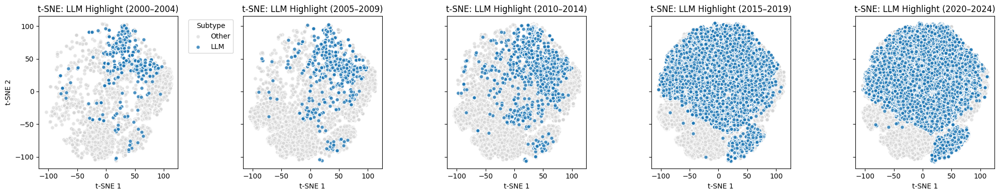

In [129]:
# Cell 7-(2): t-SNE LLM Highlight by Period (2000–2023)
# 5개 기간(5년 단위)별로 t-SNE 좌표에 LLM 서브타입을 강조해 패널 산점도를 그립니다
# ------------------------------------------------------------------------------------

import matplotlib.pyplot as plt

# ── 5년 단위 기간 정의
periods = [
    ("2000–2004", range(2000, 2005)),
    ("2005–2009", range(2005, 2010)),
    ("2010–2014", range(2010, 2015)),
    ("2015–2019", range(2015, 2020)),
    ("2020–2024", range(2020, 2025))
]

# plot_df에 연도 정보 추가
plot_df["year"] = df_pred["year"].values

# LLM 강조 색상
llm_color = palette_map["LLM"]

# 5개의 패널(1행 5열) 생성, 축 공유
fig, axes = plt.subplots(1, len(periods), figsize=(20, 4), sharex=True, sharey=True)

for ax, (title, yrange) in zip(axes, periods):
    # 해당 기간 데이터 필터링
    sub = plot_df[plot_df["year"].isin(yrange)]
    
    # LLM 서브타입 마스크
    mask_llm = sub["Subtype"] == "LLM"
    
    # 비-LLM 점들 회색으로 표시
    ax.scatter(
        sub.loc[~mask_llm, "tSNE1"],
        sub.loc[~mask_llm, "tSNE2"],
        c="lightgray",
        alpha=0.6,
        s=30,
        edgecolor="white",
        label="Other"
    )
    
    # LLM 점들 강조 색상으로 표시
    ax.scatter(
        sub.loc[mask_llm, "tSNE1"],
        sub.loc[mask_llm, "tSNE2"],
        c=[llm_color],
        alpha=0.8,
        s=30,
        edgecolor="white",
        label="LLM"
    )
    
    ax.set_title(f"t-SNE: LLM Highlight ({title})")
    ax.set_xlabel("t-SNE 1")
    if ax is axes[0]:
        ax.set_ylabel("t-SNE 2")
        ax.legend(title="Subtype", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.show()


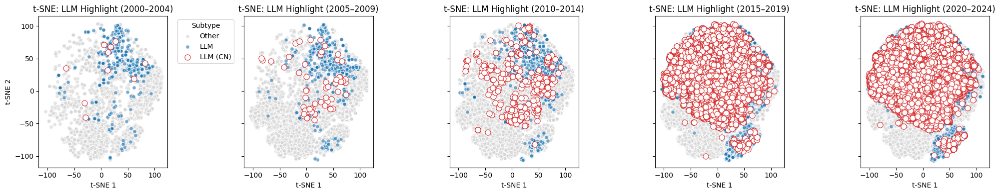

In [130]:
# Cell 7-(2a): t-SNE LLM Highlight by Period (2000–2016 vs 2017–2023)
#  5개 기간별로 t-SNE 산점도에서 LLM 서브타입을 강조하고, 중국(CN) LLM만 별도 표시합니다
# ---------------------------------------------------------------------------------------------------

import matplotlib.pyplot as plt

# 1) 5년 단위 기간 정의
periods = [
    ("2000–2004", range(2000, 2005)),
    ("2005–2009", range(2005, 2010)),
    ("2010–2014", range(2010, 2015)),
    ("2015–2019", range(2015, 2020)),
    ("2020–2024", range(2020, 2025))
]

# 2) 연도 및 국가 정보 vis_df에 추가
plot_df["year"]         = df_pred["year"].values          # ── 출원 연도
plot_df["country_code"] = df_pred["country_code"].values  # ── 국가 코드

# 3) LLM 강조 색상
llm_color = palette_map["LLM"]

# 4) Figure & Axes 설정 (1행 5열, 축 공유)
fig, axes = plt.subplots(1, len(periods), figsize=(20, 4), sharex=True, sharey=True)

# 5) 각 기간별 산점도 그리기
for ax, (title, yrange) in zip(axes, periods):
    sub      = plot_df[plot_df["year"].isin(yrange)]      # ── 해당 기간 데이터
    mask_llm = sub["Subtype"] == "LLM"                    # ── LLM 점 마스크
    mask_cn  = mask_llm & (sub["country_code"] == "CN")   # ── 중국 LLM만

    # 5.1 Other 서브타입 점들 회색으로 표시
    ax.scatter(
        sub.loc[~mask_llm, "tSNE1"],
        sub.loc[~mask_llm, "tSNE2"],
        c="lightgray", alpha=0.6, s=30,
        edgecolor="white", label="Other"
    )

    # 5.2 모든 LLM 점들 강조 색상으로 표시
    ax.scatter(
        sub.loc[mask_llm, "tSNE1"],
        sub.loc[mask_llm, "tSNE2"],
        c=[llm_color], alpha=0.6, s=30,
        edgecolor="white", label="LLM"
    )

    # 5.3 중국(CN) LLM 점만 흰 배경+빨간 테두리로 강조
    ax.scatter(
        sub.loc[mask_cn, "tSNE1"],
        sub.loc[mask_cn, "tSNE2"],
        facecolors="white", edgecolors="#d62728",
        linewidths=0.8, alpha=0.95, s=65,
        label="LLM (CN)"
    )

    # 5.4 축 제목 및 라벨 설정
    ax.set_title(f"t-SNE: LLM Highlight ({title})")
    ax.set_xlabel("t-SNE 1")
    if ax is axes[0]:
        ax.set_ylabel("t-SNE 2")
        ax.legend(title="Subtype", bbox_to_anchor=(1.05, 1), loc="upper left")

# 6) 레이아웃 정리 및 출력
plt.tight_layout()
plt.show()


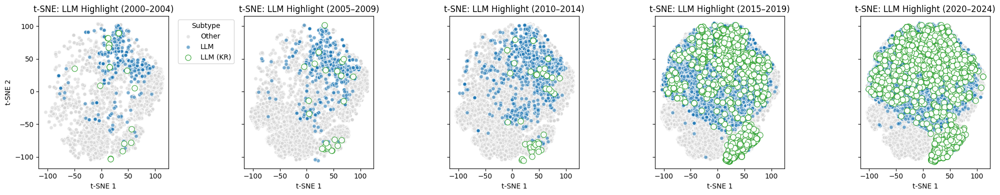

In [131]:
# Cell 7-(2b): t-SNE LLM Highlight by Period (2000–2016 vs 2017–2023)
#  5개 기간별로 t-SNE 산점도에서 LLM 서브타입을 강조하고,
#  한국(KR) LLM만 별도 테두리로 표시합니다
# --------------------------------------------------------------------------

import matplotlib.pyplot as plt

# 1) 5년 단위 기간 정의
periods = [
    ("2000–2004", range(2000, 2005)),
    ("2005–2009", range(2005, 2010)),
    ("2010–2014", range(2010, 2015)),
    ("2015–2019", range(2015, 2020)),
    ("2020–2024", range(2020, 2025))
]

# 2) plot_df에 연도·국가 정보 추가
plot_df["year"]         = df_pred["year"].values          # ── 출원 연도
plot_df["country_code"] = df_pred["country_code"].values  # ── 국가 코드

# 3) 색상 설정
llm_color = palette_map["LLM"]                            # ── LLM 색상
kr_edge   = "#2ca02c"                                     # ── 한국 테두리 색

# 4) Figure & Axes 생성 (1행 5열, 축 공유)
fig, axes = plt.subplots(1, len(periods), figsize=(20, 4), sharex=True, sharey=True)

# 5) 각 기간별 산점도 그리기
for ax, (title, yrange) in zip(axes, periods):
    sub      = plot_df[plot_df["year"].isin(yrange)]      # ── 해당 기간 데이터
    mask_llm = sub["Subtype"] == "LLM"                    # ── LLM 점 마스크
    mask_kr  = mask_llm & (sub["country_code"] == "KR")   # ── 한국 LLM만

    # 5.1 Other 서브타입 점들 회색으로 표시
    ax.scatter(
        sub.loc[~mask_llm, "tSNE1"],
        sub.loc[~mask_llm, "tSNE2"],
        c="lightgray", alpha=0.6, s=30,
        edgecolor="white", label="Other"
    )

    # 5.2 모든 LLM 점들 강조 색으로 표시
    ax.scatter(
        sub.loc[mask_llm, "tSNE1"],
        sub.loc[mask_llm, "tSNE2"],
        c=[llm_color], alpha=0.6, s=30,
        edgecolor="white", label="LLM"
    )

    # 5.3 한국(KR) LLM 점만 흰 배경+파란 테두리로 강조
    ax.scatter(
        sub.loc[mask_kr, "tSNE1"],
        sub.loc[mask_kr, "tSNE2"],
        facecolors="white", edgecolors=kr_edge,
        linewidths=0.8, alpha=0.95, s=65,
        label="LLM (KR)"
    )

    # 5.4 축 제목 및 라벨 설정
    ax.set_title(f"t-SNE: LLM Highlight ({title})")
    ax.set_xlabel("t-SNE 1")
    if ax is axes[0]:
        ax.set_ylabel("t-SNE 2")
        ax.legend(title="Subtype", bbox_to_anchor=(1.05, 1), loc="upper left")

# 6) 레이아웃 정리 및 출력
plt.tight_layout()
plt.show()


## **7-(3): t‑SNE by CPC Main 1‑digit with Ratios**

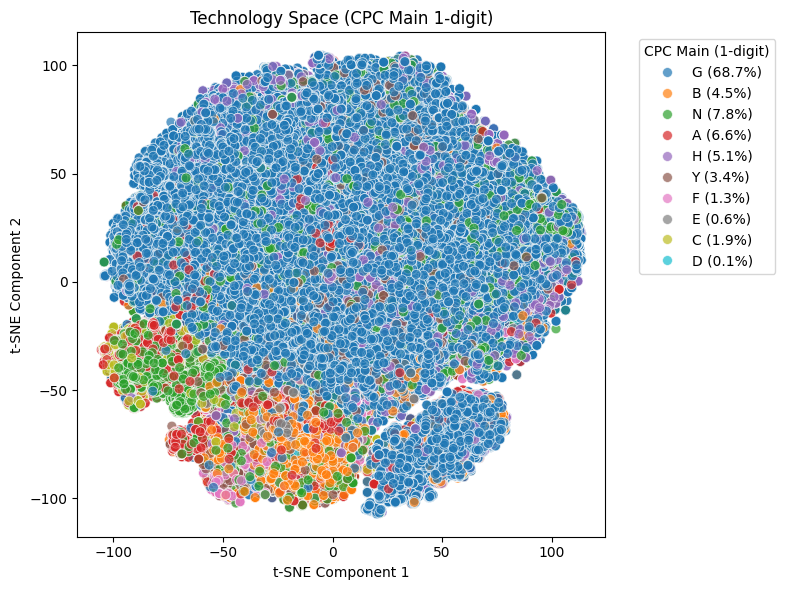

In [132]:
# Cell 7-(3): t-SNE by CPC Main 1-digit with Ratios
#  CPC 메인 1-digit 코드별로 t-SNE 좌표를 추출하고, 비율 정보를 범례에 포함한 산점도를 그립니다
# ------------------------------------------------------------------------------------------------

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 0) X_tsne가 이미 계산되어 있어야 합니다 (Cell 12-(10a))
#    X_tsne = TSNE(...).fit_transform(X_all)

# 1) cpc_main_norm에서 첫 글자(1-digit) 추출
df_expl3["cpc_main1"] = df_expl3["cpc_main_norm"].fillna("").str[:1]

# 2) 알파벳 또는 숫자 1글자 코드를 가진 행만 마스크
mask1 = df_expl3["cpc_main1"].str.match(r"[A-Z0-9]")

# 3) plotting용 DataFrame 구성
vis1 = pd.DataFrame({
    "tSNE1":     X_tsne[mask1.values, 0],
    "tSNE2":     X_tsne[mask1.values, 1],
    "cpc_main1": df_expl3.loc[mask1, "cpc_main1"].values
})

# 4) 각 코드별 비율(%) 계산
counts = vis1["cpc_main1"].value_counts().sort_index()
ratios = (counts / len(vis1) * 100).round(1).astype(str) + "%"

# 5) 산점도 그리기, 범례에 비율 포함
plt.figure(figsize=(8, 6))
ax = sns.scatterplot(
    data=vis1,
    x="tSNE1", y="tSNE2",
    hue="cpc_main1",
    palette="tab10",
    alpha=0.7,
    s=50,
    edgecolor="white"
)

# 6) 범례 레이블에 비율 추가
handles, labels = ax.get_legend_handles_labels()
new_labels = [f"{lab} ({ratios.get(lab, '0.0%')})" for lab in labels]
ax.legend(
    handles, new_labels,
    title="CPC Main (1-digit)",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

# 7) 최종 포맷팅
ax.set_title("Technology Space (CPC Main 1-digit)")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
plt.tight_layout()
plt.show()


## **7-(4a)-tSNE: Technology Space (LLM) — Highlight KR within LLM**

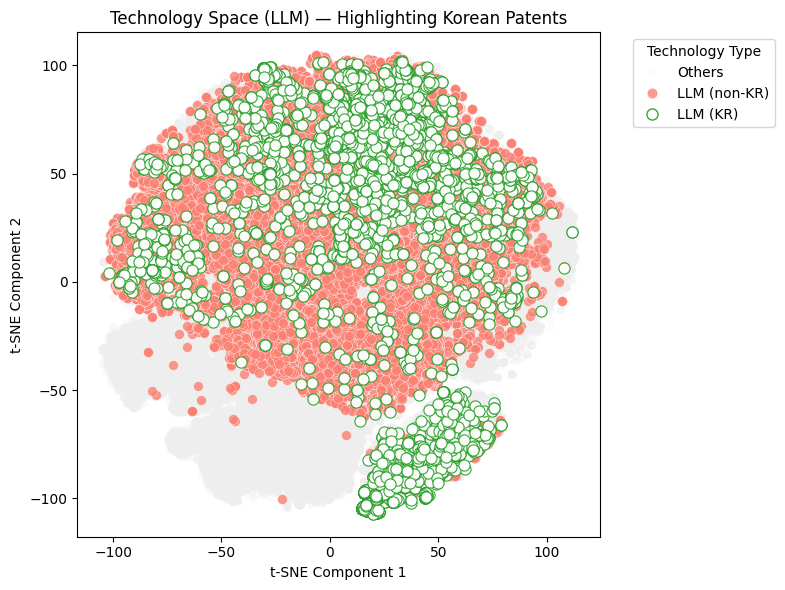

In [133]:
# Cell 7-(4a): Technology Space (LLM) — Highlight KR within LLM
#  SBERT 임베딩 t-SNE 좌표에 기반해 LLM 서브타입을 시각화하고,
#  한국(KR) 특허만 초록색 테두리로 강조합니다
# -----------------------------------------------------------------------------------

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from sklearn.manifold import TSNE

# 0) 전제: 
#    • X_tsne: df_pred 임베딩에 대한 t-SNE 결과 (shape = [N, 2])
#    • df_pred에 seed_genai_type_label 및 country_code 컬럼 포함

# 1) 시각화용 DataFrame 구성
vis_df_tsne = pd.DataFrame({
    "tSNE1":           X_tsne[:, 0],                             # ── t-SNE 차원1
    "tSNE2":           X_tsne[:, 1],                             # ── t-SNE 차원2
    "technology_type": df_pred["genai_subtype_pred"].values,  # ── 서브타입 라벨
    "country_code":    df_pred["country_code"].astype(str).values# ── 국가 코드
})

# 2) 마스크 정의
mask_llm     = vis_df_tsne["technology_type"] == "LLM"           # ── LLM 점
mask_kr      = mask_llm & (vis_df_tsne["country_code"] == "KR")  # ── 한국 LLM 점
mask_others  = ~mask_llm                                         # ── LLM 외 점

# 3) 산점도 그리기
plt.figure(figsize=(8, 6))

# 3a) Others: 매우 연한 회색
plt.scatter(
    vis_df_tsne.loc[mask_others, "tSNE1"],
    vis_df_tsne.loc[mask_others, "tSNE2"],
    color="#EEEEEE", alpha=0.07, s=35,
    edgecolors="none",
    label="Others"
)

# 3b) LLM (non-KR): 연어빛
plt.scatter(
    vis_df_tsne.loc[mask_llm & ~mask_kr, "tSNE1"],
    vis_df_tsne.loc[mask_llm & ~mask_kr, "tSNE2"],
    color="salmon", alpha=0.8, s=50,
    edgecolors="white", linewidths=0.3,
    label="LLM (non-KR)"
)

# 3c) LLM (KR): 흰 배경 + 초록 테두리
plt.scatter(
    vis_df_tsne.loc[mask_kr, "tSNE1"],
    vis_df_tsne.loc[mask_kr, "tSNE2"],
    facecolors="white", edgecolors="#2ca02c",
    linewidths=0.8, alpha=0.95, s=65,
    label="LLM (KR)"
)

# 4) 커스텀 범례
handles = [
    Line2D([0],[0], marker='o', linestyle='',
           markerfacecolor="#EEEEEE", markeredgecolor='none',
           alpha=0.07, markersize=8, label="Others"),
    Line2D([0],[0], marker='o', linestyle='',
           markerfacecolor="salmon", markeredgecolor='white',
           alpha=0.8, markersize=8, label="LLM (non-KR)"),
    Line2D([0],[0], marker='o', linestyle='',
           markerfacecolor="white", markeredgecolor="#2ca02c",
           linewidth=0.8, alpha=0.95, markersize=8, label="LLM (KR)")
]
plt.legend(handles=handles, title="Technology Type",
           bbox_to_anchor=(1.05, 1), loc="upper left")

# 5) 라벨 및 타이틀
plt.title("Technology Space (LLM) — Highlighting Korean Patents")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.tight_layout()
plt.show()


## **7-(4b)-tSNE: Technology Space (LLM) — Highlight KR (green) & US (blue)**

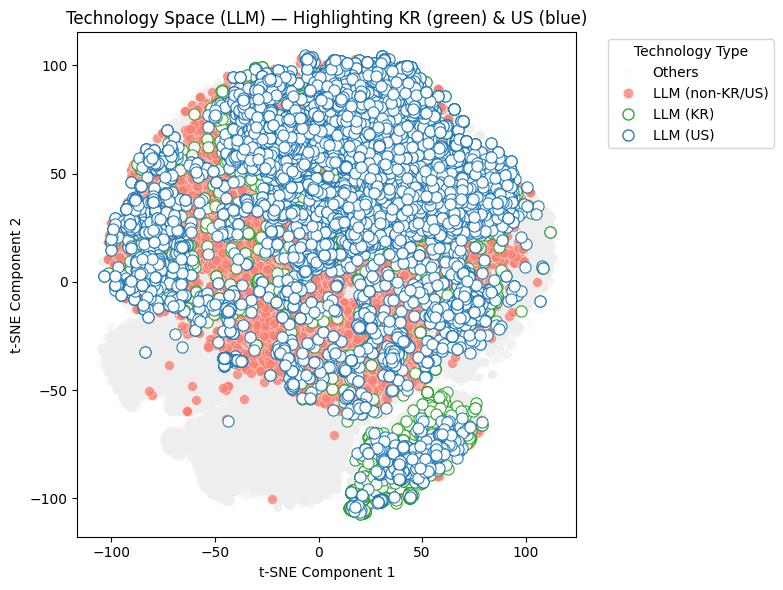

In [134]:
# Cell 7-(4b)-tSNE: Technology Space (LLM) — Highlight KR (green) & US (blue)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd

# 0) Ensure vis_df_tsne exists with columns: tSNE1, tSNE2, technology_type, country_code
# If not, build it from X_tsne and your prediction DataFrame (df_pred):
# vis_df_tsne = pd.DataFrame({
#     "tSNE1":           X_tsne[:, 0],
#     "tSNE2":           X_tsne[:, 1],
#     "technology_type": df_pred["genai_pred"].map({"GenAI":"LLM","NonGenAI":"Other"}).values,
#     "country_code":    df_pred["country_code"].astype(str).values
# })

# 1) Define masks
mask_llm     = vis_df_tsne["technology_type"] == "LLM"
mask_kr      = mask_llm & (vis_df_tsne["country_code"] == "KR")
mask_us      = mask_llm & (vis_df_tsne["country_code"] == "US")
mask_llm_etc = mask_llm & ~mask_kr & ~mask_us
mask_others  = ~mask_llm

# 2) Plot
plt.figure(figsize=(8, 6))

# Others: very light gray
plt.scatter(
    vis_df_tsne.loc[mask_others, "tSNE1"],
    vis_df_tsne.loc[mask_others, "tSNE2"],
    color="#EEEEEE", alpha=0.07, s=35,
    edgecolors="none",
    label="Others"
)

# LLM (non‑KR/US): salmon
plt.scatter(
    vis_df_tsne.loc[mask_llm_etc, "tSNE1"],
    vis_df_tsne.loc[mask_llm_etc, "tSNE2"],
    color="salmon", alpha=0.8, s=50,
    edgecolors="white", linewidths=0.3,
    label="LLM (non‑KR/US)"
)

# LLM (KR): white fill + green edge
plt.scatter(
    vis_df_tsne.loc[mask_kr, "tSNE1"],
    vis_df_tsne.loc[mask_kr, "tSNE2"],
    facecolors="white", edgecolors="#2ca02c",
    linewidths=0.8, alpha=0.95, s=65,
    label="LLM (KR)"
)

# LLM (US): white fill + blue edge
plt.scatter(
    vis_df_tsne.loc[mask_us, "tSNE1"],
    vis_df_tsne.loc[mask_us, "tSNE2"],
    facecolors="white", edgecolors="#1f77b4",
    linewidths=0.8, alpha=0.95, s=65,
    label="LLM (US)"
)

# 3) Legend
handles = [
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="#EEEEEE",
           markeredgecolor='none', alpha=0.07, markersize=8, label="Others"),
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="salmon",
           markeredgecolor='white', alpha=0.8, markersize=8, label="LLM (non‑KR/US)"),
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="white",
           markeredgecolor="#2ca02c", linewidth=0.8, alpha=0.95, markersize=8, label="LLM (KR)"),
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="white",
           markeredgecolor="#1f77b4", linewidth=0.8, alpha=0.95, markersize=8, label="LLM (US)")
]
plt.legend(handles=handles, title="Technology Type",
           bbox_to_anchor=(1.05, 1), loc="upper left")

plt.title("Technology Space (LLM) — Highlighting KR (green) & US (blue)")
plt.xlabel("t‑SNE Component 1")
plt.ylabel("t‑SNE Component 2")
plt.tight_layout()
plt.show()


## **7-(4c): Technology Space (LLM) — Highlighting KR (green), US (blue), CN (red)**

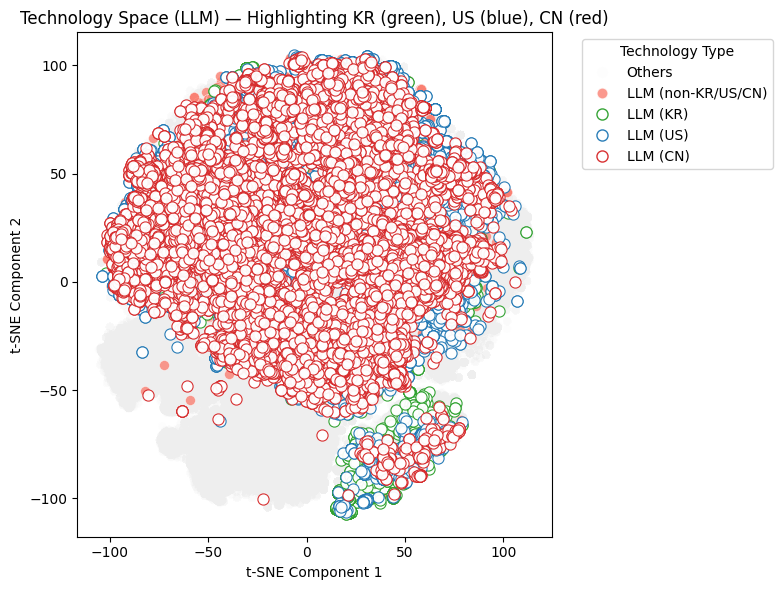

In [135]:
# Cell 7-(4c): Technology Space (LLM) — Highlighting KR (green), US (blue), CN (red)



# 0) Ensure vis_df_tsne exists with columns: tSNE1, tSNE2, technology_type, country_code
#    If your main DataFrame is df_pred, you can build it like this:
# vis_df_tsne = pd.DataFrame({
#     "tSNE1":           X_tsne[:, 0],
#     "tSNE2":           X_tsne[:, 1],
#     "technology_type": df_pred["genai_pred"].map({"GenAI": "LLM", "NonGenAI": "Others"}).values,
#     "country_code":    df_pred["country_code"].astype(str).values
# })

# 1) Define masks
mask_llm     = vis_df_tsne["technology_type"] == "LLM"
mask_kr      = mask_llm & (vis_df_tsne["country_code"] == "KR")
mask_us      = mask_llm & (vis_df_tsne["country_code"] == "US")
mask_cn      = mask_llm & (vis_df_tsne["country_code"] == "CN")
mask_llm_etc = mask_llm & ~mask_kr & ~mask_us & ~mask_cn
mask_others  = ~mask_llm

# 2) Plot
plt.figure(figsize=(8, 6))

# Others: very light gray
plt.scatter(
    vis_df_tsne.loc[mask_others, "tSNE1"],
    vis_df_tsne.loc[mask_others, "tSNE2"],
    color="#EEEEEE", alpha=0.07, s=35,
    edgecolors="none",
    label="Others"
)

# LLM (non‑KR/US/CN): salmon
plt.scatter(
    vis_df_tsne.loc[mask_llm_etc, "tSNE1"],
    vis_df_tsne.loc[mask_llm_etc, "tSNE2"],
    color="salmon", alpha=0.8, s=50,
    edgecolors="white", linewidths=0.3,
    label="LLM (non‑KR/US/CN)"
)

# LLM (KR): white fill + green edge
plt.scatter(
    vis_df_tsne.loc[mask_kr, "tSNE1"],
    vis_df_tsne.loc[mask_kr, "tSNE2"],
    facecolors="white", edgecolors="#2ca02c",
    linewidths=0.8, alpha=0.95, s=65,
    label="LLM (KR)"
)

# LLM (US): white fill + blue edge
plt.scatter(
    vis_df_tsne.loc[mask_us, "tSNE1"],
    vis_df_tsne.loc[mask_us, "tSNE2"],
    facecolors="white", edgecolors="#1f77b4",
    linewidths=0.8, alpha=0.95, s=65,
    label="LLM (US)"
)

# LLM (CN): white fill + red edge
plt.scatter(
    vis_df_tsne.loc[mask_cn, "tSNE1"],
    vis_df_tsne.loc[mask_cn, "tSNE2"],
    facecolors="white", edgecolors="#d62728",
    linewidths=0.8, alpha=0.95, s=65,
    label="LLM (CN)"
)

# 3) Custom legend
handles = [
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="#EEEEEE",
           markeredgecolor='none', alpha=0.07, markersize=8, label="Others"),
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="salmon",
           markeredgecolor='white', alpha=0.8, markersize=8, label="LLM (non‑KR/US/CN)"),
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="white",
           markeredgecolor="#2ca02c", linewidth=0.8, alpha=0.95, markersize=8, label="LLM (KR)"),
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="white",
           markeredgecolor="#1f77b4", linewidth=0.8, alpha=0.95, markersize=8, label="LLM (US)"),
    Line2D([0], [0], marker='o', linestyle='', markerfacecolor="white",
           markeredgecolor="#d62728", linewidth=0.8, alpha=0.95, markersize=8, label="LLM (CN)")
]
plt.legend(handles=handles, title="Technology Type",
           bbox_to_anchor=(1.05, 1), loc="upper left")

# 4) Labels & Title
plt.title("Technology Space (LLM) — Highlighting KR (green), US (blue), CN (red)")
plt.xlabel("t‑SNE Component 1")
plt.ylabel("t‑SNE Component 2")
plt.tight_layout()
plt.show()


## **7-(4d): Prepare embeddings and t‑SNE coordinates**

In [136]:
df_pred["genai_pred"].value_counts()

genai_pred
NonGenAI     173327
GenAI         90332
Uncertain      3860
Name: count, dtype: int64

In [137]:
df_pred["genai_subtype_pred"].value_counts()

genai_subtype_pred
VAE         129591
LLM          90911
DIFF         28435
AR           16513
GAN           2024
OTHER           33
NonGenAI        12
Name: count, dtype: int64

In [138]:
df_pred["seed_genai_type_label"].value_counts()

seed_genai_type_label
NonGenAI    176021
LLM          80269
OTHER         8090
GAN           2275
DIFF           513
AR             262
VAE             89
Name: count, dtype: int64

In [139]:
# Cell 7-(4d): Prepare embeddings and t‑SNE coordinates
# 1) Assemble DataFrame for plotting
vis_df_tsne = pd.DataFrame({
    "tSNE1":           X_tsne[:, 0],
    "tSNE2":           X_tsne[:, 1],
    "technology_type": df_pred["seed_genai_type_label"].values, # seed_genai_type_label <- genai_subtype_pred
    "country_code":    df_pred["country_code"].astype(str).values,
    "year":            df_pred["year"].values              # if you have a 'year' column
    })
print("Prerequisites ready: vis_df_tsne shape =", vis_df_tsne.shape)

Prerequisites ready: vis_df_tsne shape = (267519, 5)


## **7-(4e): t‑SNE by 5‑Year Periods**

In [140]:
df_pred.loc[df_pred['appl_id'] == '16/417587', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred', 'cluster_id_k', 'dist_cluster_cos', 'anchor_id', 'anchor_name']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred,cluster_id_k,dist_cluster_cos,anchor_id,anchor_name
60999,16/417587,US,GOOGLE INC,2019,US,G06N-0003/044,5.0,MOSTAFA DEHGHANI,NL,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM,3,0.360675,3,Architecture


In [141]:
df_pred.loc[df_pred['appl_id'] == '16/021971', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred', 'cluster_id_k', 'dist_cluster_cos', 'anchor_id', 'anchor_name']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred,cluster_id_k,dist_cluster_cos,anchor_id,anchor_name
42509,16/021971,US,GOOGLE INC,2018,US,G06N-0003/045,8.0,NOAM M SHAZEER,US,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM,3,0.280046,8,Multimodal


In [142]:
df_pred.loc[df_pred['appl_id'] == '18/183902', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred', 'cluster_id_k', 'dist_cluster_cos', 'anchor_id', 'anchor_name']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred,cluster_id_k,dist_cluster_cos,anchor_id,anchor_name


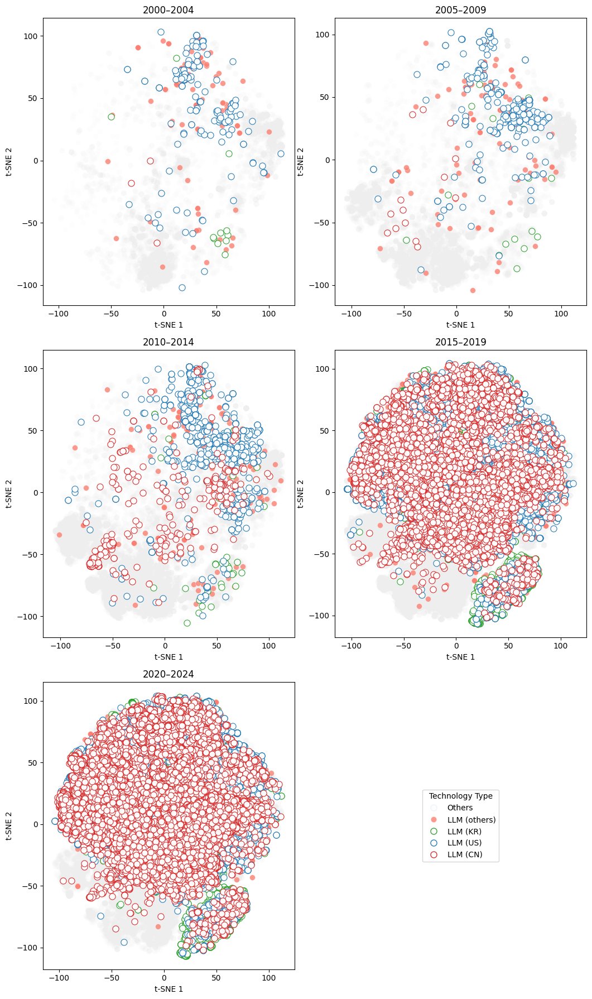

In [143]:
# Cell 7-(4e): t‑SNE by 5‑Year Periods
# ── Ensure year is integer ──
vis_df_tsne["year"] = vis_df_tsne["year"].astype(int)

# ── Define the 5‑year bins ──
periods = [
    ("2000–2004", range(2000, 2005)),
    ("2005–2009", range(2005, 2010)),
    ("2010–2014", range(2010, 2015)),
    ("2015–2019", range(2015, 2020)),
    ("2020–2024", range(2020, 2025))
]
# ── Prepare subplots (3×2 grid, last for legend) ──
fig, axes = plt.subplots(3, 2, figsize=(12, 18))
axes = axes.flatten()

for i, (label, yrs) in enumerate(periods):
    ax = axes[i]
    sub = vis_df_tsne[vis_df_tsne["year"].isin(yrs)]

    # Masks
    m_llm    = sub["technology_type"] == "LLM"
    m_oth    = ~m_llm
    m_kr     = m_llm & (sub["country_code"] == "KR")
    m_us     = m_llm & (sub["country_code"] == "US")
    m_cn     = m_llm & (sub["country_code"] == "CN")
    m_etc    = m_llm & ~m_kr & ~m_us & ~m_cn

    # Plot layers
    ax.scatter(sub.loc[m_oth, "tSNE1"], sub.loc[m_oth, "tSNE2"],
               color="#EEEEEE", alpha=0.07, s=50, edgecolors="none")
    ax.scatter(sub.loc[m_etc, "tSNE1"], sub.loc[m_etc, "tSNE2"],
               color="salmon", alpha=0.8, s=50, edgecolors="white", linewidths=0.3)
    ax.scatter(sub.loc[m_kr, "tSNE1"], sub.loc[m_kr, "tSNE2"],
               facecolors="white", edgecolors="#2ca02c",
               linewidths=0.8, alpha=0.95, s=65)
    ax.scatter(sub.loc[m_us, "tSNE1"], sub.loc[m_us, "tSNE2"],
               facecolors="white", edgecolors="#1f77b4",
               linewidths=0.8, alpha=0.95, s=65)
    ax.scatter(sub.loc[m_cn, "tSNE1"], sub.loc[m_cn, "tSNE2"],
               facecolors="white", edgecolors="#d62728",
               linewidths=0.8, alpha=0.95, s=65)

    ax.set_title(label)
    ax.set_xlabel("t‑SNE 1")
    ax.set_ylabel("t‑SNE 2")

# Remove empty 6th plot
fig.delaxes(axes[-1])

# ── Legend panel ──
leg_ax = fig.add_subplot(3, 2, 6)
leg_ax.axis("off")
handles = [
    Line2D([0],[0], marker="o", linestyle="", markerfacecolor="#EEEEEE", alpha=0.07, markersize=8, label="Others"),
    Line2D([0],[0], marker="o", linestyle="", markerfacecolor="salmon", markeredgecolor="white", alpha=0.8, markersize=8, label="LLM (others)"),
    Line2D([0],[0], marker="o", linestyle="", markerfacecolor="white", markeredgecolor="#2ca02c", alpha=0.95, markersize=8, label="LLM (KR)"),
    Line2D([0],[0], marker="o", linestyle="", markerfacecolor="white", markeredgecolor="#1f77b4", alpha=0.95, markersize=8, label="LLM (US)"),
    Line2D([0],[0], marker="o", linestyle="", markerfacecolor="white", markeredgecolor="#d62728", alpha=0.95, markersize=8, label="LLM (CN)")
]
leg_ax.legend(handles=handles, title="Technology Type", loc="center")

plt.tight_layout()
plt.subplots_adjust(right=0.88)  # make space for legend panel
plt.show()

In [144]:
df_pred.loc[df_pred['appl_id'] == '16/417587', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'seed_genai_label', 'seed_genai_type_label' , 'genai_subtypes_multi' , 'genai_pred', 'genai_subtype_pred', 'cluster_id_k', 'dist_cluster_cos', 'anchor_id', 'anchor_name']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,seed_genai_label,seed_genai_type_label,genai_subtypes_multi,genai_pred,genai_subtype_pred,cluster_id_k,dist_cluster_cos,anchor_id,anchor_name
60999,16/417587,US,GOOGLE INC,2019,US,G06N-0003/044,5.0,MOSTAFA DEHGHANI,NL,1,LLM,LLM;DIFF;VAE;AR,GenAI,LLM,3,0.360675,3,Architecture


## **7-(5a1): t-SNE with Clusters (KR)**

Subtitle: Clean t-SNE with soft cluster colouring and enlarged cluster numbers
[PCA] reduced to 50 dims in 4.0s
[t-SNE] done in 1097.5s


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


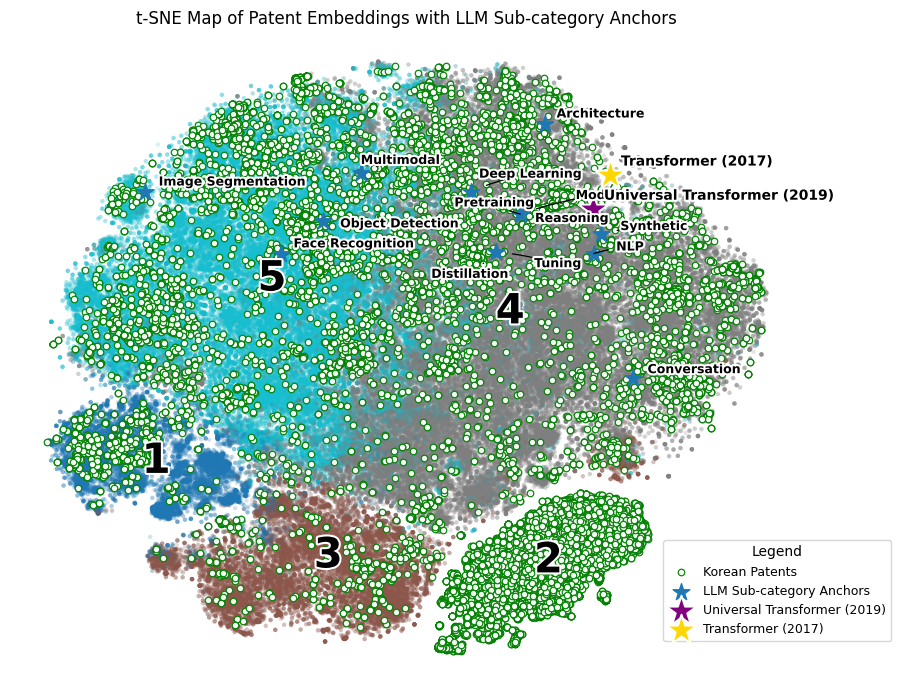

In [145]:
# Cell 7-(5a1): t-SNE with LLM anchors + three highlighted patents, coloured soft clusters (no hulls)
# ── 목적: t-SNE 2D 위에 한국 특허, 앵커, 3건 왕별 강조를 표시하고
#         기존 cluster_id_k를 활용하여 클러스터별 반투명 색상 패치와 번호만 표기

import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from adjustText import adjust_text
import matplotlib.patheffects as pe
import inspect, time

print("Subtitle: Clean t-SNE with soft cluster colouring and enlarged cluster numbers")  # 영어 소제목 출력

# --------------------------------
# 0) t-SNE 입력 구성 및 사전 PCA
# --------------------------------
# X_all: 특허 임베딩, category_emb: LLM 카테고리 앵커 임베딩
# 두 배열을 세로로 이어붙이고 float32로 변환
X_tsne_input = np.vstack([X_all, category_emb]).astype(np.float32, copy=False)

# PCA 차원 축소: 50차원 이하로 축소하여 t-SNE 속도/안정성 개선
pca_k = 50 if X_tsne_input.shape[1] > 50 else X_tsne_input.shape[1]
t0 = time.time()
X_pca = PCA(n_components=pca_k, svd_solver="randomized", random_state=42).fit_transform(X_tsne_input)
print(f"[PCA] reduced to {pca_k} dims in {time.time() - t0:.1f}s")

# --------------------------------
# 1) perplexity 자동 조정 및 t-SNE 실행
# --------------------------------
# perplexity는 데이터 개수 대비 합리적인 값으로 설정
n_samples = X_pca.shape[0]
perp = min(30, max(5, (n_samples - 1) // 3))

# TSNE 인자: scikit-learn 버전에 따라 n_iter / max_iter 중 하나 사용
tsne_common = dict(
    n_components=2, perplexity=perp, init="random",
    random_state=42, method="barnes_hut", angle=0.6
)
sig = inspect.signature(TSNE.__init__).parameters
if "n_iter" in sig:
    tsne_common["n_iter"] = 750
elif "max_iter" in sig:
    tsne_common["max_iter"] = 750

t1 = time.time()
Y = TSNE(**tsne_common).fit_transform(X_pca)
print(f"[t-SNE] done in {time.time() - t1:.1f}s")

# --------------------------------
# 2) 좌표 분리
# --------------------------------
# Y에서 특허 좌표와 앵커 좌표 분리
N = X_all.shape[0]       # 특허 데이터 개수
K = category_emb.shape[0] # 앵커 개수
Y_patent = Y[:N, :]
Y_cat    = Y[N:N+K, :]

# --------------------------------
# 3) 기존 클러스터 라벨 사용
# --------------------------------
# cluster_id_k가 없으면 오류 발생 (새 학습 금지)
if "cluster_id_k" not in df_pred.columns:
    raise RuntimeError("cluster_id_k is missing in df_pred. Please provide precomputed cluster labels.")

# cluster_labels 길이와 Y_patent 길이가 다르면 오류
cluster_labels = df_pred["cluster_id_k"].to_numpy()
if len(cluster_labels) != Y_patent.shape[0]:
    raise RuntimeError("Length mismatch between cluster_id_k and Y_patent.")

unique_c = np.unique(cluster_labels)  # 클러스터 번호 목록

# --------------------------------
# 4) 한국 특허 마스크 생성
# --------------------------------
kr_mask = (df_pred["country_code"] == "KR").values

# --------------------------------
# 5) 시각화
# --------------------------------
fig, ax = plt.subplots(figsize=(9, 7))  # 그래프 크기 설정

# (a) 클러스터별 반투명 색상 패치 (hulls 없이)
#     cluster_labels를 색상으로 매핑하여 부드럽게 겹침 표현
ax.scatter(
    Y_patent[:, 0], Y_patent[:, 1],
    c=cluster_labels, cmap="tab10", s=10, alpha=0.20, linewidths=0
)

# (b) 한국 특허: 흰색 내부 + 초록 테두리
ax.scatter(
    Y_patent[kr_mask, 0], Y_patent[kr_mask, 1],
    s=22, facecolors="white", edgecolors="green", linewidths=0.9,
    alpha=0.95, label="Korean Patents"
)

# (c) LLM 앵커: 큰 별 표시
ax.scatter(
    Y_cat[:, 0], Y_cat[:, 1],
    marker="*", s=160, label="LLM Sub-category Anchors"
)

# (d) 앵커 라벨 표시 (겹침 방지용 adjust_text 적용)
texts = []
for name, (x, y) in zip(category_names, Y_cat):
    t = ax.text(
        x, y, f" {name}", fontsize=9, weight="bold", zorder=5,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )
    texts.append(t)
adjust_text(
    texts, expand_points=(1.6, 1.4), expand_text=(1.2, 1.2),
    force_points=0.30, force_text=0.18, lim=250,
    only_move={"points": "y", "text": "xy"},
    arrowprops=dict(arrowstyle="-", lw=0.9, shrinkA=14, shrinkB=12,
                    connectionstyle="arc3,rad=0.06")
)

# (e) 클러스터 번호 크게 표기 (1부터 시작)
for cid in unique_c:
    idx = np.where(cluster_labels == cid)[0]
    if idx.size == 0:
        continue
    cx, cy = Y_patent[idx, 0].mean(), Y_patent[idx, 1].mean()
    ax.text(
        cx, cy, str(int(cid) + 1),  # 1부터 시작
        fontsize=30, weight="bold", color="black", ha="center", va="center",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

# --------------------------------
# 6) 주요 특허 3건 왕별 강조
# --------------------------------
def _make_id_mask(df, value):
    """appln_id 또는 appl_id로 특정 특허 필터링"""
    if "appln_id" in df.columns:
        return (df["appln_id"] == value).values
    elif "appl_id" in df.columns:
        return (df["appl_id"] == value).values
    else:
        return np.zeros(len(df), dtype=bool)

def _highlight(appl_id_val, face_color, label_text):
    """특정 특허를 큰 별로 표시하고 텍스트 라벨 추가"""
    mask = _make_id_mask(df_pred, appl_id_val)
    idxs = np.where(mask)[0]
    if idxs.size == 0:
        return
    i0 = int(idxs[0])
    if i0 >= Y_patent.shape[0]:
        return
    x, y = Y_patent[i0, 0], Y_patent[i0, 1]
    ax.scatter(
        [x], [y], marker="*", s=520, linewidths=1.4,
        edgecolors="white", facecolors=face_color, alpha=1.0,
        label=label_text
    )
    ax.text(
        x + 2.5, y + 2.5, label_text,
        fontsize=10, weight="bold", zorder=6,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

# 보라색: Transformer, 황금색: Attention, 검정: ChatGPT
_highlight("16/417587", "purple", "Universal Transformer (2019)")
_highlight("16/021971", "gold",   "Transformer (2017)")
_highlight("18/183902", "black",  "ChatGPT (2023)")

# --------------------------------
# 7) 제목·범례·축 설정
# --------------------------------
ax.set_title("t-SNE Map of Patent Embeddings with LLM Sub-category Anchors")
ax.legend(title="Legend", frameon=True, loc="lower right",
          bbox_to_anchor=(1.12, 0.05), fontsize=9)
ax.axis("off")  # 축 숨김
plt.tight_layout()
plt.show()


## **7-(5a2)-Focused: KR patents in upper-left t-SNE region → AI keyword top-5**

Subtitle: KR patents in the upper-left t-SNE region — AI keywords, top-5
[info] Selected KR patents in upper-left region: n=2817
Top-5 AI keywords in the selected KR subset (upper-left region):
 - object detection: 538
 - attention: 305
 - image segmentation: 284
 - quantization: 237
 - GAN: 196


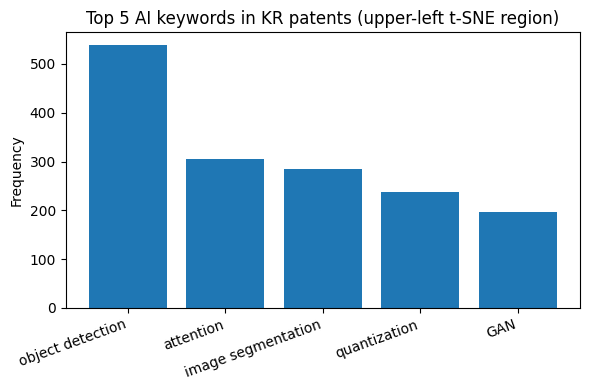

In [146]:
# Cell 7-(5a2)-Focused: KR patents in upper-left t-SNE region → AI keyword top-5
#  ── 목적: t-SNE 좌표를 이용해 '왼쪽 상단' 한국 특허를 선택하고, 영문 AI 용어만 집계하여 상위 5개 키워드 산출
#  ── 입력: Y_patent (N×2), df_pred (country_code, 인덱스), df_expl3['tac_text'] (영문 텍스트)
#  ── 출력: 상위 5개 키워드(빈도)와 막대그래프

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

print("Subtitle: KR patents in the upper-left t-SNE region — AI keywords, top-5")  # ── 영어 소제목 출력

# -----------------------------
# 0) 전처리: 소스·정렬
# -----------------------------
# ── 한국 특허 마스크
kr_mask = (df_pred["country_code"] == "KR").values

# ── 텍스트 소스: df_expl3.tac_text를 우선 사용(인덱스 정렬 일치 가정)
assert "tac_text" in df_expl3.columns, "df_expl3['tac_text'] is required."
texts_all = df_expl3["tac_text"].astype(str)

# -----------------------------
# 1) '왼쪽 상단' 영역 선택(분위 기반 직사각형)
# -----------------------------
# ── 한국 특허의 t-SNE 좌표만 추출
Y_kr = Y_patent[kr_mask]
idx_kr = df_pred.index[kr_mask]

# ── 영역 분위 기준(기본: x 하위 25%, y 상위 75%)
qx_left = 0.25   # ── 왼쪽 경계 분위
qy_top  = 0.75   # ── 상단 경계 분위

x_left = np.quantile(Y_kr[:, 0], qx_left)   # ── x 경계값
y_top  = np.quantile(Y_kr[:, 1], qy_top)    # ── y 경계값

# ── 한국 특허 중 왼쪽 상단에 해당하는 인덱스 선택
ul_mask_kr = (Y_kr[:, 0] <= x_left) & (Y_kr[:, 1] >= y_top)
sel_idx = idx_kr[ul_mask_kr]

# ── 선택 문서 수 확인
n_sel = sel_idx.size
print(f"[info] Selected KR patents in upper-left region: n={n_sel}")
if n_sel == 0:
    raise ValueError("No KR patents found in the selected upper-left region. Consider loosening quantiles.")

# -----------------------------
# 2) 확장 영문 AI 용어 사전(정규식)
# -----------------------------
ai_terms_en = {
    # 기존 LLM·생성 AI 핵심
    "transformer": r"\btransformer(s)?\b",
    "attention": r"\b(self[-\s]?attention|multi[-\s]?head[-\s]?attention|attention)\b",
    "embedding": r"\bembedding(s)?\b",
    "tokenizer": r"\btokeni[sz]er(s)?\b",
    "inference": r"\binference\b",
    "large language model": r"\blarge\s+language\s+model(s)?\b",
    "LLM": r"\bLLM(s)?\b",
    "diffusion model": r"\bdiffusion\s+model(s)?\b|\bDDPM\b|\bDDIM\b",
    "GAN": r"\bGAN(s)?\b|StyleGAN[23]?|CycleGAN|Pix2Pix|BigGAN",
    "VAE": r"\bVAE\b|variational\s+autoencoder|VQ-?VAE|β-?VAE",
    "autoregressive": r"\bauto[-_\s]?regress(ive|ion)\b|next[-_\s]?token",
    "encoder-decoder": r"\bencoder[-\s]?decoder\b",
    "prompt": r"\bprompt(ing)?\b",
    "retrieval augmented generation": r"\bretrieval[-\s]?augmented\s+generation\b|\bRAG\b",
    "fine-tuning": r"\bfine[-\s]?tuning\b",
    "pre-training": r"\bpre[-\s]?training\b",
    "mixture of experts": r"\bmixture[-\s]?of[-\s]?experts\b|\bMoE\b",
    "quantization": r"\bquantization\b",
    "distillation": r"\bdistillation\b",
    "alignment": r"\balignment\s+tuning\b|\bRLHF\b|reinforcement\s+learning\s+from\s+human\s+feedback",
    
    # 멀티모달·이미지·비전
    "multimodal": r"\bmultimodal\b|\bvision[-\s]*language\b|\bimage[-\s]*text\b",
    "image recognition": r"\bimage\s+(recognition|classification|detection)\b",
    "object detection": r"\bobject\s+detection\b|\bYOLO(v[1-9])?\b|\bFaster[-\s]?RCNN\b",
    "image segmentation": r"\b(image|semantic|instance)\s+segmentation\b|\bMask[-\s]?RCNN\b",
    "OCR": r"\bOCR\b|\boptical\s+character\s+recognition\b",
    "face recognition": r"\bface\s+(recognition|detection)\b",
    "pose estimation": r"\bpose\s+estimation\b",
    "3d reconstruction": r"\b3D\s+(reconstruction|vision)\b",
    "image generation": r"\bimage\s+generation\b|\btext[-\s]*to[-\s]*image\b",
    "video analysis": r"\bvideo\s+(analysis|classification|understanding)\b",
    "action recognition": r"\baction\s+recognition\b",
    
    # 음성·오디오
    "speech recognition": r"\bspeech\s+(recognition|to[-\s]*text)\b",
    "text to speech": r"\btext[-\s]*to[-\s]*speech\b|\bTTS\b",
    "speaker identification": r"\bspeaker\s+identification\b|\bspeaker\s+verification\b",
    "ASR": r"\bASR\b",
    
    # 반도체·하드웨어 AI 가속
    "AI accelerator": r"\bAI\s+accelerator(s)?\b",
    "neural processing unit": r"\bNPU(s)?\b|\bneural\s+processing\s+unit(s)?\b",
    "tensor processing unit": r"\bTPU(s)?\b|\btensor\s+processing\s+unit(s)?\b",
    "gpu": r"\bGPU(s)?\b|\bgraphics\s+processing\s+unit(s)?\b",
    "fpga": r"\bFPGA(s)?\b|\bfield[-\s]*programmable\s+gate\s+array(s)?\b",
    "asic": r"\bASIC(s)?\b|\bapplication[-\s]*specific\s+integrated\s+circuits?\b",
    "chip design": r"\bchip\s+design\b|\bsemiconductor\s+design\b",
    "eda": r"\bEDA\b|\belectronic\s+design\s+automation\b",
    "hardware acceleration": r"\bhardware\s+acceleration\b",
}

# 컴파일
ai_patterns = {k: re.compile(v, re.IGNORECASE) for k, v in ai_terms_en.items()}

# -----------------------------
# 3) 선택 문서에서 AI 용어 카운트
# -----------------------------
counts = Counter()
for txt in texts_all.loc[sel_idx].fillna("").astype(str).values:
    for term, pat in ai_patterns.items():
        hits = len(pat.findall(txt))
        if hits:
            counts[term] += hits

# -----------------------------
# 4) 상위 5개 키워드 출력 및 시각화
# -----------------------------
top5 = counts.most_common(5)
if not top5:
    print("[info] No AI keywords found in the selected KR subset.")
else:
    print("Top-5 AI keywords in the selected KR subset (upper-left region):")
    for term, freq in top5:
        print(f" - {term}: {freq}")

    # ── 막대그래프(영문 레이블 유지)
    terms, freqs = zip(*top5)
    plt.figure(figsize=(6, 4))
    plt.bar(range(len(terms)), freqs)
    plt.xticks(range(len(terms)), terms, rotation=20, ha="right")
    plt.ylabel("Frequency")
    plt.title("Top 5 AI keywords in KR patents (upper-left t-SNE region)")
    plt.tight_layout()
    plt.show()


## **7-(5a3): 클러스터별 AI 키워드 상위 5개 추출 (KR)**

In [147]:
# Cell 7-(5a3)-KR: 클러스터별 AI 키워드 상위 5개 (한국 특허 한정)
# ── 목적: df_pred에서 country_code == 'KR'인 문서만 대상으로,
#         cluster_id_k별 df_expl3['tac_text']에서 ai_patterns(정규식 사전) 매칭 빈도를 집계
# ── 입력: df_pred['country_code','cluster_id_k'], df_expl3['tac_text'], ai_patterns
# ── 출력: 한국 특허에 한정한 각 클러스터별 상위 5 키워드와 빈도(콘솔 출력)

import pandas as pd
from collections import Counter

print("Subtitle: AI keyword frequency per cluster (KR-only)")  # ── 영어 소제목 출력

# -----------------------------
# 0) 필수 데이터/사전 확인
# -----------------------------
assert "cluster_id_k" in df_pred.columns, "'cluster_id_k' column not found in df_pred."
assert "country_code" in df_pred.columns, "'country_code' column not found in df_pred."
assert "tac_text" in df_expl3.columns, "'tac_text' column not found in df_expl3."
assert isinstance(ai_patterns, dict) and len(ai_patterns) > 0, "ai_patterns dict is missing or empty."

# 텍스트 시리즈(인덱스 정렬/정합 보장)
texts_all = df_expl3["tac_text"].astype(str)

# -----------------------------
# 1) 한국 특허 마스크 및 대상 클러스터 목록
# -----------------------------
kr_mask = (df_pred["country_code"] == "KR")
cluster_ids = sorted(df_pred.loc[kr_mask, "cluster_id_k"].unique())

# -----------------------------
# 2) 한국 특허에 한정한 클러스터별 AI 키워드 빈도 계산
# -----------------------------
cluster_results = {}

for cid in cluster_ids:
    # df_pred와 df_expl3가 같은 인덱스 기준이라고 가정하고 교집합으로 안전 확보
    idx_sel = df_pred.index[(df_pred["cluster_id_k"] == cid) & kr_mask]
    idx_sel = idx_sel.intersection(texts_all.index)

    if len(idx_sel) == 0:
        cluster_results[cid] = []
        continue

    subset_texts = texts_all.loc[idx_sel]
    counter = Counter()

    # 각 문서에서 모든 AI 패턴을 세고 누적
    for txt in subset_texts:
        for term, pat in ai_patterns.items():
            hits = len(pat.findall(txt))
            if hits:
                counter[term] += hits

    # 상위 5개만 보관
    top5 = counter.most_common(5)
    cluster_results[cid] = top5

# -----------------------------
# 3) 결과 출력 (클러스터 번호는 원래 라벨 사용)
# -----------------------------
if len(cluster_results) == 0:
    print("No Korean patents found for any cluster.")
else:
    for cid in cluster_ids:
        top5 = cluster_results.get(cid, [])
        print(f"\nCluster {cid +1} — Top 5 AI Keywords (KR only)")
        if not top5:
            print("  (No keywords found)")
        else:
            for term, freq in top5:
                print(f"  - {term}: {freq}")


Subtitle: AI keyword frequency per cluster (KR-only)

Cluster 1 — Top 5 AI Keywords (KR only)
  - GAN: 8
  - embedding: 6
  - inference: 3
  - transformer: 1
  - attention: 1

Cluster 2 — Top 5 AI Keywords (KR only)
  - GAN: 450
  - attention: 198
  - embedding: 111
  - object detection: 106
  - gpu: 106

Cluster 3 — Top 5 AI Keywords (KR only)
  - speech recognition: 15
  - image recognition: 3
  - image segmentation: 2
  - multimodal: 1

Cluster 4 — Top 5 AI Keywords (KR only)
  - speech recognition: 2896
  - embedding: 711
  - quantization: 650
  - inference: 498
  - attention: 441

Cluster 5 — Top 5 AI Keywords (KR only)
  - object detection: 861
  - image segmentation: 333
  - attention: 283
  - embedding: 267
  - quantization: 226


In [148]:
# ## Cell 7-(5aX-UNIFIED-UPPER-FINAL): Per-cluster top-5 applicants — KR, CN, US, Global
#  규칙: 모든 이름 대문자, 다중 출원인 분해, 기업 법인 꼬리표만 제거,
#        ELECTRONIC(S) 보존, TECHNOLOGY 단독 명칭은 제외

import re
import numpy as np
import pandas as pd

print("Subtitle: Unified per-cluster top-5 applicants — KR, CN, US, Global (cleaned, UPPER CASE)")

# ── 0) 필수 컬럼 확인
req_cols = {"cluster_id_k"}
missing = req_cols - set(df_pred.columns)
assert not missing, f"Missing columns in df_pred: {sorted(missing)}"
has_country = "country_code" in df_pred.columns

# ── 1) applicant 컬럼 자동 탐지
applicant_candidates = [
    "applicant", "applicant_name", "applicant_en", "applicant_org", "applicant_org_en",
    "assignee", "assignee_name", "assignee_en", "assignee_org", "assignee_org_en",
    "applicant_clean", "assignee_clean"
]
app_cols_present = [c for c in applicant_candidates if c in df_pred.columns]
assert len(app_cols_present) > 0, "No applicant-like column found in df_pred."
APP_COL = app_cols_present[0]
print(f"[info] Using applicant column: {APP_COL!r}")

# ── 2) 유틸: 분할·정규화
_splitter = re.compile(r"(?:\s+(?:및|and)\s+)|[;,/&·ㆍ]+", flags=re.IGNORECASE)

# 기업 꼬리표만 제거, ELECTRONIC(S) 보존
suffixes = [
    " CO LTD", " CO. LTD", " CO LIMITED", " COMPANY LIMITED",
    " LTD", " LIMITED", " CORP", " CORPORATION", " INC", " INC.",
    " LLC", " PLC", " PTY LTD", " GMBH", " S.A.", " S.P.A.", " SARL",
    " BV", " AG", " OY", " AB", " PTE LTD", " KK", " K.K."
]
korean_suffixes = ["(주)", "주식회사", "유한회사", "(유)"]

invalid_tokens = {"COMPANY", "LTD", "LIMITED", "CO", "INC", "CORP", "TECHNOLOGY"}  # TECHNOLOGY 단독 제외

def split_applicants(val):
    if not isinstance(val, str):
        return []
    parts = [p.strip() for p in _splitter.split(val) if p and p.strip()]
    return parts

def normalise_name(val: str) -> str:
    if not isinstance(val, str):
        return ""
    s = val.strip()
    if not s:
        return ""
    s = s.upper()

    # 접미사 제거, ELECTRONIC(S) 자체는 보존
    changed = True
    while changed:
        changed = False
        for suf in suffixes + korean_suffixes:
            if s.endswith(suf) and not s.endswith("ELECTRONIC") and not s.endswith("ELECTRONICS"):
                s = s[: -len(suf)].strip(" .,-_/")
                changed = True

    # 공백 정리
    s = re.sub(r"\s+", " ", s).strip()

    # 무의미 토큰 제거
    if len(s) < 2:
        return ""
    if s in invalid_tokens:
        return ""
    return s

def _cid_to_display(cid):
    try:
        return int(cid) + 1
    except Exception:
        return cid

# ── 3) 공통 집계 함수
def top5_applicants_by_cluster(df: pd.DataFrame,
                               cluster_col: str = "cluster_id_k",
                               applicant_col: str = APP_COL,
                               country_col: str = "country_code",
                               include_countries: list | None = None,
                               title_hint: str = "Global") -> pd.DataFrame:
    labels = df[cluster_col].to_numpy()
    unique_c = np.unique(labels)

    if include_countries is not None and has_country:
        cc = df[country_col].astype(str).str.upper()
        mask_country = cc.isin([c.upper() for c in include_countries])
    else:
        mask_country = np.ones(len(df), dtype=bool)

    tables = []
    for cid in unique_c:
        sel = (labels == cid) & mask_country
        if not np.any(sel):
            top5 = pd.DataFrame({
                "cluster_no": [_cid_to_display(cid)],
                "rank": [None],
                "applicant": [f"(NO {title_hint.upper()} APPLICANTS)"],
                "count": [0],
                "share_%": [0.0]
            })
        else:
            raw = df.loc[sel, applicant_col].astype(str)
            exploded = (
                raw.apply(split_applicants)
                   .explode()
                   .dropna()
                   .map(normalise_name)
            )
            exploded = exploded[exploded.astype(bool)]  # 빈 문자열 제거

            if exploded.empty:
                top5 = pd.DataFrame({
                    "cluster_no": [_cid_to_display(cid)],
                    "rank": [None],
                    "applicant": [f"(NO {title_hint.upper()} APPLICANTS)"],
                    "count": [0],
                    "share_%": [0.0]
                })
            else:
                vc = exploded.value_counts()
                total = int(vc.sum())
                top = vc.head(5).reset_index()
                top.columns = ["applicant", "count"]
                top.insert(0, "cluster_no", _cid_to_display(cid))
                top.insert(1, "rank", np.arange(1, len(top) + 1))
                top["share_%"] = (100 * top["count"] / total).round(1)
                top5 = top

        print(f"\n=== Cluster { _cid_to_display(cid) } — Top-5 {title_hint} applicants (UPPER CASE) ===")
        display(top5[["cluster_no", "rank", "applicant", "count", "share_%"]])
        tables.append(top5)

    result = pd.concat(tables, ignore_index=True) if tables else pd.DataFrame()
    print(f"\n[info] {title_hint} consolidated table shape:", result.shape)
    return result

# ── 4) 실행: KR, CN, US, Global
kr_applicants_by_cluster_upper      = top5_applicants_by_cluster(df_pred, include_countries=["KR", "KOR"], title_hint="Korean")
cn_applicants_by_cluster_upper      = top5_applicants_by_cluster(df_pred, include_countries=["CN", "CHN"], title_hint="Chinese")
us_applicants_by_cluster_upper      = top5_applicants_by_cluster(df_pred, include_countries=["US", "USA"], title_hint="US")
global_applicants_by_cluster_upper  = top5_applicants_by_cluster(df_pred, include_countries=None,            title_hint="Global")

# ── 5) 필요 시 저장
# kr_applicants_by_cluster_upper.to_csv("/mnt/data/kr_top5_applicants_upper.csv", index=False)
# cn_applicants_by_cluster_upper.to_csv("/mnt/data/cn_top5_applicants_upper.csv", index=False)
# us_applicants_by_cluster_upper.to_csv("/mnt/data/us_top5_applicants_upper.csv", index=False)
# global_applicants_by_cluster_upper.to_csv("/mnt/data/global_top5_applicants_upper.csv", index=False)


Subtitle: Unified per-cluster top-5 applicants — KR, CN, US, Global (cleaned, UPPER CASE)
[info] Using applicant column: 'applicant'

=== Cluster 1 — Top-5 Korean applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,1,1,SEOUL NATIONAL UNIVERSITY,47,7.3
1,1,2,SAMSUNG DISPLAY COLTD,36,5.6
2,1,3,SAMSUNG LIFE PUBLIC FOUNDATION SOCIAL WELFARE,25,3.9
3,1,4,MEDIPOST COLTD,25,3.9
4,1,5,KOREA UNIVERSITY,22,3.4



=== Cluster 2 — Top-5 Korean applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,2,1,SAMSUNG ELECTRONICS COLTD,614,5.1
1,2,2,KAIST,307,2.5
2,2,3,YONSEI UNIVERSITY,284,2.4
3,2,4,SEOUL NATIONAL UNIVERSITY,276,2.3
4,2,5,TELECOMMUNICATIONS RESEARCH INSTITUTE,240,2.0



=== Cluster 3 — Top-5 Korean applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,3,1,SAMSUNG DISPLAY COLTD,82,15.6
1,3,2,LG ELECTRONICS,64,12.1
2,3,3,SAMSUNG ELECTRONICS COLTD,27,5.1
3,3,4,HYUNDAI MOTOR COMPANY,25,4.7
4,3,5,COUPANG,7,1.3



=== Cluster 4 — Top-5 Korean applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,4,1,SAMSUNG ELECTRONICS COLTD,2261,45.4
1,4,2,LG ELECTRONICS,523,10.5
2,4,3,TELECOMMUNICATIONS RESEARCH INSTITUTE,186,3.7
3,4,4,ELECTRONICS,186,3.7
4,4,5,SK HYNIX,104,2.1



=== Cluster 5 — Top-5 Korean applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,5,1,SAMSUNG ELECTRONICS COLTD,1390,38.3
1,5,2,STRAD VISION,298,8.2
2,5,3,LG ELECTRONICS,99,2.7
3,5,4,KAIST,89,2.5
4,5,5,ELECTRONICS,77,2.1



[info] Korean consolidated table shape: (25, 5)

=== Cluster 1 — Top-5 Chinese applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,1,1,ZHEJIANG UNIVERSITY,156,1.3
1,1,2,GUANGZHOU SALIAI STEMCELL SCIENCE,96,0.8
2,1,3,SUN YAT SEN UNIVERSITY CANCER CENTER,63,0.5
3,1,4,TECHNOLOGY COLTD,63,0.5
4,1,5,CHINA TOBACCO YUNNAN INDUSTRIAL,57,0.5



=== Cluster 2 — Top-5 Chinese applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,2,1,BEIJING BAIDU NETCOM SCIENCE,180,21.1
1,2,2,TENCENT TECH SHENZHEN,98,11.5
2,2,3,HUAWEI TECHNOLOGIES,51,6.0
3,2,4,BEIJING SENSETIME TECHNOLOGY DEVELOPMENT,41,4.8
4,2,5,BAIDU ONLINE NETWORK TECHNOLOGY (BEIJING),29,3.4



=== Cluster 3 — Top-5 Chinese applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,3,1,GOODBABY CHILD PRODUCTS,83,1.0
1,3,2,TECHNOLOGY COLTD,45,0.6
2,3,3,STATE GRID CORPORATION OF CHINA,41,0.5
3,3,4,UNIV JIANGSU,35,0.4
4,3,5,CHINA UNIVERSITY OF MINING,28,0.3



=== Cluster 4 — Top-5 Chinese applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,4,1,BEIJING BAIDU NETCOM SCIENCE,1750,2.7
1,4,2,HUAWEI TECHNOLOGIES,1537,2.4
2,4,3,TENCENT TECH SHENZHEN,1270,2.0
3,4,4,PING AN TECHNOLOGY (SHENZHEN),1253,2.0
4,4,5,ZHEJIANG UNIVERSITY,795,1.2



=== Cluster 5 — Top-5 Chinese applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,5,1,BEIJING BAIDU NETCOM SCIENCE,1264,2.2
1,5,2,TENCENT TECH SHENZHEN,1173,2.0
2,5,3,TECHNOLOGY OF CHINA,927,1.6
3,5,4,HUAWEI TECHNOLOGIES,871,1.5
4,5,5,UNIV XIDIAN,774,1.3



[info] Chinese consolidated table shape: (25, 5)

=== Cluster 1 — Top-5 US applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,1,1,UNIVERSITY OF CALIFORNIA,128,3.2
1,1,2,WISCONSIN ALUMNI RESEARCH FOUNDATION,93,2.3
2,1,3,JANSSEN BIOTECH,88,2.2
3,1,4,THE BOARD OF TRUSTEES OF THE LELAND STANFORD J...,73,1.8
4,1,5,FUJIFILM CELLULAR DYNAMICS,69,1.7



=== Cluster 2 — Top-5 US applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,2,1,GOOGLE,408,19.7
1,2,2,IBM,108,5.2
2,2,3,MAGIC LEAP,74,3.6
3,2,4,TENCENT AMERICA,71,3.4
4,2,5,KLA,59,2.9



=== Cluster 3 — Top-5 US applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,3,1,FISHER CONTROLS INT,183,1.6
1,3,2,BOEING,174,1.5
2,3,3,ILLINOIS TOOL WORKS,134,1.2
3,3,4,WALMART APOLLO,130,1.1
4,3,5,BE AEROSPACE,125,1.1



=== Cluster 4 — Top-5 US applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,4,1,IBM,3233,10.1
1,4,2,GOOGLE,2849,8.9
2,4,3,MICROSOFT TECHNOLOGY LICENSING,1882,5.9
3,4,4,QUALCOMM,1092,3.4
4,4,5,AMAZON TECHNOLOGIES,949,3.0



=== Cluster 5 — Top-5 US applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,5,1,GOOGLE,822,5.3
1,5,2,ADOBE SYSTEMS,681,4.4
2,5,3,IBM,558,3.6
3,5,4,NVIDIA,441,2.8
4,5,5,MICROSOFT TECHNOLOGY LICENSING,375,2.4



[info] US consolidated table shape: (25, 5)

=== Cluster 1 — Top-5 Global applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,1,1,ZHEJIANG UNIVERSITY,156,0.8
1,1,2,KYOTO UNIVERSITY,128,0.6
2,1,3,UNIVERSITY OF CALIFORNIA,128,0.6
3,1,4,GUANGZHOU SALIAI STEMCELL SCIENCE,96,0.5
4,1,5,WISCONSIN ALUMNI RESEARCH FOUNDATION,93,0.5



=== Cluster 2 — Top-5 Global applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,2,1,SAMSUNG ELECTRONICS COLTD,614,3.2
1,2,2,GOOGLE,408,2.2
2,2,3,KAIST,307,1.6
3,2,4,YONSEI UNIVERSITY,284,1.5
4,2,5,SEOUL NATIONAL UNIVERSITY,276,1.5



=== Cluster 3 — Top-5 Global applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,3,1,FISHER CONTROLS INT,183,0.6
1,3,2,BOEING,175,0.6
2,3,3,ILLINOIS TOOL WORKS,138,0.5
3,3,4,WALMART APOLLO,130,0.4
4,3,5,BE AEROSPACE,125,0.4



=== Cluster 4 — Top-5 Global applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,4,1,IBM,3257,2.6
1,4,2,GOOGLE,2986,2.4
2,4,3,SAMSUNG ELECTRONICS COLTD,2364,1.9
3,4,4,MICROSOFT TECHNOLOGY LICENSING,1931,1.6
4,4,5,BEIJING BAIDU NETCOM SCIENCE,1750,1.4



=== Cluster 5 — Top-5 Global applicants (UPPER CASE) ===


,cluster_no,rank,applicant,count,share_%
0,5,1,SAMSUNG ELECTRONICS COLTD,1432,1.6
1,5,2,BEIJING BAIDU NETCOM SCIENCE,1264,1.4
2,5,3,TENCENT TECH SHENZHEN,1180,1.3
3,5,4,TECHNOLOGY OF CHINA,927,1.0
4,5,5,HUAWEI TECHNOLOGIES,879,1.0



[info] Global consolidated table shape: (25, 5)


## **7-(5b1) Chinese patents highlighted**

Subtitle: Chinese Patents with soft colouring for all clusters and three highlighted stars


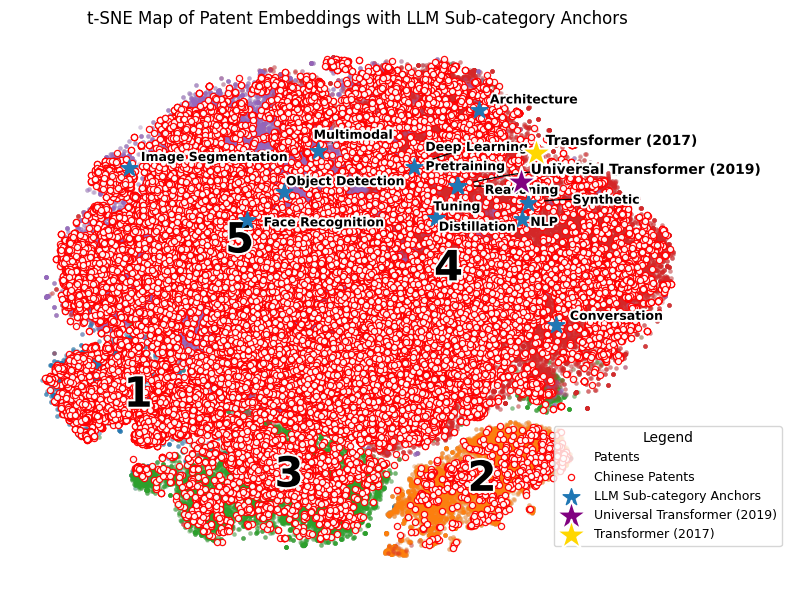

In [149]:
## Cell 7-(5b1): Chinese patents highlighted + soft colouring for all clusters + three highlighted stars
#  ── 목적: 중국 특허 강조, 경계선 없이 모든 클러스터를 반투명 색 패치로 표시, 클러스터 번호 크게 표기
#           'Universal Transformer (2019)', 'Transformer (2017)', 'ChatGPT (2023)' 왕별 강조
#  ── 입력: Y_patent, Y_cat, df_pred, category_names, X_all(라벨 누락 시에만 재계산)
#  ── 출력: 2D 시각화

import numpy as np
import matplotlib.pyplot as plt
from adjustText import adjust_text
import matplotlib.patheffects as pe
from sklearn.cluster import KMeans

print("Subtitle: Chinese Patents with soft colouring for all clusters and three highlighted stars")

# -----------------------------
# 0) 중국 특허 마스크
# -----------------------------
cn_mask = (df_pred["country_code"] == "CN").values

# -----------------------------
# 1) 클러스터 라벨 확보(없으면 보완)
# -----------------------------
if "cluster_id_k" not in df_pred.columns:
    km = KMeans(n_clusters=5, n_init=10, random_state=42)
    df_pred["cluster_id_k"] = km.fit_predict(X_all)

cluster_labels = df_pred["cluster_id_k"].to_numpy()
if len(cluster_labels) != Y_patent.shape[0]:
    raise RuntimeError("Length mismatch between cluster_id_k and Y_patent.")

unique_all = np.unique(cluster_labels)

# -----------------------------
# 2) 시각화
# -----------------------------
fig, ax = plt.subplots(figsize=(8, 6))

# (a) 모든 특허 회색 점으로 베이스
ax.scatter(
    Y_patent[:, 0], Y_patent[:, 1],
    s=6, alpha=0.28, color="lightgrey", label="Patents", zorder=1
)

# (b) 모든 클러스터를 반투명 색상 패치로 표시 + 번호 라벨
cmap = plt.cm.get_cmap("tab10")
for cid in unique_all:
    idx = np.where(cluster_labels == cid)[0]
    if idx.size == 0:
        continue
    colour = cmap(int(cid) % 10)
    ax.scatter(
        Y_patent[idx, 0], Y_patent[idx, 1],
        s=10, alpha=0.25, color=colour, linewidths=0, zorder=2
    )
    cx, cy = Y_patent[idx, 0].mean(), Y_patent[idx, 1].mean()
    ax.text(
        cx, cy, str(cid + 1),  # ← 여기서 +1 적용
        fontsize=30, weight="bold", color="black", ha="center", va="center",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")],
        zorder=4
    )

# (c) 중국 특허 강조
ax.scatter(
    Y_patent[cn_mask, 0], Y_patent[cn_mask, 1],
    s=20, facecolors="white", edgecolors="red", linewidths=0.9,
    alpha=0.95, label="Chinese Patents", zorder=3
)

# (d) 카테고리 앵커 별표
ax.scatter(
    Y_cat[:, 0], Y_cat[:, 1],
    marker="*", s=160, label="LLM Sub-category Anchors", zorder=5
)

# (e) 앵커 라벨
texts = []
for name, (x, y) in zip(category_names, Y_cat):
    t = ax.text(
        x, y, f" {name}",
        fontsize=9, weight="bold", zorder=6,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )
    texts.append(t)

adjust_text(
    texts,
    expand_points=(1.6, 1.4),
    expand_text=(1.2, 1.2),
    force_points=0.30,
    force_text=0.18,
    lim=250,
    only_move={"points": "y", "text": "xy"},
    arrowprops=dict(
        arrowstyle="-",
        lw=0.9,
        shrinkA=14,
        shrinkB=12,
        connectionstyle="arc3,rad=0.06"
    )
)

# -----------------------------
# 3) 왕별 강조 함수 정의
# -----------------------------
def _make_id_mask(df, value):
    if "appln_id" in df.columns:
        return (df["appln_id"] == value).values
    elif "appl_id" in df.columns:
        return (df["appl_id"] == value).values
    else:
        return np.zeros(len(df), dtype=bool)

def _highlight(appl_id_val, face_color, label_text):
    mask = _make_id_mask(df_pred, appl_id_val)
    idxs = np.where(mask)[0]
    if idxs.size == 0:
        return
    i0 = int(idxs[0])
    if i0 >= Y_patent.shape[0]:
        return
    x, y = Y_patent[i0, 0], Y_patent[i0, 1]
    ax.scatter(
        [x], [y],
        marker="*", s=520, linewidths=1.4,
        edgecolors="white", facecolors=face_color, alpha=1.0,
        label=label_text, zorder=7
    )
    ax.text(
        x + 2.5, y + 2.5, label_text,
        fontsize=10, weight="bold", zorder=8,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

# -----------------------------
# 4) 3건 왕별 강조 추가
# -----------------------------
_highlight("16/417587", "purple", "Universal Transformer (2019)")
_highlight("16/021971", "gold",   "Transformer (2017)")
_highlight("18/183902", "black",  "ChatGPT (2023)")

# -----------------------------
# 5) 제목, 범례, 축
# -----------------------------
ax.set_title("t-SNE Map of Patent Embeddings with LLM Sub-category Anchors")
ax.legend(title="Legend", frameon=True, loc="lower right",
          bbox_to_anchor=(1.12, 0.05), fontsize=9)
ax.axis("off")
plt.tight_layout()
plt.show()


In [150]:
# Cell 7-(5a3)-KR: 클러스터별 AI 키워드 상위 5개 (한국 특허 한정)
# ── 목적: df_pred에서 country_code == 'KR'인 문서만 대상으로,
#         cluster_id_k별 df_expl3['tac_text']에서 ai_patterns(정규식 사전) 매칭 빈도를 집계
# ── 입력: df_pred['country_code','cluster_id_k'], df_expl3['tac_text'], ai_patterns
# ── 출력: 한국 특허에 한정한 각 클러스터별 상위 5 키워드와 빈도(콘솔 출력)

import pandas as pd
from collections import Counter

print("Subtitle: AI keyword frequency per cluster (CN-only)")  # ── 영어 소제목 출력

# -----------------------------
# 0) 필수 데이터/사전 확인
# -----------------------------
assert "cluster_id_k" in df_pred.columns, "'cluster_id_k' column not found in df_pred."
assert "country_code" in df_pred.columns, "'country_code' column not found in df_pred."
assert "tac_text" in df_expl3.columns, "'tac_text' column not found in df_expl3."
assert isinstance(ai_patterns, dict) and len(ai_patterns) > 0, "ai_patterns dict is missing or empty."

# 텍스트 시리즈(인덱스 정렬/정합 보장)
texts_all = df_expl3["tac_text"].astype(str)

# -----------------------------
# 1) 한국 특허 마스크 및 대상 클러스터 목록
# -----------------------------
kr_mask = (df_pred["country_code"] == "CN")
cluster_ids = sorted(df_pred.loc[kr_mask, "cluster_id_k"].unique())

# -----------------------------
# 2) 한국 특허에 한정한 클러스터별 AI 키워드 빈도 계산
# -----------------------------
cluster_results = {}

for cid in cluster_ids:
    # df_pred와 df_expl3가 같은 인덱스 기준이라고 가정하고 교집합으로 안전 확보
    idx_sel = df_pred.index[(df_pred["cluster_id_k"] == cid) & kr_mask]
    idx_sel = idx_sel.intersection(texts_all.index)

    if len(idx_sel) == 0:
        cluster_results[cid] = []
        continue

    subset_texts = texts_all.loc[idx_sel]
    counter = Counter()

    # 각 문서에서 모든 AI 패턴을 세고 누적
    for txt in subset_texts:
        for term, pat in ai_patterns.items():
            hits = len(pat.findall(txt))
            if hits:
                counter[term] += hits

    # 상위 5개만 보관
    top5 = counter.most_common(5)
    cluster_results[cid] = top5

# -----------------------------
# 3) 결과 출력 (클러스터 번호는 원래 라벨 사용)
# -----------------------------
if len(cluster_results) == 0:
    print("No Chinse patents found for any cluster.")
else:
    for cid in cluster_ids:
        top5 = cluster_results.get(cid, [])
        print(f"\nCluster {cid +1} — Top 5 AI Keywords (CN only)")
        if not top5:
            print("  (No keywords found)")
        else:
            for term, freq in top5:
                print(f"  - {term}: {freq}")


Subtitle: AI keyword frequency per cluster (CN-only)

Cluster 1 — Top 5 AI Keywords (CN only)
  - distillation: 269
  - embedding: 264
  - attention: 103
  - object detection: 68
  - image segmentation: 50

Cluster 2 — Top 5 AI Keywords (CN only)
  - neural processing unit: 20
  - gpu: 10
  - object detection: 10
  - asic: 4
  - image segmentation: 3

Cluster 3 — Top 5 AI Keywords (CN only)
  - transformer: 314
  - prompt: 195
  - embedding: 111
  - speech recognition: 69
  - image recognition: 64

Cluster 4 — Top 5 AI Keywords (CN only)
  - attention: 28263
  - embedding: 11487
  - speech recognition: 10872
  - pre-training: 6186
  - transformer: 5651

Cluster 5 — Top 5 AI Keywords (CN only)
  - attention: 39558
  - image segmentation: 19402
  - image recognition: 15847
  - object detection: 7444
  - face recognition: 6175


Subtitle: European Patents with soft colouring for all clusters and three highlighted stars
[warn] appl_id '18/183902' not found in df_pred


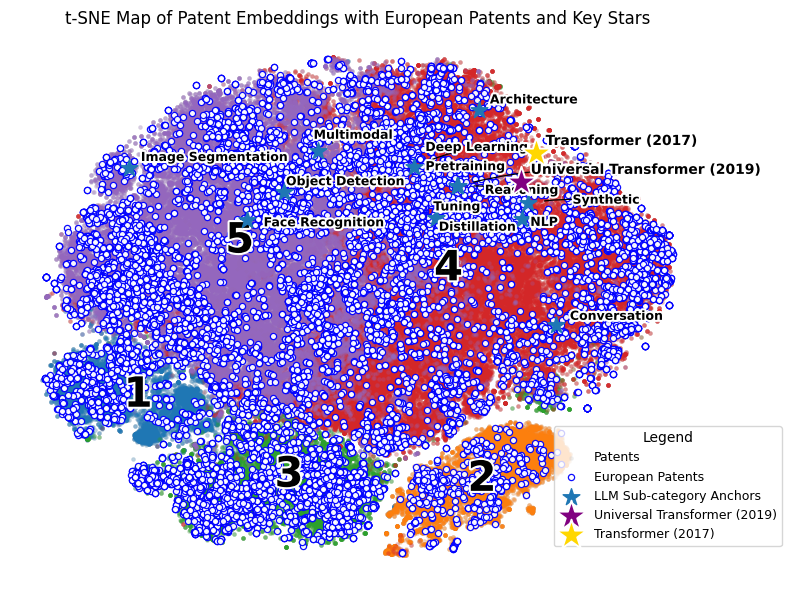

In [151]:
# ## Cell 7-(5b2): European patents highlighted + soft colouring + three highlighted stars
#  ── 목적: 유럽 특허 강조, 클러스터 반투명 패치, 클러스터 번호, 왕별 3종 강조 포함

import numpy as np
import matplotlib.pyplot as plt
from adjustText import adjust_text
import matplotlib.patheffects as pe
from sklearn.cluster import KMeans

print("Subtitle: European Patents with soft colouring for all clusters and three highlighted stars")

# -----------------------------
# 0) 유럽 지역 마스크
# -----------------------------
EUROPE_ISO2 = {
    # EU27
    "AT","BE","BG","HR","CY","CZ","DK","EE","FI","FR","DE","GR","HU","IE","IT",
    "LV","LT","LU","MT","NL","PL","PT","RO","SK","SI","ES","SE"
    # EEA/기타 유럽권
    # "UK","GB","CH","NO","IS","LI","TR","AL","BA","RS","MK","ME","MD","UA","BY","RU","AM","GE","AZ","XK"
}
if "country_code" not in df_pred.columns:
    raise KeyError("df_pred['country_code']가 필요합니다.")
eu_mask = df_pred["country_code"].astype(str).str.upper().isin(EUROPE_ISO2).values

# -----------------------------
# 1) 클러스터 라벨 확보(없으면 보완)
# -----------------------------
if "cluster_id_k" not in df_pred.columns:
    km = KMeans(n_clusters=5, n_init=10, random_state=42)
    df_pred["cluster_id_k"] = km.fit_predict(X_all)

cluster_labels = df_pred["cluster_id_k"].to_numpy()
if len(cluster_labels) != Y_patent.shape[0]:
    raise RuntimeError("Length mismatch between cluster_id_k and Y_patent.")
unique_all = np.unique(cluster_labels)

# -----------------------------
# 2) 시각화 베이스
# -----------------------------
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(Y_patent[:, 0], Y_patent[:, 1], s=6, alpha=0.28, color="lightgrey", label="Patents", zorder=1)

cmap = plt.cm.get_cmap("tab10")
for cid in unique_all:
    idx = np.where(cluster_labels == cid)[0]
    if idx.size == 0: 
        continue
    colour = cmap(int(cid) % 10)
    ax.scatter(Y_patent[idx, 0], Y_patent[idx, 1], s=10, alpha=0.25, color=colour, linewidths=0, zorder=2)
    cx, cy = Y_patent[idx, 0].mean(), Y_patent[idx, 1].mean()
    ax.text(cx, cy, str(cid + 1), fontsize=30, weight="bold", color="black", ha="center", va="center",
            path_effects=[pe.withStroke(linewidth=3, foreground="white")], zorder=4)

# 유럽 특허 강조
ax.scatter(Y_patent[eu_mask, 0], Y_patent[eu_mask, 1],
           s=20, facecolors="white", edgecolors="blue", linewidths=0.9,
           alpha=0.95, label="European Patents", zorder=3)

# 앵커와 라벨
ax.scatter(Y_cat[:, 0], Y_cat[:, 1], marker="*", s=160, label="LLM Sub-category Anchors", zorder=5)
texts = []
for name, (x, y) in zip(category_names, Y_cat):
    t = ax.text(x, y, f" {name}", fontsize=9, weight="bold", zorder=6,
                path_effects=[pe.withStroke(linewidth=3, foreground="white")])
    texts.append(t)
adjust_text(texts, expand_points=(1.6, 1.4), expand_text=(1.2, 1.2),
            force_points=0.30, force_text=0.18, lim=250,
            only_move={"points": "y", "text": "xy"},
            arrowprops=dict(arrowstyle="-", lw=0.9, shrinkA=14, shrinkB=12, connectionstyle="arc3,rad=0.06"))

# -----------------------------
# 3) 왕별 강조 함수 추가
# -----------------------------
def _make_id_mask(df, value):
    if "appln_id" in df.columns:
        return (df["appln_id"] == value).values
    elif "appl_id" in df.columns:
        return (df["appl_id"] == value).values
    else:
        return np.zeros(len(df), dtype=bool)

def _highlight(appl_id_val, face_color, label_text):
    mask = _make_id_mask(df_pred, appl_id_val)
    idxs = np.where(mask)[0]
    if idxs.size == 0:
        print(f"[warn] appl_id '{appl_id_val}' not found in df_pred")
        return
    i0 = int(idxs[0])
    if i0 >= Y_patent.shape[0]:
        print(f"[warn] index {i0} out of range for Y_patent")
        return
    x, y = Y_patent[i0, 0], Y_patent[i0, 1]
    ax.scatter([x], [y], marker="*", s=520, linewidths=1.4, edgecolors="white",
               facecolors=face_color, alpha=1.0, label=label_text, zorder=7)
    ax.text(x + 2.5, y + 2.5, label_text, fontsize=10, weight="bold", zorder=8,
            path_effects=[pe.withStroke(linewidth=3, foreground="white")])

# -----------------------------
# 4) 왕별 3건 호출
# -----------------------------
_highlight("16/417587", "purple", "Universal Transformer (2019)")
_highlight("16/021971", "gold",   "Transformer (2017)")
_highlight("18/183902", "black",  "ChatGPT (2023)")

# -----------------------------
# 5) 제목, 범례, 축
# -----------------------------
ax.set_title("t-SNE Map of Patent Embeddings with European Patents and Key Stars")
ax.legend(title="Legend", frameon=True, loc="lower right", bbox_to_anchor=(1.12, 0.05), fontsize=9)
ax.axis("off")
plt.tight_layout()
plt.show()


In [152]:
# Cell 7-(5a3)-EU: 클러스터별 AI 키워드 상위 5개 (유럽 특허 한정)
# ── 목적: df_pred에서 유럽 지역만 대상으로,
#         cluster_id_k별 df_expl3['tac_text']에서 ai_patterns(정규식 사전) 매칭 빈도 집계
# ── 입력: df_pred['country_code','cluster_id_k'], df_expl3['tac_text'], ai_patterns
# ── 출력: 유럽 특허에 한정한 각 클러스터별 상위 5 키워드와 빈도(콘솔 출력)

import pandas as pd
from collections import Counter

print("Subtitle: AI keyword frequency per cluster (Europe-only)")

# -----------------------------
# 0) 필수 데이터/사전 확인
# -----------------------------
assert "cluster_id_k" in df_pred.columns, "'cluster_id_k' column not found in df_pred."
assert "country_code" in df_pred.columns, "'country_code' column not found in df_pred."
assert "tac_text" in df_expl3.columns, "'tac_text' column not found in df_expl3."
assert isinstance(ai_patterns, dict) and len(ai_patterns) > 0, "ai_patterns dict is missing or empty."

# 텍스트 시리즈(인덱스 정렬/정합 보장)
texts_all = df_expl3["tac_text"].astype(str)

# -----------------------------
# 1) 유럽 지역 ISO2 코드 세트 및 마스크
#     • EU27 + EEA/기타 유럽권
# -----------------------------
EUROPE_ISO2 = {
    # EU27
    "AT","BE","BG","HR","CY","CZ","DK","EE","FI","FR","DE","GR","HU","IE","IT",
    "LV","LT","LU","MT","NL","PL","PT","RO","SK","SI","ES","SE",
    # EEA/기타 유럽권
    "UK","GB","CH","NO","IS","LI","TR","AL","BA","RS","MK","ME","MD","UA","BY","RU","AM","GE","AZ","XK"
}

cc = df_pred["country_code"].astype(str).str.upper()
eu_mask = cc.isin(EUROPE_ISO2)

# 대상 클러스터 목록
cluster_ids = sorted(df_pred.loc[eu_mask, "cluster_id_k"].unique())

# -----------------------------
# 2) 유럽 특허 한정 클러스터별 AI 키워드 빈도 계산
# -----------------------------
cluster_results = {}

for cid in cluster_ids:
    # df_pred와 df_expl3가 같은 인덱스 기준이라고 가정하고 교집합으로 안전 확보
    idx_sel = df_pred.index[(df_pred["cluster_id_k"] == cid) & eu_mask]
    idx_sel = idx_sel.intersection(texts_all.index)

    if len(idx_sel) == 0:
        cluster_results[cid] = []
        continue

    subset_texts = texts_all.loc[idx_sel]
    counter = Counter()

    # 각 문서에서 모든 AI 패턴을 세고 누적
    for txt in subset_texts:
        for term, pat in ai_patterns.items():
            hits = len(pat.findall(txt))
            if hits:
                counter[term] += hits

    # 상위 5개 저장
    cluster_results[cid] = counter.most_common(5)

# -----------------------------
# 3) 결과 출력 (클러스터 번호는 +1 표기)
# -----------------------------
if len(cluster_results) == 0:
    print("No European patents found for any cluster.")
else:
    for cid in cluster_ids:
        top5 = cluster_results.get(cid, [])
        print(f"\nCluster {cid + 1} — Top 5 AI Keywords (Europe only)")
        if not top5:
            print("  (No keywords found)")
        else:
            for term, freq in top5:
                print(f"  - {term}: {freq}")


Subtitle: AI keyword frequency per cluster (Europe-only)

Cluster 1 — Top 5 AI Keywords (Europe only)
  - retrieval augmented generation: 6
  - ASR: 6
  - embedding: 4
  - image recognition: 4
  - image segmentation: 2

Cluster 2 — Top 5 AI Keywords (Europe only)
  - GAN: 12
  - attention: 2
  - object detection: 1
  - embedding: 1
  - autoregressive: 1

Cluster 3 — Top 5 AI Keywords (Europe only)
  - transformer: 21
  - attention: 6
  - 3d reconstruction: 5
  - prompt: 4
  - speech recognition: 4

Cluster 4 — Top 5 AI Keywords (Europe only)
  - speech recognition: 1844
  - embedding: 1448
  - attention: 696
  - inference: 525
  - quantization: 290

Cluster 5 — Top 5 AI Keywords (Europe only)
  - image segmentation: 683
  - object detection: 556
  - embedding: 500
  - attention: 368
  - image recognition: 269


Subtitle: Netherlands Patents with soft colouring for all clusters and three highlighted stars
[warn] appl_id '18/183902' not found in df_pred


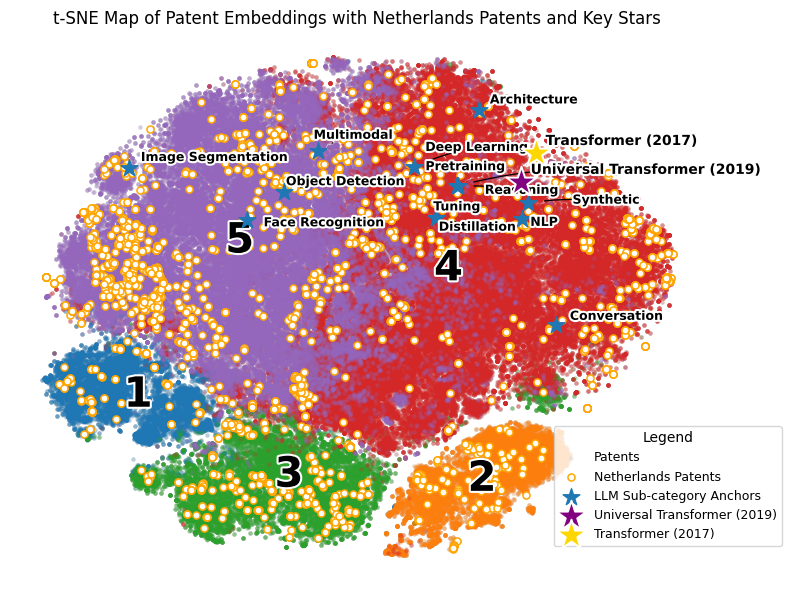

In [153]:
# ## Cell 7-(5b3-final): Netherlands patents highlighted + soft colouring + three highlighted stars
#  ── 목적: 네덜란드 특허 강조, 클러스터 반투명 패치, 클러스터 번호, 왕별 3종 강조 포함
#  ── 범례 위치: 오른쪽 하단 (x=1.12, y=0.05)

import numpy as np
import matplotlib.pyplot as plt
from adjustText import adjust_text
import matplotlib.patheffects as pe
from sklearn.cluster import KMeans

print("Subtitle: Netherlands Patents with soft colouring for all clusters and three highlighted stars")

# -----------------------------
# 0) 네덜란드 마스크
# -----------------------------
if "country_code" not in df_pred.columns:
    raise KeyError("df_pred['country_code']가 필요합니다.")
cc = df_pred["country_code"].astype(str).str.upper()
nl_mask = ((cc == "NL") | (cc == "NLD")).values

# -----------------------------
# 1) 클러스터 라벨 확보(없으면 보완)
# -----------------------------
if "cluster_id_k" not in df_pred.columns:
    km = KMeans(n_clusters=5, n_init=10, random_state=42)
    df_pred["cluster_id_k"] = km.fit_predict(X_all)

cluster_labels = df_pred["cluster_id_k"].to_numpy()
if len(cluster_labels) != Y_patent.shape[0]:
    raise RuntimeError("Length mismatch between cluster_id_k and Y_patent.")
unique_all = np.unique(cluster_labels)

# -----------------------------
# 2) 시각화 베이스
# -----------------------------
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(Y_patent[:, 0], Y_patent[:, 1], s=6, alpha=0.28, color="lightgrey", label="Patents", zorder=1)

cmap = plt.cm.get_cmap("tab10")
for cid in unique_all:
    idx = np.where(cluster_labels == cid)[0]
    if idx.size == 0:
        continue
    colour = cmap(int(cid) % 10)
    ax.scatter(Y_patent[idx, 0], Y_patent[idx, 1], s=10, alpha=0.25, color=colour, linewidths=0, zorder=2)
    cx, cy = Y_patent[idx, 0].mean(), Y_patent[idx, 1].mean()
    ax.text(cx, cy, str(cid + 1), fontsize=30, weight="bold", color="black", ha="center", va="center",
            path_effects=[pe.withStroke(linewidth=3, foreground="white")], zorder=4)

# 네덜란드 특허 강조
ax.scatter(Y_patent[nl_mask, 0], Y_patent[nl_mask, 1],
           s=26, facecolors="white", edgecolors="orange", linewidths=1.1,
           alpha=0.98, label="Netherlands Patents", zorder=3)

# 앵커와 라벨
ax.scatter(Y_cat[:, 0], Y_cat[:, 1], marker="*", s=160, label="LLM Sub-category Anchors", zorder=5)
texts = []
for name, (x, y) in zip(category_names, Y_cat):
    t = ax.text(x, y, f" {name}", fontsize=9, weight="bold", zorder=6,
                path_effects=[pe.withStroke(linewidth=3, foreground="white")])
    texts.append(t)
adjust_text(texts, expand_points=(1.6, 1.4), expand_text=(1.2, 1.2),
            force_points=0.30, force_text=0.18, lim=250,
            only_move={"points": "y", "text": "xy"},
            arrowprops=dict(arrowstyle="-", lw=0.9, shrinkA=14, shrinkB=12, connectionstyle="arc3,rad=0.06"))

# -----------------------------
# 3) 왕별 강조 함수
# -----------------------------
def _make_id_mask(df, value):
    if "appln_id" in df.columns:
        return (df["appln_id"] == value).values
    elif "appl_id" in df.columns:
        return (df["appl_id"] == value).values
    else:
        return np.zeros(len(df), dtype=bool)

def _highlight(appl_id_val, face_color, label_text):
    mask = _make_id_mask(df_pred, appl_id_val)
    idxs = np.where(mask)[0]
    if idxs.size == 0:
        print(f"[warn] appl_id '{appl_id_val}' not found in df_pred")
        return
    i0 = int(idxs[0])
    if i0 >= Y_patent.shape[0]:
        print(f"[warn] index {i0} out of range for Y_patent")
        return
    x, y = Y_patent[i0, 0], Y_patent[i0, 1]
    ax.scatter([x], [y], marker="*", s=520, linewidths=1.4, edgecolors="white",
               facecolors=face_color, alpha=1.0, label=label_text, zorder=7)
    ax.text(x + 2.5, y + 2.5, label_text, fontsize=10, weight="bold", zorder=8,
            path_effects=[pe.withStroke(linewidth=3, foreground="white")])

# -----------------------------
# 4) 왕별 3건 호출
# -----------------------------
_highlight("16/417587", "purple", "Universal Transformer (2019)")
_highlight("16/021971", "gold",   "Transformer (2017)")
_highlight("18/183902", "black",  "ChatGPT (2023)")

# -----------------------------
# 5) 제목, 범례, 축
# -----------------------------
ax.set_title("t-SNE Map of Patent Embeddings with Netherlands Patents and Key Stars")
ax.legend(title="Legend", frameon=True, loc="lower right",
          bbox_to_anchor=(1.12, 0.05), fontsize=9)  # ← 요청 위치
ax.axis("off")
plt.tight_layout()
plt.show()


In [154]:
# Cell 7-(5a3)-NL: 클러스터별 AI 키워드 상위 5개 (네덜란드 특허 한정)
# ── 목적: df_pred에서 country_code == 'NL' 또는 'NLD'인 문서만 대상으로,
#         cluster_id_k별 df_expl3['tac_text']에서 ai_patterns 매칭 빈도를 집계
# ── 입력: df_pred['country_code','cluster_id_k'], df_expl3['tac_text'], ai_patterns
# ── 출력: 네덜란드 특허에 한정한 각 클러스터별 상위 5 키워드와 빈도(콘솔 출력)

import pandas as pd
from collections import Counter

print("Subtitle: AI keyword frequency per cluster (Netherlands-only)")

# -----------------------------
# 0) 필수 데이터/사전 확인
# -----------------------------
assert "cluster_id_k" in df_pred.columns, "'cluster_id_k' column not found in df_pred."
assert "country_code" in df_pred.columns, "'country_code' column not found in df_pred."
assert "tac_text" in df_expl3.columns, "'tac_text' column not found in df_expl3."
assert isinstance(ai_patterns, dict) and len(ai_patterns) > 0, "ai_patterns dict is missing or empty."

# 텍스트 시리즈
texts_all = df_expl3["tac_text"].astype(str)

# -----------------------------
# 1) 네덜란드 마스크 및 대상 클러스터 목록
# -----------------------------
cc = df_pred["country_code"].astype(str).str.upper()
nl_mask = (cc == "NL") | (cc == "NLD")

cluster_ids = sorted(df_pred.loc[nl_mask, "cluster_id_k"].unique())

# -----------------------------
# 2) 네덜란드 특허 한정 클러스터별 AI 키워드 빈도 계산
# -----------------------------
cluster_results = {}

for cid in cluster_ids:
    idx_sel = df_pred.index[(df_pred["cluster_id_k"] == cid) & nl_mask]
    idx_sel = idx_sel.intersection(texts_all.index)

    if len(idx_sel) == 0:
        cluster_results[cid] = []
        continue

    subset_texts = texts_all.loc[idx_sel]
    counter = Counter()

    for txt in subset_texts:
        for term, pat in ai_patterns.items():
            hits = len(pat.findall(txt))
            if hits:
                counter[term] += hits

    cluster_results[cid] = counter.most_common(5)

# -----------------------------
# 3) 결과 출력
# -----------------------------
if len(cluster_results) == 0:
    print("No Netherlands patents found for any cluster.")
else:
    for cid in cluster_ids:
        top5 = cluster_results.get(cid, [])
        print(f"\nCluster {cid + 1} — Top 5 AI Keywords (Netherlands only)")
        if not top5:
            print("  (No keywords found)")
        else:
            for term, freq in top5:
                print(f"  - {term}: {freq}")


Subtitle: AI keyword frequency per cluster (Netherlands-only)

Cluster 1 — Top 5 AI Keywords (Netherlands only)
  (No keywords found)

Cluster 2 — Top 5 AI Keywords (Netherlands only)
  (No keywords found)

Cluster 3 — Top 5 AI Keywords (Netherlands only)
  (No keywords found)

Cluster 4 — Top 5 AI Keywords (Netherlands only)
  - speech recognition: 141
  - attention: 73
  - inference: 69
  - embedding: 52
  - quantization: 50

Cluster 5 — Top 5 AI Keywords (Netherlands only)
  - image segmentation: 151
  - embedding: 69
  - GAN: 30
  - attention: 28
  - image recognition: 26


## **7-(5b2) Country Highlights (CN=red, US=steelblue)**

Subtitle: Country highlights with soft colouring for ALL clusters and three starred patents
[PCA] reduced to 50 dims in 3.9s
[t-SNE] fitting… n=267533, perp=30
[t-SNE] done in 1084.1s
[info] Target patent '18/183902' not found. Skipping.


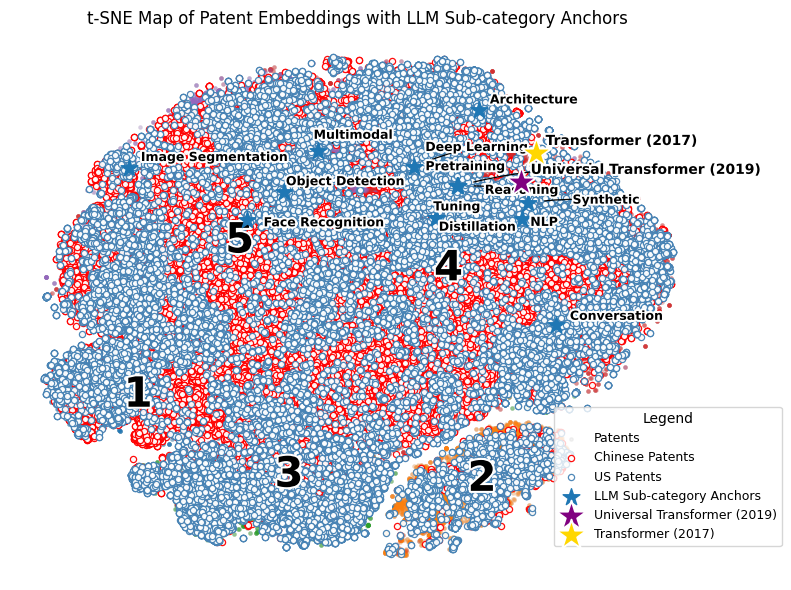

In [155]:
# Cell 7-(5b2) Country Highlights + soft colouring for ALL clusters
#  ── 목적: CN·US 하이라이트, 앵커 라벨, 3건 왕별 강조 표시.
#          KMeans 클러스터 경계선 대신 모든 클러스터를 반투명 색 패치로 표현(번호는 1부터 표기)

import numpy as np                         # ── 수치 연산
import matplotlib.pyplot as plt            # ── 시각화
import matplotlib.patheffects as pe        # ── 텍스트 외곽선 효과
from sklearn.decomposition import PCA      # ── 사전 PCA 축소
from sklearn.manifold import TSNE          # ── t-SNE 차원 축소
from sklearn.cluster import KMeans         # ── cluster_id_k 누락 시 보완용
from adjustText import adjust_text         # ── 텍스트 겹침 완화
import inspect, time                       # ── 버전 호환, 시간 측정

print("Subtitle: Country highlights with soft colouring for ALL clusters and three starred patents")  # ── 영어 소제목 출력

# -----------------------------
# 0) t-SNE 입력 구성 + dtype 최적화
# -----------------------------
X_tsne_input = np.vstack([X_all, category_emb]).astype(np.float32, copy=False)
N = X_all.shape[0]        # ── 특허 샘플 수
K = category_emb.shape[0] # ── 앵커 개수

# -----------------------------
# 1) 사전 PCA 축소로 속도·수렴 개선
# -----------------------------
pca_k = 50 if X_tsne_input.shape[1] > 50 else X_tsne_input.shape[1]
t0 = time.time()
X_pca = PCA(n_components=pca_k, svd_solver="randomized", random_state=42).fit_transform(X_tsne_input)
print(f"[PCA] reduced to {pca_k} dims in {time.time() - t0:.1f}s")

# -----------------------------
# 2) perplexity 자동 조정
# -----------------------------
n_samples = X_pca.shape[0]
base_perp = 30
max_valid_perp = max(5, (n_samples - 1) // 3)
perp = min(base_perp, max_valid_perp)

# -----------------------------
# 3) TSNE 버전 호환 인자 구성
# -----------------------------
tsne_common = dict(
    n_components=2,
    perplexity=perp,
    init="random",
    learning_rate="auto",
    method="barnes_hut",
    angle=0.6,
    random_state=42
)
sig = inspect.signature(TSNE.__init__).parameters
if "n_iter" in sig:
    tsne_common["n_iter"] = 750
elif "max_iter" in sig:
    tsne_common["max_iter"] = 750

# -----------------------------
# 4) t-SNE 투영
# -----------------------------
print(f"[t-SNE] fitting… n={n_samples}, perp={perp}")
t1 = time.time()
Y = TSNE(**tsne_common).fit_transform(X_pca)
print(f"[t-SNE] done in {time.time() - t1:.1f}s")

# -----------------------------
# 5) 좌표 분리
# -----------------------------
Y_patent = Y[:N, :]
Y_cat    = Y[N:N+K, :]

# -----------------------------
# 6) 국가별 마스크
# -----------------------------
cn_mask = (df_pred["country_code"] == "CN").values
us_mask = (df_pred["country_code"] == "US").values

# -----------------------------
# 6.5) KMeans 클러스터 라벨 확보(새 학습 최소화, 누락 시에만 계산)
# -----------------------------
if "cluster_id_k" not in df_pred.columns:
    km = KMeans(n_clusters=5, n_init=10, random_state=42)
    df_pred["cluster_id_k"] = km.fit_predict(X_all)
cluster_labels = df_pred["cluster_id_k"].to_numpy()

# -----------------------------
# 6.6) 강조할 클러스터: **전체** 표시
# -----------------------------
unique_all = np.unique(cluster_labels)
selected_cids = list(unique_all)  # ← 변경점: 모든 클러스터를 표시

# -----------------------------
# 7) 시각화
# -----------------------------
fig, ax = plt.subplots(figsize=(8, 6))

# (a) 모든 특허 lightgrey 베이스
ax.scatter(
    Y_patent[:, 0], Y_patent[:, 1],
    s=6, alpha=0.28, color="lightgrey", label="Patents", zorder=1
)

# (b) **모든** 클러스터 반투명 색 패치(경계선 없음) + 번호(1부터)
cmap = plt.cm.get_cmap("tab10")
for cid in selected_cids:
    idx = np.where(cluster_labels == cid)[0]
    if idx.size == 0:
        continue
    colour = cmap(int(cid) % 10)
    ax.scatter(
        Y_patent[idx, 0], Y_patent[idx, 1],
        s=10, alpha=0.25, color=colour, linewidths=0, zorder=2
    )
    cx, cy = Y_patent[idx, 0].mean(), Y_patent[idx, 1].mean()
    ax.text(
        cx, cy, str(int(cid) + 1),  # 번호 1부터 표기
        fontsize=30, weight="bold", color="black", ha="center", va="center",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")],
        zorder=4
    )

# (c) 중국 특허: 빨간 테두리, 흰색 내부
ax.scatter(
    Y_patent[cn_mask, 0], Y_patent[cn_mask, 1],
    s=20, facecolors="white", edgecolors="red", linewidths=0.9,
    alpha=0.95, label="Chinese Patents", zorder=3
)

# (d) 미국 특허: steelblue 테두리, 흰색 내부
ax.scatter(
    Y_patent[us_mask, 0], Y_patent[us_mask, 1],
    s=20, facecolors="white", edgecolors="steelblue", linewidths=0.9,
    alpha=0.95, label="US Patents", zorder=3
)

# (e) 카테고리 앵커 별표
ax.scatter(
    Y_cat[:, 0], Y_cat[:, 1],
    marker="*", s=160, label="LLM Sub-category Anchors", zorder=5
)

# (f) 앵커 라벨(겹침 최소화)
texts = []
for name, (x, y) in zip(category_names, Y_cat):
    t = ax.text(
        x, y, f" {name}",
        fontsize=9, weight="bold", zorder=6,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )
    texts.append(t)
adjust_text(
    texts,
    expand_points=(1.6, 1.4),
    expand_text=(1.2, 1.2),
    force_points=0.30,
    force_text=0.18,
    lim=250,
    only_move={"points": "y", "text": "xy"},
    arrowprops=dict(
        arrowstyle="-",
        lw=0.9,
        shrinkA=14,
        shrinkB=12,
        connectionstyle="arc3,rad=0.06"
    )
)

# -----------------------------
# (g) 주요 출원번호 3건 왕별 강조
# -----------------------------
def _make_id_mask(df, value):
    """appln_id 우선, 없으면 appl_id 사용, 모두 없으면 False 배열 반환"""
    if "appln_id" in df.columns:
        return (df["appln_id"] == value).values
    elif "appl_id" in df.columns:
        return (df["appl_id"] == value).values
    else:
        return np.zeros(len(df), dtype=bool)

def _highlight(appl_id_val, face_color, label_text):
    """대상 출원번호가 존재하면, 해당 위치에 큰 별과 텍스트 라벨 추가"""
    mask = _make_id_mask(df_pred, appl_id_val)
    idxs = np.where(mask)[0]
    if idxs.size == 0:
        print(f"[info] Target patent '{appl_id_val}' not found. Skipping.")
        return
    i0 = int(idxs[0])
    if i0 >= Y_patent.shape[0]:
        print(f"[warn] Highlight index for '{appl_id_val}' exceeds Y_patent length.")
        return
    x, y = Y_patent[i0, 0], Y_patent[i0, 1]
    ax.scatter(
        [x], [y],
        marker="*", s=520, linewidths=1.4,
        edgecolors="white", facecolors=face_color, alpha=1.0,
        label=label_text, zorder=7
    )
    ax.text(
        x + 2.5, y + 2.5, label_text,
        fontsize=10, weight="bold", zorder=8,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

# ── 보라색: Universal Transformer (2019), 황금색: Transformer (2017), 검정: ChatGPT (2023)
_highlight("16/417587", "purple", "Universal Transformer (2019)")
_highlight("16/021971", "gold",   "Transformer (2017)")
_highlight("18/183902", "black",  "ChatGPT (2023)")

# -----------------------------
# (h) 제목, 범례, 축
# -----------------------------
ax.set_title("t-SNE Map of Patent Embeddings with LLM Sub-category Anchors")
ax.legend(title="Legend", frameon=True, loc="lower right",
          bbox_to_anchor=(1.12, 0.05), fontsize=9)
ax.axis("off")
plt.tight_layout()
plt.show()


In [156]:
# Cell 7-(5b4) · Robust REV: Per-cluster US vs CN GenAI keywords — top-5 tables (index-safe, tolerant patterns)

import re
import unicodedata
import numpy as np
import pandas as pd
from collections import defaultdict

print("Subtitle: Per-cluster US vs CN GenAI keywords — robust matching, all clusters shown")

# 0) 필수 컬럼 및 인덱스 정합성
req_cols = {"cluster_id_k", "country_code"}
missing = req_cols - set(df_pred.columns)
assert not missing, f"Missing columns in df_pred: {sorted(missing)}"
assert "tac_text" in df_expl3.columns, "df_expl3['tac_text'] is required."

# df_expl3를 df_pred 인덱스 순서로 재정렬(정합성 보장)
df_expl3_aligned = df_expl3.reindex(df_pred.index)

# 텍스트 소스 결합: tac_text + title_en + abstract_en(존재할 때만)
parts = [df_expl3_aligned["tac_text"].astype(str)]
if "title_en" in df_pred.columns:
    parts.append(df_pred["title_en"].astype(str))
if "abstract_en" in df_pred.columns:
    parts.append(df_pred["abstract_en"].astype(str))
texts_all = (
    pd.Series([" ".join(vals) for vals in zip(*parts)], index=df_pred.index)
)

# 텍스트 정규화: 유니코드 정규화, 소문자, 하이픈류를 공백으로 통일
def _norm_text(s: str) -> str:
    # 유니코드 정규화(NFKC)
    s = unicodedata.normalize("NFKC", s)
    s = s.lower()
    # 다양한 대시를 일반 하이픈으로, 이어서 공백으로 치환
    s = s.replace("–", "-").replace("—", "-").replace("−", "-")
    s = re.sub(r"[-_/]+", " ", s)
    # 다중 공백 축약
    s = re.sub(r"\s+", " ", s).strip()
    return s

texts_all = texts_all.fillna("").map(_norm_text)

cluster_labels = df_pred["cluster_id_k"].to_numpy()
country_codes  = df_pred["country_code"].astype(str).to_numpy()

# 1) 키워드 패턴 재사용 또는 관대한 재컴파일
if "ai_patterns" in globals() and isinstance(ai_patterns, dict):
    # 이미 컴파일된 패턴이 있다면 사용
    patterns = ai_patterns
elif "ai_terms_en" in globals() and isinstance(ai_terms_en, dict):
    # 사전의 정규식을 더 관대하게 재컴파일: 공백/하이픈 가변, 복수형 s? 허용
    def relax(pat: str) -> str:
        # 공백을 \s+ 로, 하이픈은 이미 공백으로 정규화했으므로 단순 공백 매칭
        # 괄호식 대안 내부는 그대로 두되, 단어 경계는 유지
        # 흔한 복수형 s 옵션을 일부 항목에 부여(영향을 줄이기 위해 말단 단어에 한정)
        # 예: "large language model" -> r"\blarge\s+language\s+models?\b"
        base = pat
        # 빠른 경로: canonical 문구일 때
        if not any(ch in base for ch in r"()|[]\{}?+*^$"):
            base = re.sub(r"\s+", r"\\s+", base.strip())
            if not base.endswith("s?"):
                base = base + "s?"
            return rf"\b{base}\b"
        # 원래 정규식이면 그대로 쓰되, 하이픈은 이미 정규화됐으므로 변경 없음
        return pat

    patterns = {k: re.compile(relax(v), re.IGNORECASE) for k, v in ai_terms_en.items()}
else:
    raise ValueError("Neither 'ai_patterns' nor 'ai_terms_en' found from earlier cells.")

terms = list(patterns.keys())

# 2) 클러스터 목록(모든 클러스터 강제 표출)
unique_cids = np.unique(cluster_labels)

def _cid_to_display(cid):
    try:
        return int(cid) + 1
    except Exception:
        return cid

for cid in unique_cids:
    sel_mask = (cluster_labels == cid)
    sub_idx = np.where(sel_mask)[0]
    if sub_idx.size == 0:
        continue

    sub_cty = country_codes[sub_idx]
    is_us = (sub_cty == "US")
    is_cn = (sub_cty == "CN")

    sel_texts = texts_all.iloc[sub_idx].tolist()

    # 3) 키워드 카운트(US, CN 분리)
    us_counts = defaultdict(int)
    cn_counts = defaultdict(int)

    for txt, us_flag, cn_flag in zip(sel_texts, is_us, is_cn):
        for term in terms:
            hits = len(patterns[term].findall(txt))
            if hits:
                if us_flag:
                    us_counts[term] += hits
                elif cn_flag:
                    cn_counts[term] += hits

    # 4) 표 생성(합계 기준 상위 5, 없으면 빈 행 출력)
    rows = []
    for term in terms:
        u = int(us_counts.get(term, 0))
        c = int(cn_counts.get(term, 0))
        t = u + c
        if t > 0:
            rows.append((term, u, c, t))

    if rows:
        df_kw = pd.DataFrame(rows, columns=["keyword", "US_count", "CN_count", "Total"])
        df_kw.sort_values("Total", ascending=False, inplace=True)
        top5 = df_kw.head(5).copy()

        # 비율
        top5["US_share_%"] = (100 * top5["US_count"] / top5["Total"]).round(1)
        top5["CN_share_%"] = (100 * top5["CN_count"] / top5["Total"]).round(1)
        top5["ratio_pct_fmt"] = (
            top5["US_share_%"].round().astype(int).astype(str) + "/" +
            top5["CN_share_%"].round().astype(int).astype(str)
        )
        top5.insert(0, "cluster_no", _cid_to_display(cid))
        top5.insert(1, "rank", np.arange(1, len(top5) + 1))
    else:
        # 해당 클러스터에 매칭된 키워드가 하나도 없을 때도 반드시 표를 출력
        top5 = pd.DataFrame({
            "cluster_no": [_cid_to_display(cid)],
            "rank": [None],
            "keyword": ["(no matching keywords)"],
            "US_count": [0],
            "CN_count": [0],
            "Total": [0],
            "US_share_%": [0.0],
            "CN_share_%": [0.0],
            "ratio_pct_fmt": ["0/0"]
        })

    print(f"\n=== Cluster { _cid_to_display(cid) } ===")
    display(top5[["cluster_no", "rank", "keyword",
                  "US_count", "CN_count", "Total",
                  "US_share_%", "CN_share_%", "ratio_pct_fmt"]])


Subtitle: Per-cluster US vs CN GenAI keywords — robust matching, all clusters shown

=== Cluster 1 ===


,cluster_no,rank,keyword,US_count,CN_count,Total,US_share_%,CN_share_%,ratio_pct_fmt
2,1,1,embedding,12,264,276,4.3,95.7,4/96
13,1,2,distillation,0,269,269,0.0,100.0,0/100
5,1,3,GAN,60,45,105,57.1,42.9,57/43
1,1,4,attention,1,103,104,1.0,99.0,1/99
16,1,5,object detection,0,87,87,0.0,100.0,0/100



=== Cluster 2 ===


,cluster_no,rank,keyword,US_count,CN_count,Total,US_share_%,CN_share_%,ratio_pct_fmt
15,2,1,text to speech,91,0,91,100.0,0.0,100/0
16,2,2,ASR,81,0,81,100.0,0.0,100/0
4,2,3,GAN,39,3,42,92.9,7.1,93/7
18,2,4,gpu,22,12,34,64.7,35.3,65/35
17,2,5,neural processing unit,0,26,26,0.0,100.0,0/100



=== Cluster 3 ===


,cluster_no,rank,keyword,US_count,CN_count,Total,US_share_%,CN_share_%,ratio_pct_fmt
0,3,1,transformer,60,315,375,16.0,84.0,16/84
6,3,2,prompt,13,195,208,6.2,93.8,6/94
2,3,3,embedding,14,111,125,11.2,88.8,11/89
19,3,4,speech recognition,11,69,80,13.8,86.2,14/86
12,3,5,image recognition,4,64,68,5.9,94.1,6/94



=== Cluster 4 ===


,cluster_no,rank,keyword,US_count,CN_count,Total,US_share_%,CN_share_%,ratio_pct_fmt
1,4,1,attention,2665,28481,31146,8.6,91.4,9/91
30,4,2,speech recognition,11298,10949,22247,50.8,49.2,51/49
2,4,3,embedding,7594,11586,19180,39.6,60.4,40/60
0,4,4,transformer,812,6210,7022,11.6,88.4,12/88
15,4,5,pre-training,292,6187,6479,4.5,95.5,4/96



=== Cluster 5 ===


,cluster_no,rank,keyword,US_count,CN_count,Total,US_share_%,CN_share_%,ratio_pct_fmt
1,5,1,attention,1135,39711,40846,2.8,97.2,3/97
21,5,2,image segmentation,1504,19489,20993,7.2,92.8,7/93
19,5,3,image recognition,832,15857,16689,5.0,95.0,5/95
20,5,4,object detection,1551,9047,10598,14.6,85.4,15/85
2,5,5,embedding,2821,4655,7476,37.7,62.3,38/62


Subtitle: Global patents with cluster-only colouring, no country-specific overlays


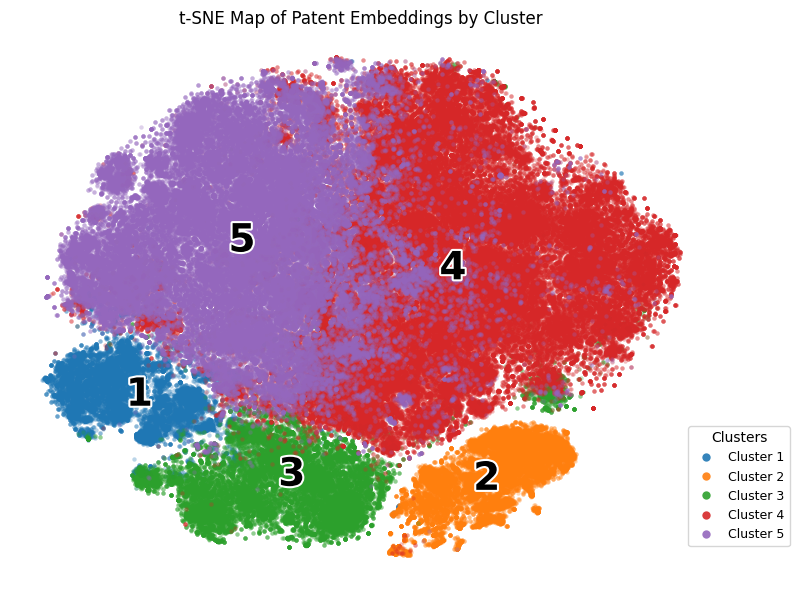

In [157]:
# ## Cell 7-(5b4): Global patents, cluster-only colouring (no NL overlay, no stars)
#  ── 목적: 모든 특허를 클러스터 색으로만 표시, 범례는 클러스터만

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from sklearn.cluster import KMeans

print("Subtitle: Global patents with cluster-only colouring, no country-specific overlays")

# 0) 클러스터 라벨 확보(없으면 보완)
if "cluster_id_k" not in df_pred.columns:
    # 이전 셀과 동일한 기본값 유지
    km = KMeans(n_clusters=5, n_init=10, random_state=42)
    df_pred["cluster_id_k"] = km.fit_predict(X_all)

cluster_labels = df_pred["cluster_id_k"].to_numpy()
if len(cluster_labels) != Y_patent.shape[0]:
    raise RuntimeError("Length mismatch between cluster_id_k and Y_patent.")

unique_clusters = np.unique(cluster_labels)

# 1) 시각화
fig, ax = plt.subplots(figsize=(8, 6))
cmap = plt.cm.get_cmap("tab10")

legend_handles = []
legend_labels  = []

for cid in unique_clusters:
    idx = np.where(cluster_labels == cid)[0]
    if idx.size == 0:
        continue
    colour = cmap(int(cid) % 10)

    # 클러스터 포인트
    ax.scatter(
        Y_patent[idx, 0], Y_patent[idx, 1],
        s=10, alpha=0.30, color=colour, linewidths=0, zorder=2
    )

    # 클러스터 번호 라벨(중심)
    cx, cy = Y_patent[idx, 0].mean(), Y_patent[idx, 1].mean()
    ax.text(
        cx, cy, str(int(cid) + 1),
        fontsize=28, weight="bold", color="black", ha="center", va="center", zorder=3,
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

    # 범례용 더미 핸들
    h = plt.Line2D([0], [0], marker='o', linestyle='',
                   markersize=6, markerfacecolor=colour, markeredgewidth=0, alpha=0.90)
    legend_handles.append(h)
    legend_labels.append(f"Cluster {int(cid) + 1}")

# 2) 제목, 범례, 축
ax.set_title("t-SNE Map of Patent Embeddings by Cluster")
ax.legend(legend_handles, legend_labels, title="Clusters",
          frameon=True, loc="lower right", bbox_to_anchor=(1.12, 0.05), fontsize=9)
ax.axis("off")
plt.tight_layout()
plt.show()


In [158]:
# ## Cell 7-(5c1): Per-cluster GenAI keywords — top-10 tables (same robust rules as 7-(5b4))
#  ── 목적: 클러스터별 대표 키워드 상위 10개 추출(US·CN 구분 없이 총합), 인덱스·정규화·관대한 패턴 동일 적용

import re
import unicodedata
import numpy as np
import pandas as pd
from collections import defaultdict

print("Subtitle: Per-cluster GenAI keywords — robust matching, cluster-wise top-10")

# -----------------------------
# 0) 필수 컬럼 및 인덱스 정합성
# -----------------------------
req_cols = {"cluster_id_k"}
missing = req_cols - set(df_pred.columns)
assert not missing, f"Missing columns in df_pred: {sorted(missing)}"
assert "tac_text" in df_expl3.columns, "df_expl3['tac_text'] is required."

# df_expl3를 df_pred 인덱스 순서로 재정렬(정합성 보장)
df_expl3_aligned = df_expl3.reindex(df_pred.index)

# -----------------------------
# 1) 텍스트 소스 결합 및 정규화(7-(5b4)와 동일 정책)
# -----------------------------
parts = [df_expl3_aligned["tac_text"].astype(str)]
if "title_en" in df_pred.columns:
    parts.append(df_pred["title_en"].astype(str))
if "abstract_en" in df_pred.columns:
    parts.append(df_pred["abstract_en"].astype(str))

texts_all = pd.Series([" ".join(vals) for vals in zip(*parts)], index=df_pred.index)

def _norm_text(s: str) -> str:
    s = unicodedata.normalize("NFKC", s)
    s = s.lower()
    s = s.replace("–", "-").replace("—", "-").replace("−", "-")
    s = re.sub(r"[-_/]+", " ", s)
    s = re.sub(r"\s+", " ", s).strip()
    return s

texts_all = texts_all.fillna("").map(_norm_text)

cluster_labels = df_pred["cluster_id_k"].to_numpy()

# -----------------------------
# 2) 키워드 패턴 재사용 또는 관대한 재컴파일(7-(5b4)와 동일 정책)
# -----------------------------
if "ai_patterns" in globals() and isinstance(ai_patterns, dict):
    patterns = ai_patterns
elif "ai_terms_en" in globals() and isinstance(ai_terms_en, dict):
    def relax(pat: str) -> str:
        base = pat
        if not any(ch in base for ch in r"()|[]\{}?+*^$"):
            base = re.sub(r"\s+", r"\\s+", base.strip())
            if not base.endswith("s?"):
                base = base + "s?"
            return rf"\b{base}\b"
        return pat
    patterns = {k: re.compile(relax(v), re.IGNORECASE) for k, v in ai_terms_en.items()}
else:
    raise ValueError("Neither 'ai_patterns' nor 'ai_terms_en' found from earlier cells.")

terms = list(patterns.keys())

# -----------------------------
# 3) 클러스터별 카운트(총합 기준, 문서빈도도 병행)
# -----------------------------
def _cid_to_display(cid):
    try:
        return int(cid) + 1
    except Exception:
        return cid

unique_cids = np.unique(cluster_labels)
all_tables = []   # 콘솔리데이티드 테이블 저장

for cid in unique_cids:
    sel_mask = (cluster_labels == cid)
    sub_idx = np.where(sel_mask)[0]
    if sub_idx.size == 0:
        continue

    sel_texts = texts_all.iloc[sub_idx].tolist()

    # 용어별 총 발생 수와 문서빈도
    tot_counts = defaultdict(int)      # 전체 히트 수(sum of matches)
    doc_freq   = defaultdict(int)      # 해당 용어가 등장한 문서 수

    for txt in sel_texts:
        seen_in_doc = set()
        for term in terms:
            hits = len(patterns[term].findall(txt))
            if hits:
                tot_counts[term] += hits
                if term not in seen_in_doc:
                    doc_freq[term] += 1
                    seen_in_doc.add(term)

    rows = []
    for term in terms:
        t = int(tot_counts.get(term, 0))
        d = int(doc_freq.get(term, 0))
        if t > 0:
            rows.append((term, t, d))

    if rows:
        df_kw = pd.DataFrame(rows, columns=["keyword", "Total_hits", "Doc_freq"])
        # 우선순위: Total_hits 내림차순, 동률이면 Doc_freq, 그 다음 알파벳
        df_kw.sort_values(["Total_hits", "Doc_freq", "keyword"], ascending=[False, False, True], inplace=True)
        topn = df_kw.head(10).copy()
        topn.insert(0, "cluster_no", _cid_to_display(cid))
        topn.insert(1, "rank", np.arange(1, len(topn) + 1))
    else:
        topn = pd.DataFrame({
            "cluster_no": [_cid_to_display(cid)],
            "rank": [None],
            "keyword": ["(no matching keywords)"],
            "Total_hits": [0],
            "Doc_freq": [0]
        })

    print(f"\n=== Cluster { _cid_to_display(cid) } ===")
    display(topn[["cluster_no", "rank", "keyword", "Total_hits", "Doc_freq"]])
    all_tables.append(topn)

# -----------------------------
# 4) 콘솔리데이티드 결과(선택 저장)
# -----------------------------
if len(all_tables):
    keywords_by_cluster = pd.concat(all_tables, ignore_index=True)
    print("\n[info] Consolidated table shape:", keywords_by_cluster.shape)
    # 저장을 원하면 주석 해제
    # keywords_by_cluster.to_csv("/mnt/data/cluster_keywords_top10.csv", index=False)
    # print("Saved to /mnt/data/cluster_keywords_top10.csv")


Subtitle: Per-cluster GenAI keywords — robust matching, cluster-wise top-10

=== Cluster 1 ===


,cluster_no,rank,keyword,Total_hits,Doc_freq
2,1,1,embedding,292,103
14,1,2,distillation,274,107
5,1,3,GAN,122,20
1,1,4,attention,106,42
17,1,5,object detection,87,13
18,1,6,image segmentation,56,20
16,1,7,image recognition,56,19
9,1,8,retrieval augmented generation,32,15
8,1,9,prompt,30,21
0,1,10,transformer,26,10



=== Cluster 2 ===


,cluster_no,rank,keyword,Total_hits,Doc_freq
8,2,1,GAN,530,220
1,2,2,attention,217,113
30,2,3,text to speech,152,34
32,2,4,ASR,143,25
34,2,5,gpu,140,38
2,2,6,embedding,124,74
21,2,7,object detection,123,54
33,2,8,neural processing unit,106,29
0,2,9,transformer,98,56
9,2,10,VAE,91,20



=== Cluster 3 ===


,cluster_no,rank,keyword,Total_hits,Doc_freq
0,3,1,transformer,451,95
7,3,2,prompt,237,81
2,3,3,embedding,153,78
22,3,4,speech recognition,108,47
14,3,5,image recognition,77,31
1,3,6,attention,50,28
15,3,7,object detection,40,13
12,3,8,distillation,32,9
25,3,9,fpga,23,5
9,3,10,fine-tuning,22,11



=== Cluster 4 ===


,cluster_no,rank,keyword,Total_hits,Doc_freq
1,4,1,attention,33092,5650
30,4,2,speech recognition,33057,8309
2,4,3,embedding,22514,4690
4,4,4,inference,8463,2429
17,4,5,quantization,8054,1656
0,4,6,transformer,7564,1514
15,4,7,pre-training,6630,2062
33,4,8,ASR,4910,867
12,4,9,prompt,4072,1218
38,4,10,fpga,3200,448



=== Cluster 5 ===


,cluster_no,rank,keyword,Total_hits,Doc_freq
1,5,1,attention,42109,6290
21,5,2,image segmentation,22654,5184
19,5,3,image recognition,18290,5333
20,5,4,object detection,13047,3395
2,5,5,embedding,8617,1989
23,5,6,face recognition,6808,1471
14,5,7,pre-training,5323,2085
7,5,8,GAN,4467,926
0,5,9,transformer,4189,1046
26,5,10,image generation,3533,1107



[info] Consolidated table shape: (50, 5)


## **7-(5c): Compute and Plot Category Similarity Heatmap**

                    Models  Tuning  Reasoning  Architecture  Pretraining  \
Models               1.000   0.541      0.618         0.644        0.634   
Tuning               0.541   1.000      0.530         0.586        0.584   
Reasoning            0.618   0.530      1.000         0.528        0.565   
Architecture         0.644   0.586      0.528         1.000        0.659   
Pretraining          0.634   0.584      0.565         0.659        1.000   
Conversation         0.595   0.536      0.580         0.667        0.594   
Deep Learning        0.568   0.533      0.605         0.635        0.536   
NLP                  0.623   0.572      0.588         0.574        0.622   
Multimodal           0.531   0.502      0.425         0.631        0.506   
Distillation         0.540   0.598      0.526         0.555        0.646   
Synthetic            0.626   0.570      0.549         0.487        0.528   
Image Segmentation   0.417   0.414      0.399         0.457        0.371   
Object Detec

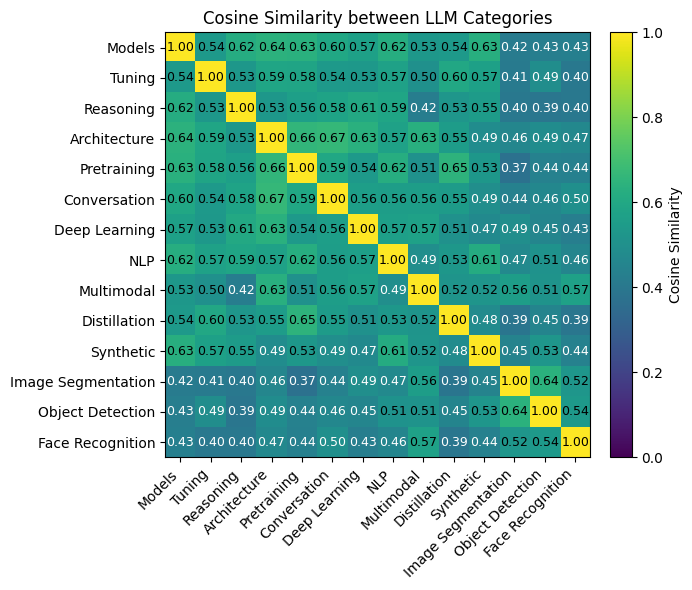

In [159]:
# Cell 7-(5c): Compute and Plot Category Similarity Heatmap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Ensure category_emb and category_names are in memory from Cell 7-(5a)

# 1) Compute cosine similarity matrix
norms      = np.linalg.norm(category_emb, axis=1, keepdims=True)
emb_norm   = category_emb / norms
sim_matrix = emb_norm @ emb_norm.T  # shape: (7, 7)

# 2) (Optional) Display as a pandas DataFrame
df_sim = pd.DataFrame(sim_matrix, index=category_names, columns=category_names)
print(df_sim.round(3))

# 3) Plot heatmap with annotations
fig, ax = plt.subplots(figsize=(7, 6))
cax = ax.imshow(sim_matrix, cmap='viridis', vmin=0, vmax=1)

# Set tick labels
ax.set_xticks(np.arange(len(category_names)))
ax.set_yticks(np.arange(len(category_names)))
ax.set_xticklabels(category_names, rotation=45, ha='right')
ax.set_yticklabels(category_names)

# Annotate each cell with its similarity value
for i in range(len(category_names)):
    for j in range(len(category_names)):
        color = 'white' if sim_matrix[i, j] < 0.5 else 'black'
        ax.text(j, i, f"{sim_matrix[i, j]:.2f}", ha='center', va='center', color=color, fontsize=9)

# Add colorbar and title
fig.colorbar(cax, ax=ax, fraction=0.046, pad=0.04, label='Cosine Similarity')
ax.set_title("Cosine Similarity between LLM Categories")
plt.tight_layout()
plt.show()


## **7-(6): Distance summaries and quick checks**

In [160]:
# Cell 7-(6): Distance summaries and quick checks
import numpy as np

def describe(v):
    return {
        "min": float(np.min(v)),
        "p25": float(np.percentile(v, 25)),
        "median": float(np.percentile(v, 50)),
        "p75": float(np.percentile(v, 75)),
        "p95": float(np.percentile(v, 95)),
        "max": float(np.max(v)),
    }

print("Cluster cosine distance:", describe(df_pred["dist_cluster_cos"].to_numpy()))
print("Anchor  cosine distance:", describe(df_pred["dist_anchor_cos"].to_numpy()))

# Top-20 farthest from own cluster centroid
top20 = (
    df_pred.nlargest(20, "dist_cluster_cos")[["cluster_id_k", "dist_cluster_cos", "dist_anchor_cos", "anchor_name"]]
    .sort_values(by=["cluster_id_k", "dist_anchor_cos"], ascending=[True, True])
)
display(top20)



Cluster cosine distance: {'min': 0.008999228477478027, 'p25': 0.2839762270450592, 'median': 0.3309786319732666, 'p75': 0.37582671642303467, 'p95': 0.44202321767807007, 'max': 0.7275298833847046}
Anchor  cosine distance: {'min': 0.29013848304748535, 'p25': 0.5330788493156433, 'median': 0.5728068947792053, 'p75': 0.6220817565917969, 'p95': 0.6822134256362915, 'max': 0.8185561299324036}


,cluster_id_k,dist_cluster_cos,dist_anchor_cos,anchor_name
10718,0,0.610087,0.679855,Tuning
96512,0,0.608028,0.704868,Models
96531,0,0.603043,0.705287,Models
58360,0,0.609167,0.707236,Face Recognition
234469,0,0.599985,0.719540,Architecture
234697,0,0.600718,0.722509,Architecture
57799,0,0.616247,0.724100,Distillation
226170,0,0.594623,0.729758,Tuning
237704,0,0.612457,0.732719,Image Segmentation
234406,0,0.600302,0.770998,Multimodal


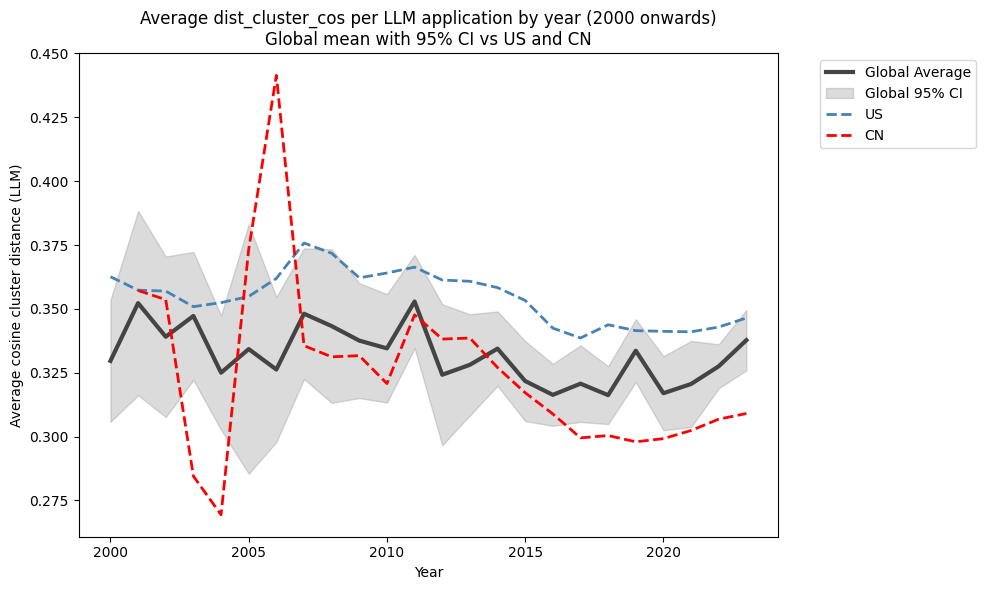

In [161]:
# Cell 6-(8i): LLM subtype only — yearly dist_cluster_cos trend (2000 onwards) with 95% CI

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별 + 2000년 이후만
llm_df = (
    df_pred.loc[
        (df_pred["genai_subtype_pred"] == "LLM") & (df_pred["year"] >= 2000),
        ["year", "country_code", "dist_cluster_cos"]
    ]
    .dropna(subset=["year", "country_code", "dist_cluster_cos"])
)

# 2) 연도·국가별 평균 거리 계산
llm_dist_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["dist_cluster_cos"].mean()
)
llm_dist_wide = (
    llm_dist_mean.pivot(index="year", columns="country_code", values="dist_cluster_cos")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_dist_wide.mean(axis=1)
global_std  = llm_dist_wide.std(axis=1, ddof=1)
n_countries = llm_dist_wide.notna().sum(axis=1)
global_se   = global_std / np.sqrt(n_countries)
ci95 = 1.96 * global_se

# 4) 미국, 중국 시계열
us_series = llm_dist_wide["US"] if "US" in llm_dist_wide.columns else None
cn_series = llm_dist_wide["CN"] if "CN" in llm_dist_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% CI 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average cosine cluster distance (LLM)')
plt.title("Average dist_cluster_cos per LLM application by year (2000 onwards)\nGlobal mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


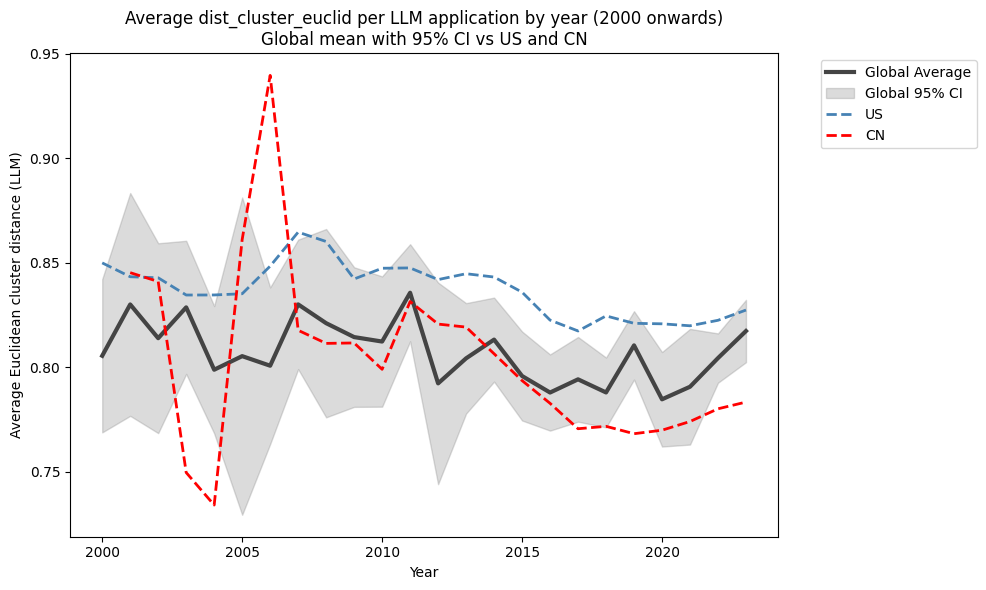

In [162]:
# Cell 6-(8j): LLM subtype only — yearly dist_cluster_euclid trend (2000 onwards) with 95% CI

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) LLM만 선별 + 2000년 이후만
llm_df = (
    df_pred.loc[
        (df_pred["genai_subtype_pred"] == "LLM") & (df_pred["year"] >= 2000),
        ["year", "country_code", "dist_cluster_euclid"]
    ]
    .dropna(subset=["year", "country_code", "dist_cluster_euclid"])
)

# 2) 연도·국가별 평균 거리 계산
llm_dist_mean = (
    llm_df.groupby(["year", "country_code"], as_index=False)["dist_cluster_euclid"].mean()
)
llm_dist_wide = (
    llm_dist_mean.pivot(index="year", columns="country_code", values="dist_cluster_euclid")
    .sort_index()
)

# 3) 글로벌 평균과 95% 신뢰구간
global_mean = llm_dist_wide.mean(axis=1)
global_std  = llm_dist_wide.std(axis=1, ddof=1)
n_countries = llm_dist_wide.notna().sum(axis=1)
global_se   = global_std / np.sqrt(n_countries)
ci95 = 1.96 * global_se

# 4) 미국, 중국 시계열
us_series = llm_dist_wide["US"] if "US" in llm_dist_wide.columns else None
cn_series = llm_dist_wide["CN"] if "CN" in llm_dist_wide.columns else None

# 5) Plot
plt.figure(figsize=(10, 6))

# 글로벌 평균 + 95% CI 실루엣
plt.plot(global_mean.index, global_mean.values,
         linestyle='-', linewidth=3, color='#444444', label='Global Average')
plt.fill_between(global_mean.index,
                 global_mean - ci95,
                 global_mean + ci95,
                 color='#888888', alpha=0.3, label='Global 95% CI')

# 미국
if us_series is not None:
    plt.plot(us_series.index, us_series.values,
             linestyle='--', linewidth=2, color='steelblue', label='US')

# 중국
if cn_series is not None:
    plt.plot(cn_series.index, cn_series.values,
             linestyle='--', linewidth=2, color='red', label='CN')

plt.xlabel('Year')
plt.ylabel('Average Euclidean cluster distance (LLM)')
plt.title("Average dist_cluster_euclid per LLM application by year (2000 onwards)\nGlobal mean with 95% CI vs US and CN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# **8. Network Analysis**

## **8-(1) Initialize Network DataFrame and Analysis Period (df_network)**

In [163]:
# Cell 8-(1): Initialize Network DataFrame and Analysis Period

# 1) Copy the source DataFrame for network construction
df_network = df_expl.copy()

# 2) Define analysis period
year_sel = list(range(2000, 2024)) # 2000 - 2023

In [164]:
df_network.loc[df_network['appl_id'] == '16/417587', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat
215258,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,MOSTAFA DEHGHANI,NL
215259,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,STEPHAN GOUWS,GB
215260,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,ORIOL VINYALS,GB
215261,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,JAKOB D USZKOREIT,US
215262,16/417587,US,GOOGLE INC,2019.0,US,G06N-0003/044,5.0,LUKASZ MIECZYSLAW KAISER,US


In [165]:
df_pred.loc[df_pred['appl_id'] == '16/417587', ['appl_id', 'PTO_id', 'applicant', 'year', 'country_code', 'cpc_main', 'num_inventors', 'inventor', 'inventor_nat', 'genai_pred', 'genai_subtype_pred']]

,appl_id,PTO_id,applicant,year,country_code,cpc_main,num_inventors,inventor,inventor_nat,genai_pred,genai_subtype_pred
60999,16/417587,US,GOOGLE INC,2019,US,G06N-0003/044,5.0,MOSTAFA DEHGHANI,NL,GenAI,LLM


## **8-(2): Filter Network for LLM Patents**

In [166]:
# Cell 8-(2): Filter to LLM Patents

# 1) Get the list of appl_ids predicted as LLM (from your df_pred)
llm_appl_ids = df_pred.loc[
    df_pred["genai_pred"] == "GenAI",
    "appl_id"
].unique().tolist()

# 2) Keep only inventor–patent rows for those LLM appl_ids
df_network_llm = df_network[df_network["appl_id"].isin(llm_appl_ids)].copy()
print(f"Raw inventor–patent rows for LLM: {df_network_llm.shape[0]}")


Raw inventor–patent rows for LLM: 389645


In [167]:
# Cell 8-(2): Filter to LLM Patents

# 1) Get the list of appl_ids predicted as LLM (from your df_pred)
llm_appl_ids = df_pred.loc[
    df_pred["genai_subtype_pred"] == "LLM",
    "appl_id"
].unique().tolist()

# 2) Keep only inventor–patent rows for those LLM appl_ids
df_network_llm = df_network[df_network["appl_id"].isin(llm_appl_ids)].copy()
print(f"Raw inventor–patent rows for LLM: {df_network_llm.shape[0]}")


Raw inventor–patent rows for LLM: 394940


### **8-(3) Build Co‑Authorship Graphs for 5‑Year Periods**

In [168]:
# Cell 8-(3) Build Co‑Authorship Graphs for 5‑Year Periods

# 1) Define the 5‑year bins
periods = [
    ("2000–2004", range(2000, 2005)),
    ("2005–2009", range(2005, 2010)),
    ("2010–2014", range(2010, 2015)),
    ("2015–2019", range(2015, 2020)),
    ("2020–2024", range(2020, 2025)),
]

# 2) For each period, build and prune the subgraph
G_periods = {}
no_nodes = 1000

for label, yrs in periods:
    inv_lists = (
        df_network_llm[df_network_llm["year"].isin(yrs)]
            .groupby("appl_id")["inventor"]
            .agg(lambda x: x.unique().tolist())
    )
    Gp = nx.Graph()
    for invs in inv_lists:
        if len(invs) < 2:
            continue
        for i, a in enumerate(invs):
            for b in invs[i+1:]:
                if Gp.has_edge(a, b):
                    Gp[a][b]["weight"] += 1
                else:
                    Gp.add_edge(a, b, weight=1)
    degs = dict(Gp.degree())
    top = sorted(degs, key=degs.get, reverse=True)[:no_nodes]
    G_periods[label] = Gp.subgraph(top).copy()
    print(f"{label}: nodes={G_periods[label].number_of_nodes()}, "
          f"edges={G_periods[label].number_of_edges()}")


2000–2004: nodes=799, edges=1092
2005–2009: nodes=1000, edges=2218
2010–2014: nodes=1000, edges=4007
2015–2019: nodes=1000, edges=6898
2020–2024: nodes=1000, edges=10613


## **8-(4) Visualize Periodic Co‑Authorship Networks**

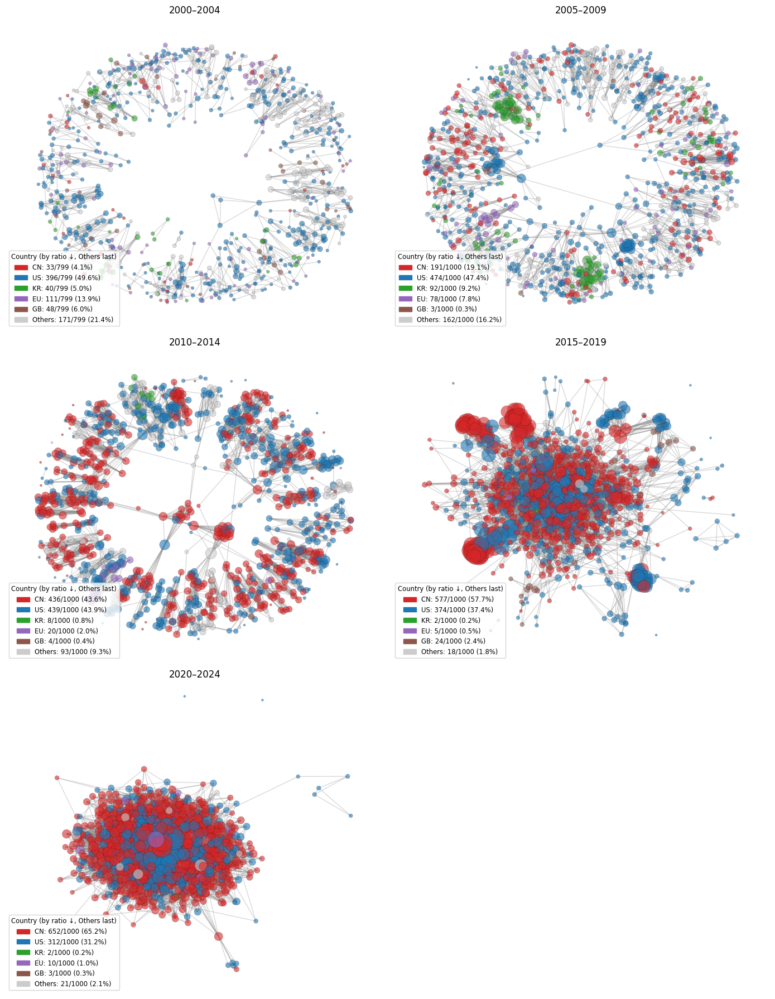

In [169]:
# Cell 8-(4) Visualize Periodic Co‑Authorship Networks with Consistent Country Colors & Transparency

# Ensure G_periods is available
if 'G_periods' not in globals():
    raise RuntimeError("Run Cell 13-(3) first")

# Country grouping setup and explicit colors
EU_CODES = {
    "AT","BE","BG","HR","CY","CZ","DK","EE","FI","FR","DE","GR",
    "HU","IE","IT","LV","LT","LU","MT","NL","PL","PT","RO","SK","SI","ES","SE"
}
# fixed colors
group_color = {
    "CN": "#d62728",    # red
    "US": "#1f77b4",    # blue
    "KR": "#2ca02c",    # green
    "EU": "#9467bd",    # purple
    "GB": "#8c564b",    # brown
    "Others": "#CCCCCC" # grey
}
all_groups = list(group_color.keys())

fig, axes = plt.subplots(3, 2, figsize=(14, 18))
axes = axes.flatten()

for idx, (label, Gp) in enumerate(G_periods.items()):
    ax = axes[idx]
    pos = nx.spring_layout(Gp, k=0.2, seed=42)
    deg = dict(Gp.degree())
    nodes = list(deg.keys())
    sizes = [(deg[n] + 1) * 8 for n in nodes]

    # Map inventor → nationality group
    nat = {
        n: df_network_llm.loc[df_network_llm["inventor"] == n, "inventor_nat"].iloc[0]
        for n in nodes
    }
    grp = {
        n: (
            "CN" if nat[n] == "CN" else
            "US" if nat[n] == "US" else
            "KR" if nat[n] == "KR" else
            "EU" if nat[n] in EU_CODES else
            "GB" if nat[n] == "GB" else
            "Others"
        )
        for n in nodes
    }
    colors = [group_color[grp[n]] for n in nodes]

    # Draw edges & nodes with transparency
    nx.draw_networkx_edges(Gp, pos, ax=ax, alpha=0.3, edge_color="gray")
    nx.draw_networkx_nodes(
        Gp, pos, ax=ax,
        node_size=sizes,
        node_color=colors,
        alpha=0.6,              # uniform transparency
        linewidths=0.2,
        edgecolors="black"
    )

    ax.set_title(label)
    ax.axis("off")

    # Build legend for this subplot, Others last
    counts = {g: sum(1 for n in nodes if grp[n] == g) for g in all_groups}
    total = len(nodes)
    sorted_groups = [g for g in ["CN","US","KR","EU","GB"] if counts[g]>0] + ["Others"]
    handles = []
    for g in sorted_groups:
        if counts[g] == 0:
            continue
        pct = counts[g] / total * 100
        handles.append(mpatches.Patch(
            color=group_color[g],
            label=f"{g}: {counts[g]}/{total} ({pct:.1f}%)"
        ))

    ax.legend(
        handles=handles,
        title="Country (by ratio ↓, Others last)",
        loc="lower left",
        fontsize='small',
        title_fontsize='small'
    )

# Remove unused subplot
fig.delaxes(axes[-1])
plt.tight_layout()
plt.show()


## **Cell 8-(5): Build Inventor‑Year Centrality Table (inventor_cet)**

In [170]:
# Cell 8-(5): Build Inventor-Year Centrality Table (inventor_cet)
## 원래 코드의 대안 (속도 개선)
import pandas as pd
import numpy as np
import networkx as nx
import itertools

# 1) Prepare sorted list of years
years = sorted(df_network_llm['year'].unique())

# ── 사전 최적화: 발명가→국적 매핑 딕셔너리(첫 등장 국적 사용)
_nat_map = (
    df_network_llm[['inventor', 'inventor_nat']]
    .drop_duplicates(subset=['inventor'])
    .set_index('inventor')['inventor_nat']
    .to_dict()
)

records = []

for yr in years:
    # 2) Subset by year (필수 열만, 중복 제거)
    df_year = (
        df_network_llm.loc[df_network_llm['year'] == yr, ['appl_id', 'inventor']]
        .drop_duplicates()
    )
    
    # ── 해당 연도 전체 고유 발명가 수
    inventors_year = df_year['inventor'].unique()
    n_nodes = len(inventors_year)
    if n_nodes <= 1:
        # 노드가 0 또는 1개면 중심성은 정의상 0
        G_year = nx.Graph()  # ── 이름 유지(빈 그래프)
        cent = {inv: 0.0 for inv in inventors_year}
    else:
        # 3) Build co-authorship "pairs" via vectorised self-join within each appl_id
        #    같은 appl_id 내에서 (inventor, partner) 모든 쌍 생성, 자기자신 제외, 중복 제거
        #    ── 네트워크엑스 그래프를 실제로 만들지 않고도 degree를 계산할 수 있음
        invs_by_appl = (
            df_year.groupby('appl_id')['inventor']
            .apply(list)
            .reset_index(name='inv_list')
        )

        # explode 두 번으로 (inventor, partner) 생성
        exploded = invs_by_appl.explode('inv_list')
        exploded = exploded.rename(columns={'inv_list': 'inventor'})
        partners = invs_by_appl.explode('inv_list')
        partners = partners.rename(columns={'inv_list': 'partner'})

        pairs = exploded.merge(
            partners,
            on='appl_id',
            how='inner'
        )[["inventor", "partner"]]

        # 자기 자신 제거
        pairs = pairs[pairs["inventor"] != pairs["partner"]]

        # (inventor, partner) 고유쌍만 유지
        pairs = pairs.drop_duplicates()

        # 4) Degree 계산(고유 파트너 수)
        deg_series = pairs.groupby('inventor')['partner'].nunique()
        # 모든 노드 포함하도록 재인덱스(협업자가 전혀 없으면 0)
        deg_series = deg_series.reindex(inventors_year, fill_value=0).astype(float)

        # 5) degree centrality로 변환: degree / (n_nodes - 1)
        cent = (deg_series / float(n_nodes - 1)).to_dict()

        # ── G_year 이름을 유지하기 위해 최소한의 그래프 객체 생성(필요 시)
        #     그래프를 쓰지 않아도 되지만, 변수명을 동일하게 유지
        G_year = nx.Graph()
        G_year.add_nodes_from(inventors_year)
        # 메모리 절약을 위해 엣지는 추가하지 않음(중앙성 이미 계산됨)

    # 5) Record inventor, nationality, year, centrality
    for inventor, cet in cent.items():
        nat = _nat_map.get(inventor, np.nan)
        records.append({
            'inventor': inventor,
            'inventor_nat': nat,
            'year': yr,
            'inventor_cet': cet
        })

# 6) Assemble DataFrame
df_inventor_cet = pd.DataFrame(records)

# 7) Quick inspect
print(df_inventor_cet.head())


         inventor inventor_nat    year  inventor_cet
0        MIN SHAO           US  2000.0      0.028302
1     SCOTT ZOLDI           US  2000.0      0.028302
2  GORDON CAMERON           US  2000.0      0.028302
3      RON MARTIN           US  2000.0      0.028302
4     RADU DROSSU           US  2000.0      0.028302


# **9. Core-Periphery Analysis**

### Spectral Core–Periphery Detection

In this p we approximate a discrete core–periphery blockmodel by using the leading eigenvector of the adjacency matrix.

1. Given a graph $G$ with adjacency matrix $A$, compute the eigenpairs $(\lambda_i, v_i)$ of $A$.  
2. Take the principal eigenvector $(v_{\max})$ corresponding to the largest eigenvalue $(\lambda_{\max})$.  
3. The absolute entries $(\lvert v_{\max,i}\rvert)$ serve as a continuous “coreness” score for node \(i\).  
4. By thresholding these scores (e.g. at their median), we assign each node to **Core** (high score) or **Periphery** (low score).

This spectral method often recovers a similar core–periphery partition to Borgatti–Everett blockmodeling, but requires no external package.
Display example equation: $$A\,v = \lambda\,v$$

## **9-(1): Calculate Core/Periphery for US, CN, KR using a 2-block SBM (MLE, greedy)**

In [171]:
# Cell 9-(1): Core and Periphery estimation for US, CN, KR using a two-block SBM (MLE, greedy)
#  ── 목적: 2블록 SBM(Core/Periphery)을 기간별 그래프에 적합하고 국가별 요약 지표 산출
#  ── 입력: G_periods(기간-그래프), df_network_llm['inventor'], ['inventor_nat'], EU_CODES
#  ── 출력: df_summary(기간 인덱스, 국가별 노드·비율·Core 비중 요약)

# ── 주피터 노트북에서 그래프를 인라인 출력
%matplotlib inline  

import pandas as pd    # ── 데이터프레임 연산
import networkx as nx  # ── 네트워크(그래프) 자료구조 및 변환
import numpy as np     # ── 수치 연산(고속 배열, 선형대수)

print("Subtitle: Core and Periphery estimation for US, CN, KR using a two-block SBM (MLE, greedy)")  # ── 영어 소제목 출력

# ── 분석 대상 국가(요약 표에 별도 컬럼 생성)
focus_countries = ["US", "CN", "KR"]

def _sbm_fit_core_periphery(G, max_iters=50, eps=1e-9, seed=42):
    """
    Fit a 2-block Bernoulli SBM (Core/Periphery) by greedy maximum likelihood.
    Returns: dict {node: 1 if Core, 0 if Periphery}
    """
    rng = np.random.default_rng(seed)   # ── 재현 가능한 난수 시드
    nodes = list(G.nodes())             # ── 노드 리스트 추출
    n = len(nodes)                      # ── 노드 수
    if n == 0:
        return {}                       # ── 빈 그래프 처리

    # ── 인접행렬로 변환(가중치가 있으면 이진화)
    A = nx.to_numpy_array(G, nodelist=nodes)
    if np.any(A != A.astype(bool)):
        A = (A > 0).astype(int)        # ── 0/1 이진화
    else:
        A = A.astype(int)

    # ── 스펙트럴 초기화(최대 고유값의 고유벡터 절댓값을 정규화하여 중간값 기준 이진 분류)
    vals, vecs = np.linalg.eigh(A)      # ── 대칭행렬 고유분해
    v = np.abs(vecs[:, np.argmax(vals)])                 # ── 최대 고유값 대응 고유벡터의 절댓값
    v_norm = (v - v.min()) / (v.max() - v.min() + eps)   # ── 0~1 스케일 정규화
    thr = np.median(v_norm)             # ── 임계값: 중앙값
    z = (v_norm >= thr).astype(int)     # ── 초기 라벨(1=Core, 0=Periphery)

    # ── 두 집단이 모두 비지 않도록 보정
    if z.sum() == 0:
        z[rng.integers(0, n)] = 1
    if z.sum() == n:
        z[rng.integers(0, n)] = 0

    # ── 탐욕적 최대우도 갱신 반복
    for _ in range(max_iters):
        changed = 0

        # ── 현재 라벨에서 집단 인덱스와 크기 계산
        idxC = np.where(z == 1)[0]
        idxP = np.where(z == 0)[0]
        nC, nP = len(idxC), len(idxP)

        # ── 가능한 간선쌍 개수(0 나눗셈 방지)
        Ncc = max(nC * (nC - 1) // 2, 1)
        Npp = max(nP * (nP - 1) // 2, 1)
        Ncp = max(nC * nP, 1)

        # ── 블록별 실제 간선 수 집계
        m_cc = int(A[np.ix_(idxC, idxC)].sum() // 2) if nC >= 2 else 0
        m_pp = int(A[np.ix_(idxP, idxP)].sum() // 2) if nP >= 2 else 0
        m_cp = int(A[np.ix_(idxC, idxP)].sum())

        # ── 블록 확률의 MLE(수치 안정성 위해 클리핑)
        p_cc = np.clip(m_cc / Ncc, eps, 1 - eps)
        p_pp = np.clip(m_pp / Npp, eps, 1 - eps)
        p_cp = np.clip(m_cp / Ncp, eps, 1 - eps)

        # ── 각 노드의 C/P 연결 정도수(벡터화 합계)
        k_to_C = A[:, idxC].sum(axis=1)
        k_to_P = A[:, idxP].sum(axis=1)

        # ── 각 노드에 대해 Core로 둘 때와 Periphery로 둘 때의 로그우도 비교
        for i in range(n):
            # ── 자기 자신 제외한 유효 집단 크기
            nC_i = nC - 1 if z[i] == 1 else nC
            nP_i = nP - 1 if z[i] == 0 else nP

            # ── i의 C, P로 향한 연결 수(대각 원소 제외)
            k_iC = k_to_C[i] - (A[i, i] if z[i] == 1 else 0)
            k_iP = k_to_P[i] - (A[i, i] if z[i] == 0 else 0)

            # ── i를 Core로 둘 때의 로그우도
            LL_core = (
                k_iC * np.log(p_cc) + (max(nC_i, 0) - k_iC) * np.log(1 - p_cc) +
                k_iP * np.log(p_cp) + (max(nP_i, 0) - k_iP) * np.log(1 - p_cp)
            )
            # ── i를 Periphery로 둘 때의 로그우도
            LL_peri = (
                k_iC * np.log(p_cp) + (max(nC_i, 0) - k_iC) * np.log(1 - p_cp) +
                k_iP * np.log(p_pp) + (max(nP_i, 0) - k_iP) * np.log(1 - p_pp)
            )

            # ── 더 큰 로그우도를 주는 라벨로 업데이트
            new_label = 1 if LL_core > LL_peri else 0
            if new_label != z[i]:
                z[i] = new_label
                changed += 1

        # ── 더 이상 변경이 없으면 수렴으로 종료
        if changed == 0:
            break

    # ── 노드:라벨 매핑 반환(1=Core, 0=Periphery)
    return {nodes[i]: int(z[i]) for i in range(n)}

# ----------------------------
# Compute metrics by period
# ----------------------------
metrics = []  # ── 결과 누적 리스트
for period, Gp in G_periods.items():
    nodes = list(Gp.nodes())               # ── 해당 기간의 노드 목록
    total_nodes = len(nodes)               # ── 노드 총수

    # ── 2블록 SBM 적합(Core=1, Periphery=0)
    z_map = _sbm_fit_core_periphery(Gp)
    total_cores = sum(z_map[n] for n in nodes)   # ── Core 총수

    # ── 발명가 → 국적 매핑 생성(첫 일치값 사용)
    nationality = {
        n: df_network_llm.loc[df_network_llm["inventor"] == n, "inventor_nat"].iloc[0]
        for n in nodes
    }

    # ── 국적을 분석 그룹으로 사상(EU, GB, 기타 포함)
    group = {
        n: (
            "CN" if nationality[n] == "CN" else
            "US" if nationality[n] == "US" else
            "KR" if nationality[n] == "KR" else
            "EU" if nationality[n] in EU_CODES else
            "GB" if nationality[n] == "GB" else
            "Others"
        )
        for n in nodes
    }

    # ── 한 기간에 대한 요약 행 구성
    row = {
        "Period":      period,        # ── 기간 키
        "Total Nodes": total_nodes,   # ── 전체 노드 수
        "Core Size":   total_cores    # ── Core 노드 수
    }

    # ── 주요 3개국 통계(노드 수, 전체 대비 비율, Core 수, Core 내 비율)
    for c in focus_countries:
        country_nodes      = [n for n in nodes if group[n] == c]      # ── 해당국 노드 목록
        country_total      = len(country_nodes)                        # ── 해당국 노드 수
        country_core_count = sum(z_map[n] for n in country_nodes)      # ── 해당국 Core 수

        row[f"{c} Nodes"]           = country_total                                   # ── 노드 수
        row[f"{c} Node Ratio (%)"]  = country_total / total_nodes * 100 if total_nodes else 0  # ── 전체 대비 비율
        row[f"{c} Core Nodes"]      = country_core_count                               # ── Core 수
        row[f"{c} Core Ratio (%)"]  = country_core_count / total_cores * 100 if total_cores else 0  # ── Core 내 비율

    metrics.append(row)  # ── 결과 추가

# ── 기간 인덱스의 요약 테이블 생성
df_summary = pd.DataFrame(metrics).set_index("Period")  # ── 최종 요약 데이터프레임
df_summary  # ── 영어 컬럼명으로 출력


Subtitle: Core and Periphery estimation for US, CN, KR using a two-block SBM (MLE, greedy)


,Total Nodes,Core Size,US Nodes,US Node Ratio (%),US Core Nodes,US Core Ratio (%),CN Nodes,CN Node Ratio (%),CN Core Nodes,CN Core Ratio (%),KR Nodes,KR Node Ratio (%),KR Core Nodes,KR Core Ratio (%)
Period,,,,,,,,,,,,,,
2000–2004,799,393,396,49.561952,192,48.854962,33,4.130163,11,2.798982,40,5.006258,22,5.597964
2005–2009,1000,516,474,47.400000,319,61.821705,191,19.100000,15,2.906977,92,9.200000,69,13.372093
2010–2014,1000,574,439,43.900000,201,35.017422,436,43.600000,313,54.529617,8,0.800000,0,0.000000
2015–2019,1000,126,374,37.400000,19,15.079365,577,57.700000,107,84.920635,2,0.200000,0,0.000000
2020–2024,1000,185,312,31.200000,96,51.891892,652,65.200000,84,45.405405,2,0.200000,1,0.540541


## **9-(2): Combined stacked bar chart for US, CN, KR**

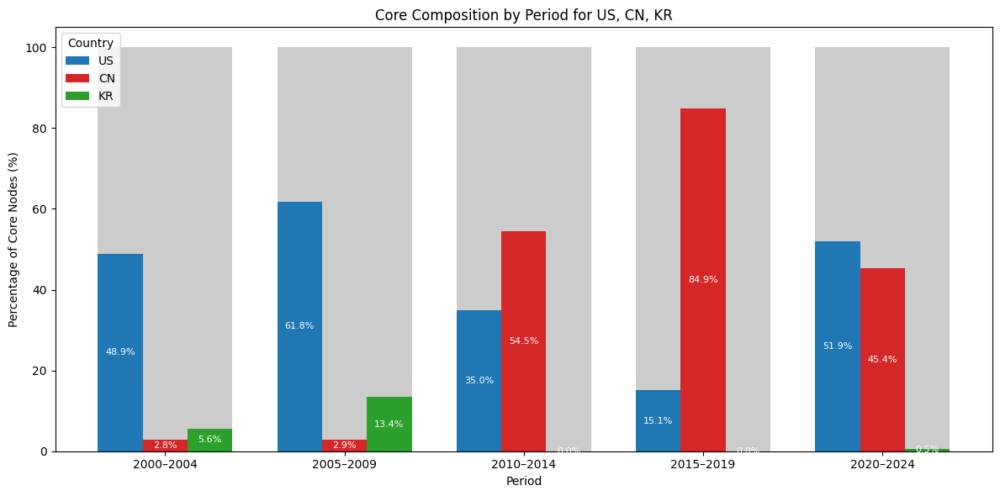

In [172]:
# Cell 9-(2): Combined stacked bar chart for US, CN, KR with country-based colors and Core-only annotations
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Focus countries and their colors
focus_countries = ["US", "CN", "KR"]
country_colors = {
    "US": "#1f77b4",  # blue
    "CN": "#d62728",  # red
    "KR": "#2ca02c",  # green
}
periphery_color = "#CCCCCC"  # light gray for remainder

# Prepare x‐axis
periods = df_summary.index.tolist()
indices = np.arange(len(periods))
width = 0.25  # space for three bars per period

fig, ax = plt.subplots(figsize=(12, 6))

# Total core nodes per period
total_cores = df_summary["Core Size"].values

for i, country in enumerate(focus_countries):
    # Country's core node counts
    core_counts = df_summary[f"{country} Core Nodes"].values
    # Convert to percentage of total cores
    core_perc = core_counts / total_cores * 100
    # Remainder up to 100%
    rem_perc = 100 - core_perc

    # Offset for each country bar
    pos = indices + (i - 1) * width

    # Draw periphery (remainder) in gray
    ax.bar(pos, rem_perc, width,
           bottom=core_perc, color=periphery_color, edgecolor='none')
    # Draw core segment in country color
    bars = ax.bar(pos, core_perc, width,
                  color=country_colors[country], label=country, edgecolor='none')

    # Annotate only core percentages
    for bar in bars:
        h = bar.get_height()
        x = bar.get_x() + bar.get_width() / 2
        ax.text(x, h / 2,
                f"{h:.1f}%",
                ha="center", va="center",
                fontsize=8, color="white")

# Axis labels and title
ax.set_xticks(indices)
ax.set_xticklabels(periods, rotation=0)
ax.set_xlabel("Period")
ax.set_ylabel("Percentage of Core Nodes (%)")
ax.set_title("Core Composition by Period for US, CN, KR")

# Legend showing countries
country_patches = [Patch(facecolor=country_colors[c], label=c) for c in focus_countries]
ax.legend(handles=country_patches, title="Country", loc="upper left")

plt.tight_layout()
plt.show()


## **9-(3): Display formatted summary table**

In [173]:
# Cell 9-(3): Display formatted summary table with corrected Core Ratio calculation and styling
import pandas as pd
from IPython.display import display

# Recompute Core Ratio (%) as Core Nodes / Core Size * 100
for country in ["US", "CN", "KR"]:
    df_summary[f"{country} Core Ratio (%)"] = (
        df_summary[f"{country} Core Nodes"] 
        / df_summary["Core Size"] * 100
    )

# Reorder and select relevant columns
cols = [
    "Total Nodes",
    "Core Size",
    "US Core Nodes", "US Core Ratio (%)",
    "CN Core Nodes", "CN Core Ratio (%)",
    "KR Core Nodes", "KR Core Ratio (%)"
]
df_display = df_summary[cols]

# Format percentage columns to one decimal place with '%' sign
percent_cols = [col for col in df_display.columns if "Ratio (%)" in col]
format_dict = {col: "{:.1f}%" for col in percent_cols}

# Apply styling with caption at bottom
styled = (
    df_display.style
    .format(format_dict)
    .set_caption("Core/Periphery Summary (US, CN, KR)")
    .set_table_styles([{
        "selector": "caption",
        "props": [("caption-side", "bottom"), ("font-weight", "bold")]
    }])
)
display(styled)


,Total Nodes,Core Size,US Core Nodes,US Core Ratio (%),CN Core Nodes,CN Core Ratio (%),KR Core Nodes,KR Core Ratio (%)
Period,,,,,,,,
2000–2004,799,393,192,48.9%,11,2.8%,22,5.6%
2005–2009,1000,516,319,61.8%,15,2.9%,69,13.4%
2010–2014,1000,574,201,35.0%,313,54.5%,0,0.0%
2015–2019,1000,126,19,15.1%,107,84.9%,0,0.0%
2020–2024,1000,185,96,51.9%,84,45.4%,1,0.5%


In [174]:
# Cell 9-(3a):
df_network_llm['cpc_all'].value_counts

<bound method IndexOpsMixin.value_counts of 16         G06N-0003/044 | G06F-0040/30 | G06F-0040/205 |...
17         G06N-0003/044 | G06F-0040/30 | G06F-0040/205 |...
18         G06N-0003/044 | G06F-0040/30 | G06F-0040/205 |...
19         G06N-0003/044 | G06F-0040/30 | G06F-0040/205 |...
20         G06N-0003/044 | G06F-0040/30 | G06F-0040/205 |...
                                 ...                        
1116640    G06F-0018/21 | H04N-0021/252 | H04N-0021/8352 ...
1116646    G06Q-0010/06393 | G06Q-0010/0637 | G06N-0003/0...
1116647    G06Q-0010/06393 | G06Q-0010/0637 | G06N-0003/0...
1116648    G06Q-0010/06393 | G06Q-0010/0637 | G06N-0003/0...
1116649    G06Q-0010/06393 | G06Q-0010/0637 | G06N-0003/0...
Name: cpc_all, Length: 394940, dtype: object>

In [175]:
df_network_llm['cpc_main'].value_counts

<bound method IndexOpsMixin.value_counts of 16           G06N-0003/044
17           G06N-0003/044
18           G06N-0003/044
19           G06N-0003/044
20           G06N-0003/044
                ...       
1116640       G06F-0018/21
1116646    G06Q-0010/06393
1116647    G06Q-0010/06393
1116648    G06Q-0010/06393
1116649    G06Q-0010/06393
Name: cpc_main, Length: 394940, dtype: object>

In [176]:
df_network_llm['cpc_main'].nunique()

3217

In [177]:
# 방법 2: unique() + dropna() 조합
len(df_network_llm["cpc_main"].dropna().unique())


3217

# **10.Panel Regression**

## **10-(1): Explode ‘cpc_all’ into Individual CPC Code Rows**

In [178]:
# Cell 10-(1): Explode ‘cpc_all’ into Individual CPC Code Rows

# 1) Remove rows where cpc_all is missing
df = df_network_llm.dropna(subset=['cpc_all']).copy()

# 2) Normalize separators: replace ‘|’ (with optional spaces) by commas
df['cpc_all'] = df['cpc_all'].str.replace(r'\s*\|\s*', ',', regex=True)

# 3) Split the comma‑separated codes into lists
df['cpc_list'] = df['cpc_all'].str.split(',')

# 4) Explode the lists so each CPC code gets its own row
df_expanded = df.explode('cpc_list')

# 5) Trim whitespace and rename to ‘cpc_code’, then drop the helper column
df_expanded['cpc_code'] = df_expanded['cpc_list'].str.strip()
df_expanded = df_expanded.drop(columns=['cpc_list'])

# Verify the result
print(df_expanded[['cpc_code']].head())


         cpc_code
16  G06N-0003/044
16   G06F-0040/30
16  G06F-0040/205
16  G06F-0040/247
16   G06N-0003/04


In [179]:
# NaN 제거 후 고유 CPC 코드 개수 계산
unique_cpc_count = df_expanded['cpc_code'].dropna().nunique()
print("Unique CPC codes:", unique_cpc_count)

# 상위 20개 CPC 코드와 빈도 확인
print(df_expanded['cpc_code'].value_counts().head(20))


Unique CPC codes: 14041
cpc_code
G06N-0003/045      177569
G06N-0003/08       164266
G06N-0003/084       64903
G06N-0003/04        56650
G06T-2207/20084     55541
G06T-2207/20081     51623
G06F-0018/214       43380
G06N-0003/044       42988
G06V-0010/82        42789
G06N-0003/063       34016
G06N-0003/048       30642
G06N-0003/0464      27789
G06N-0020/00        26062
G06F-0040/30        24426
Y02D-0010/00        22649
G06N-0003/047       21700
G06V-0010/764       19592
G06T-0007/0012      17356
Y02T-0010/40        17174
G06T-0007/11        16658
Name: count, dtype: int64


## **10-(2): RCA Calculation by Year, Country, and CPC Code**

In [180]:
# Cell 10-(2): RCA Calculation by Year, Country, and CPC Code (no NaNs)

import pandas as pd

# 1) Remove duplicate records based on appl_id, year, country_code, and cpc_code
df_unique = (
    df_expanded
    .drop_duplicates(subset=['appl_id', 'year', 'country_code', 'cpc_code'])
    .copy()
)

# 2) Count patents by year, country, and CPC (n_{i,j,t})
df_counts = (
    df_unique
    .groupby(['year', 'country_code', 'cpc_code'])
    .size()
    .reset_index(name='n')
)

# 3) Compute denominators for RCA
df_counts['country_total'] = df_counts.groupby(
    ['year', 'country_code']
)['n'].transform('sum')

df_counts['cpc_total'] = df_counts.groupby(
    ['year', 'cpc_code']
)['n'].transform('sum')

df_counts['year_total'] = df_counts.groupby('year')['n'].transform('sum')

# 4) Prevent zero denominators to avoid NaNs
df_counts = df_counts[
    (df_counts['country_total'] > 0) &
    (df_counts['cpc_total']    > 0) &
    (df_counts['year_total']   > 0)
].copy()

# 5) Calculate RCA: (n / country_total) / (cpc_total / year_total)
df_counts['RCA'] = (
    df_counts['n'] / df_counts['country_total']
) / (
    df_counts['cpc_total'] / df_counts['year_total']
)

# 6) Fill any remaining NaNs with zero (if—for any unexpected reason—they occur)
df_counts['RCA'] = df_counts['RCA'].fillna(0)

# 7) Merge RCA back into the unique dataset
df_result = pd.merge(
    df_unique,
    df_counts[['year', 'country_code', 'cpc_code', 'RCA']],
    on=['year', 'country_code', 'cpc_code'],
    how='left'
)

# 8) Display the first rows of year, country_code, cpc_code, and RCA
print(df_result[['year', 'country_code', 'cpc_code', 'RCA']].head())


     year country_code       cpc_code       RCA
0  2020.0           US  G06N-0003/044  1.253235
1  2020.0           US   G06F-0040/30  1.104672
2  2020.0           US  G06F-0040/205  1.390604
3  2020.0           US  G06F-0040/247  0.657793
4  2020.0           US   G06N-0003/04  1.373625


## **10-(3): Create Binary RCA Indicator and Next‑Year RCA with NA → 0**

In [181]:
# Cell 10-(3): Create Binary RCA Indicator and Next-Year RCA with NA → 0

# 1) Create RCA: 1 if RCA > 1, else 0, then fill NA with 0
df_counts['rca_y0'] = (df_counts['RCA'] > 1).astype(int)
df_counts['rca_y0'] = df_counts['rca_y0'].fillna(0).astype(int)

# 2) Sort by country_code, cpc_code, year so shift works correctly
df_counts = df_counts.sort_values(['country_code', 'cpc_code', 'year'])

# 3) Create rca_y1: next year’s rca_y0 within each country–CPC group, then fill NA with 0
df_counts['rca_y1'] = df_counts.groupby(
    ['country_code', 'cpc_code']
)['rca_y0'].shift(-1)
df_counts['rca_y1'] = df_counts['rca_y1'].fillna(0).astype(int)


# 4) Create sustainable RCA indicator
# rca_y0와 rca_y1이 모두 1이면 1, 아니면 0
df_counts['rca_y01'] = (
    (df_counts['rca_y0'] == 1) &
    (df_counts['rca_y1'] == 1)
).astype(int)


In [182]:
# Cell 10-(3a): Merge these back into your detailed dataset
df_final = pd.merge(
    df_result,
    df_counts[['year', 'country_code', 'cpc_code', 'rca_y0', 'rca_y1', 'rca_y01']],
    on=['year', 'country_code', 'cpc_code'],
    how='left'
)


## **10-(4): Merge Inventor Centrality (Left Join on 3 Keys)**

In [183]:
# Cell 10-(4): Merge Inventor Centrality (Left Join on 3 Keys)

# ── Prerequisites ─────────────────────────────────────────────────────────────
# • df_final          : patent‑level dataset (already contains RCA variables)
# • df_inventor_cet   : inventor‑year centrality table
#   columns → ['inventor', 'inventor_nat', 'year', 'inventor_cet']

# 1) Ensure key columns have identical dtypes
df_final['year']            = df_final['year'].astype(int)
df_inventor_cet['year']     = df_inventor_cet['year'].astype(int)
df_final['inventor']        = df_final['inventor'].astype(str)
df_inventor_cet['inventor'] = df_inventor_cet['inventor'].astype(str)

# 2) Left‑join on (inventor, inventor_nat, year)
df_final = df_final.merge(
    df_inventor_cet[['inventor', 'inventor_nat', 'year', 'inventor_cet']],
    on=['inventor', 'inventor_nat', 'year'],
    how='left'                      # ← keeps all rows of df_final
)

# 3) Missing centrality → 0
df_final['inventor_cet'] = df_final['inventor_cet'].fillna(0)

# 4) Quick check
print(df_final[['inventor', 'inventor_nat', 'year', 'inventor_cet']].head())


                 inventor inventor_nat  year  inventor_cet
0  ISMAIL YUNUS AKHALWAYA           ZA  2020      0.000175
1  ISMAIL YUNUS AKHALWAYA           ZA  2020      0.000175
2  ISMAIL YUNUS AKHALWAYA           ZA  2020      0.000175
3  ISMAIL YUNUS AKHALWAYA           ZA  2020      0.000175
4  ISMAIL YUNUS AKHALWAYA           ZA  2020      0.000175


## **10-(5): Merge CPC Cluster Distance (Left Join on 3 Keys)**

In [184]:
# Cell 10-(5): Merge CPC Cluster Distance (Left Join on 3 Keys)

# 1) Ensure key columns have identical dtypes
df_cpc_dist['year']          = df_cpc_dist['year'].astype(int)
df_final['year']             = df_final['year'].astype(int)
df_cpc_dist['cpc_code']      = df_cpc_dist['cpc_code'].astype(str)
df_final['cpc_code']         = df_final['cpc_code'].astype(str)
df_cpc_dist['country_code']  = df_cpc_dist['country_code'].astype(str)
df_final['country_code']     = df_final['country_code'].astype(str)

# 2) Left‑join on (cpc_code, country_code, year)
df_final = df_final.merge(
    df_cpc_dist[['cpc_code', 'country_code', 'year', 'cpc_cluster_dist_cos']],
    on=['cpc_code', 'country_code', 'year'],
    how='left'
)

# 3) Missing distances → 0
df_final['cpc_cluster_dist_cos'] = df_final['cpc_cluster_dist_cos'].fillna(0)


# 1) Create the squared term
df_final["I_cpc2"] = df_final["cpc_cluster_dist_cos"] ** 2

# 2) Standardize (z-score) the continuous variables
from sklearn.preprocessing import StandardScaler

vars_to_norm = [
    "inventor_cet",
    "cpc_cluster_dist_cos",
    "I_cpc2",
    "num_inventors",
    "num_applicants",
    "wips_family_pub_count",
    "cited_by_count",
    "citations_count",
    "num_claims"
]


scaler = StandardScaler()
df_final[[f"{v}_z" for v in vars_to_norm]] = scaler.fit_transform(df_final[vars_to_norm])

# 3) Drop any rows with inf or NaN in y, X or FE keys

df_final.replace([np.inf, -np.inf], np.nan, inplace=True)
mask = (
    df_final["rca_y1"].notna() &
    df_final["rca_y0"].notna() &
    df_final[[f"{v}_z" for v in vars_to_norm]].notna().all(axis=1) &
    df_final["year"].notna() &
    df_final["country_code"].notna() &
    df_final["cpc_code"].notna()
)
df_final = df_final.loc[mask].copy()



# 4) Quick check
print(df_final[['cpc_code', 'country_code', 'year', 'cpc_cluster_dist_cos']].head())


        cpc_code country_code  year  cpc_cluster_dist_cos
0  G06N-0003/044           US  2020              0.066910
1   G06F-0040/30           US  2020              0.126749
2  G06F-0040/205           US  2020              0.115563
3  G06F-0040/247           US  2020              0.480850
4   G06N-0003/04           US  2020              0.292301


In [185]:
# Cell 10-(5a)
df_cpc_dist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73235 entries, 0 to 73234
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   year                  73235 non-null  int64  
 1   country_code          73235 non-null  object 
 2   cpc_code              73235 non-null  object 
 3   cpc_cluster_dist_cos  73234 non-null  float32
dtypes: float32(1), int64(1), object(2)
memory usage: 2.0+ MB


In [186]:
# Cell 10-(5b) Check the new columns
df_final.loc[(df_final['country_code'] == 'CN') & (df_final['cpc_code'] == 'G06Q-0040/03'), ['appl_id', 'year', 'country_code', 'inventor', 'cpc_code', 'RCA', 'rca_y0', 'rca_y1', 'rca_y01', 'inventor_cet', 'cpc_cluster_dist_cos']].head()


,appl_id,year,country_code,inventor,cpc_code,RCA,rca_y0,rca_y1,rca_y01,inventor_cet,cpc_cluster_dist_cos
271198,16/374196,2019,CN,HAO GUO,G06Q-0040/03,1.640063,1,1,1,0.000147,0.136990
321215,15/007593,2016,CN,MAX S KAZNADY,G06Q-0040/03,0.438469,0,1,0,0.000000,0.253041
327012,2021-10045805,2021,CN,ZHANG PENG,G06Q-0040/03,0.793206,0,0,0,0.003854,0.138104
332375,2019-10331000,2019,CN,ZHANG CHAOHUA,G06Q-0040/03,1.640063,1,1,1,0.000117,0.136990
349922,2017-11314045,2017,CN,DONG JIAN,G06Q-0040/03,1.920057,1,1,1,0.000246,0.158906


In [187]:
# Cell 10-(5c) Save to CSV
out_path = os.path.join(base_dir, 'df_final.csv')
df_final.to_csv(out_path, index=True)  # Include index (years and Total)

# **11-(1): Panel Regression with Fixed Effects**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 1.851e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          3.14e-105
Time:                        01:37:57   Log-Likelihood:            -2.9358e+05
No. Observations:              509665   AIC:                         5.872e+05
Df Residuals:                  509654   BIC:                         5.873e+05
Df Model:                          10                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

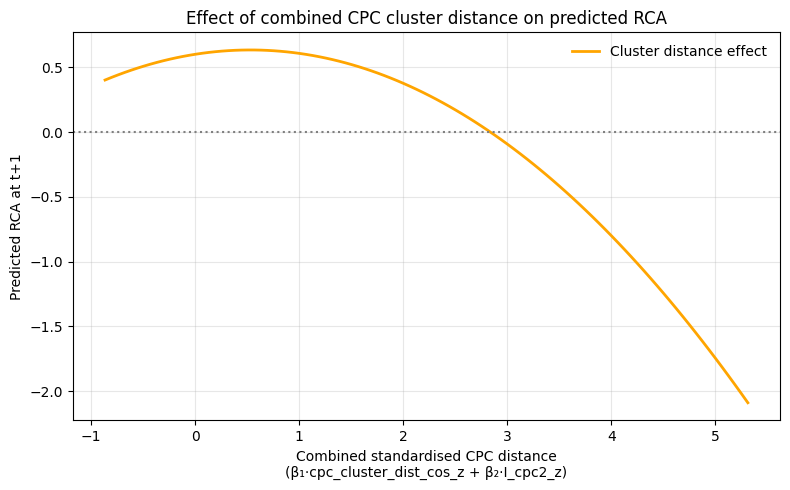

In [188]:
## **11-(1): Panel Regression with Fixed Effects
# 1) Create squared term
df_final["I_cpc2"] = df_final["cpc_cluster_dist_cos"] ** 2

# 2) Standardise (z-score) the continuous variables
from sklearn.preprocessing import StandardScaler

vars_to_norm = [
    "inventor_cet",
    "cpc_cluster_dist_cos",
    "I_cpc2",
    "num_inventors",
    "num_applicants",
    "wips_family_pub_count",
    "cited_by_count",
    "citations_count",
    "num_claims"
]

scaler = StandardScaler()
df_final[[f"{v}_z" for v in vars_to_norm]] = scaler.fit_transform(
    df_final[vars_to_norm]
)

# 3) Drop rows with infinite or missing values in y, X or FE keys
df_final.replace([np.inf, -np.inf], np.nan, inplace=True)
mask = (
    df_final["rca_y1"].notna()
    & df_final["rca_y0"].notna()
    & df_final[[f"{v}_z" for v in vars_to_norm]].notna().all(axis=1)
    & df_final["year"].notna()
    & df_final["country_code"].notna()
    & df_final["cpc_code"].notna()
)
df_final = df_final.loc[mask].copy()

# 4) Panel regression (three-way FE, clustered SE)
import statsmodels.api as sm

y = df_final["rca_y1"]
X = sm.add_constant(df_final[["rca_y0"] + [f"{v}_z" for v in vars_to_norm]])

res = sm.OLS(y, X).fit(
    absorb=["year", "country_code", "cpc_code"],
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)

print(res.summary())

# 5) Combined CPC distance effect plot (orange line + legend)
import numpy as np
import matplotlib.pyplot as plt

params     = res.params
beta_const = params["const"]
beta_rca0  = params["rca_y0"]
beta1      = params["cpc_cluster_dist_cos_z"]
beta2      = params["I_cpc2_z"]

rca0_mean = df_final["rca_y0"].mean()

x    = np.linspace(
    df_final["cpc_cluster_dist_cos_z"].min(),
    df_final["cpc_cluster_dist_cos_z"].max(),
    100
)
x_sq = x ** 2

y_pred = beta_const + beta_rca0 * rca0_mean + beta1 * x + beta2 * x_sq

plt.figure(figsize=(8, 5))
plt.plot(
    x, y_pred,
    color="orange",
    linewidth=2,
    label="Cluster distance effect"
)
plt.xlabel(
    "Combined standardised CPC distance\n"
    "(β₁·cpc_cluster_dist_cos_z + β₂·I_cpc2_z)"
)
plt.ylabel("Predicted RCA at t+1")
plt.title("Effect of combined CPC cluster distance on predicted RCA")
plt.axhline(0, color="grey", linestyle=":")
plt.grid(alpha=0.3)
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


In [189]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 509665 entries, 0 to 622000
Data columns (total 67 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   PTO_id                   509665 non-null  object        
 1   PTO_type                 509665 non-null  object        
 2   patent_kind              509665 non-null  object        
 3   pub_type_code            509665 non-null  object        
 4   title                    509665 non-null  object        
 5   title_en                 492704 non-null  object        
 6   abstract                 509458 non-null  object        
 7   abstract_en              492485 non-null  object        
 8   claim_main               509659 non-null  object        
 9   claim_main_en            492690 non-null  object        
 10  claims_indep             502921 non-null  object        
 11  claims_indep_en          492690 non-null  object        
 12  num_claims           

In [190]:
# Cell: RCA>1 by cluster × region — (A) unique CPC codes, (B) application observations)
#  • Population: LLM first, fallback GenAI
#  • CPC cleaning: drop NaN and placeholders {"", "NAN", "NONE", "UNKNOWN"}
#  • Shares: within-cluster over ROI = ['US','CN','KR','EU']

import pandas as pd
import numpy as np

# ---------- 0) Preconditions ----------
base_need = ["cluster_id_k", "country_code", "appl_id"]
assert all(c in df_pred.columns for c in base_need), "df_pred must have cluster_id_k, country_code, appl_id"

cpc_col = "cpc_code" if "cpc_code" in df_pred.columns else ("cpc_main_norm" if "cpc_main_norm" in df_pred.columns else None)
assert cpc_col is not None, "Need cpc_code or cpc_main_norm in df_pred"
cpc_use = cpc_col

# ---------- 1) Population: LLM first, fallback GenAI ----------
if "genai_subtype_pred" in df_pred.columns:
    pop_mask = df_pred["genai_subtype_pred"].astype(str).str.upper().eq("LLM")
elif "genai_pred" in df_pred.columns:
    pop_mask = df_pred["genai_pred"].astype(str).str.upper().eq("GENAI")
else:
    raise ValueError("No LLM or GenAI indicator found in df_pred.")

dfp = df_pred.loc[pop_mask].copy()

# ---------- 2) Assemble working frame with non-null rca_y0 ----------
if "rca_y0" in dfp.columns:
    df_work = dfp[["cluster_id_k", "country_code", "appl_id", cpc_use, "rca_y0"]].copy()
else:
    assert "df_final" in globals() and {"appl_id","rca_y0"}.issubset(df_final.columns), "Need rca_y0 in df_final."
    df_work = (
        dfp[["cluster_id_k", "country_code", "appl_id", cpc_use]]
        .merge(df_final[["appl_id", "rca_y0"]], on="appl_id", how="left")
    )
# rca_y0 유효치만 사용
df_work = df_work[df_work["rca_y0"].notna()].copy()

# ---------- 3) Region mapping ----------
EU_CODES = {
    "AT","BE","BG","HR","CY","CZ","DK","EE","FI","FR","DE","GR","HU","IE","IT",
    "LV","LT","LU","MT","NL","PL","PT","RO","SK","SI","ES","SE"
}
def to_region(code: str) -> str:
    if code == "US": return "US"
    if code == "CN": return "CN"
    if code == "KR": return "KR"
    if code in EU_CODES: return "EU"
    return "Others"

df_work["region"] = df_work["country_code"].astype(str).map(to_region)

ROI = ["US", "CN", "KR", "EU"]
all_clusters = np.sort(dfp["cluster_id_k"].unique())
idx = pd.MultiIndex.from_product([all_clusters, ROI], names=["cluster_id_k","region"])

# ---------- 4) CPC cleaning ----------
PLACEHOLDERS = {"", "NAN", "NONE", "UNKNOWN"}
def valid_cpc_mask(s: pd.Series) -> pd.Series:
    s2 = s.astype(str).str.strip()
    return s2.notna() & ~s2.str.upper().isin(PLACEHOLDERS)

# =========================
# [A] Unique CPC with RCA>1
# =========================
df_rca = df_work.loc[(df_work["rca_y0"] == 1) & (df_work["region"].isin(ROI)),
                     ["cluster_id_k", "region", cpc_use]].copy()

# CPC 정제: 유효한 CPC만 남김
mask_valid_cpc = valid_cpc_mask(df_rca[cpc_use])
df_rca = df_rca.loc[mask_valid_cpc].copy()
df_rca[cpc_use] = df_rca[cpc_use].astype(str).str.strip()

# cluster × region별 유니크 CPC 개수
unique_counts = (
    df_rca.groupby(["cluster_id_k","region"])[cpc_use]
          .nunique(dropna=True)
          .rename("unique_cpc_count")
          .reset_index()
)

# 모든 조합 포함
unique_counts = (
    unique_counts.set_index(["cluster_id_k","region"])
                 .reindex(idx, fill_value=0)
                 .reset_index()
)

# 클러스터 합계와 비율(ROI 분모)
totals_unique = unique_counts.groupby("cluster_id_k")["unique_cpc_count"].sum().rename("total_cluster")
unique_counts = unique_counts.merge(totals_unique, on="cluster_id_k", how="left")
unique_counts["share_%"] = np.where(
    unique_counts["total_cluster"] > 0,
    (unique_counts["unique_cpc_count"] / unique_counts["total_cluster"] * 100).round(1),
    0.0
)

# 표 형태
table_counts_u = unique_counts.pivot(index="cluster_id_k", columns="region", values="unique_cpc_count").reindex(columns=ROI).astype(int)
table_shares_u = unique_counts.pivot(index="cluster_id_k", columns="region", values="share_%").reindex(columns=ROI)
table_total_u  = totals_unique.to_frame()

result_unique = pd.concat({"count": table_counts_u, "share_%": table_shares_u, "total": table_total_u}, axis=1).sort_index()

print("\n[A] Unique representative CPC codes with RCA>1 by cluster × region (LLM-first population)")
display(result_unique)

# ==================================
# [B] Application observations RCA>1 (unique appl_id 기준)
# ==================================
obs = df_work.loc[
    (df_work["rca_y0"] == 1) & (df_work["region"].isin(ROI)),
    ["cluster_id_k","region","appl_id"]
].dropna(subset=["appl_id"]).drop_duplicates()

# cluster × region별 unique appl_id 수
counts = (
    obs.groupby(["cluster_id_k","region"])["appl_id"]
       .nunique()
       .rename("count")
       .reindex(idx, fill_value=0)
       .reset_index()
)

# totals & shares
totals = counts.groupby("cluster_id_k")["count"].sum().rename("total_cluster")
counts = counts.merge(totals, on="cluster_id_k", how="left")
counts["share_%"] = np.where(
    counts["total_cluster"] > 0,
    (counts["count"] / counts["total_cluster"] * 100).round(1),
    0.0
)

# reshape tables
table_counts = counts.pivot(index="cluster_id_k", columns="region", values="count").reindex(columns=ROI).astype(int)
table_shares = counts.pivot(index="cluster_id_k", columns="region", values="share_%").reindex(columns=ROI)
table_total  = totals.to_frame()

result_observations = pd.concat(
    {"count": table_counts, "share_%": table_shares, "total": table_total},
    axis=1
).sort_index()

print("\n[B] Unique applications with RCA>1 by cluster × region (LLM-first population)")
display(result_observations)




[A] Unique representative CPC codes with RCA>1 by cluster × region (LLM-first population)


count                 share_%                          total
                US    CN   KR   EU      US    CN    KR   EU total_cluster
cluster_id_k                                                             
0                8    26    1    0    22.9  74.3   2.9  0.0            35
1              162    73  413   55    23.0  10.4  58.7  7.8           703
2                1     2    0    0    33.3  66.7   0.0  0.0             3
3              993  1379  252  263    34.4  47.8   8.7  9.1          2887
4              306  1013  111  129    19.6  65.0   7.1  8.3          1559


[B] Unique applications with RCA>1 by cluster × region (LLM-first population)


count                    share_%                          total
                 US     CN    KR    EU      US    CN    KR   EU total_cluster
cluster_id_k                                                                 
0                10     47     1     0    17.2  81.0   1.7  0.0            58
1               456    159  1547    83    20.3   7.1  68.9  3.7          2245
2                 1      2     0     0    33.3  66.7   0.0  0.0             3
3             12643  21530  1263  1250    34.5  58.7   3.4  3.4         36686
4              2976  23186   658   677    10.8  84.3   2.4  2.5         27497

In [191]:
df_work.info()

<class 'pandas.core.frame.DataFrame'>
Index: 509665 entries, 0 to 527651
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   cluster_id_k  509665 non-null  int32  
 1   country_code  509665 non-null  object 
 2   appl_id       509665 non-null  object 
 3   cpc_code      509665 non-null  object 
 4   rca_y0        509665 non-null  float64
 5   region        509665 non-null  object 
dtypes: float64(1), int32(1), object(4)
memory usage: 25.3+ MB


In [192]:
dfp['appl_id'].nunique()

90911

In [193]:
# Cell: Enforce LLM-only (fallback GenAI) population and print overall RCA tables

import pandas as pd

# 0) Define population: LLM first, fallback to GenAI
if "genai_subtype_pred" in df_pred.columns:
    pop_ids = df_pred.loc[df_pred["genai_subtype_pred"].astype(str).str.upper() == "LLM", "appl_id"].dropna().unique()
else:
    pop_ids = df_pred.loc[df_pred["genai_pred"].astype(str).str.upper() == "GENAI", "appl_id"].dropna().unique()

# 1) Build working frame carrying RCA and CPC for ONLY the chosen population
cpc_col = "cpc_code" if "cpc_code" in df_pred.columns else ("cpc_main_norm" if "cpc_main_norm" in df_pred.columns else None)
assert cpc_col is not None, "Need cpc_code or cpc_main_norm in df_pred."

if "rca_y0" in df_pred.columns:
    df_work = df_pred.loc[df_pred["appl_id"].isin(pop_ids), ["appl_id", cpc_col, "rca_y0"]].copy()
else:
    assert "df_final" in globals() and {"appl_id","rca_y0"}.issubset(df_final.columns), "Need rca_y0 in df_final."
    df_work = (
        df_pred.loc[df_pred["appl_id"].isin(pop_ids), ["appl_id", cpc_col]]
               .merge(df_final[["appl_id","rca_y0"]], on="appl_id", how="left")
    )

# 2) Strict CPC cleaning
placeholders = {"NAN", "NONE", "UNKNOWN"}
cpc_series = df_work[cpc_col].dropna().astype(str)
cpc_series = cpc_series[~cpc_series.str.upper().isin(placeholders)]

# ---------- (A) Unique CPC codes: RCA>1 vs others vs total ----------
cpc_with_rca = (
    df_work.loc[df_work["rca_y0"] == 1, cpc_col]
           .dropna().astype(str)
)
cpc_with_rca = cpc_with_rca[~cpc_with_rca.str.upper().isin(placeholders)].str.upper().unique()
set_cpc_with_rca = set(cpc_with_rca)
set_cpc_all      = set(cpc_series.str.upper().unique())

count_cpc_with_rca = len(set_cpc_with_rca & set_cpc_all)
count_cpc_total    = len(set_cpc_all)
count_cpc_others   = count_cpc_total - count_cpc_with_rca

table_cpc = pd.DataFrame({
    "with_RCA>1": [count_cpc_with_rca],
    "others":     [count_cpc_others],
    "total":      [count_cpc_total]
}, index=["Unique CPC codes (LLM-first population)"])

# ---------- (B) Applications: RCA>1 vs others vs total ----------
total_apps = df_work["appl_id"].dropna().nunique()
apps_with_rca = df_work.loc[df_work["rca_y0"] == 1, "appl_id"].dropna().nunique()
apps_others   = total_apps - apps_with_rca

table_apps = pd.DataFrame({
    "with_RCA>1": [apps_with_rca],
    "others":     [apps_others],
    "total":      [total_apps]
}, index=["Applications (LLM-first population)"])

# ---------- Display ----------
print("\nOverall counts in the LLM-first population")
display(table_cpc)
display(table_apps)



Overall counts in the LLM-first population


,with_RCA>1,others,total
Unique CPC codes (LLM-first population),2932,285,3217


,with_RCA>1,others,total
Applications (LLM-first population),71557,19354,90911


## **11-(2): Interaction model estimation & moderation plot in one**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 1.935e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          1.81e-107
Time:                        01:38:01   Log-Likelihood:            -2.9354e+05
No. Observations:              509665   AIC:                         5.871e+05
Df Residuals:                  509652   BIC:                         5.873e+05
Df Model:                          12                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

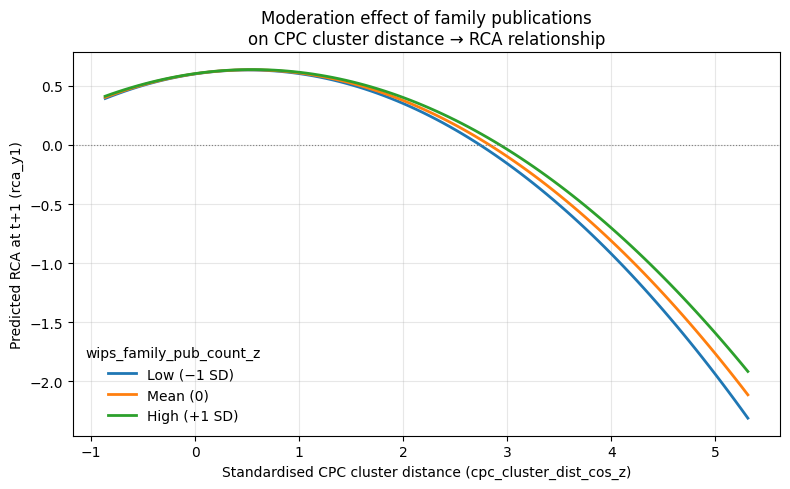

In [194]:
## **11-(2): Interaction model estimation & moderation plot in one**
# ────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# 0) Interaction terms 생성 (z-score 변수 곱)
df_final["cpc_dist_x_wips_z"] = (
    df_final["cpc_cluster_dist_cos_z"] * df_final["wips_family_pub_count_z"]
)
df_final["I_cpc2_x_wips_z"]   = (
    df_final["I_cpc2_z"] * df_final["wips_family_pub_count_z"]
)

# 1) 3-way FE OLS 모형 적합 (interaction 포함)
vars_int = (
    ["rca_y0"]                                   # lagged RCA
    + [f"{v}_z" for v in vars_to_norm]           # 표준화된 연속형 통제변수
    + ["cpc_dist_x_wips_z", "I_cpc2_x_wips_z"]    # interaction terms
)
X_int = sm.add_constant(df_final[vars_int])
y_int = df_final["rca_y1"]

res_int = sm.OLS(y_int, X_int).fit(
    absorb=["year", "country_code", "cpc_code"], 
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)

# 회귀 결과 요약 출력
print(res_int.summary())

# 2) moderation plot: wips_family_pub_count_z에 따른 조절효과
params = res_int.params
const  = params.get("const", 0.0)

# X축 범위 설정 및 2차항 계산
x = np.linspace(
    df_final["cpc_cluster_dist_cos_z"].min(),
    df_final["cpc_cluster_dist_cos_z"].max(),
    100
)
x2 = x ** 2

# wips_family_pub_count_z 수준 정의 (−1 SD, 0, +1 SD)
levels = {
    "Low (−1 SD)": -1,
    "Mean (0)":     0,
    "High (+1 SD)": 1
}

# 예측 함수 정의 (1차, 2차, interaction 포함)
def predict_rca(c1, c2, w):
    return (
        const
        + params["rca_y0"]                       * df_final["rca_y0"].mean()
        + params["cpc_cluster_dist_cos_z"]           * c1
        + params["I_cpc2_z"]                     * c2
        + params["wips_family_pub_count_z"]      * w
        + params["cpc_dist_x_wips_z"]            * (c1 * w)
        + params["I_cpc2_x_wips_z"]              * (c2 * w)
    )

# 그래프 그리기
plt.figure(figsize=(8, 5))
for label, w in levels.items():
    plt.plot(x, predict_rca(x, x2, w), linewidth=2, label=label)

plt.xlabel("Standardised CPC cluster distance (cpc_cluster_dist_cos_z)")
plt.ylabel("Predicted RCA at t+1 (rca_y1)")
plt.title("Moderation effect of family publications\non CPC cluster distance → RCA relationship")
plt.axhline(0, color="grey", linewidth=0.8, linestyle=":")
plt.grid(alpha=0.3)
plt.legend(title="wips_family_pub_count_z", frameon=False)
plt.tight_layout()
plt.show()


## **11-(3):Interaction model + regression summary + moderation plot**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 1.803e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          1.68e-106
Time:                        01:38:03   Log-Likelihood:            -2.9358e+05
No. Observations:              509665   AIC:                         5.872e+05
Df Residuals:                  509652   BIC:                         5.873e+05
Df Model:                          12                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

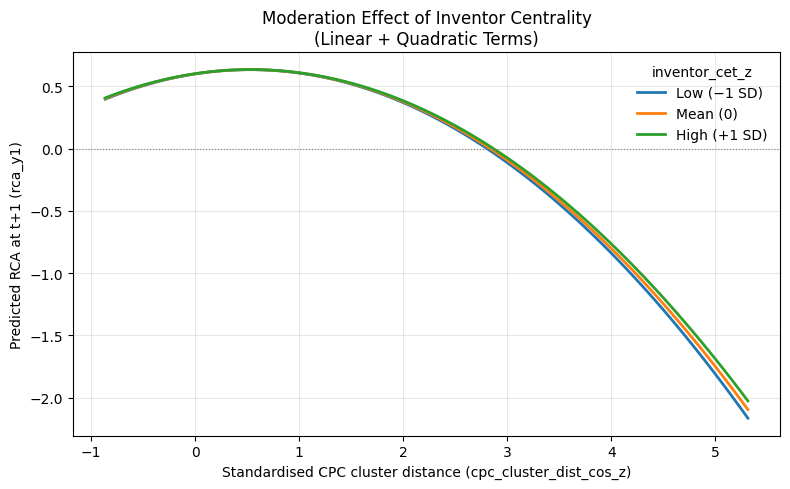

In [195]:
# Cell 11-(3): Interaction model + regression summary + moderation plot
# ────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# 0) (필요시) 변수 전처리 – z-score 표준화 등
#    df_final, vars_to_norm 등이 이미 정의되어 있다고 가정합니다.

# 1) 상호작용 항 생성
df_final["cpc_dist_x_inv_z"] = df_final["cpc_cluster_dist_cos_z"] * df_final["inventor_cet_z"]
df_final["I_cpc2_x_inv_z"]   = df_final["I_cpc2_z"]        * df_final["inventor_cet_z"]

# 2) 3-way FE OLS 모형 적합 (interaction 포함)
vars_interact = (
    ["rca_y0"] +
    [f"{v}_z" for v in vars_to_norm] +
    ["cpc_dist_x_inv_z", "I_cpc2_x_inv_z"]
)
X = sm.add_constant(df_final[vars_interact])
y = df_final["rca_y1"]
res_int = sm.OLS(y, X).fit(
    absorb=["year", "country_code", "cpc_code"],
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)

# 3) 회귀 결과 요약 출력
print(res_int.summary())

# 4) 조절효과 시각화 준비
params = res_int.params
const = params.get("const", 0.0)

# X축 범위 및 2차항
x = np.linspace(df_final["cpc_cluster_dist_cos_z"].min(),
                df_final["cpc_cluster_dist_cos_z"].max(), 100)
x2 = x**2

# inventor_cet_z 수준
levels = {"Low (−1 SD)": -1, "Mean (0)": 0, "High (+1 SD)": 1}

# 예측 함수
def predict(c1, c2, inv):
    return (
        const
        + params["rca_y0"]            * df_final["rca_y0"].mean()
        + params["cpc_cluster_dist_cos_z"]* c1
        + params["I_cpc2_z"]          * c2
        + params["inventor_cet_z"]    * inv
        + params["cpc_dist_x_inv_z"]  * (c1 * inv)
        + params["I_cpc2_x_inv_z"]    * (c2 * inv)
    )

# 5) 그래프
plt.figure(figsize=(8,5))
for name, inv in levels.items():
    plt.plot(x, predict(x, x2, inv), label=name, linewidth=2)

plt.xlabel("Standardised CPC cluster distance (cpc_cluster_dist_cos_z)")
plt.ylabel("Predicted RCA at t+1 (rca_y1)")
plt.title("Moderation Effect of Inventor Centrality\n(Linear + Quadratic Terms)")
plt.axhline(0, color="grey", linewidth=0.8, linestyle=":")
plt.grid(alpha=0.3)
plt.legend(title="inventor_cet_z", frameon=False)
plt.tight_layout()
plt.show()


## **11-(4):Interaction with num_inventors_z & moderation plot in one**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 2.206e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          2.93e-109
Time:                        01:38:04   Log-Likelihood:            -2.9356e+05
No. Observations:              509665   AIC:                         5.871e+05
Df Residuals:                  509652   BIC:                         5.873e+05
Df Model:                          12                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

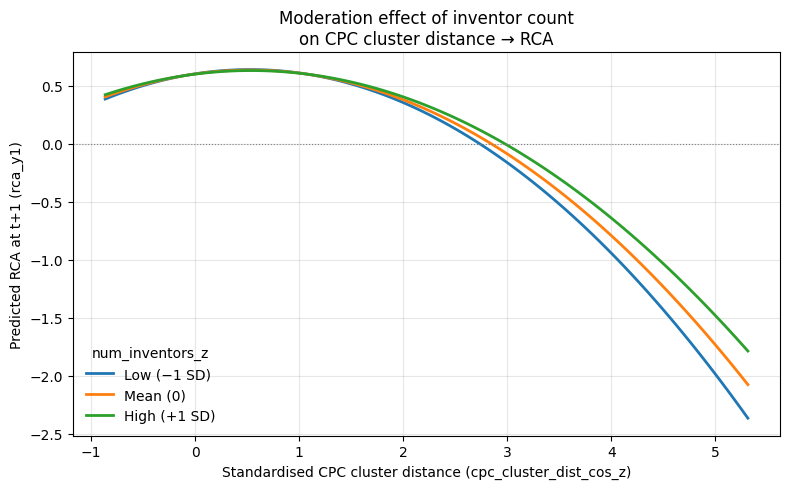

In [196]:
# Cell 11-(4): Interaction with num_inventors_z & moderation plot in one
# ────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# 1) Interaction terms (num_inventors_z)
df_final["cpc_dist_x_inventors_z"]  = (
    df_final["cpc_cluster_dist_cos_z"] * df_final["num_inventors_z"]
)
df_final["I_cpc2_x_inventors_z"]    = (
    df_final["I_cpc2_z"]        * df_final["num_inventors_z"]
)

# 2) Three-way FE OLS model fit (including interactions)
vars_int = (
    ["rca_y0"] +
    [f"{v}_z" for v in vars_to_norm] +
    ["cpc_dist_x_inventors_z", "I_cpc2_x_inventors_z"]
)
X_int = sm.add_constant(df_final[vars_int])
y_int = df_final["rca_y1"]

res_int = sm.OLS(y_int, X_int).fit(
    absorb=["year", "country_code", "cpc_code"],
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)

# 3) Print regression summary
print(res_int.summary())

# 4) Moderation plot: effect of num_inventors_z
params    = res_int.params
const     = params.get("const", 0.0)
rca0_mean = df_final["rca_y0"].mean()

# X axis: standardized cpc_cluster_dist_cos_z and its square
x  = np.linspace(df_final["cpc_cluster_dist_cos_z"].min(),
                 df_final["cpc_cluster_dist_cos_z"].max(), 100)
x2 = x**2

# Levels of num_inventors_z: −1SD, mean, +1SD
levels = {"Low (−1 SD)": -1, "Mean (0)": 0, "High (+1 SD)": 1}

# Prediction function (linear + quadratic + interaction)
def predict_rca(c1, c2, nz):
    return (
        const
        + params["rca_y0"]                   * rca0_mean
        + params["cpc_cluster_dist_cos_z"]       * c1
        + params["I_cpc2_z"]                 * c2
        + params["num_inventors_z"]          * nz
        + params["cpc_dist_x_inventors_z"]   * (c1 * nz)
        + params["I_cpc2_x_inventors_z"]     * (c2 * nz)
    )

# 5) Plot
plt.figure(figsize=(8, 5))
for label, nz in levels.items():
    plt.plot(x, predict_rca(x, x2, nz), label=label, linewidth=2)

plt.xlabel("Standardised CPC cluster distance (cpc_cluster_dist_cos_z)")
plt.ylabel("Predicted RCA at t+1 (rca_y1)")
plt.title("Moderation effect of inventor count\non CPC cluster distance → RCA")
plt.axhline(0, color="grey", linewidth=0.8, linestyle=":")
plt.grid(alpha=0.3)
plt.legend(title="num_inventors_z", frameon=False)
plt.tight_layout()
plt.show()


## **11-(5): Interaction with num_applicants_z & moderation plot**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 2.409e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          1.82e-110
Time:                        01:38:06   Log-Likelihood:            -2.9357e+05
No. Observations:              509665   AIC:                         5.872e+05
Df Residuals:                  509652   BIC:                         5.873e+05
Df Model:                          12                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

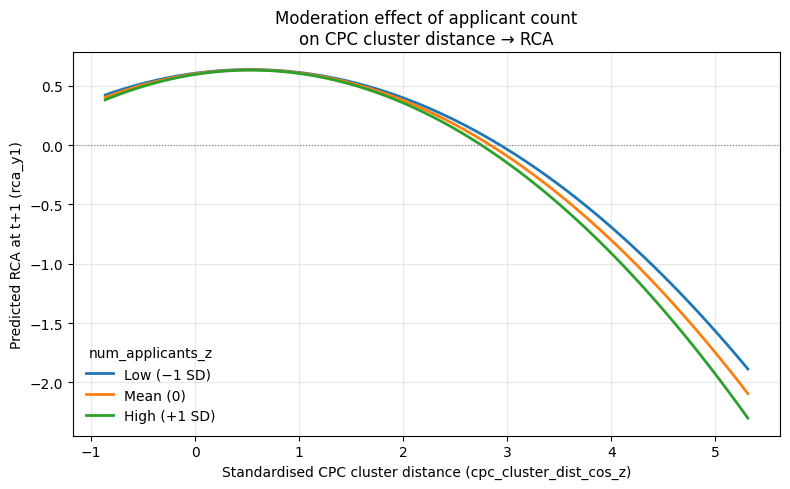

In [197]:
# Cell 11-(5): Interaction with num_applicants_z & moderation plot
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# 1) Interaction terms 생성
df_final["cpc_dist_x_applicants_z"] = (
    df_final["cpc_cluster_dist_cos_z"] * df_final["num_applicants_z"]
)
df_final["I_cpc2_x_applicants_z"] = (
    df_final["I_cpc2_z"] * df_final["num_applicants_z"]
)

# 2) 3-way FE OLS 적합 (interaction 포함)
vars_int = (
    ["rca_y0"] +
    [f"{v}_z" for v in vars_to_norm] +
    ["cpc_dist_x_applicants_z", "I_cpc2_x_applicants_z"]
)
X_int = sm.add_constant(df_final[vars_int])
y_int = df_final["rca_y1"]

res_int = sm.OLS(y_int, X_int).fit(
    absorb=["year", "country_code", "cpc_code"],
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)
print(res_int.summary())

# 3) applicant 수 조절효과 시각화
params    = res_int.params
const     = params.get("const", 0.0)
rca0_mean = df_final["rca_y0"].mean()

x  = np.linspace(
    df_final["cpc_cluster_dist_cos_z"].min(),
    df_final["cpc_cluster_dist_cos_z"].max(),
    100
)
x2 = x ** 2
levels = {"Low (−1 SD)": -1, "Mean (0)": 0, "High (+1 SD)": 1}

def predict_rca(c1, c2, az):
    return (
        const
        + params["rca_y0"]                       * rca0_mean
        + params["cpc_cluster_dist_cos_z"]           * c1
        + params["I_cpc2_z"]                     * c2
        + params["num_applicants_z"]             * az
        + params["cpc_dist_x_applicants_z"]       * (c1 * az)
        + params["I_cpc2_x_applicants_z"]         * (c2 * az)
    )

plt.figure(figsize=(8, 5))
for label, az in levels.items():
    plt.plot(x, predict_rca(x, x2, az), label=label, linewidth=2)

plt.xlabel("Standardised CPC cluster distance (cpc_cluster_dist_cos_z)")
plt.ylabel("Predicted RCA at t+1 (rca_y1)")
plt.title("Moderation effect of applicant count\non CPC cluster distance → RCA")
plt.axhline(0, color="grey", linewidth=0.8, linestyle=":")
plt.grid(alpha=0.3)
plt.legend(title="num_applicants_z", frameon=False)
plt.tight_layout()
plt.show()


## **11-(6): Interaction with cited_by_count_z & moderation plot**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 2.242e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          1.75e-109
Time:                        01:38:07   Log-Likelihood:            -2.9355e+05
No. Observations:              509665   AIC:                         5.871e+05
Df Residuals:                  509652   BIC:                         5.873e+05
Df Model:                          12                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

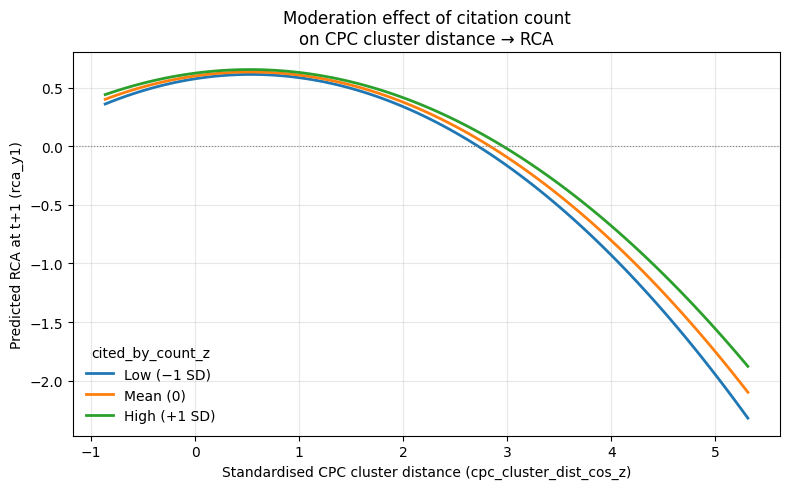

In [198]:
# Cell 11-(6): Interaction with cited_by_count_z & moderation plot
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# 1) Interaction terms 생성 (cited_by_count_z)
df_final["cpc_dist_x_cited_z"]   = df_final["cpc_cluster_dist_cos_z"] * df_final["cited_by_count_z"]
df_final["I_cpc2_x_cited_z"]     = df_final["I_cpc2_z"]        * df_final["cited_by_count_z"]

# 2) Three-way FE OLS 적합 (interaction 포함)
vars_int = (
    ["rca_y0"] +
    [f"{v}_z" for v in vars_to_norm] +
    ["cpc_dist_x_cited_z", "I_cpc2_x_cited_z"]
)
X_int = sm.add_constant(df_final[vars_int])
y_int = df_final["rca_y1"]

res_int = sm.OLS(y_int, X_int).fit(
    absorb=["year", "country_code", "cpc_code"],
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)

# 3) 회귀 결과 요약
print(res_int.summary())

# 4) cited_by_count_z 조절효과 시각화
params    = res_int.params
const     = params.get("const", 0.0)
rca0_mean = df_final["rca_y0"].mean()

# X축 범위 및 2차항
x  = np.linspace(
    df_final["cpc_cluster_dist_cos_z"].min(),
    df_final["cpc_cluster_dist_cos_z"].max(),
    100
)
x2 = x**2

# cited_by_count_z 수준 정의 (−1 SD, mean, +1 SD)
levels = {"Low (−1 SD)": -1, "Mean (0)": 0, "High (+1 SD)": 1}

# 예측 함수 (linear + quadratic + interaction)
def predict_rca(c1, c2, cz):
    return (
        const
        + params["rca_y0"]                 * rca0_mean
        + params["cpc_cluster_dist_cos_z"]     * c1
        + params["I_cpc2_z"]               * c2
        + params["cited_by_count_z"]       * cz
        + params["cpc_dist_x_cited_z"]     * (c1 * cz)
        + params["I_cpc2_x_cited_z"]       * (c2 * cz)
    )

# 5) 플롯
plt.figure(figsize=(8,5))
for label, cz in levels.items():
    plt.plot(x, predict_rca(x, x2, cz), label=label, linewidth=2)

plt.xlabel("Standardised CPC cluster distance (cpc_cluster_dist_cos_z)")
plt.ylabel("Predicted RCA at t+1 (rca_y1)")
plt.title("Moderation effect of citation count\non CPC cluster distance → RCA")
plt.axhline(0, color="grey", linewidth=0.8, linestyle=":")
plt.grid(alpha=0.3)
plt.legend(title="cited_by_count_z", frameon=False)
plt.tight_layout()
plt.show()


## **11-(7): Interaction with citations_count_z & moderation plot in one**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.227
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                 2.083e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          1.78e-108
Time:                        01:38:08   Log-Likelihood:            -2.9357e+05
No. Observations:              509665   AIC:                         5.872e+05
Df Residuals:                  509652   BIC:                         5.873e+05
Df Model:                          12                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

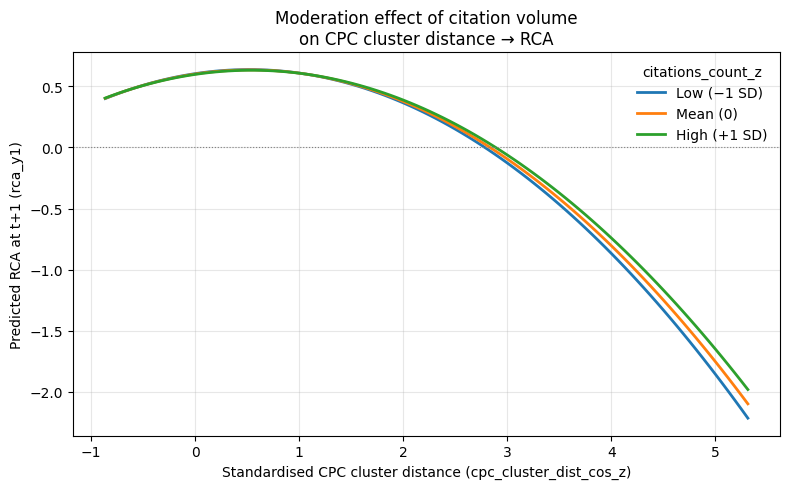

In [199]:
# Cell 11-(7): Interaction with citations_count_z & moderation plot in one
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# 1) Interaction terms 생성 (citations_count_z)
df_final["cpc_dist_x_citations_z"]  = (
    df_final["cpc_cluster_dist_cos_z"] * df_final["citations_count_z"]
)
df_final["I_cpc2_x_citations_z"]    = (
    df_final["I_cpc2_z"]        * df_final["citations_count_z"]
)

# 2) Three-way FE OLS 모형 적합 (interaction 포함)
vars_int = (
    ["rca_y0"] +
    [f"{v}_z" for v in vars_to_norm] +
    ["cpc_dist_x_citations_z", "I_cpc2_x_citations_z"]
)
X_int = sm.add_constant(df_final[vars_int])
y_int = df_final["rca_y1"]

res_int = sm.OLS(y_int, X_int).fit(
    absorb=["year", "country_code", "cpc_code"],
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)

# 3) 회귀 결과 요약
print(res_int.summary())

# 4) citations_count_z 조절효과 시각화
params    = res_int.params
const     = params.get("const", 0.0)
rca0_mean = df_final["rca_y0"].mean()

# X축 범위 및 2차항
x  = np.linspace(
    df_final["cpc_cluster_dist_cos_z"].min(),
    df_final["cpc_cluster_dist_cos_z"].max(),
    100
)
x2 = x ** 2

# citations_count_z 수준 (−1 SD, mean, +1 SD)
levels = {"Low (−1 SD)": -1, "Mean (0)": 0, "High (+1 SD)": 1}

def predict_rca(c1, c2, cz):
    return (
        const
        + params["rca_y0"]                     * rca0_mean
        + params["cpc_cluster_dist_cos_z"]         * c1
        + params["I_cpc2_z"]                   * c2
        + params["citations_count_z"]          * cz
        + params["cpc_dist_x_citations_z"]      * (c1 * cz)
        + params["I_cpc2_x_citations_z"]        * (c2 * cz)
    )

plt.figure(figsize=(8,5))
for label, cz in levels.items():
    plt.plot(x, predict_rca(x, x2, cz), linewidth=2, label=label)

plt.xlabel("Standardised CPC cluster distance (cpc_cluster_dist_cos_z)")
plt.ylabel("Predicted RCA at t+1 (rca_y1)")
plt.title("Moderation effect of citation volume\non CPC cluster distance → RCA")
plt.axhline(0, color="grey", linewidth=0.8, linestyle=":")
plt.grid(alpha=0.3)
plt.legend(title="citations_count_z", frameon=False)
plt.tight_layout()
plt.show()


## **11-(8): Interaction with num_claims_z & moderation plot**

                            OLS Regression Results                            
Dep. Variable:                 rca_y1   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.228
Method:                 Least Squares   F-statistic:                 2.814e+04
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          1.37e-112
Time:                        01:38:10   Log-Likelihood:            -2.9333e+05
No. Observations:              509665   AIC:                         5.867e+05
Df Residuals:                  509652   BIC:                         5.868e+05
Df Model:                          12                                         
Covariance Type:              cluster                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

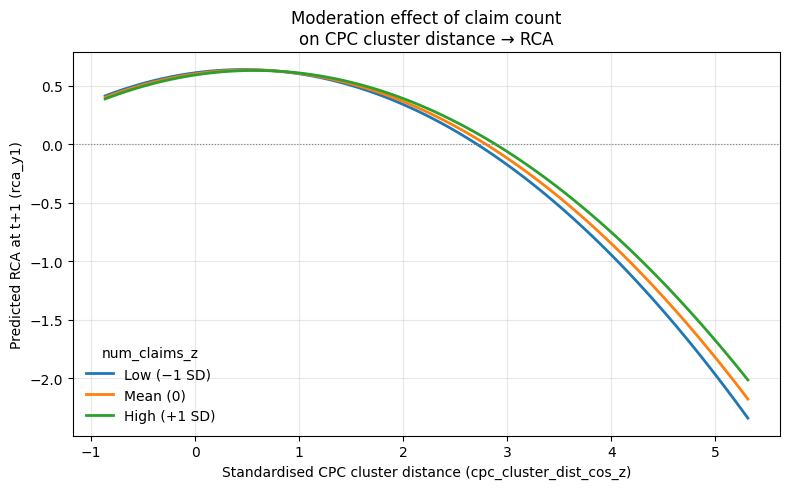

In [200]:
# Cell 11-(8): Interaction with num_claims_z & moderation plot
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# 1) Interaction terms 생성 (num_claims_z)
df_final["cpc_dist_x_claims_z"]  = df_final["cpc_cluster_dist_cos_z"] * df_final["num_claims_z"]
df_final["I_cpc2_x_claims_z"]    = df_final["I_cpc2_z"]        * df_final["num_claims_z"]

# 2) Three-way FE OLS 적합 (interaction 포함)
vars_int = (
    ["rca_y0"]
    + [f"{v}_z" for v in vars_to_norm]
    + ["cpc_dist_x_claims_z", "I_cpc2_x_claims_z"]
)
X_int = sm.add_constant(df_final[vars_int])
y_int = df_final["rca_y1"]

res_int = sm.OLS(y_int, X_int).fit(
    absorb=["year", "country_code", "cpc_code"],
    cov_type="cluster",
    cov_kwds={"groups": df_final["country_code"]}
)

# 3) 회귀 결과 요약
print(res_int.summary())

# 4) num_claims_z 조절효과 시각화
params    = res_int.params
const     = params.get("const", 0.0)
rca0_mean = df_final["rca_y0"].mean()

# X축 범위 및 2차항
x  = np.linspace(
    df_final["cpc_cluster_dist_cos_z"].min(),
    df_final["cpc_cluster_dist_cos_z"].max(),
    100
)
x2 = x ** 2

# num_claims_z 수준 정의 (−1 SD, mean, +1 SD)
levels = {"Low (−1 SD)": -1, "Mean (0)": 0, "High (+1 SD)": 1}

# 예측 함수 (linear + quadratic + interaction)
def predict_rca(c1, c2, cz):
    return (
        const
        + params["rca_y0"]                * rca0_mean
        + params["cpc_cluster_dist_cos_z"]    * c1
        + params["I_cpc2_z"]              * c2
        + params["num_claims_z"]          * cz
        + params["cpc_dist_x_claims_z"]   * (c1 * cz)
        + params["I_cpc2_x_claims_z"]     * (c2 * cz)
    )

plt.figure(figsize=(8, 5))
for label, cz in levels.items():
    plt.plot(x, predict_rca(x, x2, cz), label=label, linewidth=2)

plt.xlabel("Standardised CPC cluster distance (cpc_cluster_dist_cos_z)")
plt.ylabel("Predicted RCA at t+1 (rca_y1)")
plt.title("Moderation effect of claim count\non CPC cluster distance → RCA")
plt.axhline(0, color="grey", linewidth=0.8, linestyle=":")
plt.grid(alpha=0.3)
plt.legend(title="num_claims_z", frameon=False)
plt.tight_layout()
plt.show()


In [201]:
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267519 entries, 0 to 267518
Data columns (total 73 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   PTO_id                     267519 non-null  object        
 1   PTO_type                   267519 non-null  object        
 2   patent_kind                267519 non-null  object        
 3   pub_type_code              266072 non-null  object        
 4   title                      267519 non-null  object        
 5   title_en                   243032 non-null  object        
 6   abstract                   267105 non-null  object        
 7   abstract_en                242747 non-null  object        
 8   claim_main                 265715 non-null  object        
 9   claim_main_en              241263 non-null  object        
 10  claims_indep               221048 non-null  object        
 11  claims_indep_en            206730 non-null  object  

In [202]:
df_pred["year"].value_counts()

year
2021    41339
2020    39713
2019    35830
2022    30100
2018    25890
2023    21004
2017    16117
2016    10514
2015     7717
2014     6315
2013     5358
2012     4086
2011     3354
2010     2705
2008     2468
2009     2425
2007     2142
2006     2045
2005     1585
2000     1444
2004     1393
2001     1387
2002     1359
2003     1229
Name: count, dtype: int64

## **DiD on convergence of CPC-level cluster distance (GenAI vs Others, pre/post 2017)**

[panel] rows: 1775 countries: 110 years: 24

[DiD] GenAI × Post on mean distance (country–year means)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     1084.
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          5.00e-119
Time:                        01:38:11   Log-Likelihood:                 2683.2
No. Observations:                1775   AIC:                            -5096.
Df Residuals:                    1640   BIC:                            -4356.
Df Model:                         134                                         
Covariance Type:              cluster                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
---------------------------

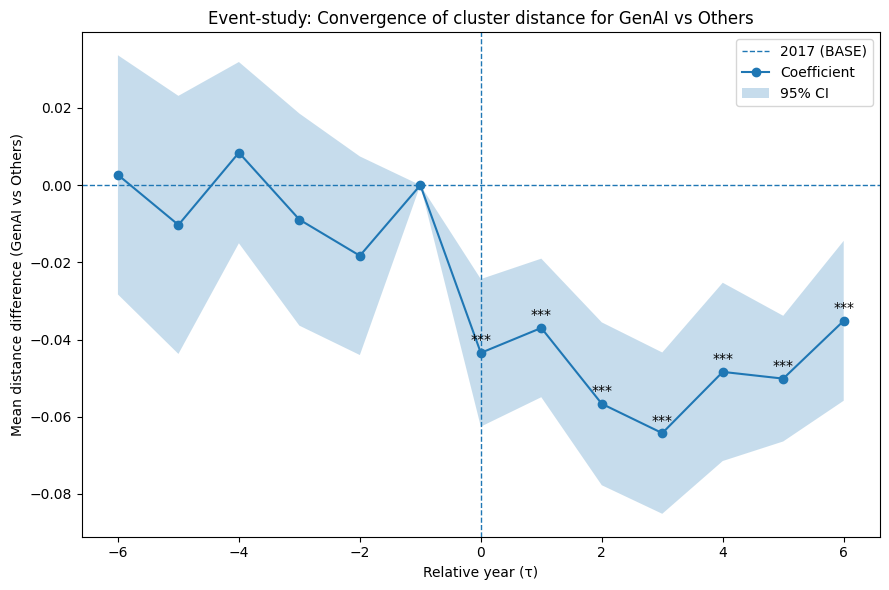

In [203]:
# ================================
# DiD on convergence of CPC-level cluster distance (GenAI vs Others, pre/post 2017)
#  • Treatment: genai_pred == "GenAI"
#  • Outcome: mean of cpc_cluster_dist_cos (fallback: dist_cluster_cos, cpc_cluster_dist)
#  • FE: country & year, cluster-robust SE by country
#  • Implementation: explicit design matrices, index-safe, NaN/Inf guard
# ================================
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import re

# ---------- 0) Columns & outcome ----------
df = df_pred.copy()

DIST_COL = (
    "cpc_cluster_dist_cos" if "cpc_cluster_dist_cos" in df.columns else
    ("dist_cluster_cos" if "dist_cluster_cos" in df.columns else
     ("cpc_cluster_dist" if "cpc_cluster_dist" in df.columns else None))
)
assert DIST_COL is not None and DIST_COL in df.columns, f"Distance column not found: {DIST_COL}"
assert {"year", "country_code", "genai_pred"}.issubset(df.columns), "Require year, country_code, genai_pred."

# 결측 제거
df = df[df[DIST_COL].notna()].copy()

# ---------- 1) Tidy vars ----------
df["year_num"] = df["year"].astype(int)
df["country_code"] = df["country_code"].astype(str)
df["GenAI"] = (df["genai_pred"].astype(str).str.upper() == "GENAI").astype(int)

BASE = 2017
POST_CUTOFF = BASE + 1  # 2018+
df["Post"] = (df["year_num"] >= POST_CUTOFF).astype(int)

# ---------- 2) Build country×year×GenAI means ----------
grp_keys = ["country_code", "year_num", "GenAI"]
panel = (
    df.groupby(grp_keys)[DIST_COL]
      .agg(Y="mean", n="count")
      .reset_index()
)

# Post 부착
panel = panel.merge(
    df[["country_code", "year_num", "Post"]].drop_duplicates(["country_code", "year_num"]),
    on=["country_code", "year_num"], how="left"
)
assert "Post" in panel.columns and panel["Post"].notna().all(), "Post was not attached to panel properly."

print("[panel] rows:", len(panel),
      "countries:", panel["country_code"].nunique(),
      "years:", panel["year_num"].nunique())

# 공통 유틸: NaN/Inf 행 제거 마스크
def finite_mask(X_df, y_vec=None):
    Xv = X_df.values
    mask = np.isfinite(Xv).all(axis=1)
    if y_vec is not None:
        mask &= np.isfinite(y_vec)
    return mask

# ---------- 3) DiD, explicit design matrix ----------
need_cols = ["Y", "GenAI", "Post", "country_code", "year_num"]
df_did = panel.loc[:, need_cols].dropna().copy()
assert df_did["country_code"].nunique() >= 2, "Need at least 2 clusters for cluster-robust SE."
df_did = df_did.reset_index(drop=True)

# 설계행렬 구성 - 같은 인덱스 유지
X_base = pd.DataFrame(
    {"Intercept": np.ones(len(df_did), dtype=float),
     "GenAI": df_did["GenAI"].astype(float).values,
     "Post":  df_did["Post"].astype(float).values},
    index=df_did.index,
)
X_base["GenAI_x_Post"] = X_base["GenAI"] * X_base["Post"]

d_cty  = pd.get_dummies(df_did["country_code"], prefix="C_cty", drop_first=True, dtype=float)
d_year = pd.get_dummies(df_did["year_num"],     prefix="C_year", drop_first=True, dtype=float)

X_did = pd.concat([X_base, d_cty, d_year], axis=1)
y_did = df_did["Y"].astype(float).values
grp_did = df_did["country_code"]

# NaN/Inf 가드
mask_did = finite_mask(X_did, y_did)
if not mask_did.all():
    print(f"[DiD] Dropping {(~mask_did).sum()} rows with NaN/Inf in design matrix.")
    X_did = X_did.loc[mask_did].copy()
    y_did = y_did[mask_did]
    grp_did = grp_did.loc[mask_did]

did_res = sm.OLS(y_did, X_did).fit(cov_type="cluster", cov_kwds={"groups": grp_did})
print("\n[DiD] GenAI × Post on mean distance (country–year means)")
print(did_res.summary())

# ---------- 4) Event-study around 2017, manual dummies ----------
WINDOW = 6
df_es = panel[(panel["year_num"] >= BASE - WINDOW) & (panel["year_num"] <= BASE + WINDOW)].copy()
df_es["rel_year"] = df_es["year_num"] - BASE
df_es = df_es.reset_index(drop=True)

# 기준기 τ = -1 제외하고 더미 생성
taus = sorted(t for t in df_es["rel_year"].unique())
taus = [t for t in taus if t != -1]
for tau in taus:
    nm = f"DY_{'m'+str(abs(tau)) if tau < 0 else 'p'+str(tau)}"
    df_es[nm] = (df_es["rel_year"] == tau).astype(int)

# GenAI × DY_* 상호작용 항만 포함
dy_cols = [c for c in df_es.columns if c.startswith("DY_") and df_es[c].sum() > 0]
inter_cols = []
for c in dy_cols:
    ic = f"GenAI_x_{c}"
    df_es[ic] = df_es["GenAI"].astype(float) * df_es[c].astype(float)
    inter_cols.append(ic)

# 회귀 프레임
keep_cols = ["Y", "GenAI", "country_code", "year_num"] + inter_cols
df_es = df_es.loc[:, keep_cols].dropna().copy()
assert df_es["country_code"].nunique() >= 2, "Need at least 2 clusters for cluster-robust SE in event-study."
df_es = df_es.reset_index(drop=True)

# 설계행렬 - 같은 인덱스 유지
X_es_base  = pd.DataFrame({"Intercept": np.ones(len(df_es), dtype=float)}, index=df_es.index)
X_es_inter = df_es[inter_cols].astype(float)
d_cty_es   = pd.get_dummies(df_es["country_code"], prefix="C_cty", drop_first=True, dtype=float)
d_year_es  = pd.get_dummies(df_es["year_num"],     prefix="C_year", drop_first=True, dtype=float)

X_es = pd.concat([X_es_base, X_es_inter, d_cty_es, d_year_es], axis=1)
y_es = df_es["Y"].astype(float).values
grp_es = df_es["country_code"]

# NaN/Inf 가드
mask_es = finite_mask(X_es, y_es)
if not mask_es.all():
    print(f"[Event-study] Dropping {(~mask_es).sum()} rows with NaN/Inf in design matrix.")
    X_es  = X_es.loc[mask_es].copy()
    y_es  = y_es[mask_es]
    grp_es = grp_es.loc[mask_es]

es_res = sm.OLS(y_es, X_es).fit(cov_type="cluster", cov_kwds={"groups": grp_es})
print("\n[Event-study] GenAI × relative years around 2017 (τ = -1 omitted)")
print(es_res.summary())

# ---------- 5) Plot coefficients with 95 % CI ----------
coefs = es_res.params
ses   = es_res.bse
pvals = es_res.pvalues

# 계수명은 "GenAI_x_DY_p0", "GenAI_x_DY_m2" 형태
years, beta, lo, hi, pv = [], [], [], [], []
for name, val in coefs.items():
    if name.startswith("GenAI_x_DY_"):
        m = re.search(r"DY_(p|m)(\d+)", name)
        if not m:
            continue
        tau = int(m.group(2)) * (1 if m.group(1) == "p" else -1)
        years.append(tau)
        s = ses[name]
        beta.append(val); lo.append(val - 1.96*s); hi.append(val + 1.96*s); pv.append(pvals[name])

# 기준기 τ = -1을 0으로 추가
years.append(-1); beta.append(0.0); lo.append(0.0); hi.append(0.0); pv.append(1.0)

# 정렬 및 시각화
if len(years) > 1:
    years, beta, lo, hi, pv = zip(*sorted(zip(years, beta, lo, hi, pv)))

    plt.figure(figsize=(9, 6))
    plt.axhline(0, linestyle="--", linewidth=1)
    plt.axvline(0, linestyle="--", linewidth=1, label="2017 (BASE)")
    plt.plot(years, beta, marker="o", label="Coefficient")
    plt.fill_between(years, lo, hi, alpha=0.25, label="95% CI")

    yspan = max(beta) - min(beta) + 1e-9
    for x, y, p in zip(years, beta, pv):
        stars = "***" if p < 0.01 else ("**" if p < 0.05 else ("*" if p < 0.1 else ""))
        if stars:
            plt.text(x, y + 0.02 * yspan, stars, ha="center", va="bottom", fontsize=10)

    plt.xlabel("Relative year (τ)")
    plt.ylabel("Mean distance difference (GenAI vs Others)")
    plt.title("Event-study: Convergence of cluster distance for GenAI vs Others")
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("[Plot] Not enough ES coefficients to plot.")


In [204]:
df_pred['genai_pred'].value_counts()

genai_pred
NonGenAI     173327
GenAI         90332
Uncertain      3860
Name: count, dtype: int64

In [205]:
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267519 entries, 0 to 267518
Data columns (total 73 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   PTO_id                     267519 non-null  object        
 1   PTO_type                   267519 non-null  object        
 2   patent_kind                267519 non-null  object        
 3   pub_type_code              266072 non-null  object        
 4   title                      267519 non-null  object        
 5   title_en                   243032 non-null  object        
 6   abstract                   267105 non-null  object        
 7   abstract_en                242747 non-null  object        
 8   claim_main                 265715 non-null  object        
 9   claim_main_en              241263 non-null  object        
 10  claims_indep               221048 non-null  object        
 11  claims_indep_en            206730 non-null  object  

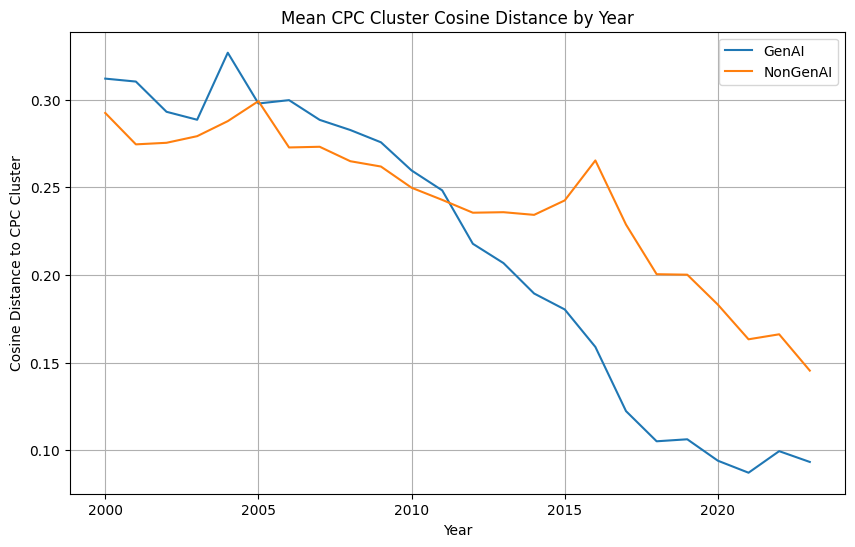

In [206]:
import matplotlib.pyplot as plt

# 연도별, 그룹별 평균 코사인 거리 계산
dist_trend = (
    df_pred.groupby(["year", "genai_pred"])["cpc_cluster_dist_cos"]
    .mean()
    .reset_index()
)

# 시각화
plt.figure(figsize=(10, 6))
for label in ["GenAI", "NonGenAI"]:
    subset = dist_trend[dist_trend["genai_pred"] == label]
    plt.plot(subset["year"], subset["cpc_cluster_dist_cos"], label=label)

plt.title("Mean CPC Cluster Cosine Distance by Year")
plt.xlabel("Year")
plt.ylabel("Cosine Distance to CPC Cluster")
plt.legend()
plt.grid(True)
plt.show()


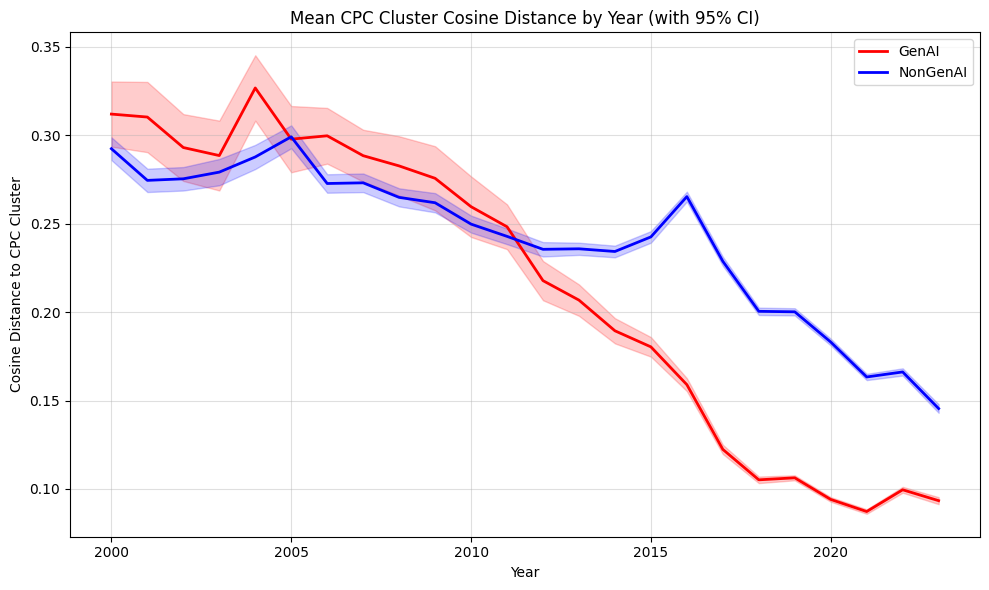

In [207]:
import matplotlib.pyplot as plt
import numpy as np

# 연도별, 그룹별 평균 및 신뢰구간 계산
dist_stats = (
    df_pred.groupby(["year", "genai_pred"])["cpc_cluster_dist_cos"]
    .agg(mean="mean", std="std", n="count")
    .reset_index()
)
dist_stats["se"] = dist_stats["std"] / np.sqrt(dist_stats["n"])
dist_stats["ci_lower"] = dist_stats["mean"] - 1.96 * dist_stats["se"]
dist_stats["ci_upper"] = dist_stats["mean"] + 1.96 * dist_stats["se"]

# 시각화
plt.figure(figsize=(10, 6))
colors = {"GenAI": "red", "NonGenAI": "blue"}

for label in ["GenAI", "NonGenAI"]:
    subset = dist_stats[dist_stats["genai_pred"] == label]
    # 평균 라인
    plt.plot(subset["year"], subset["mean"], label=label, color=colors[label], linewidth=2)
    # 95% 신뢰구간 밴드
    plt.fill_between(
        subset["year"], subset["ci_lower"], subset["ci_upper"],
        color=colors[label], alpha=0.2
    )

plt.title("Mean CPC Cluster Cosine Distance by Year (with 95% CI)")
plt.xlabel("Year")
plt.ylabel("Cosine Distance to CPC Cluster")
plt.legend()
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()


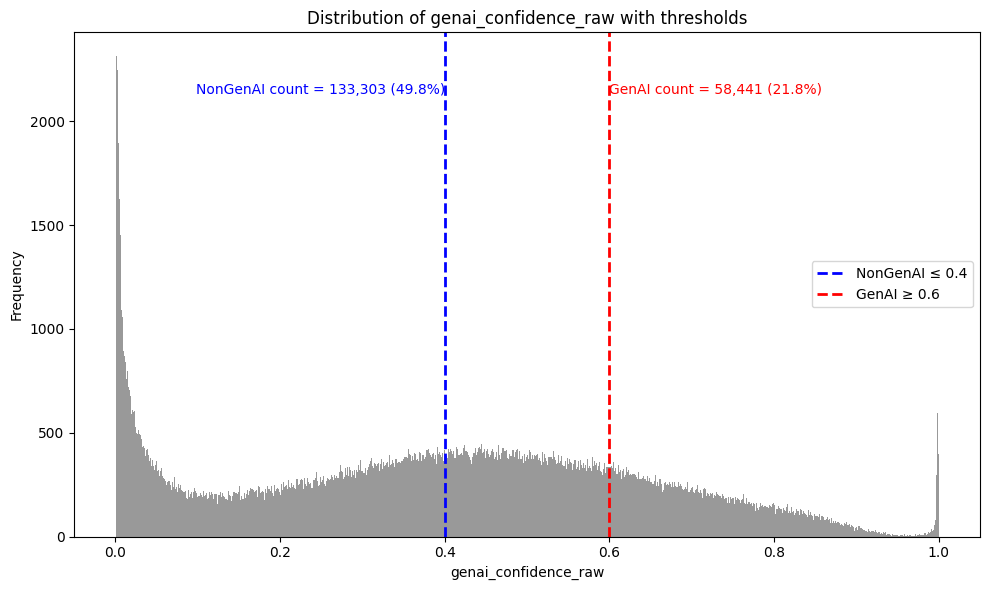

In [208]:
import matplotlib.pyplot as plt

# threshold
thr_hi = 0.6
thr_lo = 0.4

# 전체 개수
total_count = len(df_pred)

# 1) 누적 개수 + 퍼센트 계산
non_genai_count = (df_pred["genai_confidence_raw"] <= thr_lo).sum()
genai_count = (df_pred["genai_confidence_raw"] >= thr_hi).sum()

non_genai_pct = non_genai_count / total_count * 100
genai_pct = genai_count / total_count * 100

plt.figure(figsize=(10, 6))

# 2) Histogram (촘촘하게, 테두리 제거, grey 색상)
plt.hist(
    df_pred["genai_confidence_raw"],
    bins=1000,
    color="grey",
    alpha=0.8,
    edgecolor=None
)

# 3) Threshold lines
plt.axvline(thr_lo, color="blue", linestyle="--", linewidth=2, label=f"NonGenAI ≤ {thr_lo}")
plt.axvline(thr_hi, color="red", linestyle="--", linewidth=2, label=f"GenAI ≥ {thr_hi}")

# 4) 텍스트 추가 (y축 최댓값 기준으로 위치 잡기)
ymax = plt.gca().get_ylim()[1]
plt.text(thr_lo, ymax*0.9,
         f"NonGenAI count = {non_genai_count:,} ({non_genai_pct:.1f}%)",
         color="blue", ha="right", va="top", fontsize=10)
plt.text(thr_hi, ymax*0.9,
         f"GenAI count = {genai_count:,} ({genai_pct:.1f}%)",
         color="red", ha="left", va="top", fontsize=10)

# 5) 마무리 (배경 흰색, 격자 제거)
plt.title("Distribution of genai_confidence_raw with thresholds")
plt.xlabel("genai_confidence_raw")
plt.ylabel("Frequency")
plt.legend()
plt.grid(False)   # 격자 제거
plt.tight_layout()
plt.show()


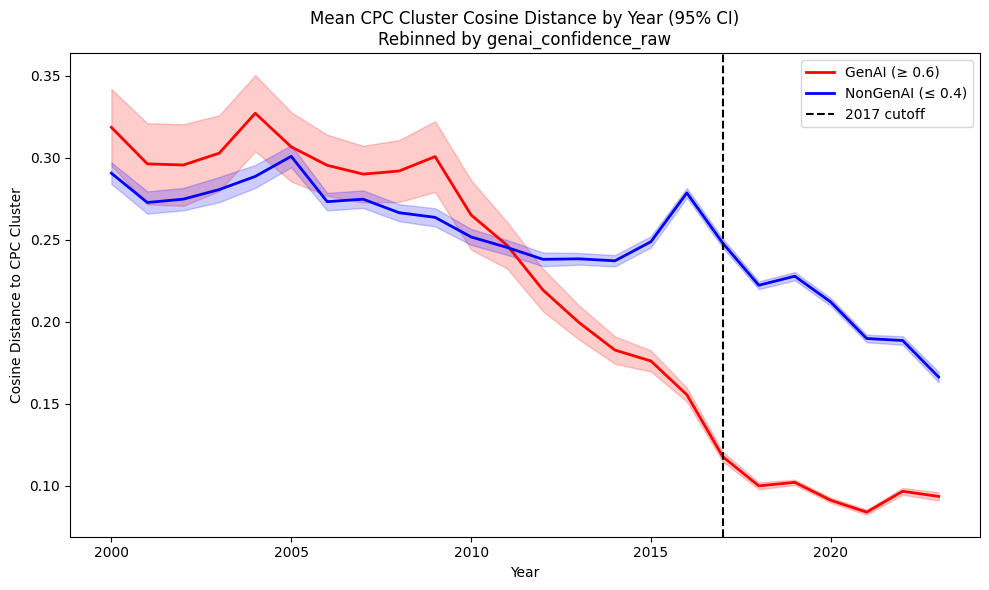

In [209]:
# Cell 7-(1b3)-FIX2: add threshold info into legend

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


df_plot = df_pred.copy()
if df_plot["year"].dtype.kind not in ("i", "u"):
    df_plot["year"] = df_plot["year"].astype(int)

# 1) 신뢰도 기준 라벨링
labels = np.select(
    [
        df_plot["genai_confidence_raw"] >= thr_hi,
        df_plot["genai_confidence_raw"] <= thr_lo
    ],
    ["GenAI", "NonGenAI"],
    default=None
)
df_plot["genai_conf_bin"] = pd.Series(labels, dtype="object")

# 2) 결측 제거
df_plot = df_plot.dropna(subset=["genai_conf_bin", "cpc_cluster_dist_cos", "year"])

# 3) 연도 × 그룹 평균과 95% CI
dist_stats = (
    df_plot.groupby(["year", "genai_conf_bin"])["cpc_cluster_dist_cos"]
           .agg(mean="mean", std=lambda s: s.std(ddof=1), n="count")
           .reset_index()
)
dist_stats["se"] = dist_stats["std"] / np.sqrt(dist_stats["n"])
dist_stats["ci_lower"] = dist_stats["mean"] - 1.96 * dist_stats["se"]
dist_stats["ci_upper"] = dist_stats["mean"] + 1.96 * dist_stats["se"]

# # 4) 시각화
# plt.figure(figsize=(10, 6))
# colors = {"GenAI": "red", "NonGenAI": "blue"}
# labels_map = {
#     "GenAI": f"GenAI (≥ {thr_hi})",
#     "NonGenAI": f"NonGenAI (≤ {thr_lo})"
# }

# for label in ["GenAI", "NonGenAI"]:
#     sub = dist_stats[dist_stats["genai_conf_bin"] == label].sort_values("year")
#     if sub.empty:
#         continue
#     plt.plot(sub["year"], sub["mean"], label=labels_map[label], color=colors.get(label), linewidth=2)
#     plt.fill_between(sub["year"], sub["ci_lower"], sub["ci_upper"],
#                      color=colors.get(label), alpha=0.2)

# plt.title("Mean CPC Cluster Cosine Distance by Year (95% CI)\nRebinned by genai_confidence_raw")
# plt.xlabel("Year")
# plt.ylabel("Cosine Distance to CPC Cluster")
# plt.legend()
# plt.grid(True, alpha=0.4)
# plt.tight_layout()
# plt.show()

# 4) 시각화
plt.figure(figsize=(10, 6))
colors = {"GenAI": "red", "NonGenAI": "blue"}
labels_map = {
    "GenAI": f"GenAI (≥ {thr_hi})",
    "NonGenAI": f"NonGenAI (≤ {thr_lo})"
}

for label in ["GenAI", "NonGenAI"]:
    sub = dist_stats[dist_stats["genai_conf_bin"] == label].sort_values("year")
    if sub.empty:
        continue
    plt.plot(sub["year"], sub["mean"], label=labels_map[label],
             color=colors.get(label), linewidth=2)
    plt.fill_between(sub["year"], sub["ci_lower"], sub["ci_upper"],
                     color=colors.get(label), alpha=0.2)

#  2017 기준선 추가
plt.axvline(2017, color="black", linestyle="--", linewidth=1.5, label="2017 cutoff")

plt.title("Mean CPC Cluster Cosine Distance by Year (95% CI)\nRebinned by genai_confidence_raw")
plt.xlabel("Year")
plt.ylabel("Cosine Distance to CPC Cluster")
plt.legend()
plt.grid(False)   #  회색 그리드 제거
plt.tight_layout()
plt.show()



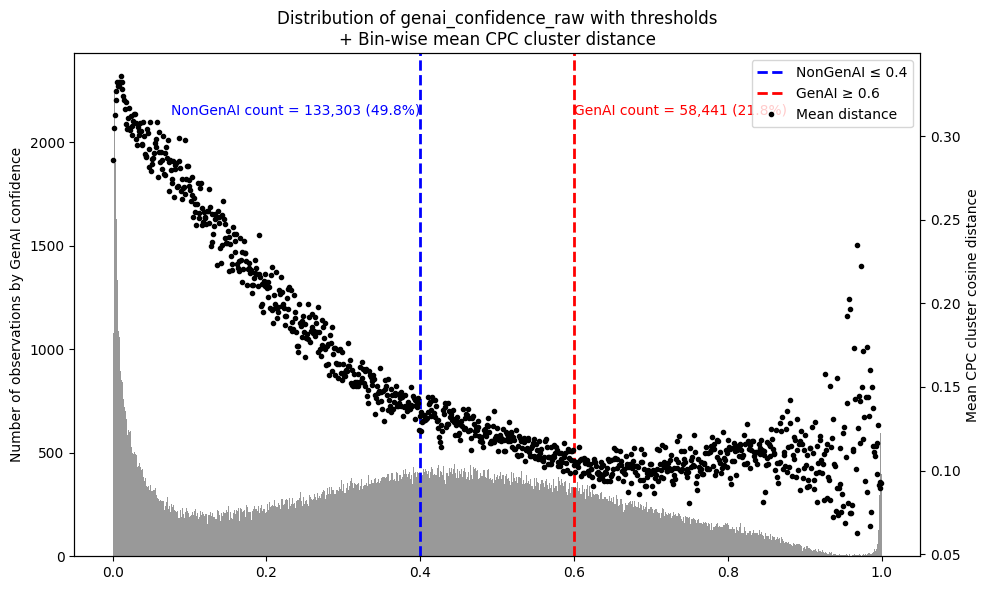

In [210]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# threshold
thr_hi = 0.6
thr_lo = 0.4

# 전체 개수
total_count = len(df_pred)

# 1) 누적 개수 + 퍼센트 계산
non_genai_count = (df_pred["genai_confidence_raw"] <= thr_lo).sum()
genai_count = (df_pred["genai_confidence_raw"] >= thr_hi).sum()

non_genai_pct = non_genai_count / total_count * 100
genai_pct = genai_count / total_count * 100

plt.figure(figsize=(10, 6))

# 2) Histogram (촘촘하게, 테두리 제거, grey 색상)
#    └─ bin 경계를 받아오기 위해 반환값을 변수에 받습니다.
n, bin_edges, _ = plt.hist(
    df_pred["genai_confidence_raw"],
    bins=1000,
    color="grey",
    alpha=0.8,
    edgecolor=None
)

# 3) Threshold lines
plt.axvline(thr_lo, color="blue", linestyle="--", linewidth=2, label=f"NonGenAI ≤ {thr_lo}")
plt.axvline(thr_hi, color="red", linestyle="--", linewidth=2, label=f"GenAI ≥ {thr_hi}")

# 4) 텍스트 추가 (y축 최댓값 기준으로 위치 잡기)
ymax = plt.gca().get_ylim()[1]
plt.text(thr_lo, ymax*0.9,
         f"NonGenAI count = {non_genai_count:,} ({non_genai_pct:.1f}%)",
         color="blue", ha="right", va="top", fontsize=10)
plt.text(thr_hi, ymax*0.9,
         f"GenAI count = {genai_count:,} ({genai_pct:.1f}%)",
         color="red", ha="left", va="top", fontsize=10)

# ─────────────────────────────────────────────────────────────
# 5) 2019–2023년 데이터만 사용하여 bin 단위로 평균 cpc_cluster_dist_cos 계산
#    └─ 히스토그램과 동일한 bin_edges 사용
mask_year = df_pred["year"].between(2000, 2023, inclusive="both")
sub = df_pred.loc[mask_year, ["genai_confidence_raw", "cpc_cluster_dist_cos"]].dropna()

# bin 할당
bin_idx = np.digitize(sub["genai_confidence_raw"].to_numpy(), bins=bin_edges) - 1
# 유효한 bin만 필터링
valid = (bin_idx >= 0) & (bin_idx < len(bin_edges) - 1)
bin_idx = bin_idx[valid]
sub_vals = sub["cpc_cluster_dist_cos"].to_numpy()[valid]

# bin별 평균 계산
# 1000개 bin이므로 길이가 동일한 배열에 평균을 채웁니다.
bin_means = np.full(len(bin_edges) - 1, np.nan, dtype=float)
if bin_idx.size > 0:
    # 각 bin에 대한 평균
    df_bins = pd.DataFrame({"bin": bin_idx, "val": sub_vals}).groupby("bin")["val"].mean()
    bin_means[df_bins.index.to_numpy()] = df_bins.to_numpy()

# bin 중간값(x 위치)
bin_mids = (bin_edges[:-1] + bin_edges[1:]) / 2.0

# 6) 보조 y축에 평균값 점 오버레이
ax1 = plt.gca()
ax2 = ax1.twinx()
# 검은 점만 찍기, 선은 없음
ax2.plot(bin_mids, bin_means, linestyle="none", marker="o", markersize=3, color="black", label="Mean distance")
ax2.set_ylabel("Mean CPC cluster cosine distance")

# 범례 결합
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")

# 7) 마무리 (배경 흰색, 격자 제거)
plt.title("Distribution of genai_confidence_raw with thresholds\n+ Bin-wise mean CPC cluster distance")
plt.xlabel("genai_confidence_raw")
ax1.set_ylabel("Number of observations by GenAI confidence")
plt.grid(False)   # 격자 제거
plt.tight_layout()
plt.show()


[panel] rows: 1646 countries: 108 years: 24

[DiD] GenAI × Post on mean distance (country–year means, thresholded bins)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.635
Method:                 Least Squares   F-statistic:                     1061.
Date:                Thu, 25 Sep 2025   Prob (F-statistic):          1.19e-116
Time:                        01:38:18   Log-Likelihood:                 2479.9
No. Observations:                1646   AIC:                            -4694.
Df Residuals:                    1513   BIC:                            -3975.
Df Model:                         132                                         
Covariance Type:              cluster                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
---------

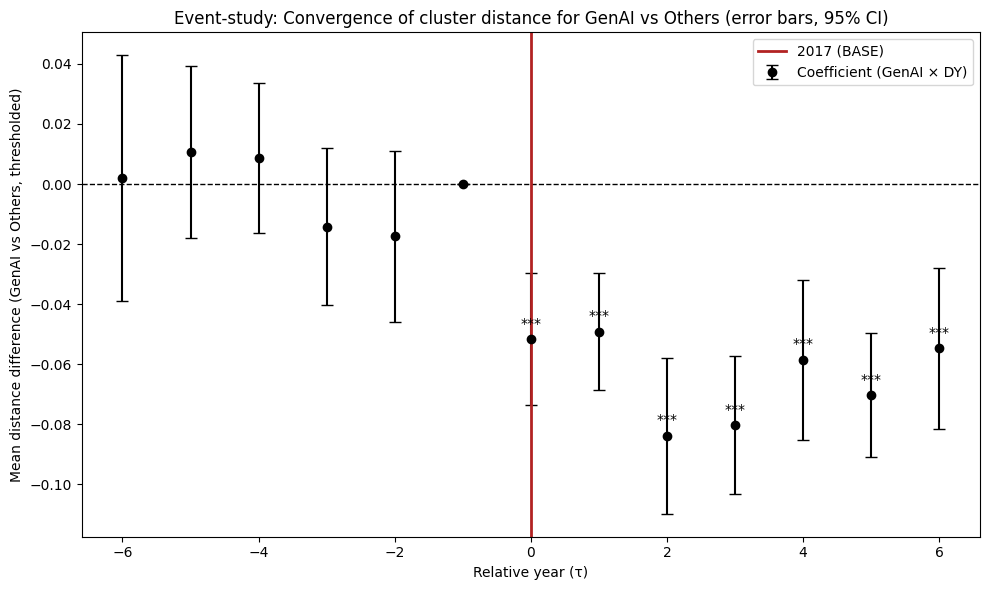

In [211]:
# ================================
# DiD on convergence of CPC-level cluster distance (GenAI vs Others by confidence thresholds)
#  • Treatment: genai_conf_bin == "GenAI"  [rebinned by genai_confidence_raw: GenAI ≥ thr_hi, NonGenAI ≤ thr_lo]
#  • Uncertain (thr_lo < p < thr_hi) is dropped
#  • Outcome: mean of cpc_cluster_dist_cos (fallback: dist_cluster_cos, cpc_cluster_dist)
#  • FE: country & year, cluster-robust SE by country
# ================================
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import re

# ---------- 0) Columns, thresholds, outcome ----------
df = df_pred.copy()

# Create thresholded bin variable
labels = np.select(
    [
        df["genai_confidence_raw"] >= thr_hi,
        df["genai_confidence_raw"] <= thr_lo
    ],
    ["GenAI", "NonGenAI"],
    default=None
)
df["genai_conf_bin"] = pd.Series(labels, dtype="object")

# Choose distance column
DIST_COL = (
    "cpc_cluster_dist_cos" if "cpc_cluster_dist_cos" in df.columns else
    ("dist_cluster_cos" if "dist_cluster_cos" in df.columns else
     ("cpc_cluster_dist" if "cpc_cluster_dist" in df.columns else None))
)
assert DIST_COL is not None and DIST_COL in df.columns, f"Distance column not found: {DIST_COL}"
assert {"year", "country_code", "genai_conf_bin"}.issubset(df.columns), "Require year, country_code, genai_conf_bin."

# Drop missing and uncertain band
df = df[df[DIST_COL].notna()].copy()
df = df[df["genai_conf_bin"].notna()].copy()

# ---------- 1) Tidy vars ----------
df["year_num"] = df["year"].astype(int)
df["country_code"] = df["country_code"].astype(str)
df["GenAI"] = (df["genai_conf_bin"] == "GenAI").astype(int)

BASE = 2017
POST_CUTOFF = BASE + 1  # 2018+
df["Post"] = (df["year_num"] >= POST_CUTOFF).astype(int)

# ---------- 2) Build country×year×GenAI means ----------
grp_keys = ["country_code", "year_num", "GenAI"]
panel = (
    df.groupby(grp_keys)[DIST_COL]
      .agg(Y="mean", n="count")
      .reset_index()
)

# Attach Post
panel = panel.merge(
    df[["country_code", "year_num", "Post"]].drop_duplicates(["country_code", "year_num"]),
    on=["country_code", "year_num"], how="left"
)
assert "Post" in panel.columns and panel["Post"].notna().all(), "Post was not attached to panel properly."

print("[panel] rows:", len(panel),
      "countries:", panel["country_code"].nunique(),
      "years:", panel["year_num"].nunique())

def finite_mask(X_df, y_vec=None):
    Xv = X_df.values
    mask = np.isfinite(Xv).all(axis=1)
    if y_vec is not None:
        mask &= np.isfinite(y_vec)
    return mask

# ---------- 3) DiD, explicit design matrix ----------
need_cols = ["Y", "GenAI", "Post", "country_code", "year_num"]
df_did = panel.loc[:, need_cols].dropna().copy()
assert df_did["country_code"].nunique() >= 2, "Need at least 2 clusters for cluster-robust SE."
df_did = df_did.reset_index(drop=True)

X_base = pd.DataFrame(
    {"Intercept": np.ones(len(df_did), dtype=float),
     "GenAI": df_did["GenAI"].astype(float).values,
     "Post":  df_did["Post"].astype(float).values},
    index=df_did.index,
)
X_base["GenAI_x_Post"] = X_base["GenAI"] * X_base["Post"]

d_cty  = pd.get_dummies(df_did["country_code"], prefix="C_cty", drop_first=True, dtype=float)
d_year = pd.get_dummies(df_did["year_num"],     prefix="C_year", drop_first=True, dtype=float)

X_did = pd.concat([X_base, d_cty, d_year], axis=1)
y_did = df_did["Y"].astype(float).values
grp_did = df_did["country_code"]

mask_did = finite_mask(X_did, y_did)
if not mask_did.all():
    print(f"[DiD] Dropping {(~mask_did).sum()} rows with NaN/Inf in design matrix.")
    X_did = X_did.loc[mask_did].copy()
    y_did = y_did[mask_did]
    grp_did = grp_did.loc[mask_did]

did_res = sm.OLS(y_did, X_did).fit(cov_type="cluster", cov_kwds={"groups": grp_did})
print("\n[DiD] GenAI × Post on mean distance (country–year means, thresholded bins)")
print(did_res.summary())

# ---------- 4) Event-study around 2017 ----------
WINDOW = 6
df_es = panel[(panel["year_num"] >= BASE - WINDOW) & (panel["year_num"] <= BASE + WINDOW)].copy()
df_es["rel_year"] = df_es["year_num"] - BASE
df_es = df_es.reset_index(drop=True)

taus = sorted(t for t in df_es["rel_year"].unique())
taus = [t for t in taus if t != -1]
for tau in taus:
    nm = f"DY_{'m'+str(abs(tau)) if tau < 0 else 'p'+str(tau)}"
    df_es[nm] = (df_es["rel_year"] == tau).astype(int)

inter_cols = []
for c in [c for c in df_es.columns if c.startswith("DY_") and df_es[c].sum() > 0]:
    ic = f"GenAI_x_{c}"
    df_es[ic] = df_es["GenAI"].astype(float) * df_es[c].astype(float)
    inter_cols.append(ic)

keep_cols = ["Y", "GenAI", "country_code", "year_num"] + inter_cols
df_es = df_es.loc[:, keep_cols].dropna().copy()
assert df_es["country_code"].nunique() >= 2, "Need at least 2 clusters for cluster-robust SE in event-study."
df_es = df_es.reset_index(drop=True)

X_es_base  = pd.DataFrame({"Intercept": np.ones(len(df_es), dtype=float)}, index=df_es.index)
X_es_inter = df_es[inter_cols].astype(float)
d_cty_es   = pd.get_dummies(df_es["country_code"], prefix="C_cty", drop_first=True, dtype=float)
d_year_es  = pd.get_dummies(df_es["year_num"],     prefix="C_year", drop_first=True, dtype=float)

X_es = pd.concat([X_es_base, X_es_inter, d_cty_es, d_year_es], axis=1)
y_es = df_es["Y"].astype(float).values
grp_es = df_es["country_code"]

mask_es = finite_mask(X_es, y_es)
if not mask_es.all():
    print(f"[Event-study] Dropping {(~mask_es).sum()} rows with NaN/Inf in design matrix.")
    X_es  = X_es.loc[mask_es].copy()
    y_es  = y_es[mask_es]
    grp_es = grp_es.loc[mask_es]

es_res = sm.OLS(y_es, X_es).fit(cov_type="cluster", cov_kwds={"groups": grp_es})
print("\n[Event-study] GenAI × relative years around 2017 (τ = -1 omitted, thresholded bins)")
print(es_res.summary())

# ---------- 5) Plot coefficients with 95 % CI (error bars style) ----------
coefs = es_res.params
ses   = es_res.bse
pvals = es_res.pvalues

years, beta, lo, hi, pv = [], [], [], [], []
for name, val in coefs.items():
    if name.startswith("GenAI_x_DY_"):
        m = re.search(r"DY_(p|m)(\d+)", name)
        if not m:
            continue
        tau = int(m.group(2)) * (1 if m.group(1) == "p" else -1)
        se = ses[name]
        years.append(tau)
        beta.append(val)
        lo.append(val - 1.96 * se)
        hi.append(val + 1.96 * se)
        pv.append(pvals[name])

# 기준기 τ = -1을 0으로 추가
years.append(-1); beta.append(0.0); lo.append(0.0); hi.append(0.0); pv.append(1.0)

if len(years) > 1:
    years, beta, lo, hi, pv = zip(*sorted(zip(years, beta, lo, hi, pv)))
    years = np.array(years); beta = np.array(beta); lo = np.array(lo); hi = np.array(hi); pv = np.array(pv)

    # yerr 계산
    yerr = np.vstack((beta - lo, hi - beta))

    plt.figure(figsize=(10, 6))

    # 점추정치 + 에러바
    plt.errorbar(
        years, beta,
        yerr=yerr,
        fmt="o", color="black", ecolor="black",
        elinewidth=1.5, capsize=4, label="Coefficient (GenAI × DY)"
    )

    # 기준선
    plt.axhline(0, color="black", linestyle="--", linewidth=1)
    plt.axvline(0, color="firebrick", linewidth=2, label="2017 (BASE)")

    # 유의성 별표
    yspan = float(np.nanmax(beta) - np.nanmin(beta) + 1e-9)
    for x, y, p in zip(years, beta, pv):
        stars = "***" if p < 0.01 else ("**" if p < 0.05 else ("*" if p < 0.1 else ""))
        if stars and x != -1:
            plt.text(x, y + 0.03 * yspan, stars, ha="center", va="bottom", fontsize=10, color="black")

    plt.xlabel("Relative year (τ)")
    plt.ylabel("Mean distance difference (GenAI vs Others, thresholded)")
    plt.title("Event-study: Convergence of cluster distance for GenAI vs Others (error bars, 95% CI)")
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("[Plot] Not enough ES coefficients to plot.")


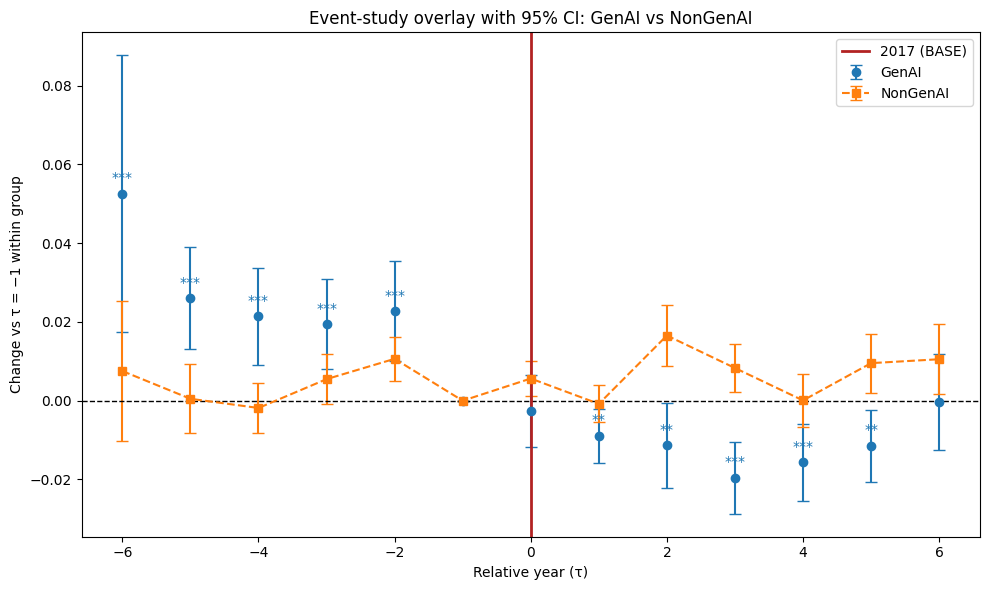

[Pre-trend p-value] GenAI: 0.0000 | NonGenAI: 0.0015


In [212]:
# ===========================================
# Event-study overlay with error bars: GenAI vs NonGenAI
#  • Uses the already-built `panel`, `BASE`, `WINDOW`
#  • country & year FE, cluster-robust SE by country
# ===========================================
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import re

def build_es_group(panel_sub, base_year, window):
    es = panel_sub[(panel_sub["year_num"] >= base_year - window) &
                   (panel_sub["year_num"] <= base_year + window)].copy()
    es["rel_year"] = es["year_num"] - base_year
    es = es.reset_index(drop=True)
    taus = sorted(es["rel_year"].unique())
    taus = [t for t in taus if t != -1]
    for tau in taus:
        nm = f"DY_{'m'+str(abs(tau)) if tau < 0 else 'p'+str(tau)}"
        es[nm] = (es["rel_year"] == tau).astype(int)
    dy_cols = [c for c in es.columns if c.startswith("DY_") and es[c].sum() > 0]
    return es, dy_cols

def fit_es(es_df, dy_cols):
    X0 = pd.DataFrame({"Intercept": np.ones(len(es_df), dtype=float)}, index=es_df.index)
    Xd = es_df[dy_cols].astype(float)
    Dc = pd.get_dummies(es_df["country_code"], prefix="C_cty", drop_first=True, dtype=float)
    Dy = pd.get_dummies(es_df["year_num"],     prefix="C_year", drop_first=True, dtype=float)
    X = pd.concat([X0, Xd, Dc, Dy], axis=1)
    y = es_df["Y"].astype(float).values
    g = es_df["country_code"]
    mask = np.isfinite(X.values).all(axis=1) & np.isfinite(y)
    X, y, g = X.loc[mask], y[mask], g.loc[mask]
    return sm.OLS(y, X).fit(cov_type="cluster", cov_kwds={"groups": g})

def collect_series(res):
    years, beta, lo, hi, pv = [], [], [], [], []
    for name, val in res.params.items():
        if not name.startswith("DY_"):
            continue
        m = re.search(r"DY_(p|m)(\d+)", name)
        if not m:
            continue
        tau = int(m.group(2)) * (1 if m.group(1) == "p" else -1)
        se = res.bse[name]
        years.append(tau); beta.append(val); lo.append(val - 1.96*se); hi.append(val + 1.96*se); pv.append(res.pvalues[name])
    # add baseline τ = −1 at zero
    years.append(-1); beta.append(0.0); lo.append(0.0); hi.append(0.0); pv.append(1.0)
    years, beta, lo, hi, pv = zip(*sorted(zip(years, beta, lo, hi, pv)))
    years = np.array(years); beta = np.array(beta); lo = np.array(lo); hi = np.array(hi); pv = np.array(pv)
    yerr = np.vstack((beta - lo, hi - beta))
    return years, beta, yerr, pv

# 1) Split panel by group
panel_G = panel[panel["GenAI"] == 1].copy()
panel_N = panel[panel["GenAI"] == 0].copy()

# 2) Build ES frames and fit regressions
esG, dyG = build_es_group(panel_G, BASE, WINDOW)
resG = fit_es(esG, dyG)
yrsG, bG, yerrG, pGv = collect_series(resG)

esN, dyN = build_es_group(panel_N, BASE, WINDOW)
resN = fit_es(esN, dyN)
yrsN, bN, yerrN, pNv = collect_series(resN)

# 3) Plot overlay with error bars
plt.figure(figsize=(10, 6))

plt.errorbar(
    yrsG, bG, yerr=yerrG, fmt="o", color="#1f77b4", ecolor="#1f77b4",
    elinewidth=1.5, capsize=4, label="GenAI"
)
plt.errorbar(
    yrsN, bN, yerr=yerrN, fmt="s--", color="#ff7f0e", ecolor="#ff7f0e",
    elinewidth=1.5, capsize=4, label="NonGenAI"
)

# Baselines
plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.axvline(0, color="firebrick", linewidth=2, label=f"{BASE} (BASE)")

# Stars for GenAI only
yspan = float(np.nanmax(np.r_[bG, bN]) - np.nanmin(np.r_[bG, bN]) + 1e-9)
for x, y, p in zip(yrsG, bG, pGv):
    stars = "***" if p < 0.01 else ("**" if p < 0.05 else ("*" if p < 0.1 else ""))
    if stars and x != -1:
        plt.text(x, y + 0.03*yspan, stars, ha="center", va="bottom", fontsize=10, color="#1f77b4")

plt.xlabel("Relative year (τ)")
plt.ylabel("Change vs τ = −1 within group")
plt.title("Event-study overlay with 95% CI: GenAI vs NonGenAI")
plt.legend()
plt.tight_layout()
plt.show()

# 4) Pre-trend joint tests
def pretrend_pvalue(res):
    pre_names = [nm for nm in res.params.index if nm.startswith("DY_") and "_m" in nm]
    if not pre_names:
        return np.nan
    R = np.zeros((len(pre_names), len(res.params)))
    idx = {nm:i for i, nm in enumerate(res.params.index)}
    for i, nm in enumerate(pre_names):
        R[i, idx[nm]] = 1.0
    return float(res.f_test(R).pvalue)

print(f"[Pre-trend p-value] GenAI: {pretrend_pvalue(resG):.4f} | NonGenAI: {pretrend_pvalue(resN):.4f}")


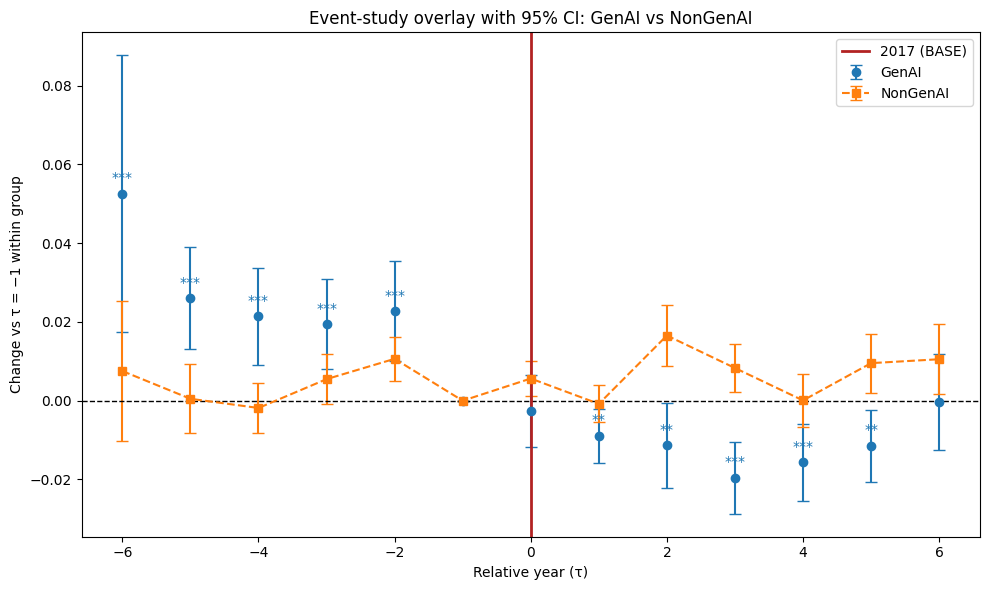

그림이 저장되었습니다: E:/data1\event_study_overlay_GenAI_vs_NonGenAI.png


In [213]:
import os

# 저장 경로 지정
save_path = os.path.join(base_dir, "event_study_overlay_GenAI_vs_NonGenAI.png")

plt.figure(figsize=(10, 6))

plt.errorbar(
    yrsG, bG, yerr=yerrG, fmt="o", color="#1f77b4", ecolor="#1f77b4",
    elinewidth=1.5, capsize=4, label="GenAI"
)
plt.errorbar(
    yrsN, bN, yerr=yerrN, fmt="s--", color="#ff7f0e", ecolor="#ff7f0e",
    elinewidth=1.5, capsize=4, label="NonGenAI"
)

# Baselines
plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.axvline(0, color="firebrick", linewidth=2, label=f"{BASE} (BASE)")

# Stars for GenAI only
yspan = float(np.nanmax(np.r_[bG, bN]) - np.nanmin(np.r_[bG, bN]) + 1e-9)
for x, y, p in zip(yrsG, bG, pGv):
    stars = "***" if p < 0.01 else ("**" if p < 0.05 else ("*" if p < 0.1 else ""))
    if stars and x != -1:
        plt.text(x, y + 0.03*yspan, stars, ha="center", va="bottom", fontsize=10, color="#1f77b4")

plt.xlabel("Relative year (τ)")
plt.ylabel("Change vs τ = −1 within group")
plt.title("Event-study overlay with 95% CI: GenAI vs NonGenAI")
plt.legend()
plt.tight_layout()

# 600 dpi로 저장
plt.savefig(save_path, dpi=600)
plt.show()

print(f"그림이 저장되었습니다: {save_path}")


In [214]:

# 저장 경로 설정
save_path = os.path.join(base_dir, "genai_appl_ids.csv")

# GenAI의 appl_id만 추출
genai_appl_ids = df_pred.loc[df_pred["genai_pred"] == "GenAI", ["appl_id"]]

# CSV 저장
genai_appl_ids.to_csv(save_path, index=False, encoding="utf-8-sig")
print(f"CSV 저장 완료: {save_path}")


CSV 저장 완료: E:/data1\genai_appl_ids.csv


In [215]:
file_path = os.path.join(base_dir, "genai_appl_ids.csv")

# CSV 읽기
genai_appl_ids_loaded = pd.read_csv(file_path)

print("불러온 데이터 크기:", genai_appl_ids_loaded.shape)
print(genai_appl_ids_loaded.head())


불러온 데이터 크기: (90332, 1)
             appl_id
0          17/039133
1          16/401254
2          15/931223
3  PCT-IB2021-052265
4          13/513530


In [216]:
appl_id_list = genai_appl_ids_loaded["appl_id"].tolist()
print("리스트 길이:", len(appl_id_list))
print(appl_id_list[:10])  # 앞 10개 확인


리스트 길이: 90332
['17/039133', '16/401254', '15/931223', 'PCT-IB2021-052265', '13/513530', '17/725433', '17/403888', '17/901228', 'PCT-IB2022-062942', '17/646711']


# **Cell 12-(1b) List and Filter CSV Files**

In [217]:
# Cell 12-(1b) List and Filter CSV Files
#  지정된 폴더에서 접두어(prefix)가 일치하는 CSV 파일 목록을 생성합니다
base_dir = 'E:/data1'  # base_dir: path to the data folder
#base_dir = '/Users/deep1003/Downloads'  # base_dir: path to the data folder
# prefixes = ('1', '3', '4', '7',  '8')                                 
prefixes = ('9')       
all_csv   = glob(os.path.join(base_dir, '*.csv'))      # 폴더 내 모든 CSV 경로 수집
csv_files = [f for f in all_csv if os.path.basename(f).startswith(prefixes)]

In [218]:
# Cell 2-(2): Load CSV Files and Remove Duplicates
#  여러 CSV 파일을 읽어 하나의 DataFrame으로 통합하고 완전 중복 행을 제거합니다
df_list = []                                           # 개별 CSV 데이터프레임을 담을 리스트
for f in csv_files:
    for enc in ('utf-8', 'cp949', 'latin1'):           # 시도할 인코딩 목록
        try:
            df = pd.read_csv(f, encoding=enc)          # CSV 읽기
            print(f'{os.path.basename(f)} (encoding={enc}) 로딩 완료')
            df_list.append(df)
            break                                      # 성공 시 다음 파일로 이동
        except Exception:
            continue                                   # 실패 시 다른 인코딩 시도
combined_df1 = (                                        # DataFrame 통합 및 완전 중복 제거
    pd.concat(df_list, ignore_index=True)
      .drop_duplicates()
)
print(f'병합 후 총 행 수: {len(combined_df1)}')

9.DeepLearning_1.csv (encoding=cp949) 로딩 완료
9.DeepLearning_2.csv (encoding=cp949) 로딩 완료
9.DeepLearning_3.csv (encoding=cp949) 로딩 완료
9.DeepLearning_4.csv (encoding=cp949) 로딩 완료
9.DeepLearning_5.csv (encoding=cp949) 로딩 완료
병합 후 총 행 수: 40788


In [219]:
# Cell 2-(3): Column name mapping (Korean → English)
import pandas as pd  # Use pandas for DataFrame operations

# 1) Apply column mapping to combined_df1
orig = combined_df1.columns.tolist()  # List of original column names

# List of new English column names with bilingual comments for each
new = [
    "PTO_id",                 # 국가코드 (Country code)
    "PTO_type",               # DB종류 (Database type)
    "patent_kind",            # 특허/실용 구분 (Patent vs utility model)
    "pub_type_code",          # 문헌종류 코드 (Publication type code)
    "title",                  # 발명의 명칭 (Invention title)
    "title_en",               # 발명의 명칭-번역문 (Invention title – translation)
    "abstract",               # 요약 (Abstract)
    "abstract_en",            # 요약-번역문 (Abstract – translation)
    "claim_main",             # 대표청구항 (Main claim)
    "claim_main_en",          # 대표청구항-번역문 (Main claim – translation)
    "claims_indep",           # 독립청구항[KR,JP,US,CN,EP,IN] (Independent claims [KR, JP, US, CN, EP, IN])
    "claims_indep_en",        # 독립청구항-번역문[JP,US,CN,EP] (Independent claims – translation [JP, US, CN, EP])
    "num_claims",             # 청구항 수 (Number of claims)
    "appl_id",                # 출원번호 (Application number)
    "appl_date",              # 출원일 (Application date)
    "pub_id",                 # 공개번호 (Publication number)
    "pub_date",               # 공개일 (Publication date)
    "grant_id",               # 등록번호 (Grant number)
    "grant_date",             # 등록일 (Grant date)
    "applicant",              # 출원인 (Applicant)
    "inventor",               # 발명자 (Inventor)
    "citations_count",        # 인용 문헌 수(B1) (Citations count (B1))
    "citation_ids",           # 인용 문헌번호(B1) (Citation IDs (B1))
    "cited_by_count",         # 피인용 문헌 수(F1) (Cited-by count (F1))
    "cited_by_ids",           # 피인용 문헌번호(F1) (Cited-by IDs (F1))
    "wips_family_id",         # WIPS패밀리 ID (WIPS family ID)
    "wips_family_pub_ids",    # WIPS패밀리 문헌번호(출원기준) (WIPS family publication IDs)
    "wips_family_pub_count",  # WIPS패밀리 문헌 수(출원기준) (WIPS family publication count)
    "status_info",            # 상태정보[KR,JP,US,EP,CN,CA,AU] (Status info [KR, JP, US, EP, CN, CA, AU])
    "current_owner",          # 현재권리자[KR,JP,US,CN,CA,AU] (Current owner [KR, JP, US, CN, CA, AU])
    "num_applicants",         # 출원인 수 (Number of applicants)
    "applicant_nat",          # 출원인 국적 (Applicant nationality)
    "applicant_main_code",    # 출원인 대표명화 코드 (Applicant main name code)
    "applicant_main_name_en", # 출원인 대표명화 영문명 (Applicant main name – English)
    "inventor_nat",           # 발명자 국적 (Inventor nationality)
    "num_inventors",          # 발명자 수 (Number of inventors)
    "cpc_main",               # Current CPC Main
    "cpc_all",                # Current CPC All
    "ipc_main",               # Current IPC Main
    "ipc_all",                # Current IPC All
    "orig_cpc_main",          # Original CPC Main
    "orig_cpc_all",           # Original CPC All
    "orig_ipc_main",          # Original IPC Main
    "orig_ipc_all",           # Original IPC All
    "wintelips_key"           # Wintelips key
]

# Verify that the number of original and new column names match
assert len(orig) == len(new), "Mismatch in number of columns"

# Apply the new column names
combined_df1.columns = new

# 2) Sort combined_df1 by 'inventor_nat' in descending order and reset index
if 'inventor_nat' in combined_df1.columns:
    combined_df1 = (
        combined_df1
        .sort_values(by='inventor_nat', ascending=False)
        .reset_index(drop=True)
    )
else:
    combined_df1 = combined_df1.copy()

In [220]:
# Cell 2-(4): Parse application dates and extract year
from dateutil import parser          # 날짜 파싱 라이브러리

# 1) 문자열 날짜를 datetime 으로 변환하는 파서 함수
def parse_date(x):
    try:
        return parser.parse(x, dayfirst=True)  # 다양한 포맷 허용
    except Exception:
        return pd.NaT                          # 변환 실패 시 NaT 반환

# 2) 출원일 컬럼(appl_date) 파싱 → appl_date_parsed
combined_df1['appl_date_parsed'] = (
    combined_df1['appl_date']
      .astype(str)               # 문자열 변환
      .str.strip()               # 좌우 공백 제거
      .map(parse_date)           # 파서 적용
)

# 3) 연도(year) 컬럼 생성
combined_df1['year'] = combined_df1['appl_date_parsed'].dt.year

# 4) 연도 정보가 없는 행 제거
combined_df1 = combined_df1.dropna(subset=['year']).copy()

# 5) 분석 범위(2000‒2023년)에 해당하는 행만 남기기
combined_df1 = combined_df1[
    (combined_df1['year'] >= 2000) &
    (combined_df1['year'] <= 2023)
].copy()

# 6) 인덱스 재설정
combined_df1.reset_index(drop=True, inplace=True)


## **Cell 2-(5): Generate country_code, invs, and nats_raw**

In [221]:
# Cell 2-(5): Generate country_code, invs, and nats_raw
import numpy as np, re

# 1) country_code: applicant_nat 앞 2글자(대문자)
combined_df1['country_code'] = (
    combined_df1['applicant_nat']
      .fillna('')
      .astype(str)
      .str[:2]
      .str.upper()
)

# 2) invs: 발명자(inventor) 문자열을 '|' 기준으로 분할 후 공백 제거
combined_df1['invs'] = (
    combined_df1['inventor']
      .fillna('')
      .astype(str)
      .str.split('|')
      .apply(lambda lst: [s.strip() for s in lst if s.strip()])
)

# 3) nats_raw: inventor_nat 내 2-문자 국가코드 패턴 추출
combined_df1['nats_raw'] = (
    combined_df1['inventor_nat']
      .fillna('')
      .astype(str)
      .str.findall(r'[A-Za-z]{2}')
      .apply(lambda lst: [s.upper() for s in lst])
)


In [222]:
# Cell 2-(6): Define align_nats function
def align_nats(inv_list, nat_list, cc):
    """
    발명자 수(inv_list 길이)와 국적 리스트(nat_list) 길이를 맞추는 보정 함수.
    • nat_list 비어 있으면 country_code로 채움
    • nat_list 길이가 부족하면 country_code로 패딩
    • nat_list 길이가 길면 잘라서 맞춤
    """
    inv_len = len(inv_list)
    v = list(nat_list)

    if len(v) == 0:                # (a) 비어 있으면 모두 cc
        v = [cc] * inv_len
    elif len(v) < inv_len:         # (b) 부족하면 cc로 패딩
        v += [cc] * (inv_len - len(v))
    elif len(v) > inv_len:         # (c) 길면 자르기
        v = v[:inv_len]
    return v


In [223]:
# Cell 2-(7): Create 'nats' list with alignment logic
combined_df1['nats'] = combined_df1.apply(
    lambda row: align_nats(row['invs'], row['nats_raw'], row['country_code']),
    axis=1
)


In [224]:
combined_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40788 entries, 0 to 40787
Data columns (total 51 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   PTO_id                  40788 non-null  object        
 1   PTO_type                40788 non-null  object        
 2   patent_kind             40788 non-null  object        
 3   pub_type_code           40788 non-null  object        
 4   title                   40788 non-null  object        
 5   title_en                38657 non-null  object        
 6   abstract                40782 non-null  object        
 7   abstract_en             38651 non-null  object        
 8   claim_main              40788 non-null  object        
 9   claim_main_en           38657 non-null  object        
 10  claims_indep            40788 non-null  object        
 11  claims_indep_en         38656 non-null  object        
 12  num_claims              40788 non-null  int64 

In [225]:
combined_df1['citation_ids'].value_counts()

citation_ids
KR10-1816329B1(BE)                                                                                                                                                                                                                                                       5
US10289822B2(BE) | US10289824B2(BE) | US9965610B2(BE) | US10289825B2(BE) | US10282530B2(BE) | US10250598B2(BE) | US9665784B2(BE) | US10198645B2 | US9313200B2(BE) | US9275269B1 | US8798336B2(BE) | US8856541B1(BE) | US8861847B2 | US8437513B1(BE) | US9256794B2(BE)    4
CA2894317C(BE)                                                                                                                                                                                                                                                           4
RU0002556461C2 | RU0002300144C2 | US10015397B2 | US8165407B1 | US7251345B1 | US7333422B2 | US5465308A | US5274714A | US5161204A | WOWO2016-172612A1                                       

In [226]:
import pandas as pd
import numpy as np
import re

# 1) 안전하게 문자열화 + 결측 처리
s = combined_df1["citation_ids"].fillna("").astype(str)

# 2) '|' 기준 분리 → 공백 제거 → '(BE)' 같은 국가표시 제거 → 공백 재제거
def _clean_token(tok: str) -> str:
    tok = tok.strip()
    tok = re.sub(r"\([A-Z]{2,}\)", "", tok)  # 예: (BE), (US) 등 제거
    tok = tok.strip()
    return tok

tokens = (
    s.str.split("|")                          # 리스트로 분리
     .apply(lambda lst: [ _clean_token(t) for t in lst if _clean_token(t) ])  # 정제 및 빈문자 제거
)

# 3) explode
combined_df1_exploded = combined_df1.copy()
combined_df1_exploded = combined_df1_exploded.assign(citation_id=tokens).explode("citation_id")

# 4) 완전한 결측/빈 값 제거
combined_df1_exploded = combined_df1_exploded[
    combined_df1_exploded["citation_id"].notna() & (combined_df1_exploded["citation_id"] != "")
].reset_index(drop=True)

# 5) 확인용 value_counts (선택)
vc = combined_df1_exploded["citation_id"].value_counts()
print(vc.head(20))


citation_id
US8345984B2          66
US11024009B2         64
US9202144B2          64
WOWO2019-144575A1    64
US10282663B2         62
US9324022B2          56
US2015-0324690A1     56
US11074495B2         55
US9858496B2          54
US10783900B2         54
US9536293B2          53
US9916538B2          52
US9730643B2          51
US8442927B2          50
US9396415B2          50
US9542626B2          49
US11205103B2         48
US11308383B2         48
US9679258B2          48
US9965719B2          47
Name: count, dtype: int64


In [227]:
vc = combined_df1_exploded["grant_id"].value_counts()
print(vc.head(20))

grant_id
10657328    2096
10984780    2095
11010561    2094
11723579    2039
11717686    2039
11741948    1086
11687778    1011
11200889     918
8112375      864
11855813     859
11451419     858
11734562     848
11537811     838
11755878     737
11416778     675
11715042     673
10846624     666
11678832     625
11445970     606
11850021     526
Name: count, dtype: int64


In [228]:
import pandas as pd

# pub_id, grant_id 목록 만들기 (중복 제거)
pub_ids = set(df["pub_id"].dropna().astype(str).unique())
grant_ids = set(df["grant_id"].dropna().astype(str).unique())

# citation_id Series
cits = combined_df1_exploded["citation_id"].dropna().astype(str)

# 매칭 여부 확인
match_pub = cits.isin(pub_ids)
match_grant = cits.isin(grant_ids)

# 통계 출력
total = len(cits)
pub_count = match_pub.sum()
grant_count = match_grant.sum()
both_count = ((match_pub & match_grant).sum())

print(f"총 citation_id 수: {total:,}")
print(f"pub_id와 매칭: {pub_count:,} ({pub_count/total:.2%})")
print(f"grant_id와 매칭: {grant_count:,} ({grant_count/total:.2%})")
print(f"둘 다 매칭: {both_count:,} ({both_count/total:.2%})")

# 매칭되지 않은 것 샘플 보기
unmatched = cits[~(match_pub | match_grant)]
print("\n매칭 안 된 citation_id 예시:")
print(unmatched.sample(10, random_state=42))


KeyError: 'pub_id'

In [ ]:
import re

def normalize_id(pid: str) -> str:
    pid = pid.strip()
    # 1) WO → WOWO... 표기를 WO로 단순화
    pid = re.sub(r"^WOWO", "WO", pid)
    # 2) 연도-번호 (US2004-0236884A1 → US20040236884A1)
    pid = re.sub(r"([A-Z]{2})(\d{4})-(\d+)([A-Z]\d*)", lambda m: f"{m.group(1)}{m.group(2)}{m.group(3)}{m.group(4)}", pid)
    return pid

# citation_id 정규화
norm_cits = combined_df1_exploded["citation_id"].dropna().astype(str).map(normalize_id)

# pub_id, grant_id 정규화
norm_pub = df["pub_id"].dropna().astype(str).map(normalize_id)
norm_grant = df["grant_id"].dropna().astype(str).map(normalize_id)

# 세트화
pub_ids = set(norm_pub)
grant_ids = set(norm_grant)

# 매칭 다시 확인
match_pub = norm_cits.isin(pub_ids)
match_grant = norm_cits.isin(grant_ids)

print("pub_id 매칭:", match_pub.sum())
print("grant_id 매칭:", match_grant.sum())
